# Masterthesis: Descriptive analysis Player data

In [1]:
# Filename preprocessed data
#loaded_filename = 'playerdata2017_preprocessed'
#saved_filename = 'playerdata2017_standardized'
loaded_filename = 'playerdata2018_preprocessed'
saved_filename = 'playerdata2018_standardized'
#loaded_filename = 'playerdata2019_preprocessed'
#saved_filename = 'playerdata2019_standardized'

## 0. Load libraries and define functions

In [2]:
# Functions
import numpy as np
import os
import pickle
import pandas as pd
from pandas.api.types import is_string_dtype
from pandas.api.types import is_numeric_dtype
from datetime import datetime
from collections import Counter
from numpy.random import choice
from scipy import stats
import operator
import itertools
import statistics

from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import cm

from sklearn import preprocessing
import warnings
warnings.filterwarnings("ignore")

In [3]:
cm.get_cmap(name='tab20b')

In [4]:
### Function used to return a summary for categorical variables
def SummaryCategoricalVar(list_of_values, title, threshold = 20, top = 10):
    """
    param: list_of_values (list): A list of categorical values from which we like to obtain the distribution
    param: title (string): The title for the visualization
    param: threshold (int): The maximal number of categories that should be visualized
    param: top (int): The top k values that should be returned in the written summary when the number of categories is above the threshold
    """
    # Count the number of occurrances in the list
    cnt = Counter(list_of_values)
    sorted_cnt = sorted(cnt.items(), key=operator.itemgetter(1))[::-1]
    
    # Show the percentage dictionary if to many categories to represent
    print("-"* 100, "\nOverview of variable: ", title, "\n", "-"*100)
    print("Total categories:", len(cnt), "\n")
    if len(cnt) > threshold:
        if len(cnt) < top*2:
            for key, value in sorted_cnt:
                print(key, ':', round(value/len(list_of_values)*100, 4), "%")
        else:
            print("The 10 with the highest percentage data available:\n")
            for key, value in sorted_cnt[:top]:
                print(key, ':', round(value/len(list_of_values)*100, 4), "%")
            print("\nThe 10 with the lowest percentage data available:\n")
            for key, value in sorted_cnt[len(cnt) - top:]:
                print(key, ':', round(value/len(list_of_values)*100, 4), "%")
                
    # Visualization of labelled data distribution
    else:
        plt.barh(range(1, len(sorted_cnt)+1), 
                 list(map(lambda x: (x/len(list_of_values)*100), [score for label, score in sorted_cnt])), 
                 tick_label = list([label for label, score in sorted_cnt]),
                 color = 'cornflowerblue', 
                 edgecolor = 'steelblue')
        plt.ylabel('Label')
        plt.xlabel('Percentage observations in dataset')
        plt.title(title)
        plt.show()    
        plt.savefig('Barplot_' + title + '.png')

In [5]:
### Function used to return a summary for numeric variables
def SummaryNumericVar(list_of_values, title):
    """
    param: list_of_values (list): A list of categorical values from which we like to obtain the distribution
    param: title (string): The title for the visualization
    """
    
    # Title varibale
    print("="* 100, "\nOverview of variable: ", title, "\n", "="*100)

    # An "interface" to matplotlib.axes.Axes.hist() method
    n, bins, patches = plt.hist(x = list_of_values, bins='auto', color= '#0504aa', alpha=0.7, rwidth=0.85)
    plt.grid(axis='y', alpha=0.75)
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title(title)
    plt.ylim(top=np.ceil(n.max() / 10) * 10 if n.max() % 10 else n.max() + 10)
    plt.show()
    plt.savefig('Frequency_' + title + '.png')

    # Print summary statistics
    print("-"*20, "\nSummary statistics:\n", "-"*20)
    print("Minimum value:", min(list_of_values))
    print("Mean:", round(statistics.mean(list_of_values), 4))
    print("Standard deviation:", round(statistics.stdev(list_of_values), 4))
    print("Median:", round(statistics.median(list_of_values), 4))
    print("Maximal value:", max(list_of_values))

    # Plot boxplot
    plt.boxplot(list_of_values, 0, 'grey', 0)
    plt.xlabel('Value')
    plt.title(title)
    plt.show()
    plt.savefig('Boxplot_' + title + '.png')

    # Present outliers
    print("-"*20, "\nOutlier detection:\n", "-"*20)
    print("List of outliers:", {round(value,2) for z_score, value in zip(np.abs(stats.zscore(list_of_values)), list_of_values) if z_score > 3})

    # Check for normally distributed
    stats.probplot(list_of_values, dist="norm", plot= plt)
    plt.show()
    plt.savefig('Probabilityplot_' + title + '.png')

    # Statistics to check normality
    print("-"*20, "\nCheck for normal distribution:\n", "-"*20)
    print("Skewedness:", round(stats.skew(list_of_values), 4))
    print("Kurtosis:", round(stats.kurtosis(list_of_values), 4))

In [6]:
### Function used to draw a random sample from the discrete distribution of probabilities representing the input list
def RandomSampleProbDist(list_of_values, draws = 1):
    """
    :param: list_of_values (list): A list of categorical values representing the observations in the dataset
    :param: draws (int): The number of samples desired to be returned
    :return: (array) An array capturing the sampled categories
    """
    # Only the non-missing values are considered in the sampling procedure
    non_missing_list = list_of_values.dropna()
    # Sample from the discrete probability distribution representing the categorical variable
    return choice(list(Counter(non_missing_list)), 
                  draws, 
                  p = list(map(lambda x: x/len(non_missing_list), 
                               Counter(non_missing_list).values())))

In [7]:
### Function used for a boxcox transformation of input features
def feature_transformer(feature, featurename):
    """
    Visualizes the input feature before and after being boxcox transformed. Furthermore the transformed data,
    based on the optimal lambda estimated with the boxcox method is returned in a standardized fashion (zero mean
    and a variance of one)
    """
    # Boxcox transformation
    transformed_feature, optimizer = stats.boxcox(feature)
    standardized_feature, standardized_transformed_feature = preprocessing.scale(feature), preprocessing.scale(transformed_feature)
    # Visualization
    print("Feature: ", featurename)
    plt.figure()
    sns.kdeplot(standardized_feature, shade=True, label=featurename )
    sns.kdeplot(standardized_transformed_feature, shade=True, label= "Transformed " + featurename)
    plt.savefig('Transformed_' + featurename + '.png')
    print("The optimal value for lambda: ", optimizer)
    # Return transformed and standardized data
    return standardized_transformed_feature, optimizer

## 1. Load data

In [8]:
# Load pickles and save data in dataframe dict
data_dict = dict()
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + loaded_filename + '_top.pickle', 'rb') as f:
    data_dict['Top'] = pickle.load(f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + loaded_filename + '_mid.pickle', 'rb') as f:
    data_dict['Middle'] = pickle.load(f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + loaded_filename + '_jun.pickle', 'rb') as f:
    data_dict['Jungle'] = pickle.load(f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + loaded_filename + '_adc.pickle', 'rb') as f:
    data_dict['ADC'] = pickle.load(f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + loaded_filename + '_sup.pickle', 'rb') as f:
    data_dict['Support'] = pickle.load(f)

##### Summary data

In [9]:
# Visualization of a dataframe
data_dict['Support']

,gameid,league,split,game,patchno,side,position,champion,result,k,...,xpdat10,csat10,csdat10,csat15,csdat15,Year,player,team,culture,datediff
16,240067,LCK,2.0,1,8.0,Blue,Support,Thresh,0,1.0,...,185.0,17.0,15.0,30.0,27.0,2017,max,mvp,Korea,773.0
21,240067,LCK,2.0,1,8.0,Red,Support,Zyra,1,2.0,...,-185.0,2.0,-15.0,3.0,-27.0,2017,snowflower,jin air green wings,Korea,773.0
28,240080,LCK,2.0,2,8.0,Blue,Support,Zyra,0,1.0,...,-196.0,3.0,-10.0,6.0,-15.0,2017,snowflower,jin air green wings,Korea,773.0
33,240080,LCK,2.0,2,8.0,Red,Support,Blitzcrank,1,2.0,...,196.0,13.0,10.0,21.0,15.0,2017,max,mvp,Korea,773.0
40,240081,LCK,2.0,3,8.0,Blue,Support,Bard,1,2.0,...,658.0,1.0,-1.0,2.0,-4.0,2017,max,mvp,Korea,773.0
45,240081,LCK,2.0,3,8.0,Red,Support,Lulu,0,1.0,...,-658.0,2.0,1.0,6.0,4.0,2017,snowflower,jin air green wings,Korea,773.0
52,240086,LCK,2.0,1,8.0,Blue,Support,Zyra,1,0.0,...,428.0,1.0,-10.0,5.0,-12.0,2017,gorilla,longzhu gaming,Korea,773.0
57,240086,LCK,2.0,1,8.0,Red,Support,Miss Fortune,0,2.0,...,-428.0,11.0,10.0,17.0,12.0,2017,mata,kt rolster,Korea,773.0
64,240103,LCK,2.0,2,8.0,Blue,Support,Lulu,0,2.0,...,277.0,3.0,-9.0,7.0,-14.0,2017,mata,kt rolster,Korea,773.0
69,240103,LCK,2.0,2,8.0,Red,Support,Thresh,1,1.0,...,-277.0,12.0,9.0,21.0,14.0,2017,gorilla,longzhu gaming,Korea,773.0


In [10]:
# Short intermediate summary
for pos, df in data_dict.items():
    print("The", pos, "dataset captures information from", len(df.columns), "features.")
    print("In total, there are", len(df), "observations present in the dataframe, capturing the information from",
          len(set(df.gameid)), "games.")

The Top dataset captures information from 63 features.
In total, there are 11396 observations present in the dataframe, capturing the information from 5698 games.
The Middle dataset captures information from 63 features.
In total, there are 11396 observations present in the dataframe, capturing the information from 5698 games.
The Jungle dataset captures information from 63 features.
In total, there are 11396 observations present in the dataframe, capturing the information from 5698 games.
The ADC dataset captures information from 63 features.
In total, there are 11396 observations present in the dataframe, capturing the information from 5698 games.
The Support dataset captures information from 63 features.
In total, there are 11396 observations present in the dataframe, capturing the information from 5698 games.


##### Extract categorical/ numerical feature list 
Latter remain the same irrespective of the specific dataframe considered.

In [11]:
# Initialization
categorical_variables, numerical_variables = [], []

# Extract categorical and numeric variables
for col, col_type in zip(data_dict['Top'].columns, data_dict['Top'].dtypes):
    if str(col_type) == 'object':
        categorical_variables.append(col)
    else:
        numerical_variables.append(col)

## 2. Univariate analysis of the data
In a first phase all the variables are investigated in a univariate analysis. A distinction is made here between categorical and numerical variables. 

### 2.1 Analysis of categorical variables
The following aspect will be analysed here:
* Balanced classes

Furthermore one-hot encoding will be considered to transform these variables to an appropriate format ready for analysis.

##### Exploration characteristics categorical features

In [12]:
# Loop through all categorical variables and visualize data
for cat_variable in ['champion', 'player']:
    for pos, df in data_dict.items():
        print("\n\n","="*10, "\n  ", pos, "\n", "="*10)
        SummaryCategoricalVar(df[cat_variable], cat_variable)



   Top 
---------------------------------------------------------------------------------------------------- 
Overview of variable:  champion 
 ----------------------------------------------------------------------------------------------------
Total categories: 69 

The 10 with the highest percentage data available:

Gnar : 8.6873 %
Shen : 7.1165 %
Maokai : 6.5198 %
Rumble : 5.9933 %
Camille : 5.6774 %
Cho'gath : 5.4844 %
Ornn : 5.4317 %
Gangplank : 5.1597 %
Renekton : 4.835 %
Jarvan IV : 4.3261 %

The 10 with the lowest percentage data available:

Ezreal : 0.0088 %
Alistar : 0.0088 %
Kassadin : 0.0088 %
Graves : 0.0088 %
Kha'zix : 0.0088 %
Ashe : 0.0088 %
Warwick : 0.0088 %
Wukong : 0.0088 %
Kayle : 0.0088 %
Zed : 0.0088 %


   Middle 
---------------------------------------------------------------------------------------------------- 
Overview of variable:  champion 
 ----------------------------------------------------------------------------------------------------
Total categor

##### Encoding

In [13]:
# Loop through the different dataframes
for pos, df in data_dict.items():
    # Encode categorical features in numeric ones
    for col in categorical_variables:
        try:
            df['Encoded_' + col] = [int(x) for x in list(df[col])]
        except:
            try: 
                df['Encoded_' + col] = [float(x) for x in list(df[col])]
            except:
                mapping_dict = dict(zip(list(set(df[col])), list(range(len(set(df[col]))))))
                df['Encoded_' + col] = [mapping_dict[x] for x in df[col]]
    # Add encoded features to dataframe
    data_dict[pos] = df

##### Remove irrelevant features for further analysis

In [14]:
# Loop through the different dataframes
for pos, df in data_dict.items():
    # Drop irrelevant features
    catvar_before_encoding = [col[len('Encoded_'):] for col in df.columns if 'Encoded_' in col]
    catvar_before_encoding.remove('player')
    df = df.drop(labels=catvar_before_encoding, axis=1)
    df = df.drop(labels = ['Encoded_gameid', 'Encoded_player', 'Encoded_position'], axis=1)
    # Add adjusted dataframe to dictionary
    data_dict[pos] = df

In [15]:
# Add one-hot-encoded features to numerical feature list
for cat in catvar_before_encoding:
    numerical_variables.append('Encoded_' + cat)
numerical_variables.remove('Encoded_gameid')
numerical_variables.remove('Encoded_position')

### 2.2 Analysis of numerical variables
The following aspects will be analysed here:
* Visualisation data (boxplot, histogram)
* Minimal and maximal values 
* Outliers
* Transformation/ normalization of the data
* Near zero variance indicator (before and after removal outliers)
* Skewness: A measure of lack of symmetry. The skewness for a normal distribution is zero and any symmertric data should have a skewness near zero. Negative values for skewness indicate the data to be skewed left while, positive values imply the data to be skewed right. In case the data is multi-modal, the sign of the skewness metric might be affected.
* Kurtosis: A measure indicating whether the data are heavy-tailed or light-tailed relative to a normal distribution. In case the kurtosis is high the data is distributed with heavy tails (many outliers), while data with low kurtosis tends to have light tails. The kurtosis for a standard normal distribution is three. The scipy package used to calculate the kurtosis here uses the formula for "excess kurtosis" in which the deviation from the normal condition is considered (kurtosis - 3).

##### Exploration characteristics numerical features



   Top 
Overview of variable:  k 


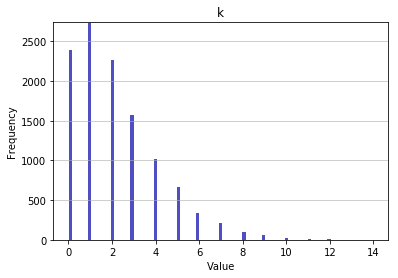

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 2.1707
Standard deviation: 1.9834
Median: 2.0
Maximal value: 14.0


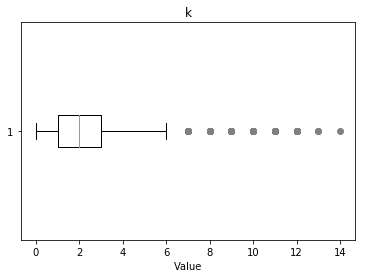

-------------------- 
Outlier detection:
 --------------------
List of outliers: {9.0, 10.0, 11.0, 12.0, 13.0, 14.0}


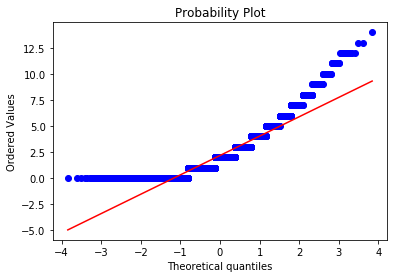

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.243
Kurtosis: 1.9423


   Middle 
Overview of variable:  k 


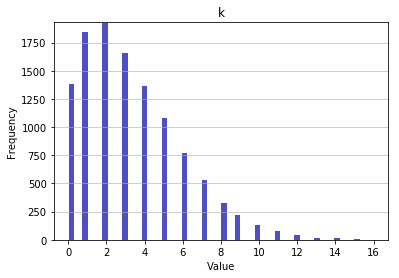

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 3.2996
Standard deviation: 2.5956
Median: 3.0
Maximal value: 16.0


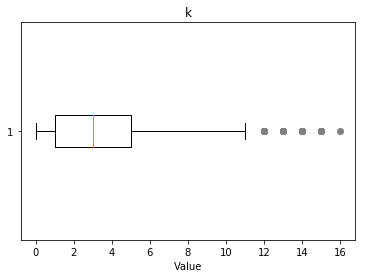

-------------------- 
Outlier detection:
 --------------------
List of outliers: {12.0, 13.0, 14.0, 15.0, 16.0}


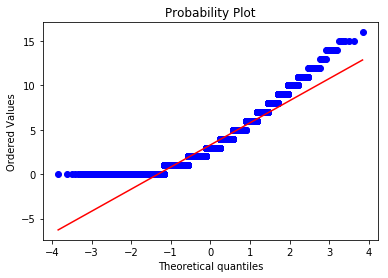

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.9463
Kurtosis: 0.8064


   Jungle 
Overview of variable:  k 


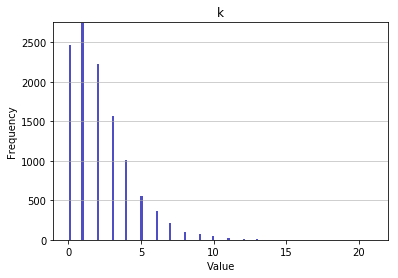

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 2.1741
Standard deviation: 2.0653
Median: 2.0
Maximal value: 21.0


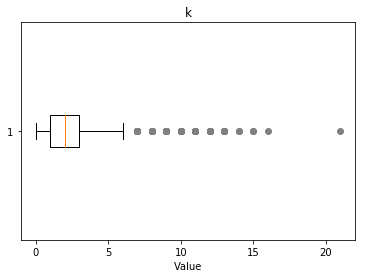

-------------------- 
Outlier detection:
 --------------------
List of outliers: {9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 21.0}


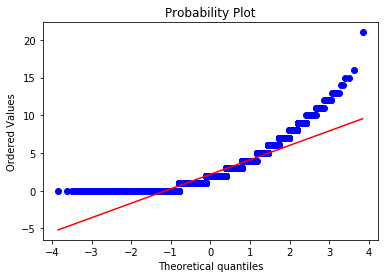

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.461
Kurtosis: 3.2796


   ADC 
Overview of variable:  k 


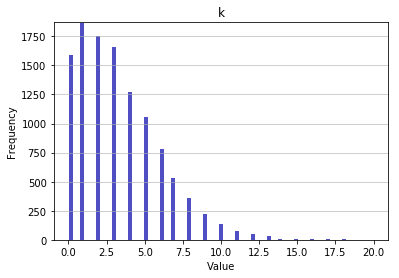

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 3.2971
Standard deviation: 2.7115
Median: 3.0
Maximal value: 20.0


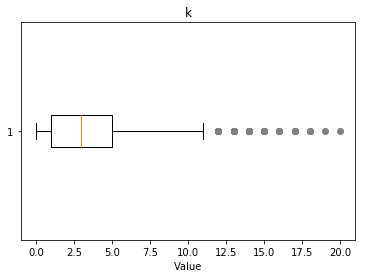

-------------------- 
Outlier detection:
 --------------------
List of outliers: {12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0}


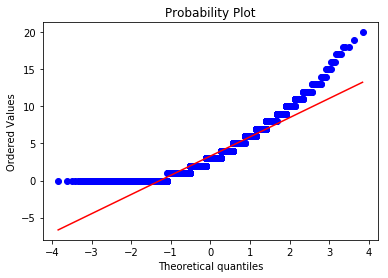

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.0467
Kurtosis: 1.3421


   Support 
Overview of variable:  k 


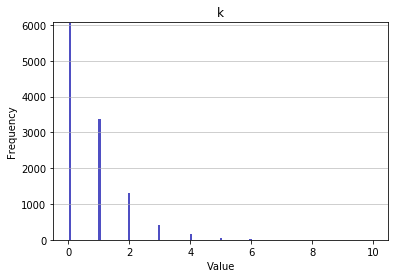

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.7313
Standard deviation: 1.0097
Median: 0.0
Maximal value: 10.0


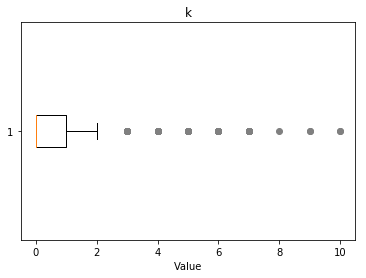

-------------------- 
Outlier detection:
 --------------------
List of outliers: {4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0}


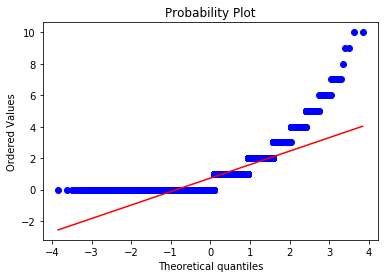

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.9639
Kurtosis: 6.0966


   Top 
Overview of variable:  d 


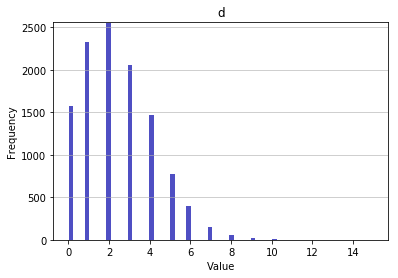

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 2.4201
Standard deviation: 1.7767
Median: 2.0
Maximal value: 15.0


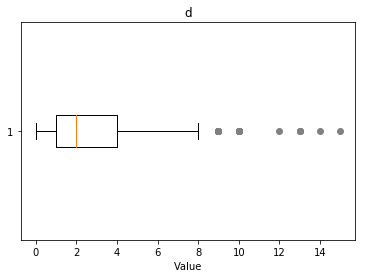

-------------------- 
Outlier detection:
 --------------------
List of outliers: {8.0, 9.0, 10.0, 12.0, 13.0, 14.0, 15.0}


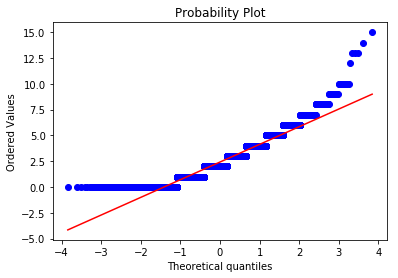

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7849
Kurtosis: 0.9549


   Middle 
Overview of variable:  d 


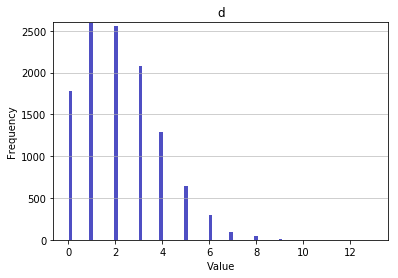

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 2.2198
Standard deviation: 1.6712
Median: 2.0
Maximal value: 13.0


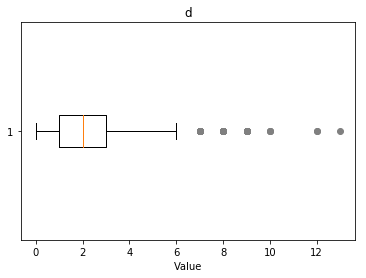

-------------------- 
Outlier detection:
 --------------------
List of outliers: {8.0, 9.0, 10.0, 12.0, 13.0}


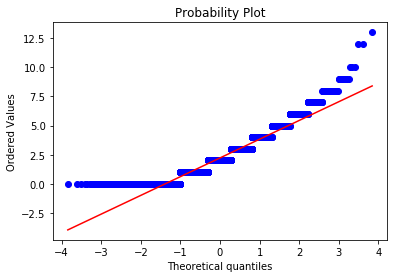

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7508
Kurtosis: 0.6051


   Jungle 
Overview of variable:  d 


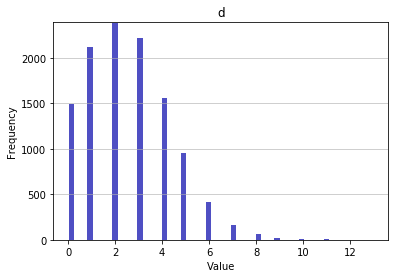

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 2.5476
Standard deviation: 1.8001
Median: 2.0
Maximal value: 13.0


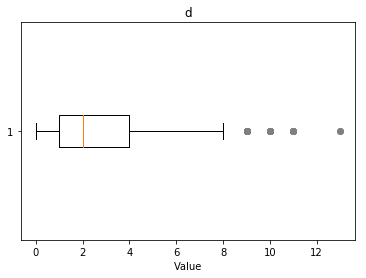

-------------------- 
Outlier detection:
 --------------------
List of outliers: {8.0, 9.0, 10.0, 11.0, 13.0}


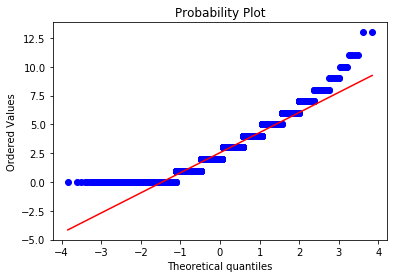

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.6325
Kurtosis: 0.3777


   ADC 
Overview of variable:  d 


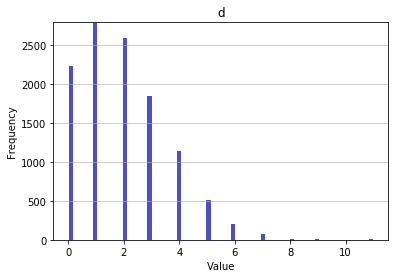

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 1.977
Standard deviation: 1.5892
Median: 2.0
Maximal value: 11.0


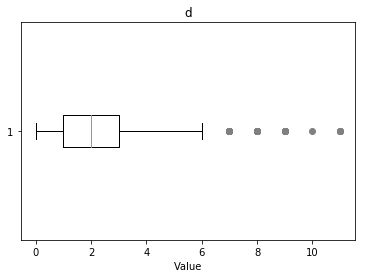

-------------------- 
Outlier detection:
 --------------------
List of outliers: {7.0, 8.0, 9.0, 10.0, 11.0}


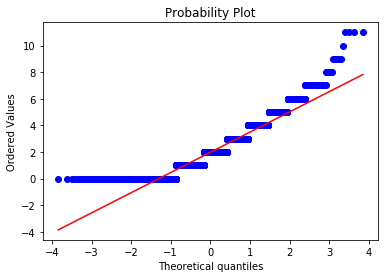

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7811
Kurtosis: 0.5424


   Support 
Overview of variable:  d 


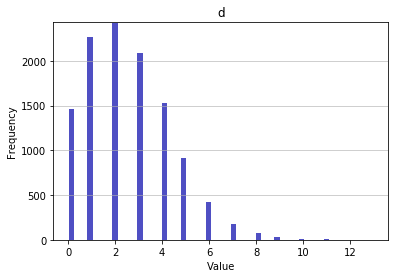

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 2.5264
Standard deviation: 1.8179
Median: 2.0
Maximal value: 13.0


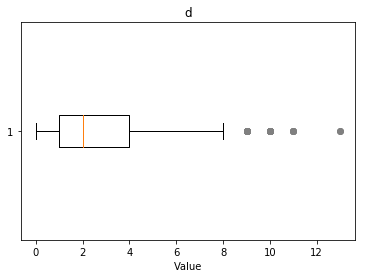

-------------------- 
Outlier detection:
 --------------------
List of outliers: {8.0, 9.0, 10.0, 11.0, 13.0}


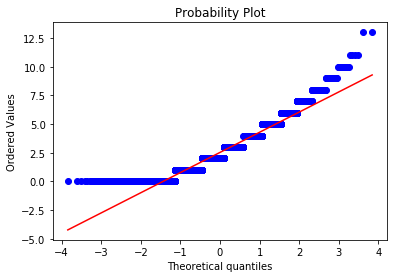

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.709
Kurtosis: 0.4987


   Top 
Overview of variable:  a 


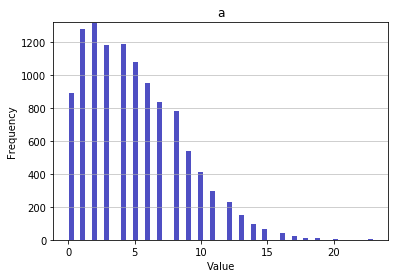

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 4.9485
Standard deviation: 3.6462
Median: 4.0
Maximal value: 23.0


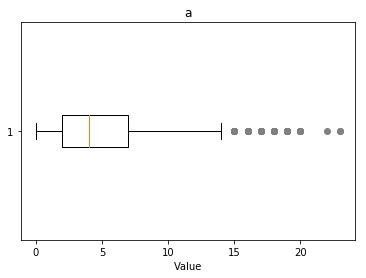

-------------------- 
Outlier detection:
 --------------------
List of outliers: {16.0, 17.0, 18.0, 19.0, 20.0, 22.0, 23.0}


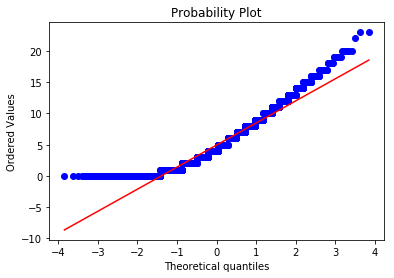

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7997
Kurtosis: 0.3913


   Middle 
Overview of variable:  a 


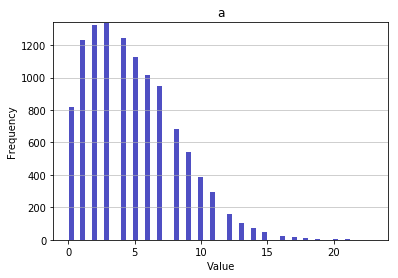

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 4.8052
Standard deviation: 3.4269
Median: 4.0
Maximal value: 23.0


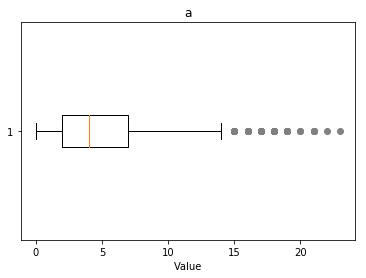

-------------------- 
Outlier detection:
 --------------------
List of outliers: {16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0}


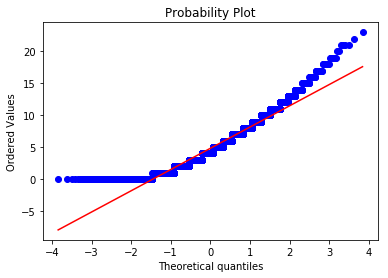

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.8076
Kurtosis: 0.6078


   Jungle 
Overview of variable:  a 


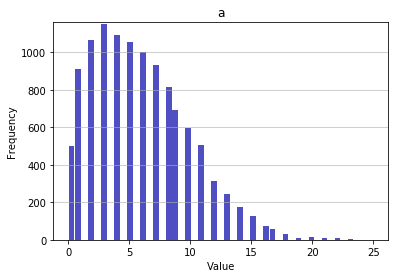

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 5.9631
Standard deviation: 3.9761
Median: 5.0
Maximal value: 25.0


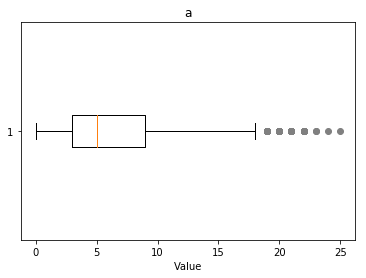

-------------------- 
Outlier detection:
 --------------------
List of outliers: {18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0}


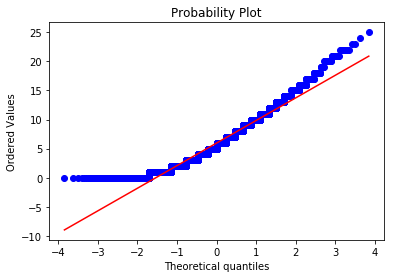

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7078
Kurtosis: 0.2631


   ADC 
Overview of variable:  a 


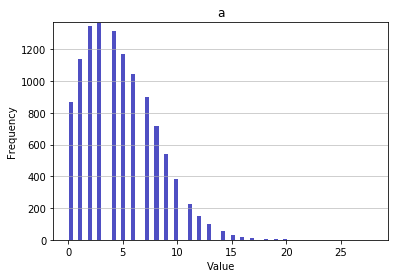

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 4.7059
Standard deviation: 3.2926
Median: 4.0
Maximal value: 28.0


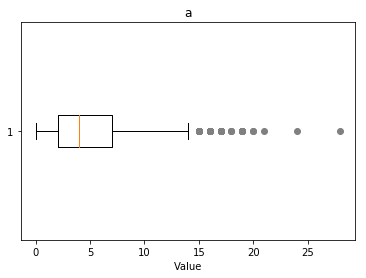

-------------------- 
Outlier detection:
 --------------------
List of outliers: {15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 24.0, 28.0}


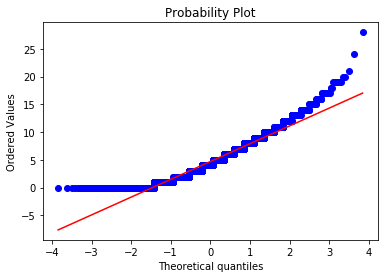

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7576
Kurtosis: 0.6131


   Support 
Overview of variable:  a 


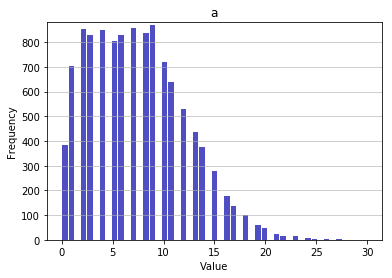

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 7.4073
Standard deviation: 4.7033
Median: 7.0
Maximal value: 30.0


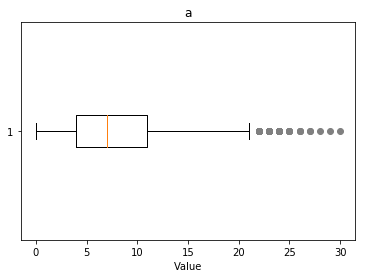

-------------------- 
Outlier detection:
 --------------------
List of outliers: {22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0}


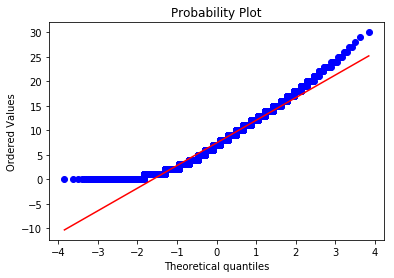

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.5589
Kurtosis: -0.0005


   Top 
Overview of variable:  doubles 


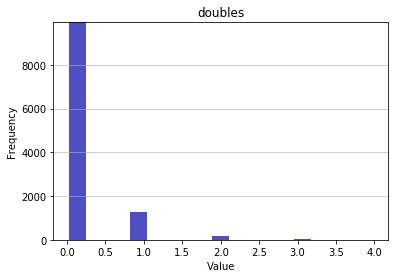

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.1494
Standard deviation: 0.4184
Median: 0.0
Maximal value: 4.0


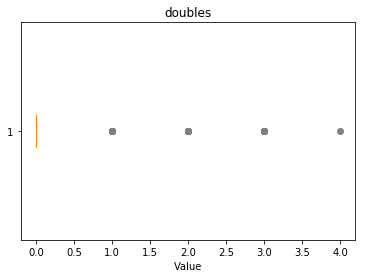

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2.0, 3.0, 4.0}


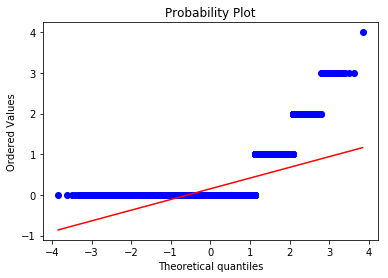

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 3.117
Kurtosis: 10.961


   Middle 
Overview of variable:  doubles 


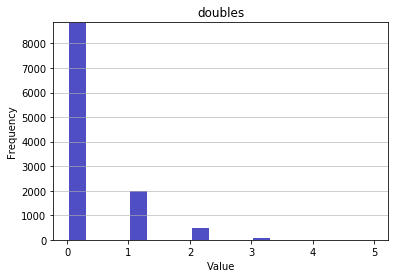

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.2815
Standard deviation: 0.5819
Median: 0.0
Maximal value: 5.0


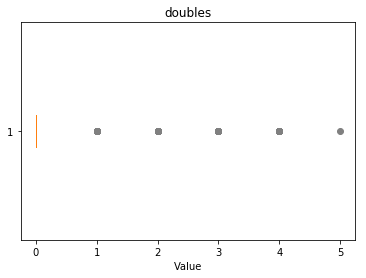

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.0, 4.0, 5.0}


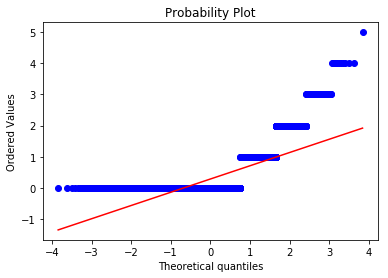

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.2876
Kurtosis: 5.7696


   Jungle 
Overview of variable:  doubles 


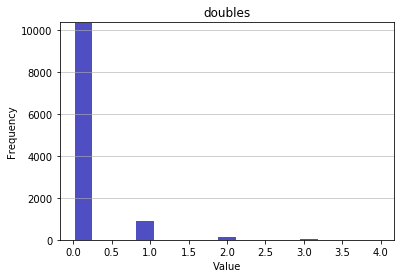

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.1065
Standard deviation: 0.3622
Median: 0.0
Maximal value: 4.0


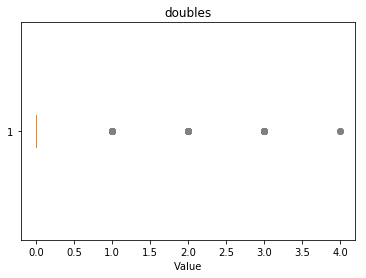

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2.0, 3.0, 4.0}


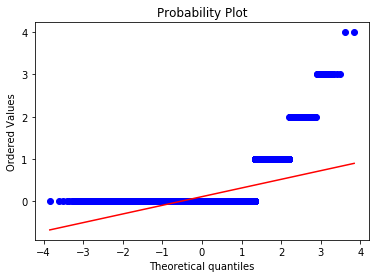

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 3.9175
Kurtosis: 18.0835


   ADC 
Overview of variable:  doubles 


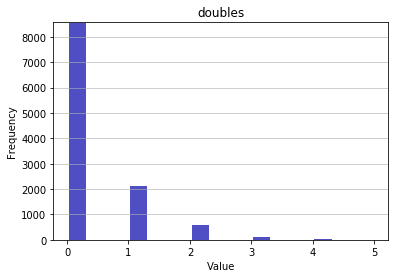

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.326
Standard deviation: 0.6383
Median: 0.0
Maximal value: 5.0


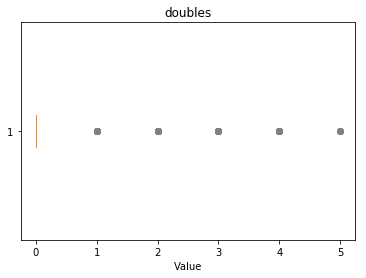

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.0, 4.0, 5.0}


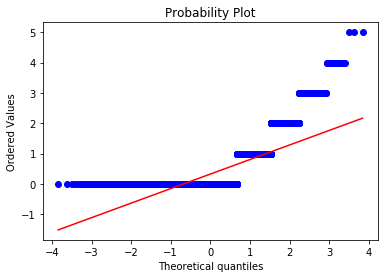

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.1949
Kurtosis: 5.3062


   Support 
Overview of variable:  doubles 


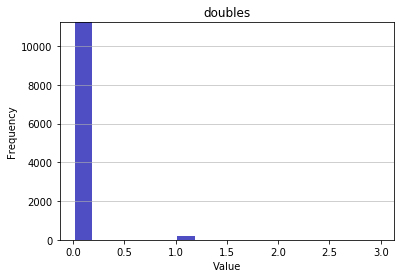

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0163
Standard deviation: 0.1321
Median: 0.0
Maximal value: 3.0


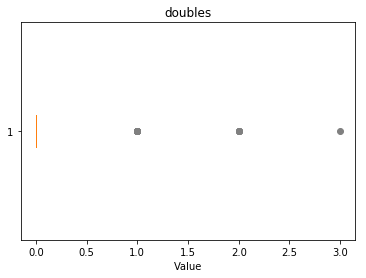

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0, 3.0}


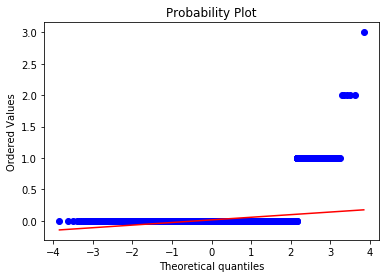

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 8.7566
Kurtosis: 88.7316


   Top 
Overview of variable:  triples 


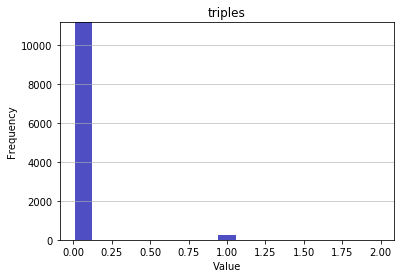

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0212
Standard deviation: 0.1472
Median: 0.0
Maximal value: 2.0


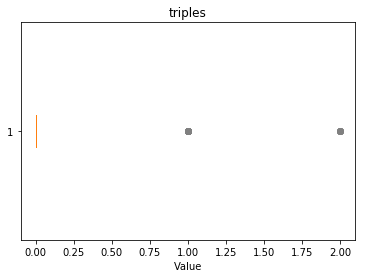

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


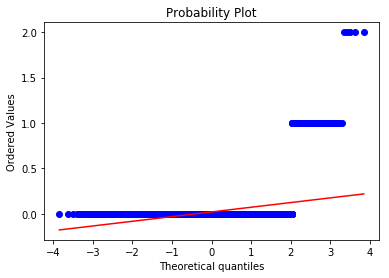

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 7.0504
Kurtosis: 51.1504


   Middle 
Overview of variable:  triples 


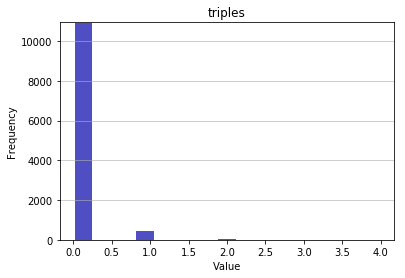

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0432
Standard deviation: 0.2166
Median: 0.0
Maximal value: 4.0


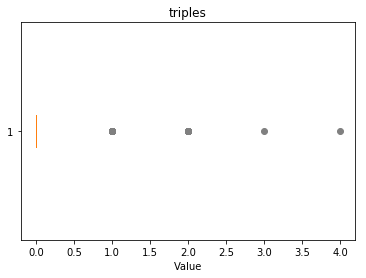

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0, 3.0, 4.0}


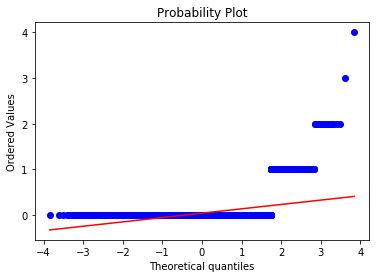

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 5.5578
Kurtosis: 37.9186


   Jungle 
Overview of variable:  triples 


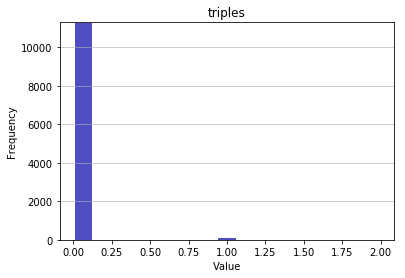

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0104
Standard deviation: 0.103
Median: 0.0
Maximal value: 2.0


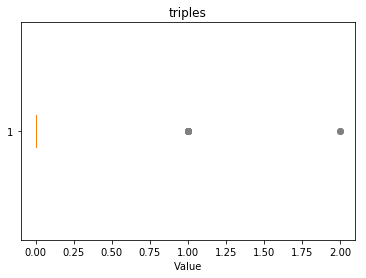

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


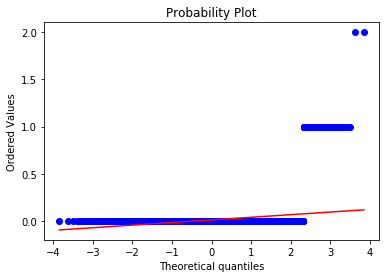

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 10.1526
Kurtosis: 106.9133


   ADC 
Overview of variable:  triples 


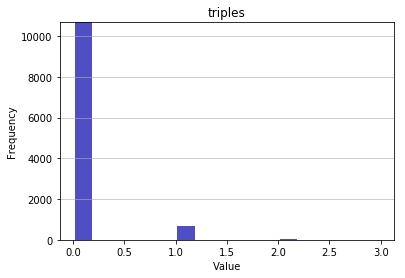

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0665
Standard deviation: 0.2636
Median: 0.0
Maximal value: 3.0


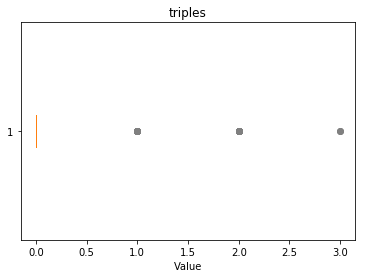

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0, 3.0}


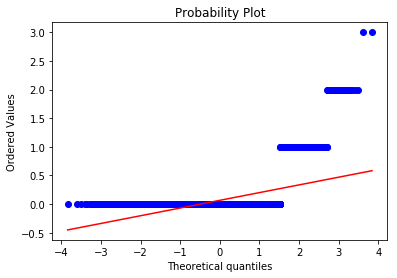

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 4.1255
Kurtosis: 18.2382


   Support 
Overview of variable:  triples 


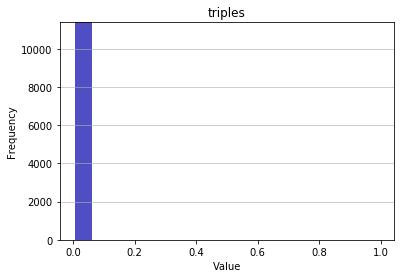

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0009
Standard deviation: 0.0296
Median: 0.0
Maximal value: 1.0


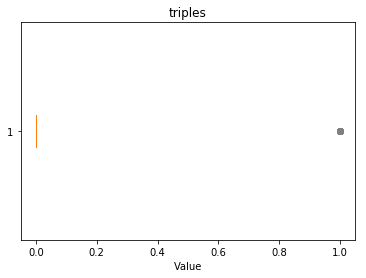

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


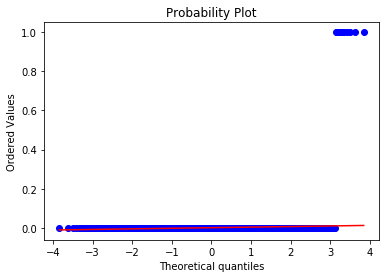

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 33.7135
Kurtosis: 1134.6009


   Top 
Overview of variable:  quadras 


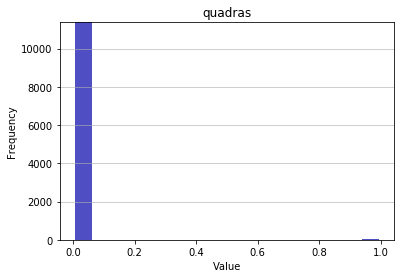

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0025
Standard deviation: 0.0495
Median: 0.0
Maximal value: 1.0


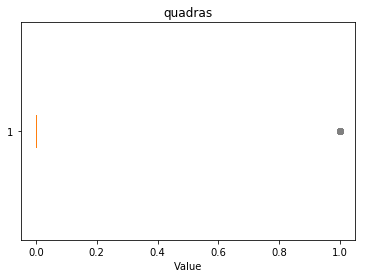

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


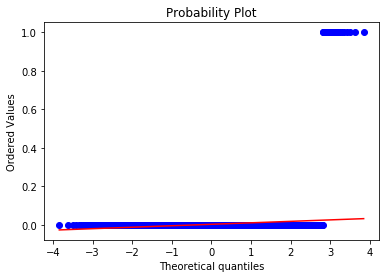

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 20.0998
Kurtosis: 402.0025


   Middle 
Overview of variable:  quadras 


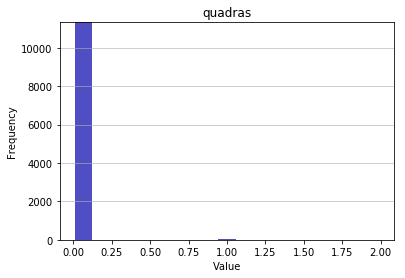

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0062
Standard deviation: 0.0809
Median: 0.0
Maximal value: 2.0


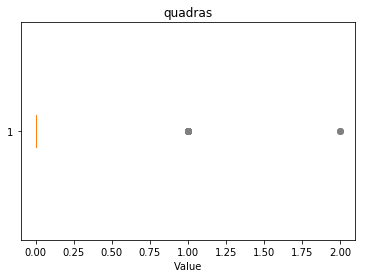

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


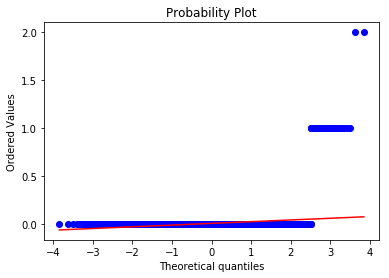

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 13.5316
Kurtosis: 195.7519


   Jungle 
Overview of variable:  quadras 


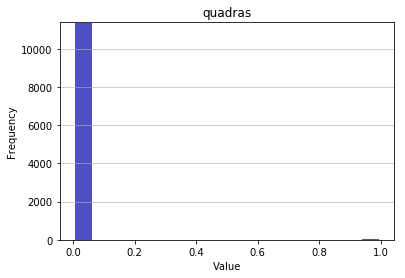

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0014
Standard deviation: 0.0374
Median: 0.0
Maximal value: 1.0


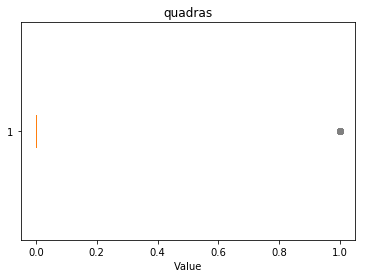

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


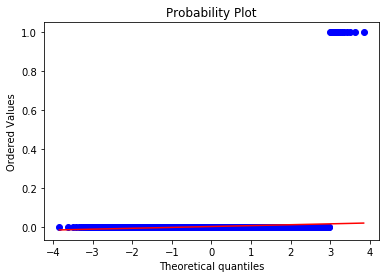

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 26.6318
Kurtosis: 707.2514


   ADC 
Overview of variable:  quadras 


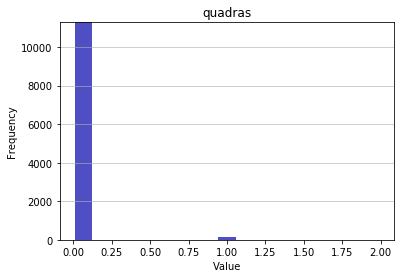

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0107
Standard deviation: 0.1038
Median: 0.0
Maximal value: 2.0


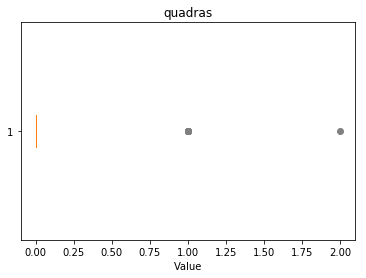

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


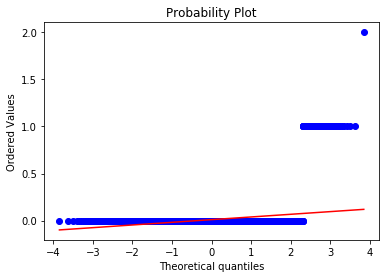

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 9.7437
Kurtosis: 95.8693


   Support 
Overview of variable:  quadras 


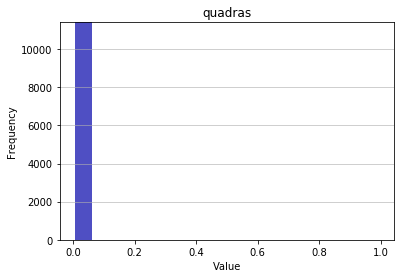

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0001
Standard deviation: 0.0094
Median: 0.0
Maximal value: 1.0


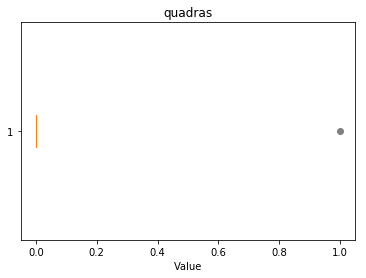

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


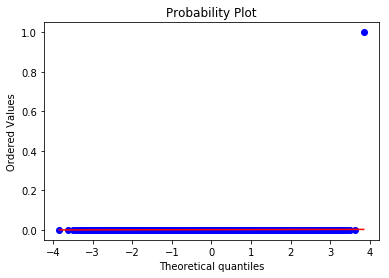

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 106.738
Kurtosis: 11391.0001


   Top 
Overview of variable:  pentas 


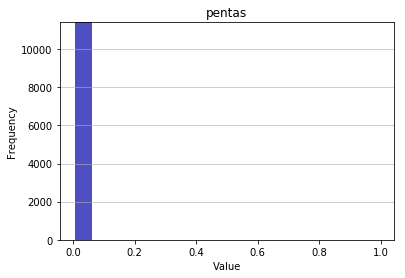

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0003
Standard deviation: 0.0162
Median: 0.0
Maximal value: 1.0


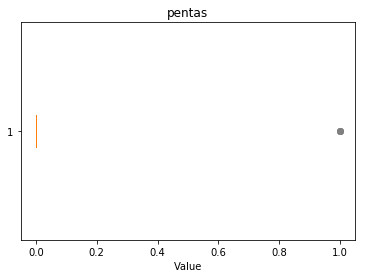

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


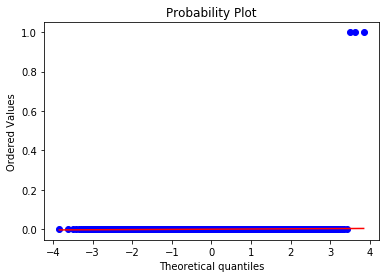

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 61.609
Kurtosis: 3793.6669


   Middle 
Overview of variable:  pentas 


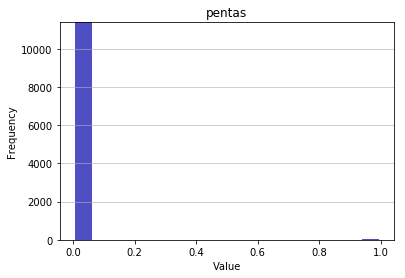

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0017
Standard deviation: 0.0408
Median: 0.0
Maximal value: 1.0


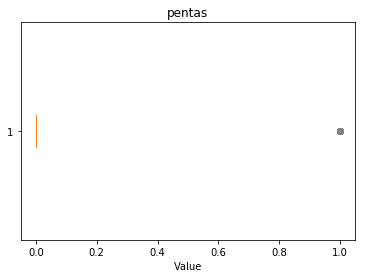

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


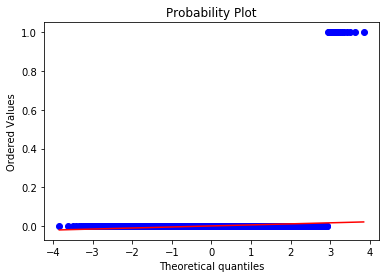

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 24.4293
Kurtosis: 594.7911


   Jungle 
Overview of variable:  pentas 


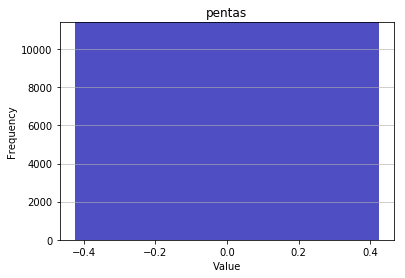

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0
Standard deviation: 0.0
Median: 0.0
Maximal value: 0.0


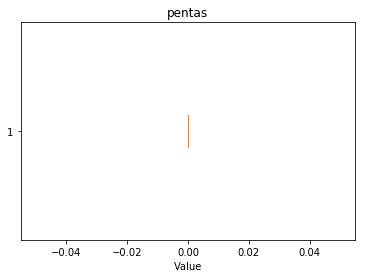

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


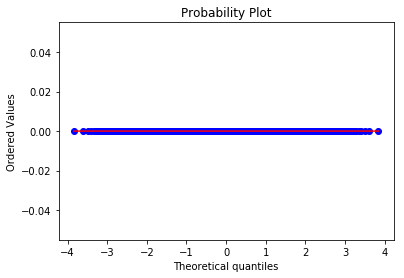

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: -3.0


   ADC 
Overview of variable:  pentas 


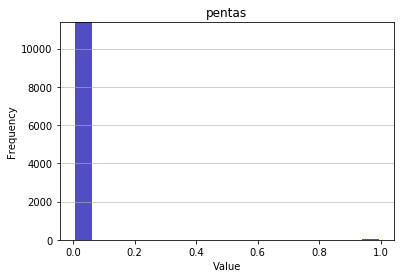

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0027
Standard deviation: 0.0521
Median: 0.0
Maximal value: 1.0


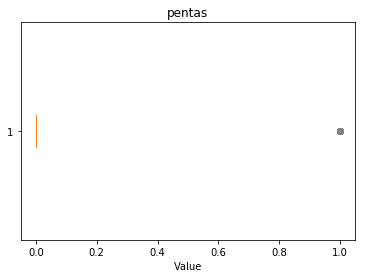

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


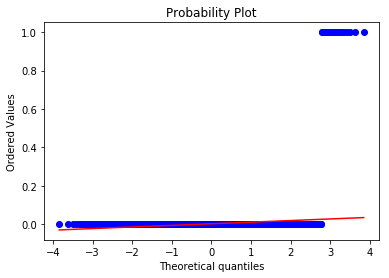

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 19.0949
Kurtosis: 362.6156


   Support 
Overview of variable:  pentas 


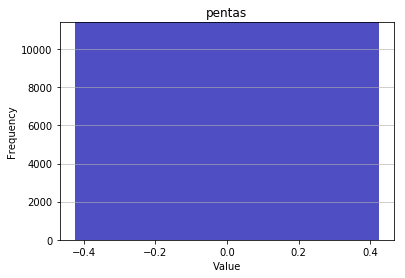

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0
Standard deviation: 0.0
Median: 0.0
Maximal value: 0.0


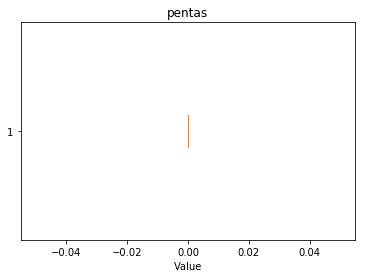

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


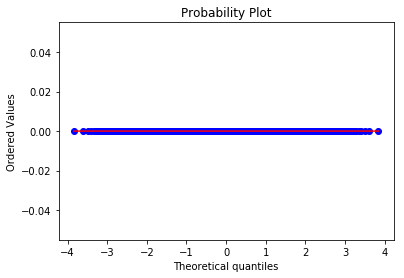

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: -3.0


   Top 
Overview of variable:  kpm 


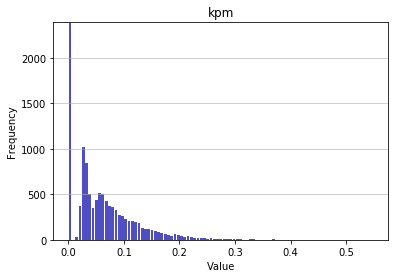

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0625
Standard deviation: 0.0588
Median: 0.0501
Maximal value: 0.5489092188599578


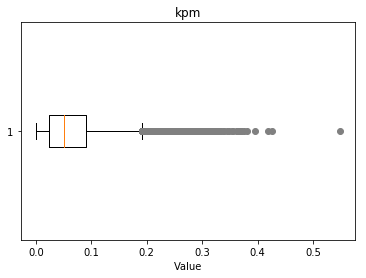

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.33, 0.25, 0.26, 0.28, 0.31, 0.29, 0.36, 0.32, 0.24, 0.35, 0.38, 0.42, 0.3, 0.34, 0.27, 0.55, 0.43, 0.37, 0.39}


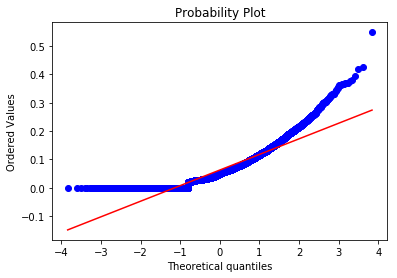

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.4328
Kurtosis: 2.9924


   Middle 
Overview of variable:  kpm 


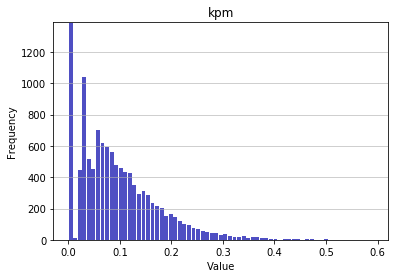

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0943
Standard deviation: 0.0768
Median: 0.0786
Maximal value: 0.5919661733615222


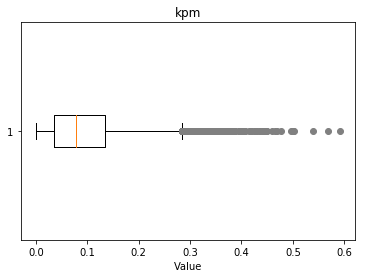

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.37, 0.48, 0.44, 0.34, 0.4, 0.35, 0.42, 0.36, 0.33, 0.38, 0.46, 0.59, 0.5, 0.57, 0.47, 0.43, 0.45, 0.41, 0.54, 0.39}


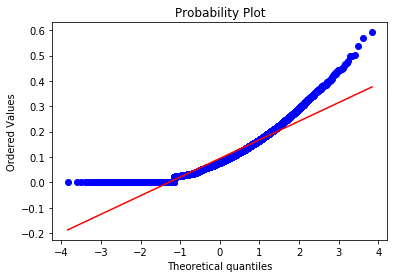

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.2073
Kurtosis: 1.9711


   Jungle 
Overview of variable:  kpm 


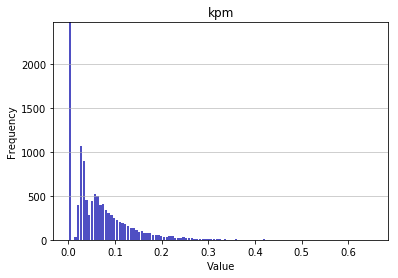

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0632
Standard deviation: 0.0628
Median: 0.0491
Maximal value: 0.653505786249149


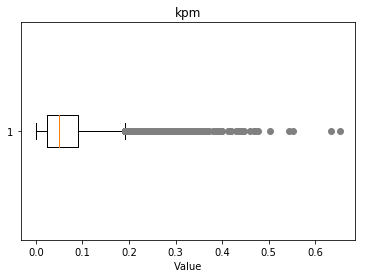

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.31, 0.26, 0.3, 0.44, 0.27, 0.29, 0.25, 0.28, 0.36, 0.39, 0.42, 0.5, 0.34, 0.43, 0.35, 0.45, 0.37, 0.54, 0.46, 0.38, 0.63, 0.47, 0.55, 0.48, 0.4, 0.65, 0.32, 0.41, 0.33}


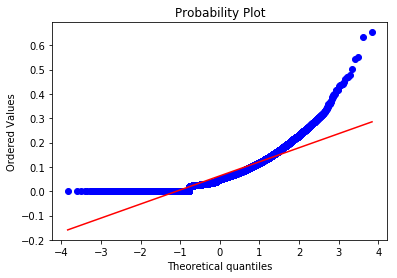

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.7983
Kurtosis: 5.6628


   ADC 
Overview of variable:  kpm 


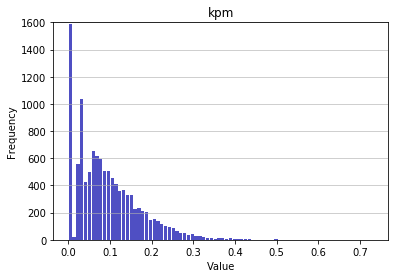

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0935
Standard deviation: 0.0781
Median: 0.0778
Maximal value: 0.7322033898305085


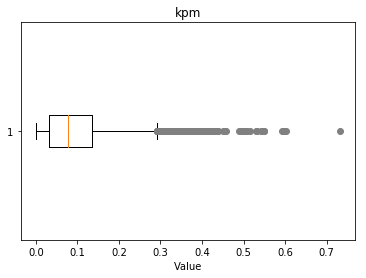

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.33, 0.37, 0.35, 0.41, 0.46, 0.4, 0.5, 0.43, 0.39, 0.44, 0.42, 0.59, 0.34, 0.51, 0.6, 0.52, 0.36, 0.53, 0.45, 0.54, 0.38, 0.55, 0.73, 0.49}


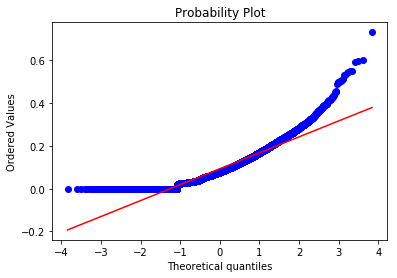

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.2457
Kurtosis: 2.5841


   Support 
Overview of variable:  kpm 


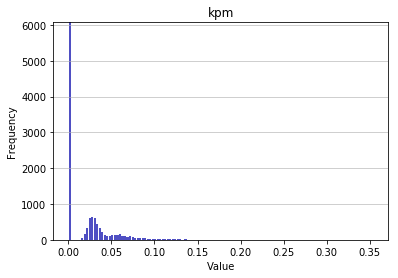

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0211
Standard deviation: 0.0299
Median: 0.0
Maximal value: 0.3537735849056604


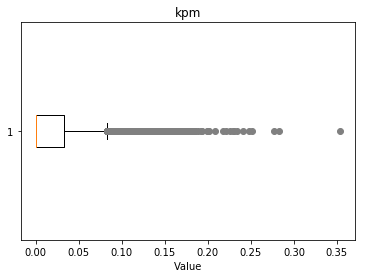

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.11, 0.14, 0.12, 0.13, 0.15, 0.16, 0.17, 0.18, 0.2, 0.23, 0.25, 0.19, 0.21, 0.28, 0.24, 0.22, 0.35}


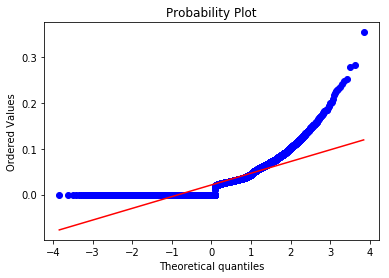

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.1425
Kurtosis: 7.7385


   Top 
Overview of variable:  elementals 


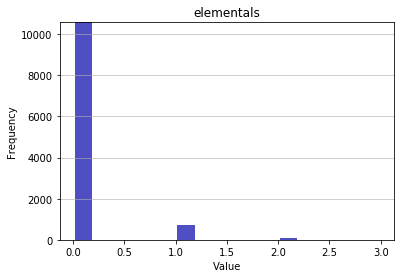

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0807
Standard deviation: 0.3061
Median: 0.0
Maximal value: 3.0


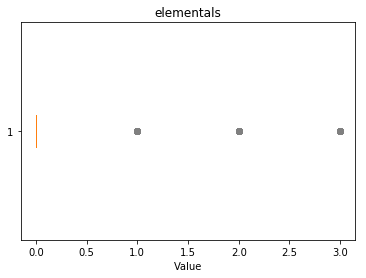

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0, 3.0}


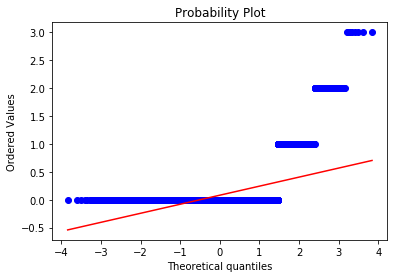

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 4.19
Kurtosis: 19.7667


   Middle 
Overview of variable:  elementals 


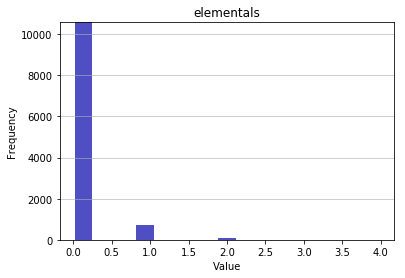

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0793
Standard deviation: 0.2995
Median: 0.0
Maximal value: 4.0


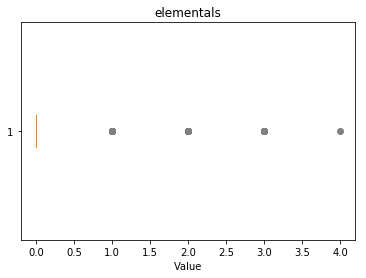

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0, 3.0, 4.0}


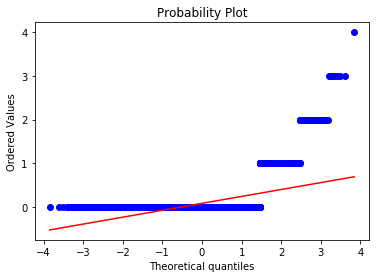

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 4.2165
Kurtosis: 21.0477


   Jungle 
Overview of variable:  elementals 


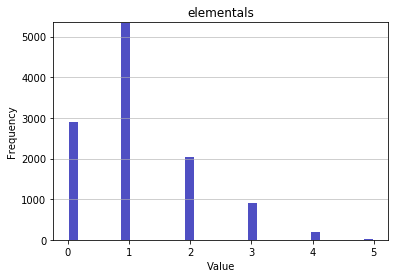

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 1.1399
Standard deviation: 0.9504
Median: 1.0
Maximal value: 5.0


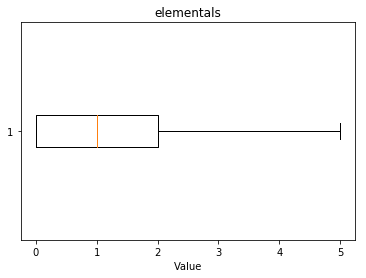

-------------------- 
Outlier detection:
 --------------------
List of outliers: {4.0, 5.0}


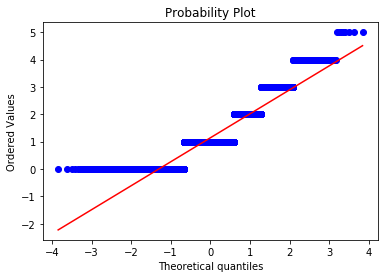

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.818
Kurtosis: 0.4505


   ADC 
Overview of variable:  elementals 


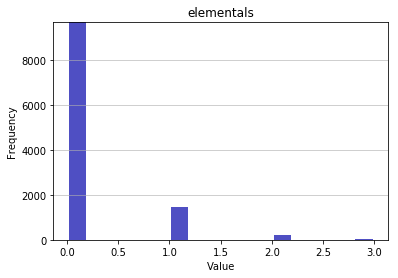

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.1722
Standard deviation: 0.4382
Median: 0.0
Maximal value: 3.0


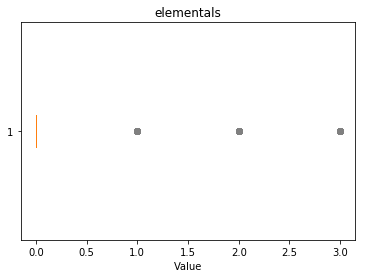

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2.0, 3.0}


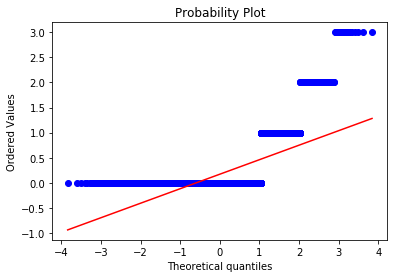

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.7028
Kurtosis: 7.6672


   Support 
Overview of variable:  elementals 


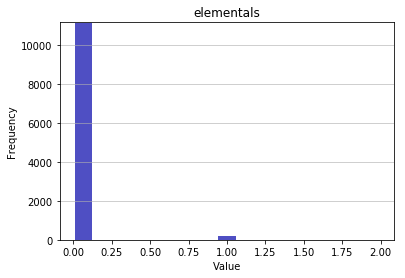

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0196
Standard deviation: 0.1429
Median: 0.0
Maximal value: 2.0


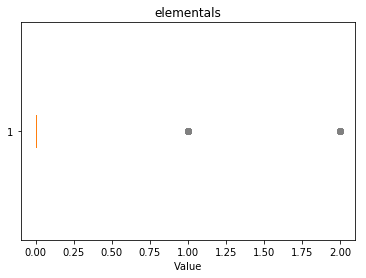

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


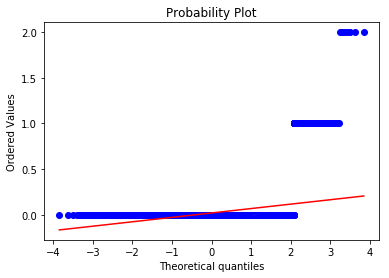

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 7.5593
Kurtosis: 60.339


   Top 
Overview of variable:  firedrakes 


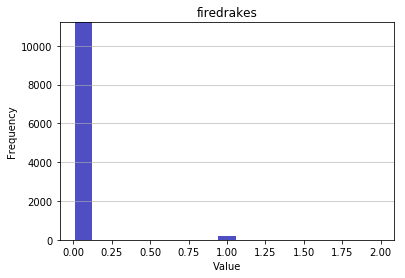

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0171
Standard deviation: 0.1317
Median: 0.0
Maximal value: 2.0


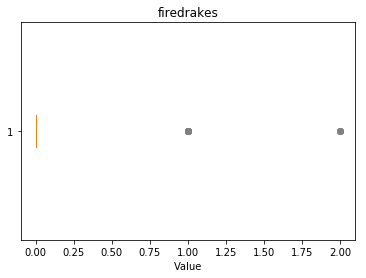

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


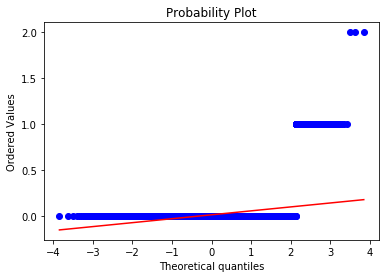

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 7.7902
Kurtosis: 61.977


   Middle 
Overview of variable:  firedrakes 


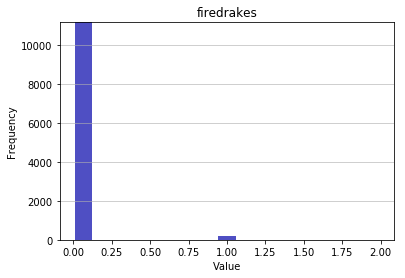

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0198
Standard deviation: 0.1425
Median: 0.0
Maximal value: 2.0


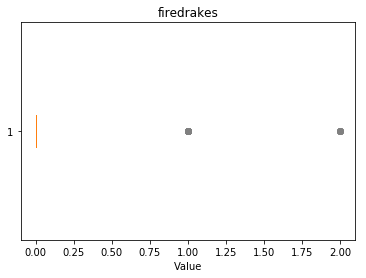

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


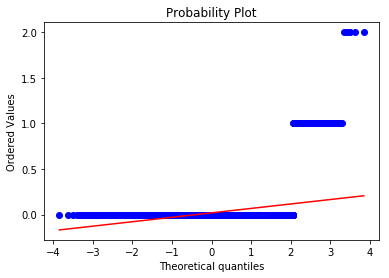

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 7.3377
Kurtosis: 55.7321


   Jungle 
Overview of variable:  firedrakes 


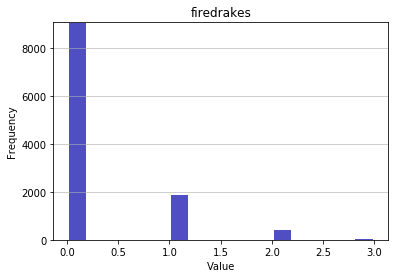

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.2514
Standard deviation: 0.5392
Median: 0.0
Maximal value: 3.0


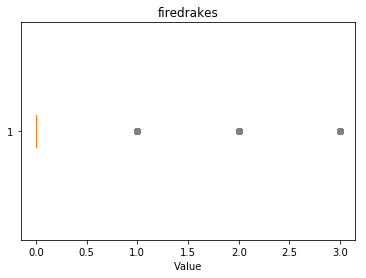

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2.0, 3.0}


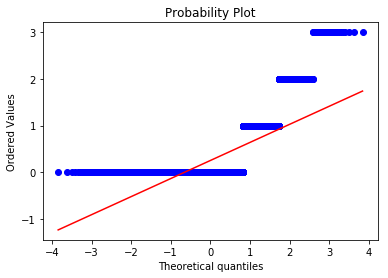

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.247
Kurtosis: 4.9412


   ADC 
Overview of variable:  firedrakes 


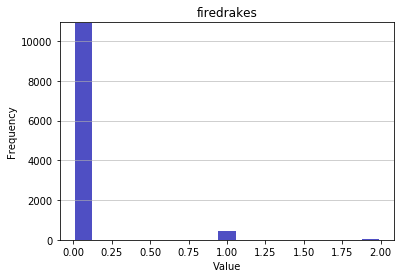

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0419
Standard deviation: 0.2101
Median: 0.0
Maximal value: 2.0


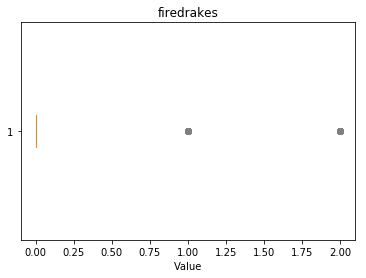

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


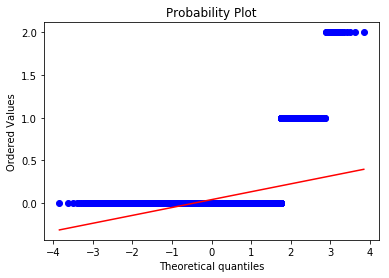

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 5.2135
Kurtosis: 28.5892


   Support 
Overview of variable:  firedrakes 


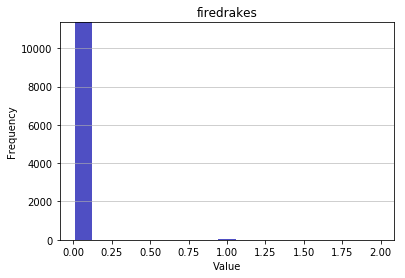

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0047
Standard deviation: 0.0712
Median: 0.0
Maximal value: 2.0


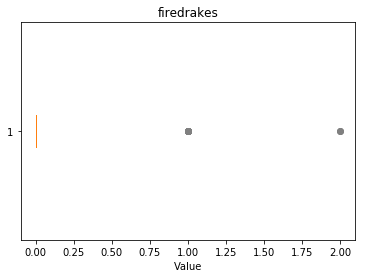

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


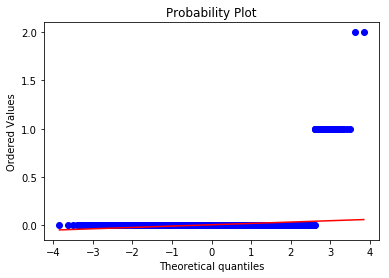

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 15.8568
Kurtosis: 273.0045


   Top 
Overview of variable:  waterdrakes 


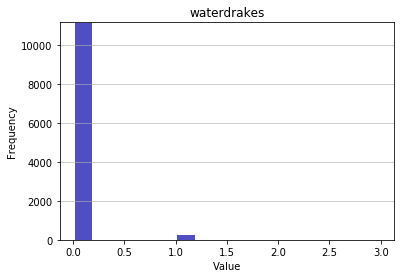

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0231
Standard deviation: 0.1553
Median: 0.0
Maximal value: 3.0


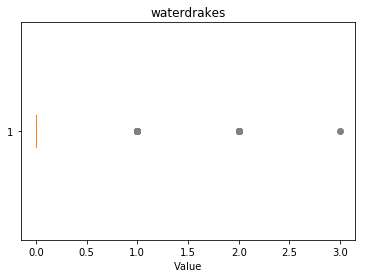

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0, 3.0}


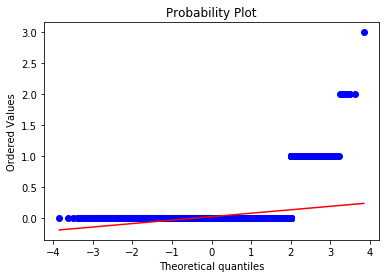

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 7.1149
Kurtosis: 56.7145


   Middle 
Overview of variable:  waterdrakes 


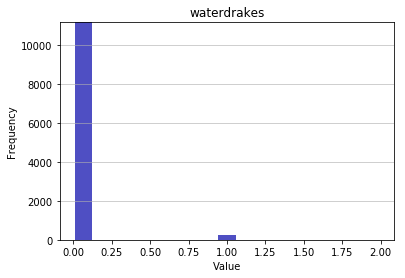

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0207
Standard deviation: 0.1467
Median: 0.0
Maximal value: 2.0


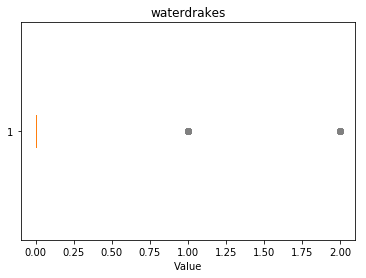

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


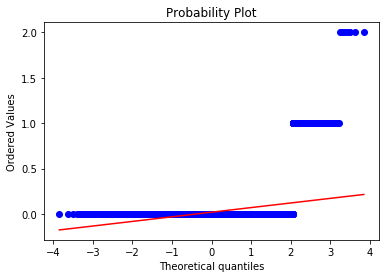

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 7.307
Kurtosis: 56.1058


   Jungle 
Overview of variable:  waterdrakes 


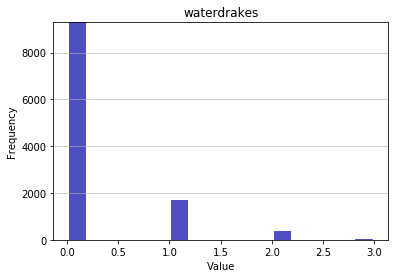

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.226
Standard deviation: 0.5136
Median: 0.0
Maximal value: 3.0


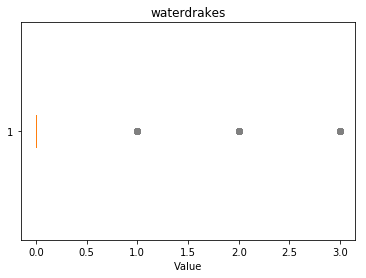

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2.0, 3.0}


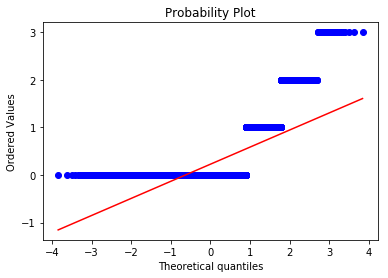

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.3815
Kurtosis: 5.5636


   ADC 
Overview of variable:  waterdrakes 


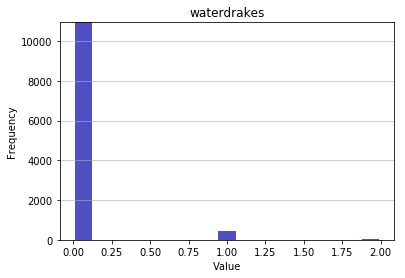

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.042
Standard deviation: 0.2088
Median: 0.0
Maximal value: 2.0


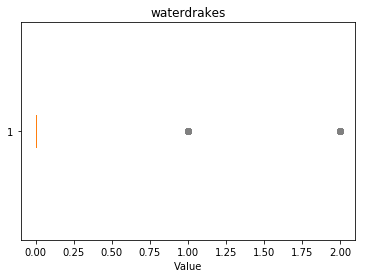

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


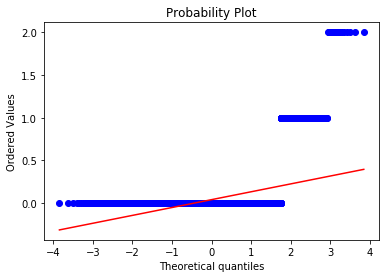

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 5.1037
Kurtosis: 27.0356


   Support 
Overview of variable:  waterdrakes 


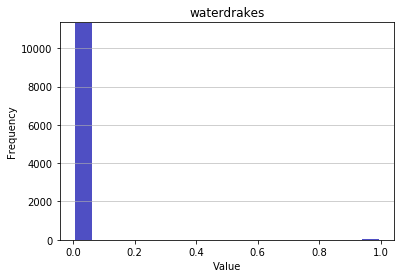

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0047
Standard deviation: 0.0687
Median: 0.0
Maximal value: 1.0


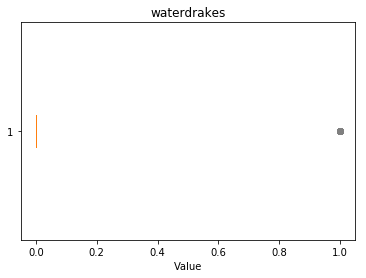

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


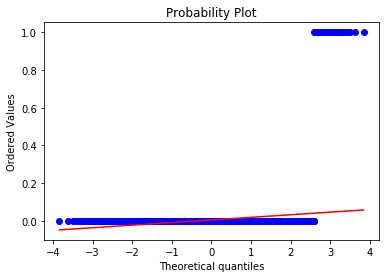

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 14.4237
Kurtosis: 206.0418


   Top 
Overview of variable:  earthdrakes 


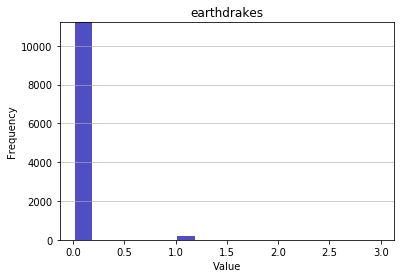

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0177
Standard deviation: 0.1384
Median: 0.0
Maximal value: 3.0


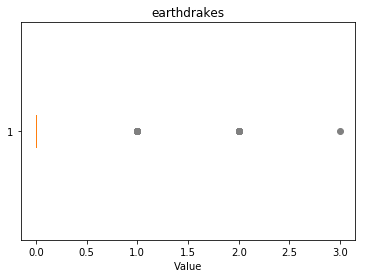

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0, 3.0}


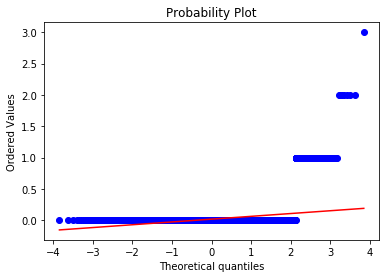

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 8.4767
Kurtosis: 82.8547


   Middle 
Overview of variable:  earthdrakes 


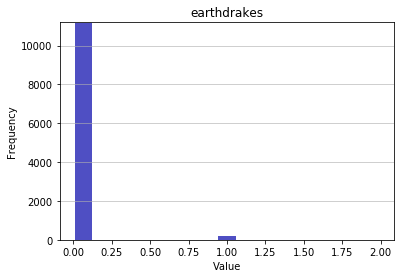

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0187
Standard deviation: 0.1399
Median: 0.0
Maximal value: 2.0


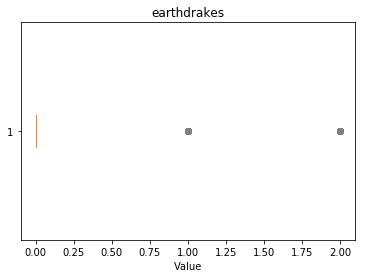

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


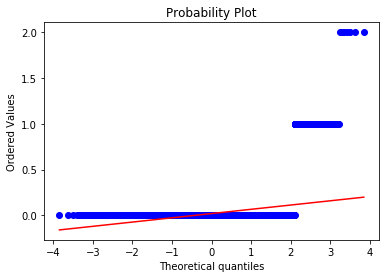

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 7.7702
Kurtosis: 63.9973


   Jungle 
Overview of variable:  earthdrakes 


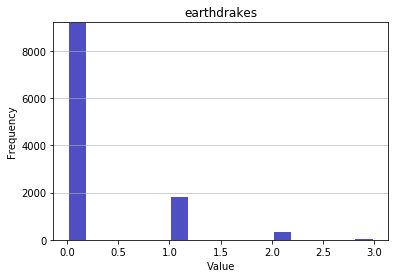

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.2291
Standard deviation: 0.507
Median: 0.0
Maximal value: 3.0


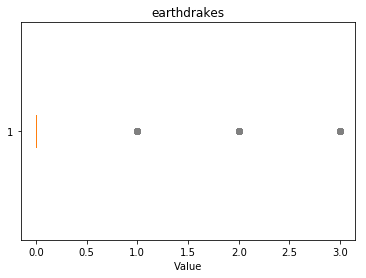

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2.0, 3.0}


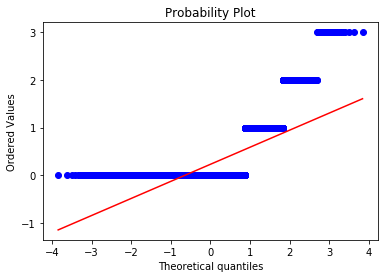

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.3228
Kurtosis: 5.4342


   ADC 
Overview of variable:  earthdrakes 


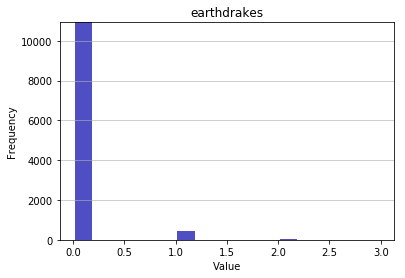

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0441
Standard deviation: 0.2177
Median: 0.0
Maximal value: 3.0


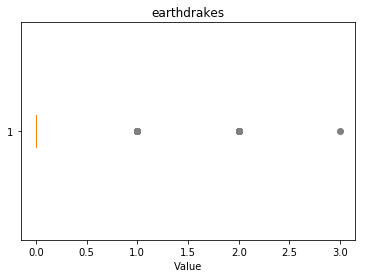

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0, 3.0}


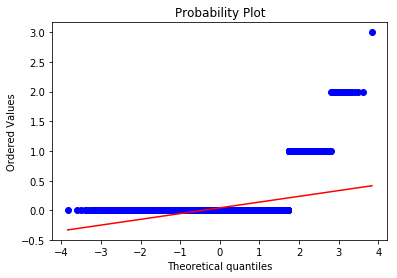

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 5.2393
Kurtosis: 29.9664


   Support 
Overview of variable:  earthdrakes 


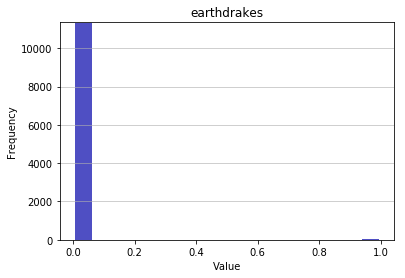

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0049
Standard deviation: 0.0699
Median: 0.0
Maximal value: 1.0


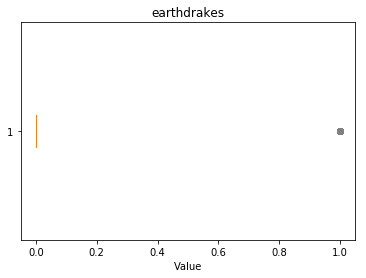

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


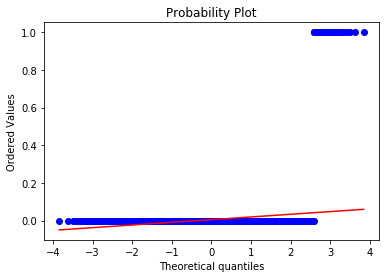

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 14.16
Kurtosis: 198.5049


   Top 
Overview of variable:  airdrakes 


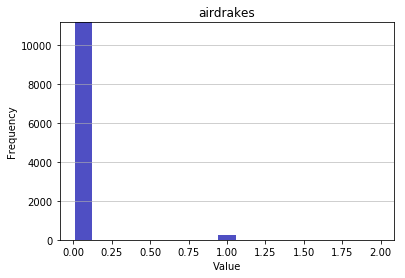

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0228
Standard deviation: 0.1545
Median: 0.0
Maximal value: 2.0


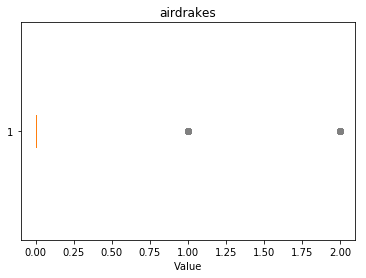

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


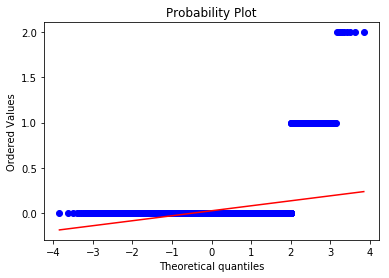

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 7.0233
Kurtosis: 52.1476


   Middle 
Overview of variable:  airdrakes 


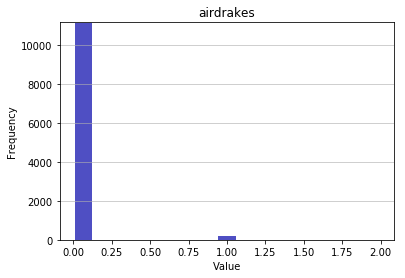

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0201
Standard deviation: 0.1428
Median: 0.0
Maximal value: 2.0


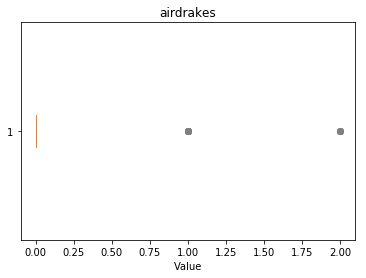

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


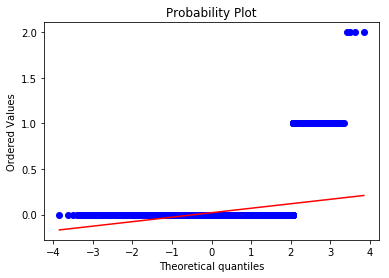

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 7.1984
Kurtosis: 52.9646


   Jungle 
Overview of variable:  airdrakes 


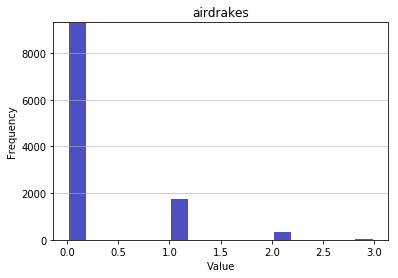

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.2169
Standard deviation: 0.49
Median: 0.0
Maximal value: 3.0


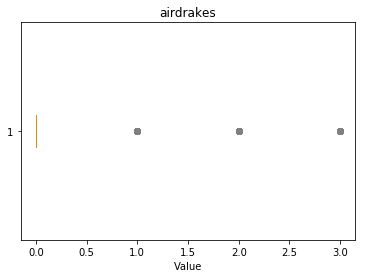

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2.0, 3.0}


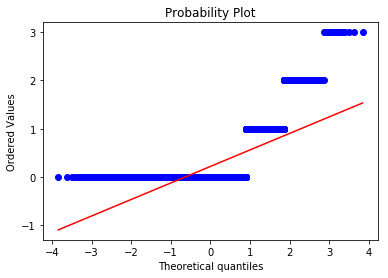

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.3227
Kurtosis: 5.2237


   ADC 
Overview of variable:  airdrakes 


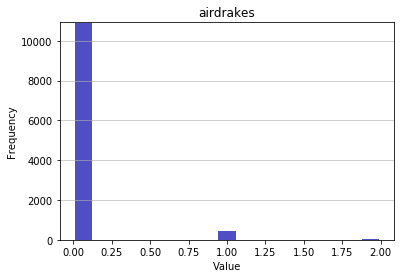

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0442
Standard deviation: 0.214
Median: 0.0
Maximal value: 2.0


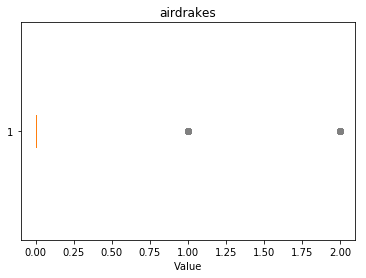

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


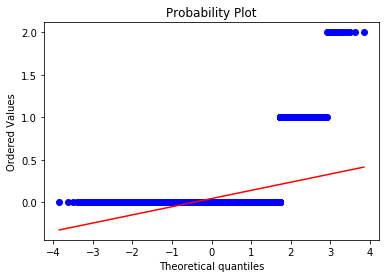

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 4.9611
Kurtosis: 25.4654


   Support 
Overview of variable:  airdrakes 


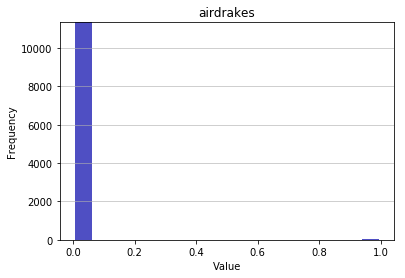

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0052
Standard deviation: 0.0718
Median: 0.0
Maximal value: 1.0


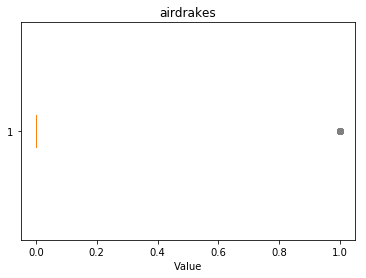

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


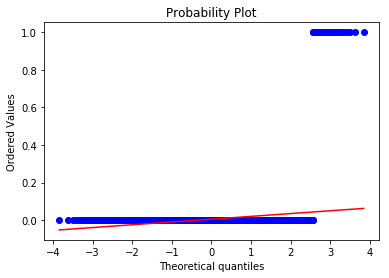

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 13.7898
Kurtosis: 188.1577


   Top 
Overview of variable:  elders 


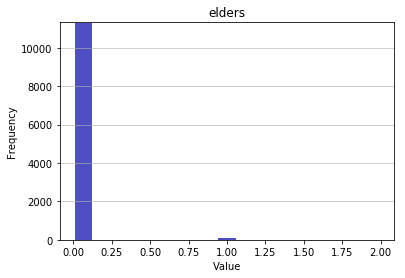

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0075
Standard deviation: 0.0876
Median: 0.0
Maximal value: 2.0


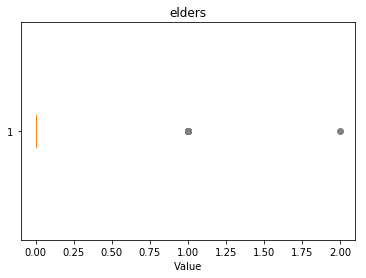

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


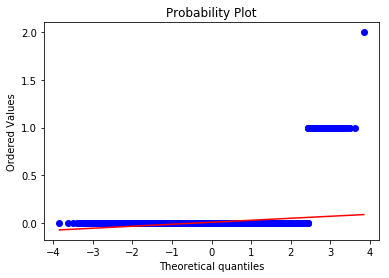

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 11.7707
Kurtosis: 142.251


   Middle 
Overview of variable:  elders 


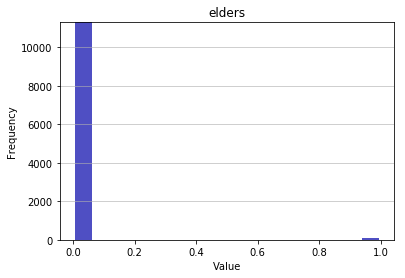

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0089
Standard deviation: 0.0937
Median: 0.0
Maximal value: 1.0


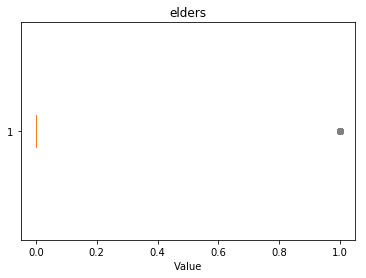

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


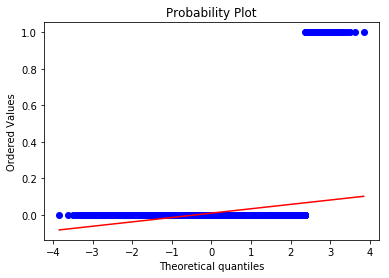

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 10.4805
Kurtosis: 107.8406


   Jungle 
Overview of variable:  elders 


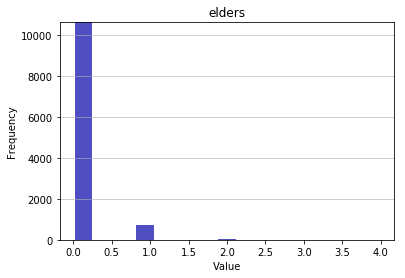

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0762
Standard deviation: 0.2896
Median: 0.0
Maximal value: 4.0


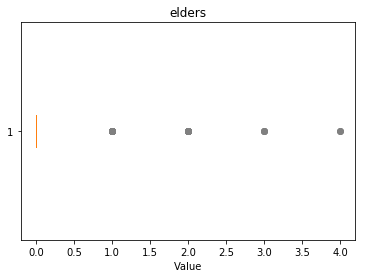

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0, 3.0, 4.0}


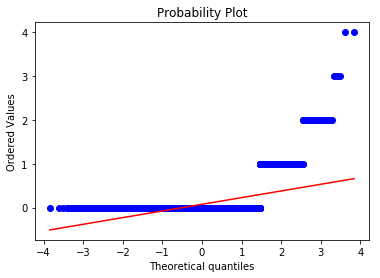

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 4.2354
Kurtosis: 21.933


   ADC 
Overview of variable:  elders 


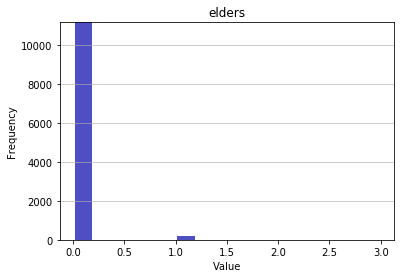

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0187
Standard deviation: 0.1393
Median: 0.0
Maximal value: 3.0


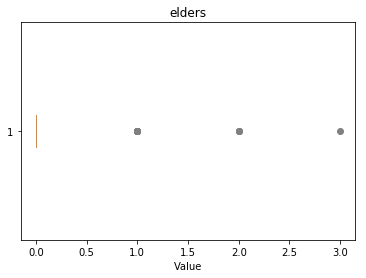

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0, 3.0}


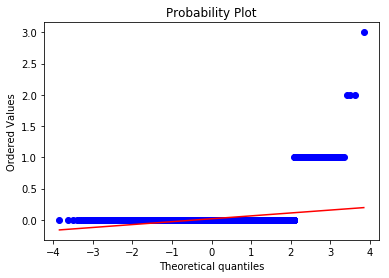

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 7.8796
Kurtosis: 70.3466


   Support 
Overview of variable:  elders 


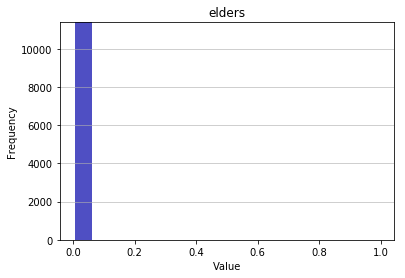

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0011
Standard deviation: 0.0324
Median: 0.0
Maximal value: 1.0


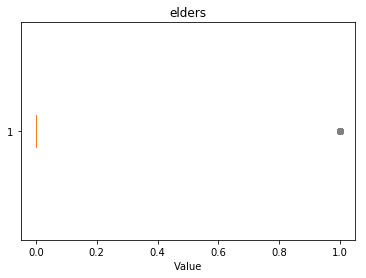

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


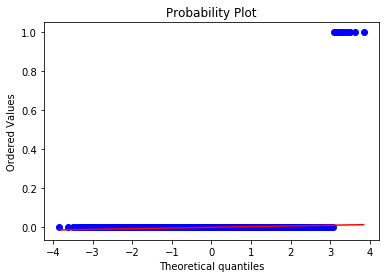

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 30.768
Kurtosis: 944.6677


   Top 
Overview of variable:  dmgtochamps 


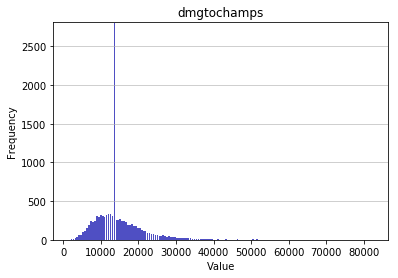

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1390.0
Mean: 14638.0156
Standard deviation: 6297.0396
Median: 13591.5
Maximal value: 82500.0


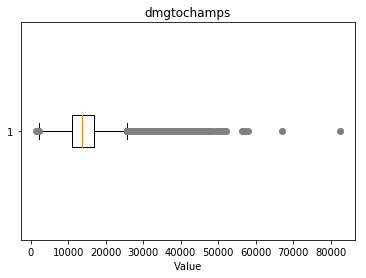

-------------------- 
Outlier detection:
 --------------------
List of outliers: {36356.0, 36357.0, 48133.0, 35849.0, 34834.0, 42003.0, 36374.0, 43035.0, 36380.0, 43039.0, 34336.0, 33830.0, 33836.0, 47662.0, 35377.0, 34358.0, 37434.0, 35902.0, 35392.0, 41027.0, 37956.0, 82500.0, 48195.0, 38982.0, 34371.0, 37452.0, 37455.0, 39504.0, 35411.0, 36439.0, 39514.0, 51802.0, 57947.0, 40029.0, 36957.0, 33894.0, 36967.0, 50289.0, 43639.0, 33912.0, 38010.0, 41090.0, 36996.0, 33925.0, 34438.0, 48263.0, 38544.0, 33941.0, 36504.0, 38041.0, 36515.0, 36522.0, 43180.0, 47277.0, 50862.0, 46254.0, 34989.0, 38577.0, 33970.0, 35510.0, 38585.0, 37562.0, 34490.0, 40126.0, 37064.0, 40650.0, 46282.0, 34507.0, 34005.0, 51927.0, 42712.0, 34010.0, 49372.0, 34015.0, 40161.0, 36066.0, 36067.0, 36581.0, 34022.0, 37607.0, 34027.0, 49390.0, 46833.0, 36593.0, 34545.0, 39156.0, 39666.0, 45302.0, 44792.0, 39678.0, 38655.0, 50439.0, 34057.0, 57100.0, 43789.0, 33551.0, 39698.0, 34581.0, 37657.0, 37145.0, 37146.0, 50467.0, 

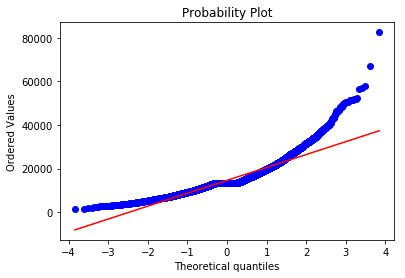

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.6957
Kurtosis: 5.8767


   Middle 
Overview of variable:  dmgtochamps 


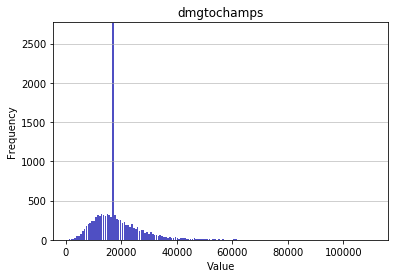

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1013.0
Mean: 18413.7334
Standard deviation: 8563.0679
Median: 17002.0
Maximal value: 110715.0


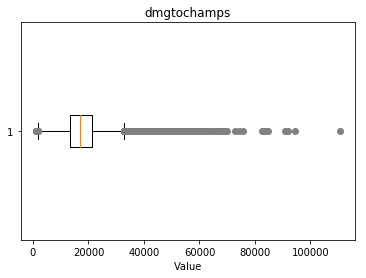

-------------------- 
Outlier detection:
 --------------------
List of outliers: {53760.0, 54273.0, 52225.0, 46087.0, 74248.0, 56840.0, 45581.0, 46094.0, 59407.0, 44561.0, 49171.0, 67093.0, 49173.0, 56853.0, 61461.0, 48152.0, 50201.0, 44571.0, 48668.0, 44572.0, 46111.0, 48678.0, 46630.0, 46632.0, 51241.0, 46633.0, 61485.0, 51248.0, 46128.0, 69170.0, 55347.0, 60978.0, 52278.0, 46656.0, 55362.0, 52811.0, 75854.0, 45141.0, 50262.0, 48725.0, 54874.0, 58458.0, 50778.0, 47201.0, 50274.0, 47717.0, 45161.0, 58986.0, 44652.0, 61551.0, 46192.0, 44146.0, 47734.0, 46200.0, 110715.0, 51836.0, 72829.0, 91774.0, 49793.0, 46722.0, 56455.0, 58504.0, 65679.0, 50841.0, 55454.0, 44196.0, 47783.0, 68265.0, 47274.0, 47280.0, 83634.0, 46259.0, 82611.0, 47286.0, 50359.0, 44726.0, 48827.0, 62656.0, 62150.0, 66763.0, 66764.0, 45772.0, 44749.0, 48849.0, 69843.0, 52949.0, 51421.0, 44262.0, 47848.0, 48874.0, 84718.0, 61166.0, 44272.0, 51439.0, 59123.0, 55540.0, 45313.0, 51976.0, 46345.0, 49932.0, 44300.0, 44304.0,

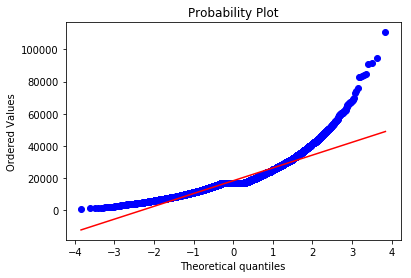

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.9296
Kurtosis: 7.889


   Jungle 
Overview of variable:  dmgtochamps 


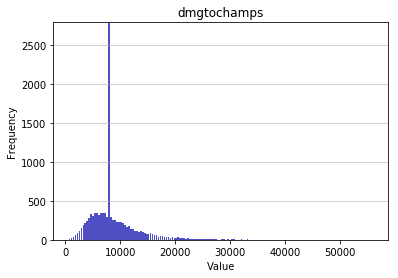

-------------------- 
Summary statistics:
 --------------------
Minimum value: 564.0
Mean: 8782.5776
Standard deviation: 4605.555
Median: 7880.5
Maximal value: 56092.0


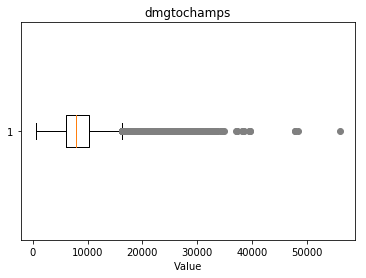

-------------------- 
Outlier detection:
 --------------------
List of outliers: {29696.0, 33281.0, 23042.0, 32264.0, 24586.0, 25610.0, 33292.0, 34322.0, 24595.0, 25620.0, 23063.0, 24602.0, 25630.0, 24102.0, 24109.0, 32301.0, 25136.0, 24628.0, 25655.0, 24634.0, 23104.0, 34372.0, 28743.0, 22602.0, 25677.0, 30797.0, 23117.0, 33873.0, 22623.0, 24160.0, 23139.0, 27751.0, 24682.0, 24172.0, 28783.0, 26736.0, 23667.0, 22645.0, 28282.0, 38531.0, 24197.0, 34951.0, 27271.0, 26249.0, 23177.0, 23178.0, 30860.0, 22669.0, 39566.0, 26759.0, 25231.0, 33426.0, 37020.0, 24222.0, 33442.0, 30373.0, 22694.0, 25766.0, 23722.0, 33451.0, 47787.0, 22704.0, 25264.0, 30389.0, 22714.0, 23739.0, 28859.0, 30400.0, 23749.0, 23752.0, 29897.0, 25290.0, 26319.0, 24792.0, 27355.0, 24797.0, 23773.0, 30431.0, 23776.0, 27871.0, 24803.0, 31973.0, 26345.0, 25834.0, 34542.0, 29423.0, 25331.0, 24307.0, 31991.0, 28924.0, 27393.0, 29441.0, 25348.0, 24324.0, 26888.0, 28424.0, 23306.0, 22795.0, 34572.0, 27401.0, 29455.0, 25871.0, 

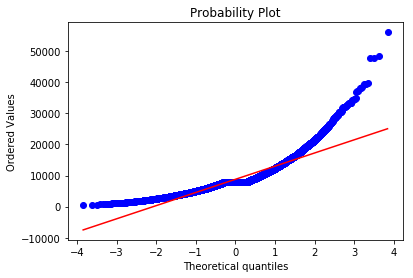

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.0177
Kurtosis: 7.3877


   ADC 
Overview of variable:  dmgtochamps 


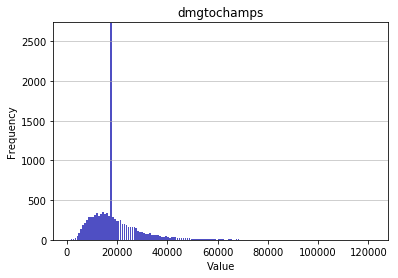

-------------------- 
Summary statistics:
 --------------------
Minimum value: 723.0
Mean: 19220.1035
Standard deviation: 10145.512
Median: 17219.0
Maximal value: 121937.0


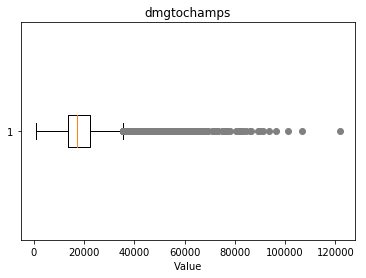

-------------------- 
Outlier detection:
 --------------------
List of outliers: {58370.0, 57863.0, 65549.0, 62478.0, 52750.0, 49680.0, 52755.0, 51225.0, 58906.0, 60445.0, 54814.0, 52254.0, 56861.0, 56354.0, 64549.0, 58405.0, 84519.0, 53288.0, 64042.0, 59435.0, 54826.0, 56365.0, 72765.0, 53310.0, 51265.0, 55362.0, 68161.0, 49730.0, 53317.0, 65603.0, 53320.0, 61007.0, 54352.0, 50257.0, 67666.0, 121937.0, 76885.0, 61014.0, 49751.0, 56920.0, 54359.0, 50783.0, 69216.0, 56417.0, 49763.0, 58475.0, 53878.0, 54908.0, 64638.0, 53375.0, 54401.0, 50825.0, 52362.0, 49808.0, 54418.0, 86170.0, 53404.0, 49822.0, 68255.0, 55968.0, 59550.0, 59038.0, 55972.0, 65190.0, 58535.0, 82600.0, 59050.0, 55468.0, 76463.0, 52403.0, 50362.0, 81595.0, 50365.0, 53956.0, 64709.0, 56006.0, 80583.0, 50377.0, 53453.0, 64205.0, 89298.0, 55516.0, 96477.0, 51938.0, 53474.0, 53988.0, 49896.0, 76521.0, 52464.0, 55536.0, 62195.0, 50931.0, 50935.0, 54007.0, 51960.0, 72449.0, 60674.0, 89859.0, 68867.0, 65285.0, 63238.0, 54534.0,

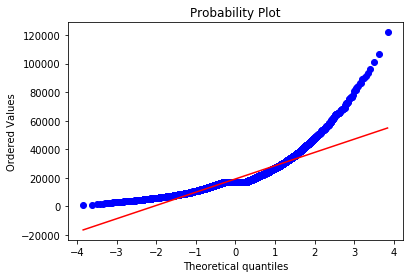

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.0871
Kurtosis: 7.6831


   Support 
Overview of variable:  dmgtochamps 


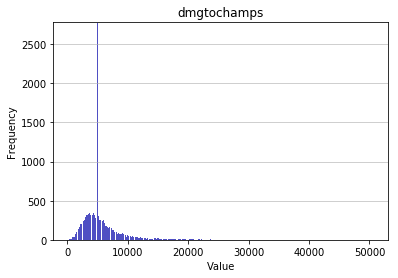

-------------------- 
Summary statistics:
 --------------------
Minimum value: 231.0
Mean: 5651.7131
Standard deviation: 3491.7794
Median: 4952.0
Maximal value: 50600.0


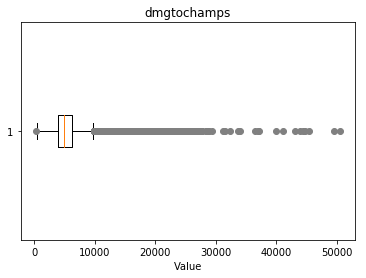

-------------------- 
Outlier detection:
 --------------------
List of outliers: {16897.0, 16898.0, 19462.0, 18439.0, 21000.0, 20489.0, 17418.0, 19465.0, 16392.0, 26121.0, 39944.0, 24586.0, 18963.0, 26645.0, 24600.0, 24605.0, 18974.0, 23581.0, 18466.0, 16421.0, 16935.0, 16936.0, 20521.0, 18986.0, 28712.0, 19496.0, 20525.0, 20008.0, 26671.0, 17456.0, 22058.0, 18985.0, 16953.0, 17468.0, 17470.0, 21566.0, 22078.0, 17475.0, 19523.0, 20549.0, 23622.0, 17478.0, 16455.0, 43086.0, 18514.0, 36948.0, 23638.0, 22617.0, 16988.0, 19040.0, 25698.0, 25713.0, 24183.0, 18552.0, 25720.0, 21630.0, 27774.0, 18050.0, 20610.0, 17028.0, 19589.0, 20613.0, 19079.0, 16516.0, 41097.0, 17546.0, 18058.0, 20111.0, 16527.0, 21138.0, 24210.0, 18067.0, 16532.0, 27797.0, 21143.0, 20123.0, 17563.0, 18588.0, 18075.0, 17051.0, 18590.0, 20642.0, 17062.0, 25255.0, 32422.0, 23724.0, 17069.0, 22190.0, 36524.0, 17582.0, 33970.0, 18098.0, 22196.0, 17088.0, 19656.0, 21194.0, 18635.0, 19659.0, 19662.0, 17615.0, 20688.0, 17618.0, 

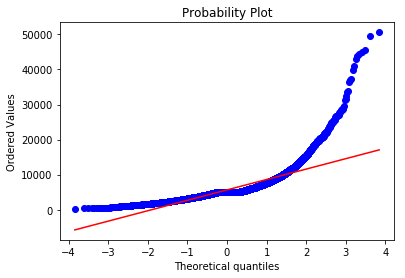

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 3.5009
Kurtosis: 22.4985


   Top 
Overview of variable:  dmgtochampsperminute 


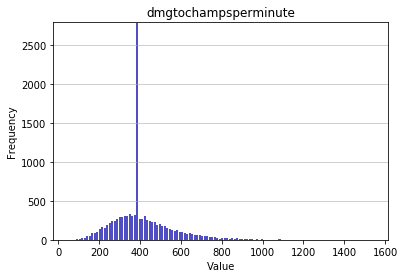

-------------------- 
Summary statistics:
 --------------------
Minimum value: 49.04322486644001
Mean: 408.584
Standard deviation: 140.3099
Median: 389.8088
Maximal value: 1541.5758330738088


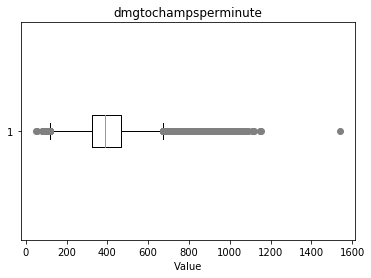

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1541.58, 1029.58, 1032.42, 1045.85, 1050.92, 1052.82, 1055.75, 1070.19, 1072.66, 1072.82, 1080.76, 1083.48, 1085.92, 1085.71, 1088.71, 1110.12, 1119.43, 833.78, 833.26, 1149.1, 1154.19, 845.25, 846.2, 850.19, 850.34, 851.06, 854.43, 854.07, 856.73, 857.67, 874.54, 875.8, 829.6, 830.21, 831.92, 831.85, 832.14, 834.88, 834.04, 836.84, 837.57, 838.65, 839.33, 838.9, 837.36, 842.46, 841.32, 845.01, 846.44, 846.53, 848.67, 881.73, 850.4, 850.8, 852.18, 853.38, 852.2, 854.36, 856.44, 850.78, 855.17, 857.97, 860.23, 861.98, 859.51, 856.41, 864.19, 865.05, 865.26, 860.63, 863.45, 869.01, 870.69, 871.16, 872.54, 873.71, 873.63, 873.11, 874.9, 876.37, 878.22, 877.75, 876.51, 878.89, 880.21, 879.63, 884.36, 885.18, 884.93, 882.11, 888.28, 889.65, 887.62, 883.63, 892.98, 890.0, 896.35, 898.12, 900.75, 901.25, 901.76, 906.37, 908.93, 909.55, 911.21, 912.37, 913.41, 914.43, 917.98, 917.53, 924.93, 926.3, 927.12, 929.25

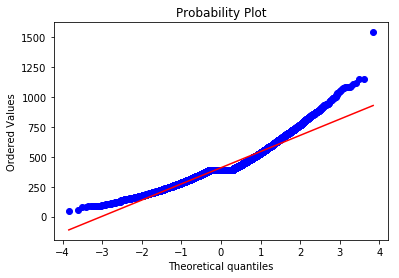

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.0696
Kurtosis: 2.3671


   Middle 
Overview of variable:  dmgtochampsperminute 


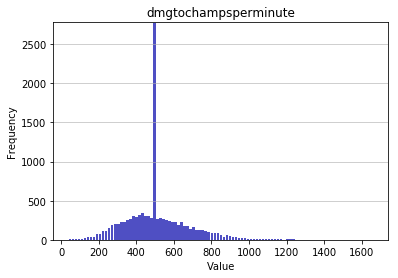

-------------------- 
Summary statistics:
 --------------------
Minimum value: 38.34700315457413
Mean: 509.9821
Standard deviation: 176.0389
Median: 491.5021
Maximal value: 1661.6227180527383


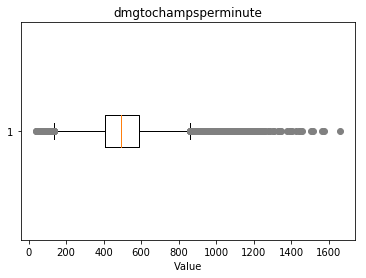

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1038.91, 1039.08, 1038.47, 1041.07, 1041.2, 1042.93, 1045.83, 1047.17, 1049.3, 1053.68, 1053.2, 1055.65, 1566.81, 1057.39, 1058.33, 1059.19, 1060.02, 1061.55, 1062.78, 1062.65, 1576.46, 1065.8, 1066.62, 1060.66, 1068.57, 1069.54, 1070.17, 1068.34, 1072.14, 1074.64, 1074.27, 1076.87, 1076.39, 1081.12, 1082.69, 1083.36, 1083.19, 1085.05, 1089.38, 1096.08, 1097.29, 1098.85, 1097.48, 1100.24, 1101.22, 1100.3, 1104.08, 1105.94, 1106.28, 1107.59, 1108.41, 1109.71, 1109.36, 1110.62, 1110.99, 1114.42, 1115.86, 1116.75, 1118.21, 1120.29, 1123.28, 1129.32, 1132.27, 1133.28, 1132.87, 1132.23, 1141.56, 1145.22, 1146.54, 1148.52, 1661.62, 1151.42, 1151.45, 1153.07, 1154.71, 1160.39, 1161.38, 1162.17, 1163.09, 1166.94, 1170.1, 1171.3, 1172.28, 1188.74, 1189.37, 1192.71, 1195.82, 1196.36, 1198.34, 1204.54, 1208.12, 1210.03, 1213.22, 1215.03, 1222.37, 1057.12, 1223.7, 1228.48, 1230.28, 1238.07, 1239.63, 1253.13, 1254.42,

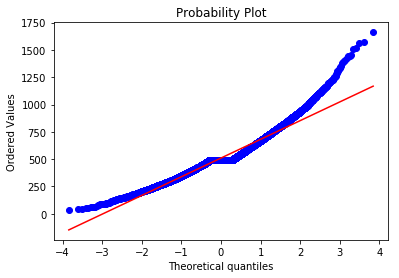

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.9093
Kurtosis: 2.2083


   Jungle 
Overview of variable:  dmgtochampsperminute 


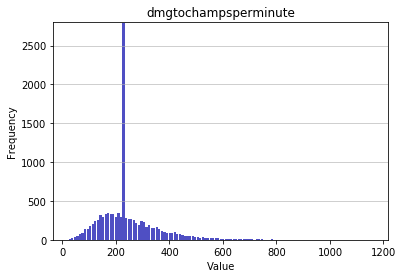

-------------------- 
Summary statistics:
 --------------------
Minimum value: 22.38303181534623
Mean: 246.1724
Standard deviation: 110.2741
Median: 228.3334
Maximal value: 1161.7386934673368


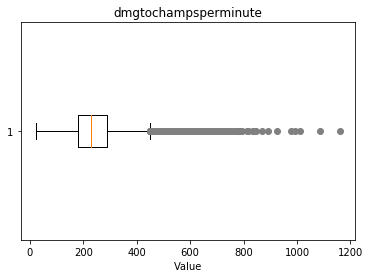

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1084.84, 577.79, 578.32, 579.42, 580.42, 580.16, 580.84, 581.56, 584.28, 585.19, 585.16, 582.72, 587.28, 585.47, 583.81, 591.82, 584.19, 593.47, 594.03, 595.86, 596.16, 596.38, 598.87, 599.7, 600.64, 598.52, 602.42, 600.67, 604.13, 604.62, 606.28, 607.41, 607.28, 604.31, 605.74, 607.46, 609.5, 613.99, 613.85, 615.07, 616.66, 619.03, 619.55, 621.16, 622.24, 622.15, 624.7, 620.29, 626.93, 619.25, 628.06, 629.75, 630.1, 628.45, 625.03, 633.85, 634.17, 635.99, 634.27, 634.15, 641.16, 642.6, 641.43, 644.04, 645.65, 646.16, 647.44, 648.81, 649.12, 650.72, 648.16, 644.88, 653.3, 654.01, 655.53, 651.69, 657.21, 658.99, 657.09, 660.16, 660.7, 657.41, 662.99, 665.07, 666.64, 667.49, 668.78, 668.68, 671.77, 673.61, 674.6, 673.08, 678.44, 679.15, 680.36, 681.84, 679.52, 685.25, 686.15, 685.5, 685.73, 686.33, 690.02, 685.93, 688.11, 693.63, 694.15, 695.12, 696.3, 696.47, 695.89, 700.89, 701.98, 702.06, 701.5, 705.74, 

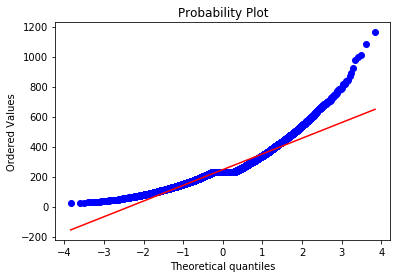

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.4525
Kurtosis: 3.9809


   ADC 
Overview of variable:  dmgtochampsperminute 


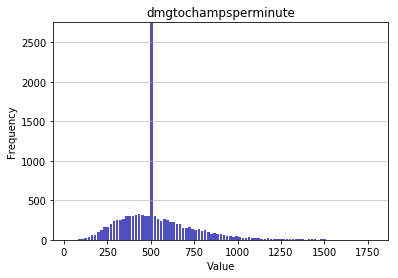

-------------------- 
Summary statistics:
 --------------------
Minimum value: 26.53846153846154
Mean: 527.328
Standard deviation: 202.7748
Median: 499.7391
Maximal value: 1781.1138461538462


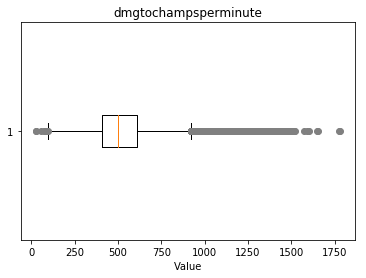

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1575.35, 1588.18, 1603.4, 1645.94, 1137.08, 1137.91, 1137.15, 1140.76, 1141.69, 1654.46, 1137.3, 1147.96, 1149.57, 1149.34, 1151.85, 1152.54, 1152.83, 1154.25, 1155.82, 1149.93, 1153.0, 1161.42, 1167.46, 1168.25, 1169.99, 1170.11, 1171.36, 1172.17, 1172.87, 1174.35, 1175.12, 1174.33, 1173.27, 1178.16, 1175.35, 1180.32, 1175.32, 1175.36, 1179.16, 1186.2, 1186.24, 1188.9, 1189.87, 1190.17, 1190.36, 1190.35, 1193.09, 1197.37, 1204.44, 1205.79, 1205.35, 1209.53, 1210.02, 1212.2, 1217.15, 1220.39, 1221.07, 1223.75, 1223.2, 1227.76, 1232.93, 1235.19, 1236.93, 1236.08, 1238.75, 1237.25, 1241.15, 1243.17, 1243.09, 1244.96, 1243.35, 1247.66, 1248.22, 1249.85, 1251.7, 1255.49, 1773.93, 1263.78, 1264.61, 1265.97, 1264.55, 1268.96, 1269.85, 1270.66, 1781.11, 1269.29, 1273.19, 1273.49, 1276.48, 1277.33, 1279.63, 1282.19, 1287.9, 1289.17, 1291.42, 1292.45, 1291.74, 1303.58, 1303.66, 1305.46, 1308.81, 1310.54, 1313.86, 

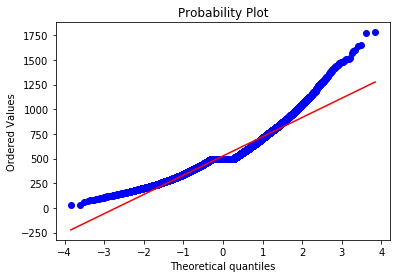

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.1603
Kurtosis: 2.597


   Support 
Overview of variable:  dmgtochampsperminute 


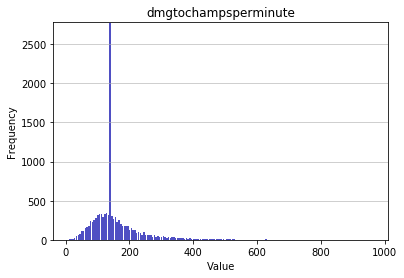

-------------------- 
Summary statistics:
 --------------------
Minimum value: 9.447852760736197
Mean: 158.1761
Standard deviation: 83.059
Median: 141.637
Maximal value: 963.9054404145078


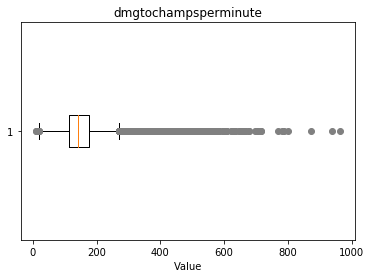

-------------------- 
Outlier detection:
 --------------------
List of outliers: {512.59, 512.08, 407.73, 515.39, 515.64, 509.26, 518.18, 519.4, 520.98, 521.87, 504.8, 518.44, 524.97, 524.69, 526.46, 525.92, 528.66, 528.9, 525.07, 410.83, 512.05, 410.57, 534.97, 535.86, 410.2, 412.0, 535.93, 514.35, 411.87, 412.08, 542.1, 538.85, 413.14, 545.25, 546.21, 414.27, 546.75, 542.09, 550.24, 551.74, 415.61, 415.03, 554.31, 552.9, 415.48, 557.09, 416.77, 559.25, 416.21, 562.56, 564.54, 566.38, 567.84, 419.33, 574.96, 575.04, 577.02, 580.96, 582.32, 421.05, 523.32, 421.53, 586.56, 422.98, 422.39, 422.3, 423.08, 594.99, 595.44, 424.9, 424.51, 600.07, 424.55, 425.32, 606.59, 607.35, 608.29, 426.43, 427.43, 428.6, 622.12, 623.17, 429.44, 626.7, 626.22, 627.42, 629.44, 630.27, 431.97, 637.52, 646.02, 648.87, 649.42, 434.05, 652.49, 435.48, 654.94, 659.72, 437.77, 664.26, 413.72, 668.73, 510.54, 677.18, 678.94, 441.11, 443.44, 695.48, 703.6, 445.04, 707.38, 715.32, 715.56, 448.15, 449.95, 453.41, 45

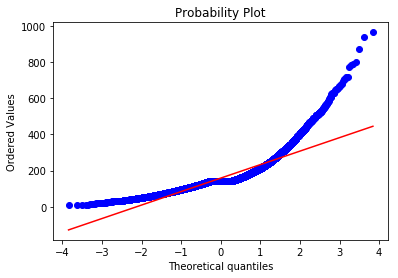

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.3463
Kurtosis: 9.1467


   Top 
Overview of variable:  dmgshare 


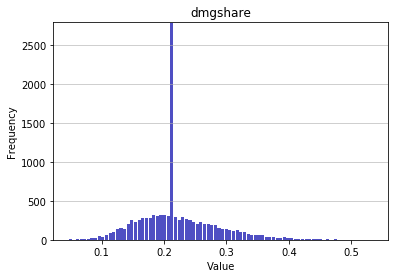

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.04694258164358557
Mean: 0.2212
Standard deviation: 0.0619
Median: 0.2146
Maximal value: 0.5350679287851292


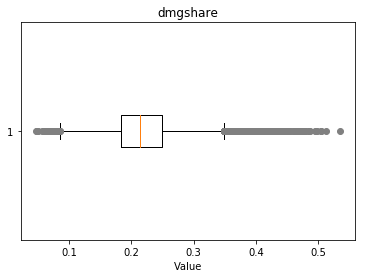

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.43, 0.49, 0.41, 0.46, 0.42, 0.48, 0.45, 0.44, 0.54, 0.51, 0.5, 0.47}


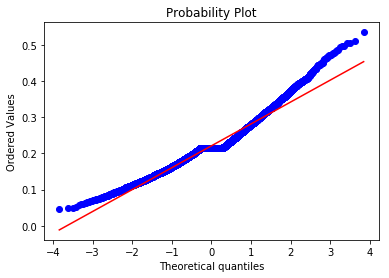

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7444
Kurtosis: 1.245


   Middle 
Overview of variable:  dmgshare 


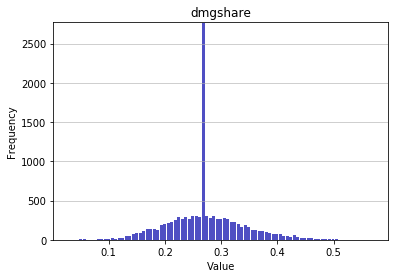

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.02855210124298881
Mean: 0.2731
Standard deviation: 0.0664
Median: 0.2705
Maximal value: 0.5704294512312649


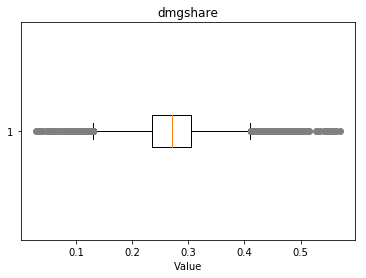

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.48, 0.51, 0.55, 0.49, 0.5, 0.54, 0.07, 0.47, 0.53, 0.05, 0.56, 0.57, 0.03, 0.04, 0.52, 0.06}


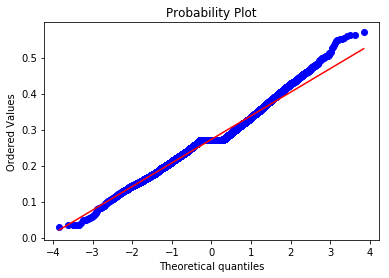

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.3347
Kurtosis: 1.0135


   Jungle 
Overview of variable:  dmgshare 


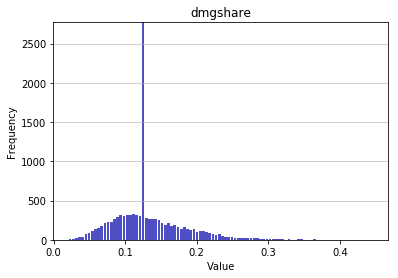

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.020713970912296167
Mean: 0.1322
Standard deviation: 0.0495
Median: 0.1252
Maximal value: 0.44642324771304387


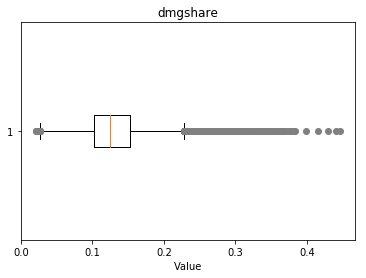

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.31, 0.28, 0.34, 0.3, 0.29, 0.32, 0.33, 0.37, 0.35, 0.45, 0.36, 0.44, 0.38, 0.42, 0.4, 0.43}


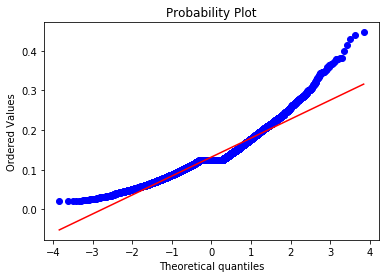

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.0847
Kurtosis: 2.3565


   ADC 
Overview of variable:  dmgshare 


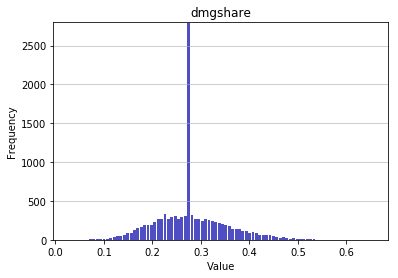

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0269524697110904
Mean: 0.2801
Standard deviation: 0.072
Median: 0.2752
Maximal value: 0.6553691168525757


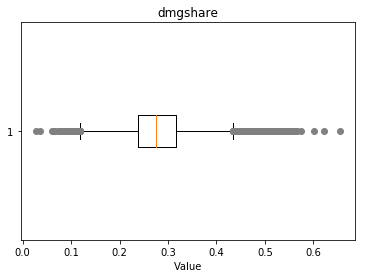

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.51, 0.5, 0.53, 0.06, 0.52, 0.55, 0.66, 0.57, 0.6, 0.56, 0.54, 0.03, 0.04, 0.62}


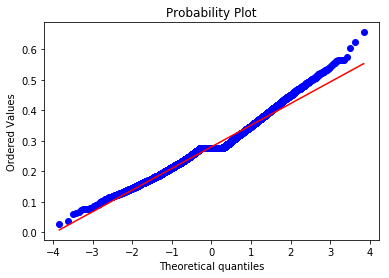

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.4927
Kurtosis: 0.8792


   Support 
Overview of variable:  dmgshare 


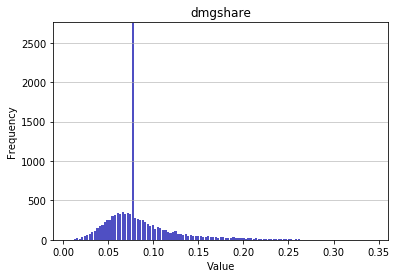

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.00604443657216238
Mean: 0.0853
Standard deviation: 0.0397
Median: 0.0769
Maximal value: 0.34394838531603644


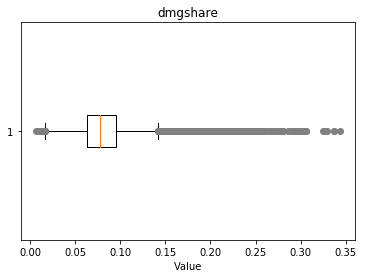

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.22, 0.25, 0.23, 0.24, 0.21, 0.27, 0.26, 0.3, 0.28, 0.31, 0.34, 0.32, 0.2, 0.33, 0.29}


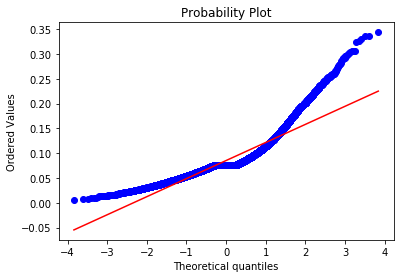

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.8342
Kurtosis: 4.8046


   Top 
Overview of variable:  earnedgoldshare 


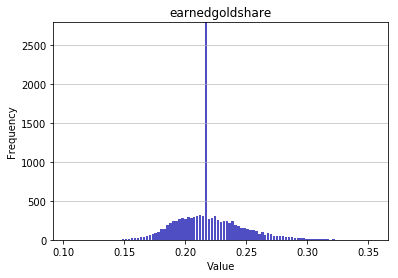

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.10437763098783713
Mean: 0.2194
Standard deviation: 0.0262
Median: 0.2171
Maximal value: 0.3542067613914748


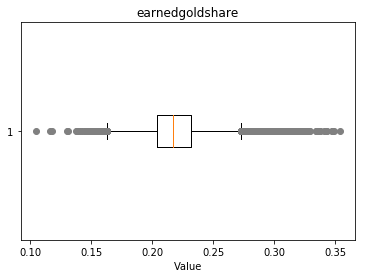

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.3, 0.32, 0.14, 0.31, 0.34, 0.35, 0.33, 0.12, 0.1, 0.13}


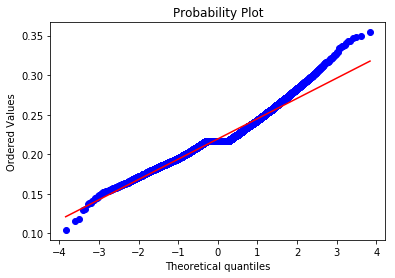

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.6742
Kurtosis: 1.5481


   Middle 
Overview of variable:  earnedgoldshare 


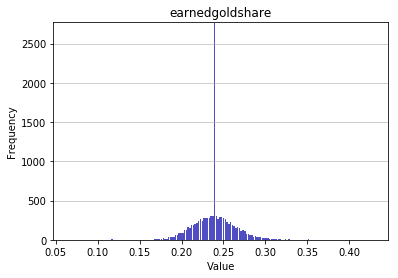

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.06521713793616979
Mean: 0.2394
Standard deviation: 0.0245
Median: 0.2387
Maximal value: 0.4286650648098203


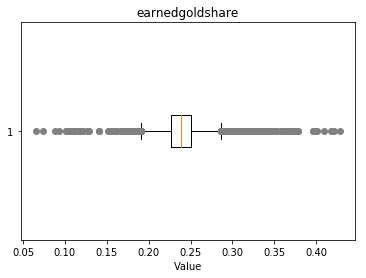

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.32, 0.33, 0.31, 0.34, 0.12, 0.37, 0.13, 0.4, 0.42, 0.07, 0.43, 0.35, 0.11, 0.36, 0.1, 0.16, 0.15, 0.09, 0.38, 0.14, 0.41}


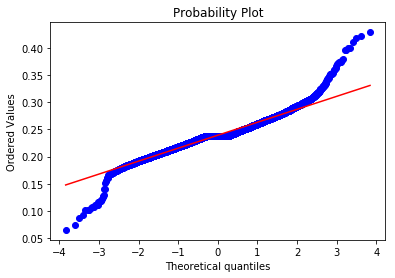

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.351
Kurtosis: 4.7885


   Jungle 
Overview of variable:  earnedgoldshare 


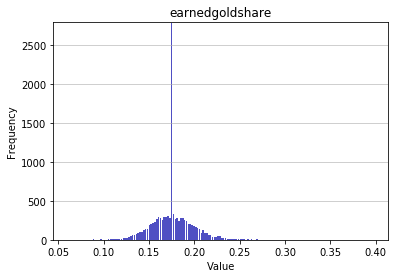

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.06132323420459012
Mean: 0.1764
Standard deviation: 0.0233
Median: 0.1755
Maximal value: 0.39721909263279387


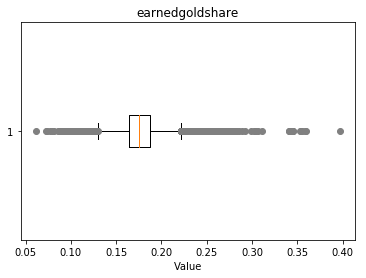

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.25, 0.26, 0.28, 0.1, 0.27, 0.11, 0.07, 0.4, 0.06, 0.36, 0.09, 0.31, 0.3, 0.34, 0.35, 0.08, 0.29}


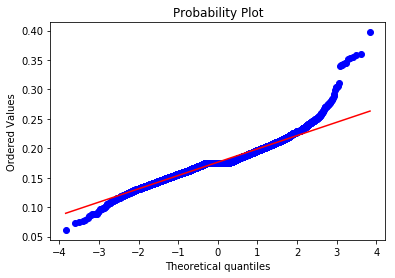

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7863
Kurtosis: 5.2598


   ADC 
Overview of variable:  earnedgoldshare 


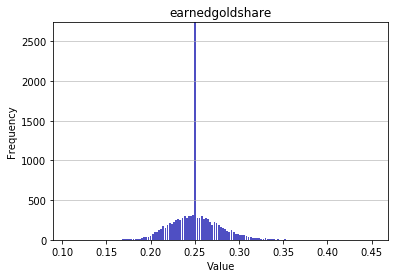

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.10720307152992238
Mean: 0.2508
Standard deviation: 0.026
Median: 0.2495
Maximal value: 0.45172700590446996


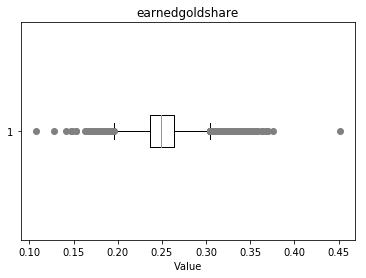

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.35, 0.13, 0.34, 0.37, 0.33, 0.36, 0.38, 0.17, 0.15, 0.45, 0.11, 0.16, 0.14}


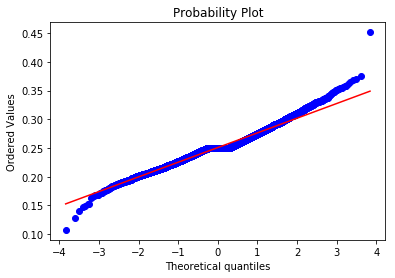

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.3977
Kurtosis: 1.4594


   Support 
Overview of variable:  earnedgoldshare 


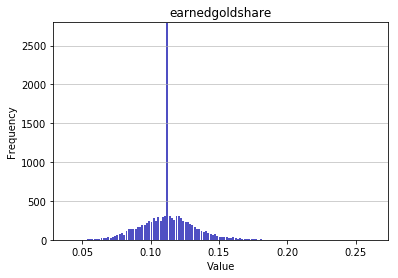

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.04002471257155543
Mean: 0.1126
Standard deviation: 0.0185
Median: 0.1124
Maximal value: 0.262805388706788


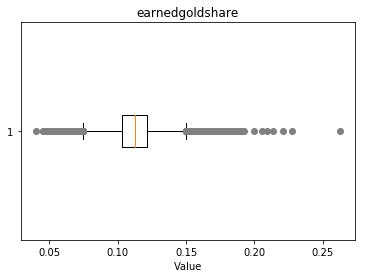

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.19, 0.23, 0.18, 0.21, 0.17, 0.2, 0.05, 0.06, 0.22, 0.26, 0.04}


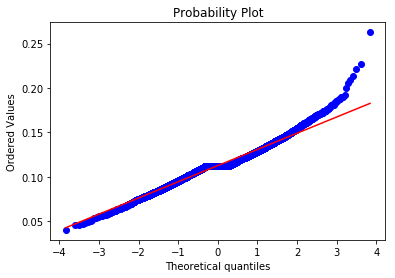

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.3003
Kurtosis: 1.8292


   Top 
Overview of variable:  wards 


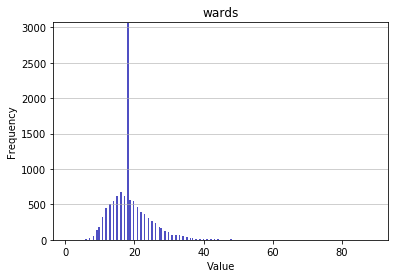

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1.0
Mean: 18.817
Standard deviation: 5.8299
Median: 18.0
Maximal value: 89.0


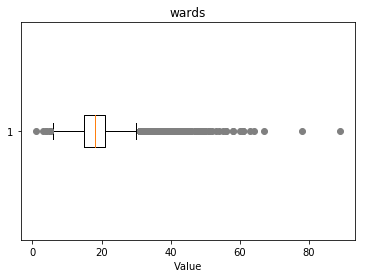

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 58.0, 60.0, 61.0, 63.0, 64.0, 67.0, 78.0, 89.0}


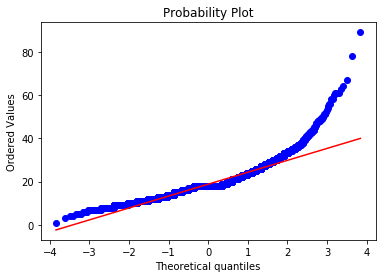

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.6971
Kurtosis: 7.7986


   Middle 
Overview of variable:  wards 


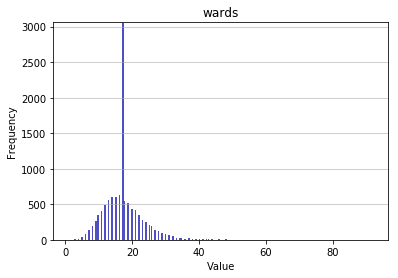

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1.0
Mean: 17.3709
Standard deviation: 5.8456
Median: 17.0
Maximal value: 92.0


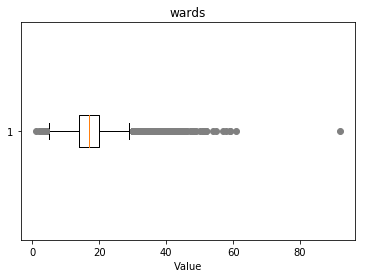

-------------------- 
Outlier detection:
 --------------------
List of outliers: {35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 54.0, 55.0, 57.0, 58.0, 59.0, 61.0, 92.0}


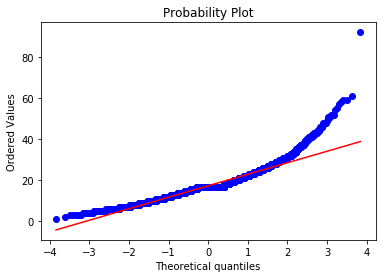

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.3822
Kurtosis: 6.308


   Jungle 
Overview of variable:  wards 


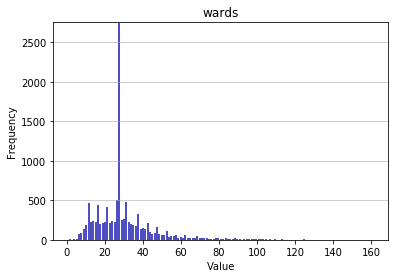

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1.0
Mean: 30.4058
Standard deviation: 16.3677
Median: 28.0
Maximal value: 161.0


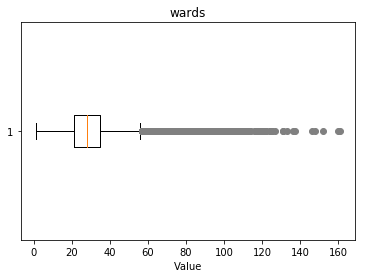

-------------------- 
Outlier detection:
 --------------------
List of outliers: {131.0, 133.0, 136.0, 137.0, 146.0, 148.0, 152.0, 160.0, 161.0, 80.0, 81.0, 82.0, 83.0, 84.0, 85.0, 86.0, 87.0, 88.0, 89.0, 90.0, 91.0, 92.0, 93.0, 94.0, 95.0, 96.0, 97.0, 98.0, 99.0, 100.0, 101.0, 102.0, 103.0, 104.0, 105.0, 106.0, 107.0, 108.0, 109.0, 110.0, 111.0, 112.0, 113.0, 114.0, 116.0, 117.0, 118.0, 119.0, 120.0, 121.0, 122.0, 124.0, 125.0, 127.0}


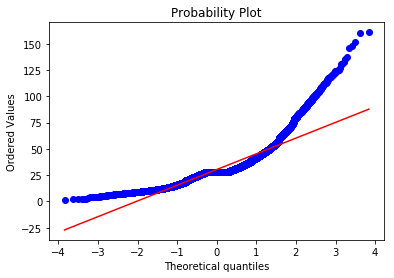

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.0485
Kurtosis: 6.9362


   ADC 
Overview of variable:  wards 


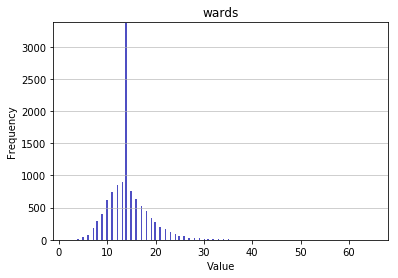

-------------------- 
Summary statistics:
 --------------------
Minimum value: 2.0
Mean: 14.4092
Standard deviation: 4.2817
Median: 14.0
Maximal value: 65.0


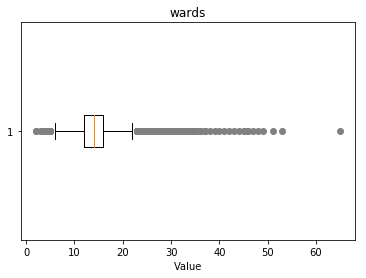

-------------------- 
Outlier detection:
 --------------------
List of outliers: {28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 51.0, 53.0, 65.0}


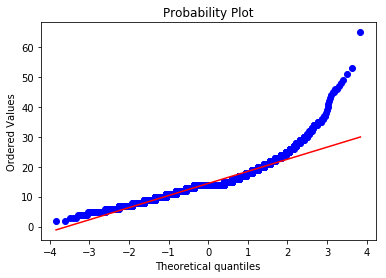

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.6037
Kurtosis: 7.6382


   Support 
Overview of variable:  wards 


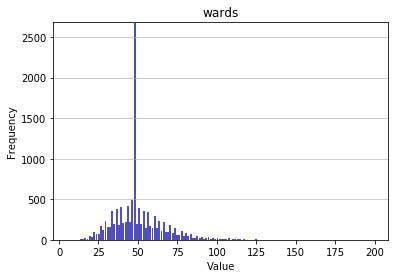

-------------------- 
Summary statistics:
 --------------------
Minimum value: 6.0
Mean: 50.477
Standard deviation: 16.3035
Median: 48.0
Maximal value: 199.0


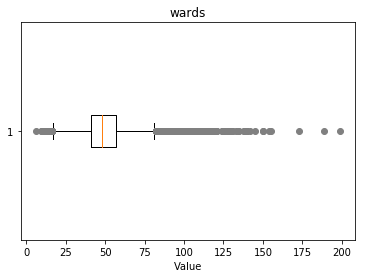

-------------------- 
Outlier detection:
 --------------------
List of outliers: {128.0, 129.0, 130.0, 131.0, 133.0, 134.0, 135.0, 138.0, 140.0, 142.0, 145.0, 150.0, 154.0, 155.0, 173.0, 189.0, 199.0, 100.0, 101.0, 102.0, 103.0, 104.0, 105.0, 106.0, 107.0, 108.0, 109.0, 110.0, 111.0, 112.0, 113.0, 114.0, 115.0, 116.0, 117.0, 118.0, 119.0, 120.0, 121.0, 124.0, 125.0, 126.0, 127.0}


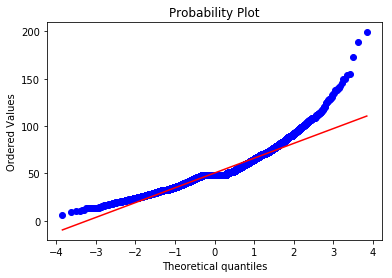

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.277
Kurtosis: 4.0216


   Top 
Overview of variable:  wpm 


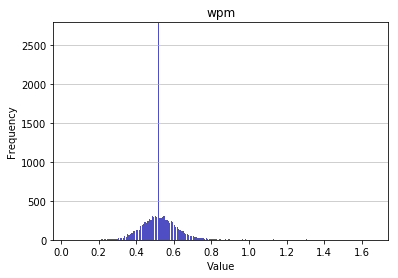

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.04045853000674309
Mean: 0.5264
Standard deviation: 0.1033
Median: 0.5203
Maximal value: 1.6598639455782314


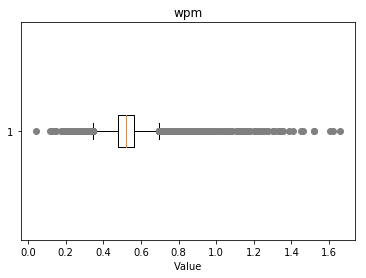

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.2, 0.96, 0.14, 0.87, 0.19, 0.13, 0.85, 1.52, 0.86, 1.31, 1.21, 1.25, 1.17, 1.08, 1.0, 0.84, 0.92, 1.34, 1.18, 1.01, 0.93, 0.94, 1.02, 1.35, 1.27, 0.04, 0.95, 1.45, 1.61, 1.2, 1.11, 1.03, 1.28, 0.12, 0.22, 0.21, 0.17, 1.33, 0.15, 1.13, 1.12, 1.46, 0.88, 1.04, 1.62, 0.97, 1.22, 1.14, 1.39, 0.89, 1.05, 1.3, 0.98, 1.06, 1.15, 1.23, 0.9, 0.99, 1.07, 1.66, 1.16, 0.91, 1.41, 1.24}


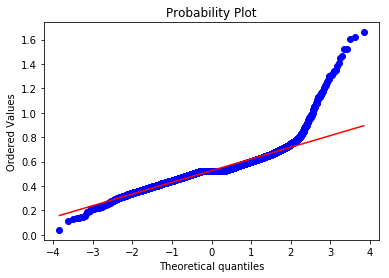

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.0309
Kurtosis: 14.5025


   Middle 
Overview of variable:  wpm 


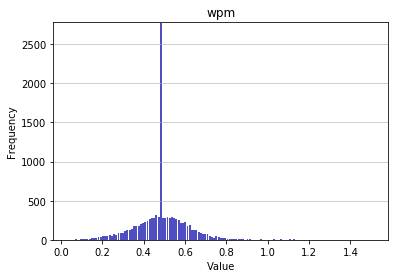

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.03735990037359901
Mean: 0.4894
Standard deviation: 0.1293
Median: 0.4886
Maximal value: 1.510365251727542


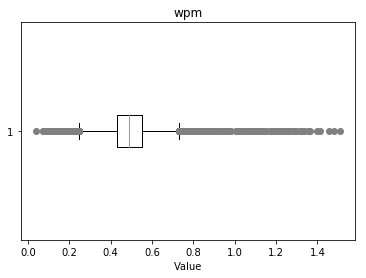

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.89, 0.07, 0.91, 1.09, 1.06, 1.28, 1.13, 0.92, 1.3, 1.19, 1.27, 1.25, 1.08, 1.17, 1.33, 1.0, 1.26, 1.34, 1.18, 0.93, 1.51, 1.01, 1.1, 1.02, 0.04, 0.95, 1.11, 1.36, 1.03, 1.2, 0.1, 0.96, 0.09, 1.12, 1.04, 1.46, 0.88, 0.97, 1.22, 1.14, 0.08, 0.98, 1.23, 1.15, 1.48, 0.9, 1.4, 1.24, 1.41, 1.32, 1.07}


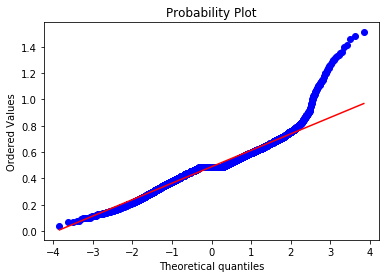

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7866
Kurtosis: 5.1931


   Jungle 
Overview of variable:  wpm 


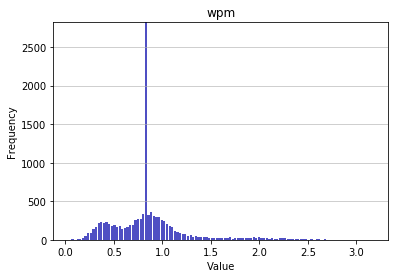

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.03088008234688626
Mean: 0.8536
Standard deviation: 0.3919
Median: 0.8227
Maximal value: 3.1735985533453888


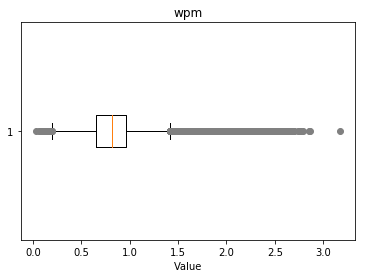

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2.41, 2.27, 2.52, 2.46, 2.67, 2.19, 2.14, 2.08, 2.06, 2.35, 2.44, 2.07, 2.17, 2.16, 2.09, 2.26, 2.25, 2.24, 2.49, 2.33, 2.34, 2.42, 3.17, 2.4, 2.7, 2.65, 2.74, 2.1, 2.57, 2.77, 2.28, 2.03, 2.11, 2.18, 2.86, 2.36, 2.43, 2.85, 2.61, 2.29, 2.79, 2.64, 2.75, 2.38, 2.04, 2.12, 2.21, 2.13, 2.63, 2.2, 2.3, 2.54, 2.45, 2.37, 2.05, 2.76, 2.58, 2.69, 2.55, 2.22, 2.23, 2.31, 2.47, 2.15, 2.56, 2.32, 2.62, 2.48, 2.39, 2.59, 2.66}


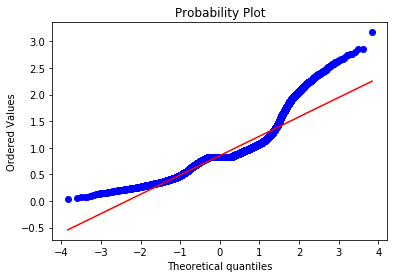

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.5507
Kurtosis: 3.9281


   ADC 
Overview of variable:  wpm 


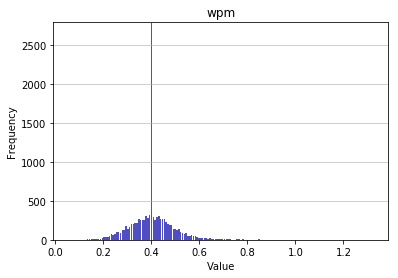

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.056338028169014086
Mean: 0.407
Standard deviation: 0.0951
Median: 0.4023
Maximal value: 1.3238967527060783


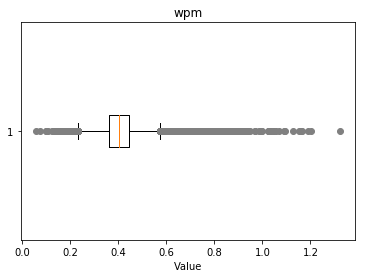

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.78, 0.07, 0.7, 0.74, 1.13, 0.72, 0.71, 0.73, 1.05, 0.83, 1.03, 0.84, 0.92, 0.75, 1.0, 0.76, 1.09, 0.85, 0.93, 0.11, 0.77, 0.69, 0.94, 1.1, 1.19, 0.86, 0.95, 1.2, 0.87, 0.1, 0.79, 0.88, 0.8, 0.97, 0.89, 0.06, 0.81, 1.15, 1.06, 0.82, 0.9, 0.99, 1.16, 1.32, 1.07, 0.91}


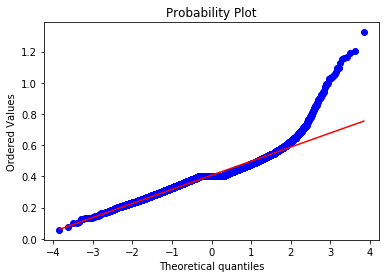

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.415
Kurtosis: 7.8975


   Support 
Overview of variable:  wpm 


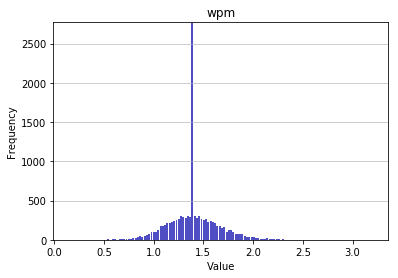

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.14434643143544507
Mean: 1.4029
Standard deviation: 0.2527
Median: 1.3929
Maximal value: 3.2079207920792077


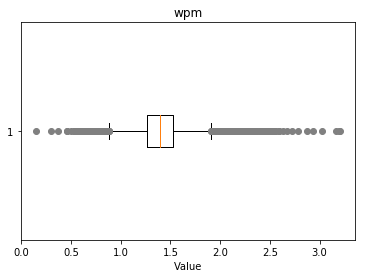

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.53, 0.59, 2.5, 2.24, 2.18, 2.21, 2.23, 3.16, 2.27, 2.22, 2.35, 2.59, 2.17, 2.26, 2.16, 2.25, 2.41, 2.33, 0.6, 0.5, 0.61, 2.43, 2.52, 2.94, 2.19, 2.78, 3.03, 2.68, 2.44, 0.45, 0.37, 0.62, 0.54, 0.46, 2.54, 2.63, 2.88, 2.37, 2.29, 2.38, 3.21, 0.55, 2.46, 3.2, 2.55, 0.3, 0.64, 0.14, 2.3, 0.56, 2.57, 2.31, 2.4, 2.48, 2.47, 2.72}


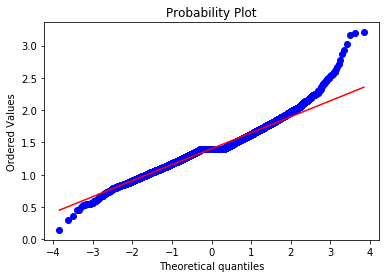

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.5104
Kurtosis: 2.4244


   Top 
Overview of variable:  wardshare 


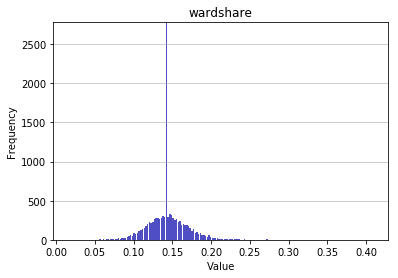

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.016129032258064516
Mean: 0.1442
Standard deviation: 0.0253
Median: 0.1429
Maximal value: 0.4090909090909091


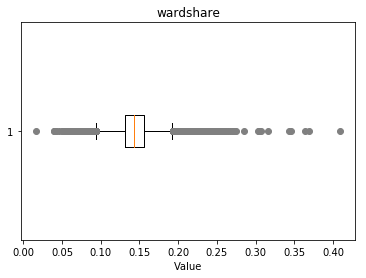

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.07, 0.06, 0.24, 0.25, 0.29, 0.27, 0.26, 0.36, 0.34, 0.3, 0.35, 0.05, 0.04, 0.28, 0.37, 0.23, 0.22, 0.02, 0.31, 0.32, 0.41}


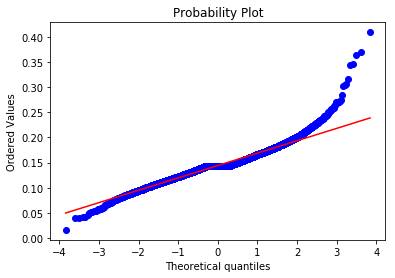

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7789
Kurtosis: 5.0868


   Middle 
Overview of variable:  wardshare 


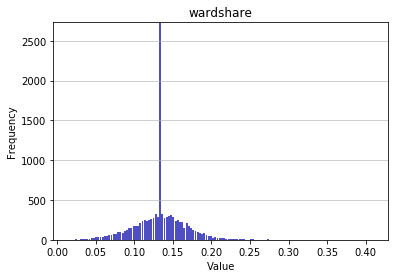

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.014925373134328358
Mean: 0.134
Standard deviation: 0.0332
Median: 0.1345
Maximal value: 0.4097222222222222


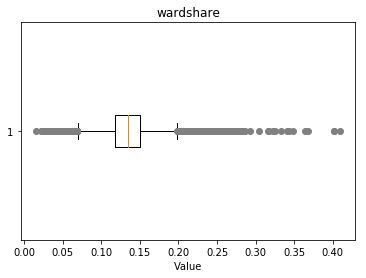

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.03, 0.26, 0.23, 0.25, 0.24, 0.29, 0.28, 0.3, 0.27, 0.4, 0.36, 0.01, 0.32, 0.34, 0.37, 0.41, 0.02, 0.35, 0.33}


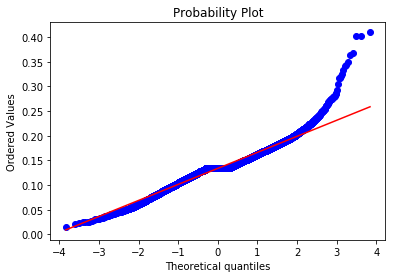

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.4077
Kurtosis: 3.5044


   Jungle 
Overview of variable:  wardshare 


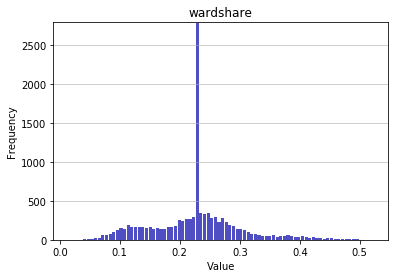

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.014285714285714285
Mean: 0.2258
Standard deviation: 0.0737
Median: 0.2278
Maximal value: 0.5226130653266332


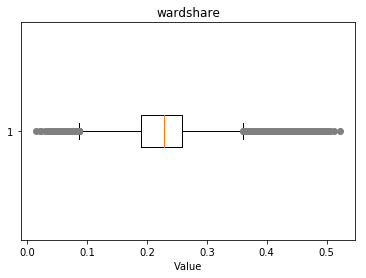

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.49, 0.47, 0.45, 0.46, 0.48, 0.51, 0.5, 0.52}


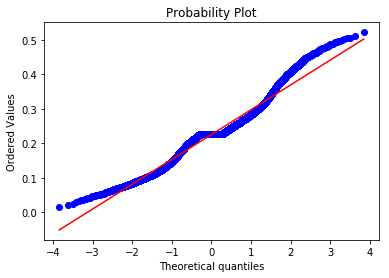

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.3931
Kurtosis: 1.0026


   ADC 
Overview of variable:  wardshare 


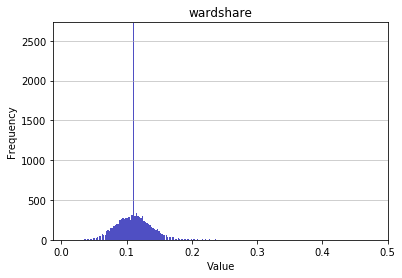

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.011049723756906077
Mean: 0.1121
Standard deviation: 0.0267
Median: 0.1111
Maximal value: 0.4777777777777778


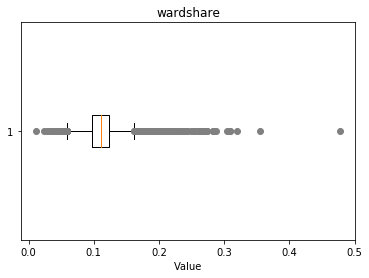

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.21, 0.32, 0.19, 0.2, 0.03, 0.23, 0.22, 0.24, 0.29, 0.35, 0.27, 0.25, 0.01, 0.3, 0.48, 0.26, 0.28, 0.02, 0.31}


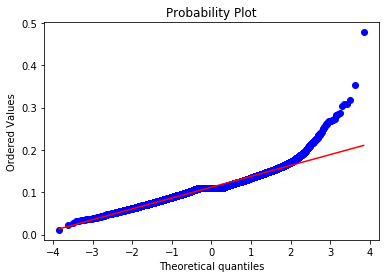

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.2546
Kurtosis: 8.0862


   Support 
Overview of variable:  wardshare 


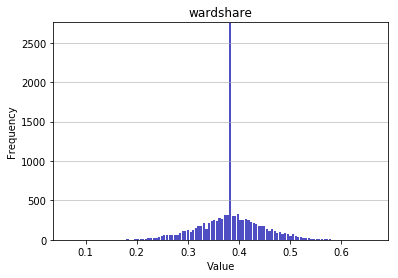

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.06666666666666667
Mean: 0.384
Standard deviation: 0.0587
Median: 0.3842
Maximal value: 0.6622516556291391


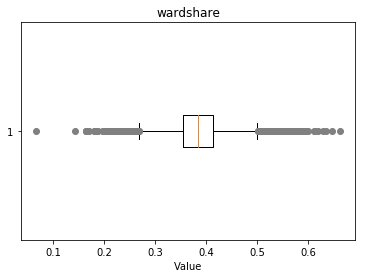

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.57, 0.59, 0.21, 0.58, 0.19, 0.56, 0.63, 0.14, 0.16, 0.2, 0.17, 0.61, 0.65, 0.6, 0.07, 0.62, 0.18, 0.66}


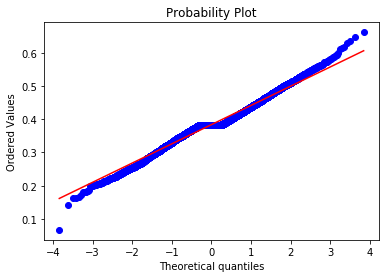

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.0137
Kurtosis: 1.0288


   Top 
Overview of variable:  wardkills 


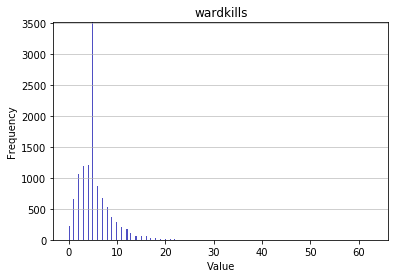

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 5.2898
Standard deviation: 3.3823
Median: 5.0
Maximal value: 63.0


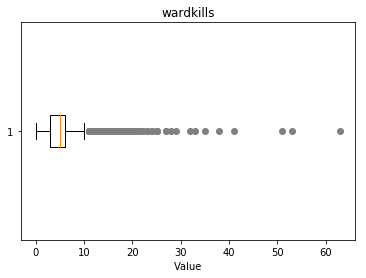

-------------------- 
Outlier detection:
 --------------------
List of outliers: {16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 27.0, 28.0, 29.0, 32.0, 33.0, 35.0, 38.0, 41.0, 51.0, 53.0, 63.0}


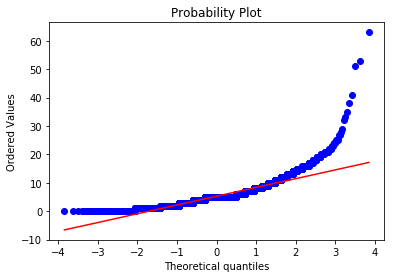

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.5565
Kurtosis: 19.9812


   Middle 
Overview of variable:  wardkills 


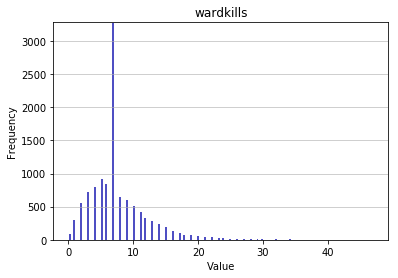

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 7.6402
Standard deviation: 4.5464
Median: 7.0
Maximal value: 47.0


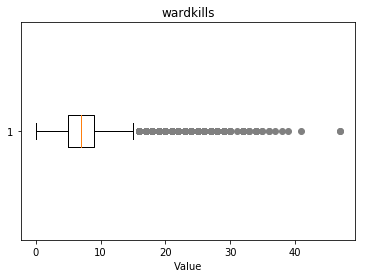

-------------------- 
Outlier detection:
 --------------------
List of outliers: {32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 41.0, 47.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0}


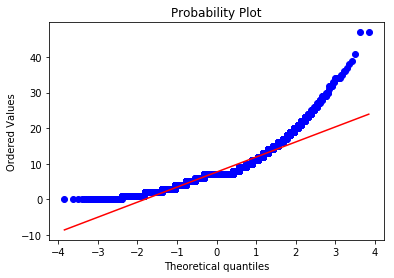

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.7441
Kurtosis: 5.7115


   Jungle 
Overview of variable:  wardkills 


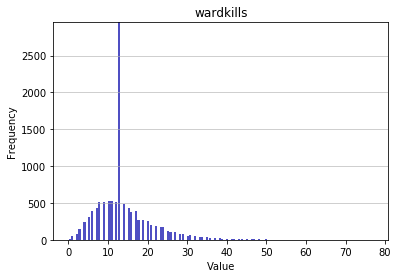

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 14.1104
Standard deviation: 7.3648
Median: 13.0
Maximal value: 77.0


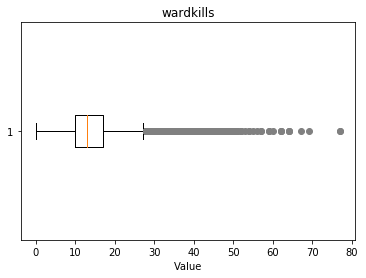

-------------------- 
Outlier detection:
 --------------------
List of outliers: {37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 59.0, 60.0, 62.0, 64.0, 67.0, 69.0, 77.0}


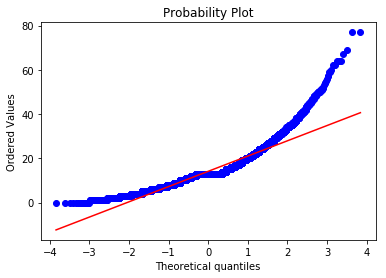

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.7051
Kurtosis: 5.692


   ADC 
Overview of variable:  wardkills 


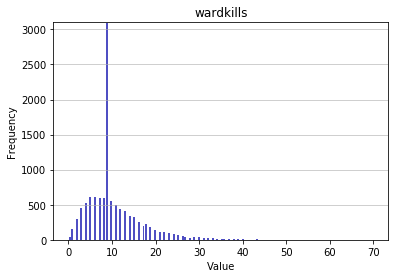

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 10.4964
Standard deviation: 6.4148
Median: 9.0
Maximal value: 70.0


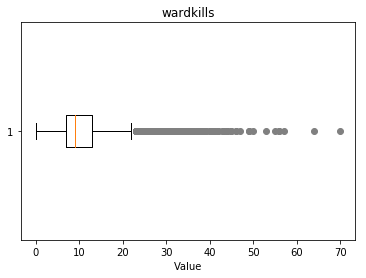

-------------------- 
Outlier detection:
 --------------------
List of outliers: {30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 49.0, 50.0, 53.0, 55.0, 56.0, 57.0, 64.0, 70.0}


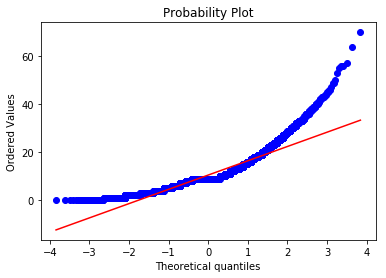

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.7921
Kurtosis: 5.5589


   Support 
Overview of variable:  wardkills 


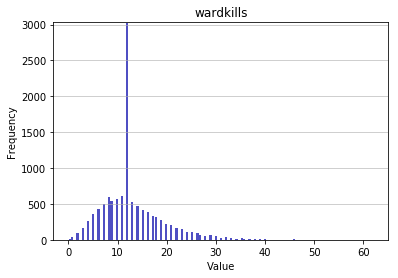

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 12.9362
Standard deviation: 6.176
Median: 12.0
Maximal value: 62.0


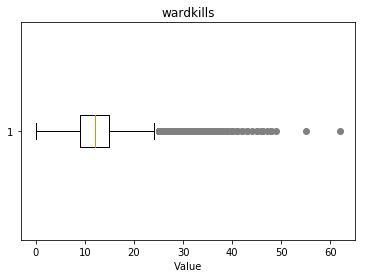

-------------------- 
Outlier detection:
 --------------------
List of outliers: {32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 55.0, 62.0}


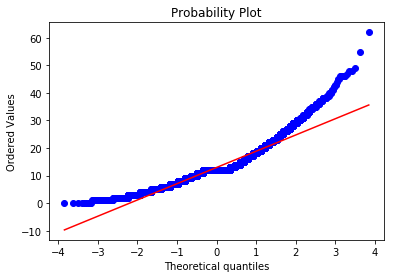

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.2769
Kurtosis: 3.0878


   Top 
Overview of variable:  wcpm 


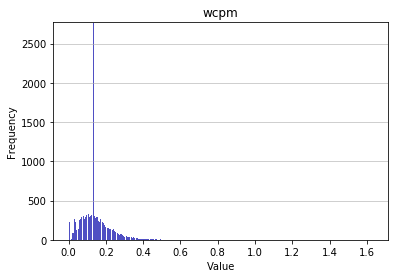

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.1433
Standard deviation: 0.0817
Median: 0.1327
Maximal value: 1.633742658836092


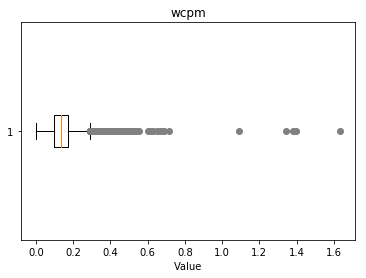

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.45, 0.48, 0.43, 0.42, 0.4, 0.39, 0.47, 1.34, 1.63, 1.38, 1.09, 0.5, 0.67, 0.51, 0.68, 0.6, 0.52, 0.69, 0.44, 0.61, 0.53, 0.71, 0.54, 0.46, 0.63, 0.55, 1.4, 0.65, 0.49, 0.41}


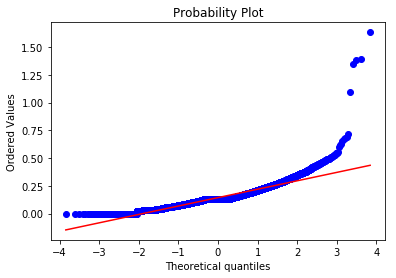

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.6436
Kurtosis: 27.0694


   Middle 
Overview of variable:  wcpm 


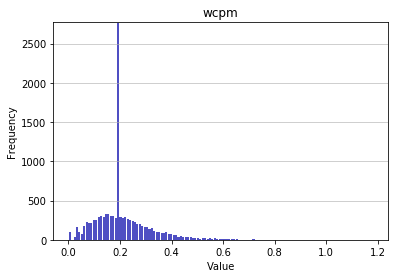

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.2096
Standard deviation: 0.1086
Median: 0.1948
Maximal value: 1.1821239788563191


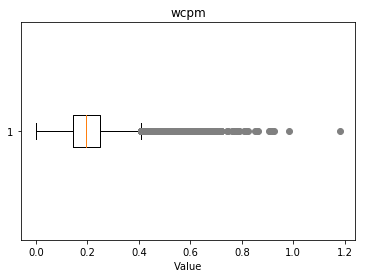

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.59, 0.54, 0.67, 0.62, 0.72, 0.68, 0.57, 0.55, 0.58, 0.83, 0.92, 0.75, 0.76, 1.18, 0.6, 0.93, 0.85, 0.69, 0.77, 0.66, 0.86, 0.61, 0.7, 0.78, 0.71, 0.79, 0.63, 0.64, 0.56, 0.81, 0.98, 0.65, 0.9, 0.74, 0.91}


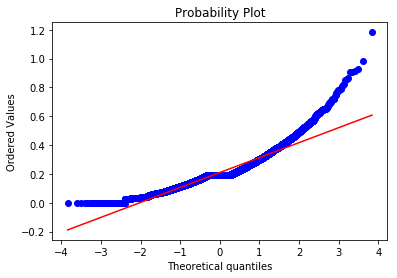

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.3744
Kurtosis: 4.0731


   Jungle 
Overview of variable:  wcpm 


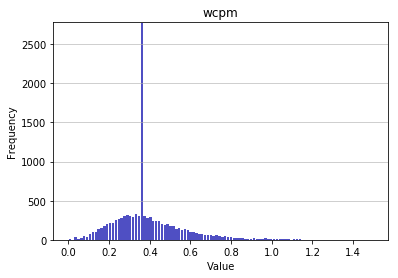

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.3879
Standard deviation: 0.1668
Median: 0.3656
Maximal value: 1.4988814317673378


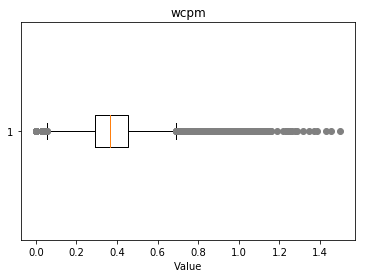

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.95, 0.91, 0.92, 0.93, 0.97, 0.89, 1.07, 1.01, 1.39, 1.03, 1.06, 1.0, 1.08, 1.25, 1.5, 1.09, 1.26, 1.43, 0.94, 1.19, 1.35, 1.1, 1.02, 1.28, 1.11, 1.45, 0.96, 1.12, 1.04, 1.13, 1.29, 1.37, 1.05, 1.14, 1.22, 0.98, 1.23, 1.15, 1.31, 0.9, 0.99, 1.16, 1.24}


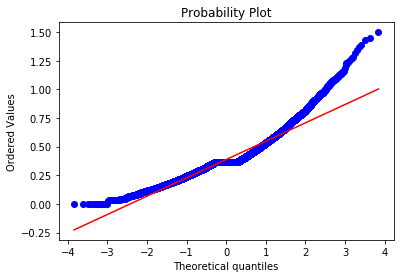

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.2022
Kurtosis: 3.0378


   ADC 
Overview of variable:  wcpm 


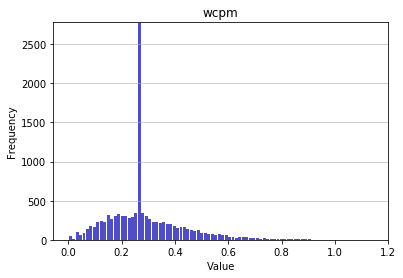

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.2895
Standard deviation: 0.1442
Median: 0.2696
Maximal value: 1.1436950146627565


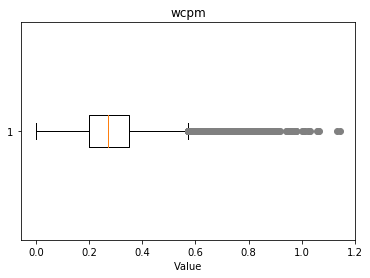

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.84, 0.75, 0.76, 0.87, 0.74, 0.83, 0.73, 0.95, 0.86, 0.82, 0.92, 1.0, 1.01, 0.85, 0.94, 0.77, 1.02, 0.78, 1.03, 0.96, 0.79, 1.13, 0.88, 0.8, 0.97, 0.72, 1.14, 0.89, 0.98, 0.81, 1.06, 0.9, 1.07, 0.91}


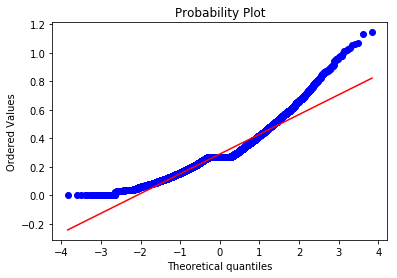

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.152
Kurtosis: 2.4465


   Support 
Overview of variable:  wcpm 


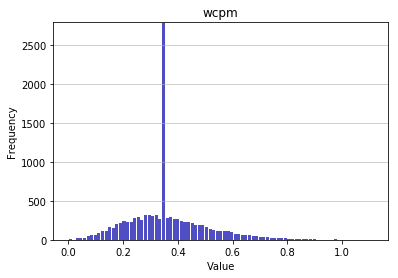

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.3597
Standard deviation: 0.1417
Median: 0.3459
Maximal value: 1.113861386138614


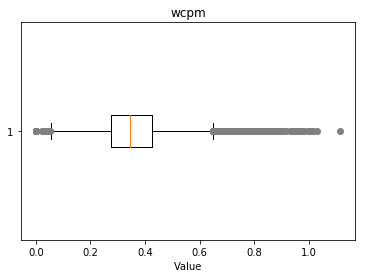

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.8, 0.95, 0.82, 1.0, 0.98, 0.89, 0.97, 0.79, 0.94, 1.03, 0.84, 0.92, 1.01, 0.85, 0.93, 1.02, 0.86, 1.11, 0.87, 0.96, 0.88, 0.81, 0.9, 0.83}


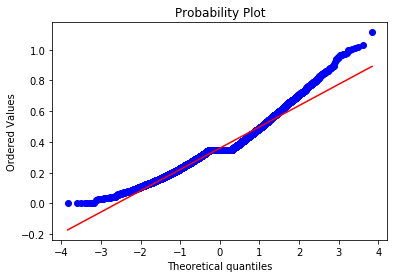

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7533
Kurtosis: 1.3179


   Top 
Overview of variable:  visionwards 


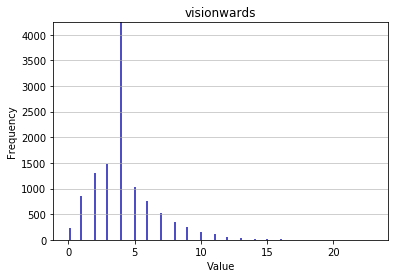

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 4.195
Standard deviation: 2.315
Median: 4.0
Maximal value: 23.0


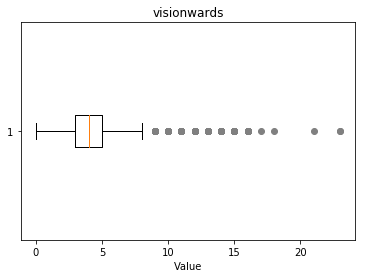

-------------------- 
Outlier detection:
 --------------------
List of outliers: {12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 21.0, 23.0}


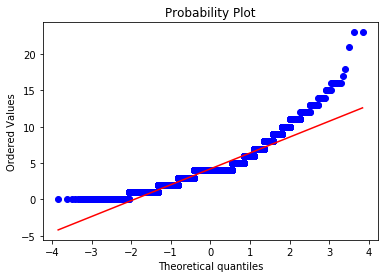

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.2943
Kurtosis: 3.3972


   Middle 
Overview of variable:  visionwards 


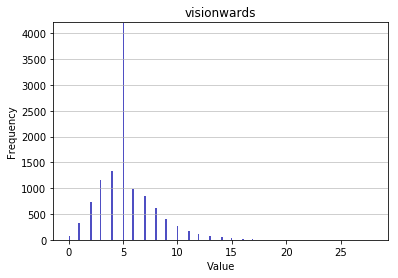

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 5.3146
Standard deviation: 2.5081
Median: 5.0
Maximal value: 28.0


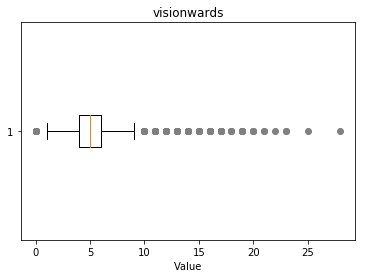

-------------------- 
Outlier detection:
 --------------------
List of outliers: {13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 25.0, 28.0}


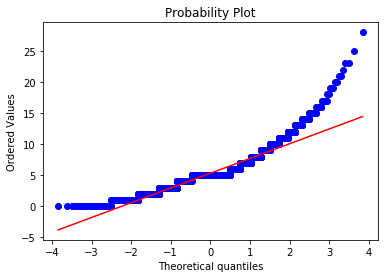

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.3321
Kurtosis: 4.2348


   Jungle 
Overview of variable:  visionwards 


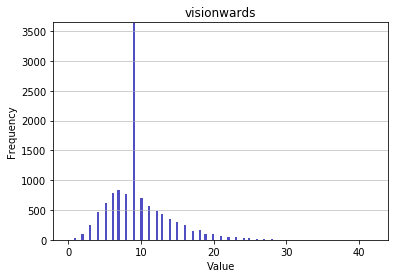

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 9.6134
Standard deviation: 4.1415
Median: 9.0
Maximal value: 42.0


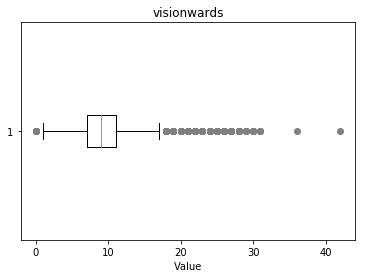

-------------------- 
Outlier detection:
 --------------------
List of outliers: {36.0, 42.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0}


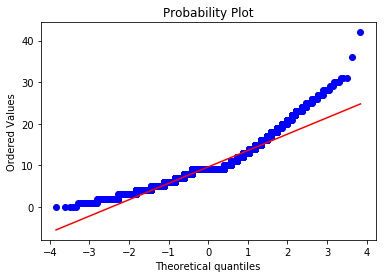

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.2366
Kurtosis: 2.7376


   ADC 
Overview of variable:  visionwards 


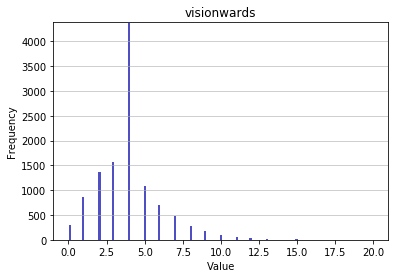

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 3.9433
Standard deviation: 2.0564
Median: 4.0
Maximal value: 20.0


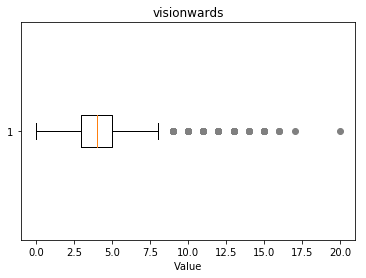

-------------------- 
Outlier detection:
 --------------------
List of outliers: {11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 20.0}


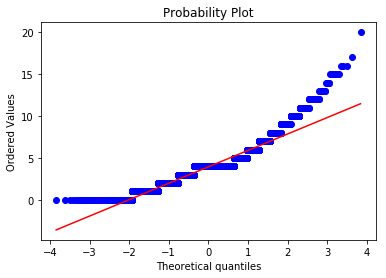

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.052
Kurtosis: 2.9524


   Support 
Overview of variable:  visionwards 


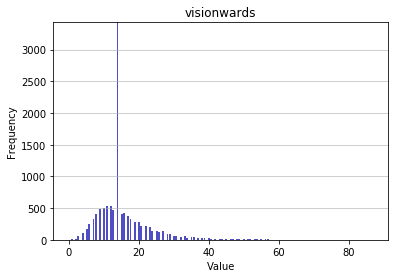

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 15.6941
Standard deviation: 7.9529
Median: 14.0
Maximal value: 87.0


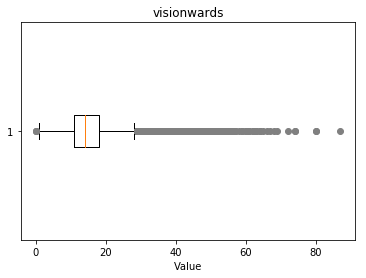

-------------------- 
Outlier detection:
 --------------------
List of outliers: {40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 63.0, 64.0, 65.0, 66.0, 67.0, 68.0, 69.0, 72.0, 74.0, 80.0, 87.0}


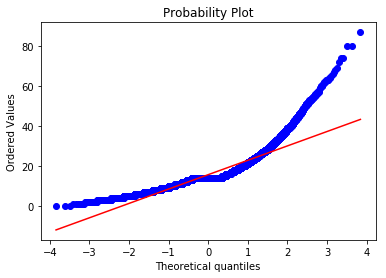

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.1576
Kurtosis: 7.7467


   Top 
Overview of variable:  visionwardbuys 


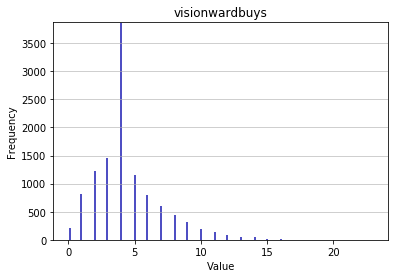

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 4.41
Standard deviation: 2.4997
Median: 4.0
Maximal value: 23.0


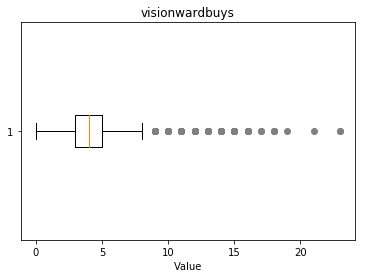

-------------------- 
Outlier detection:
 --------------------
List of outliers: {12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 21.0, 23.0}


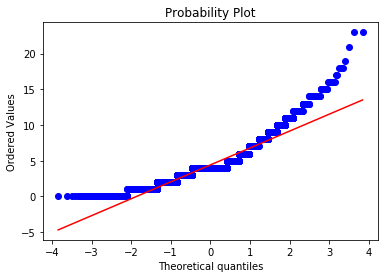

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.2749
Kurtosis: 2.8847


   Middle 
Overview of variable:  visionwardbuys 


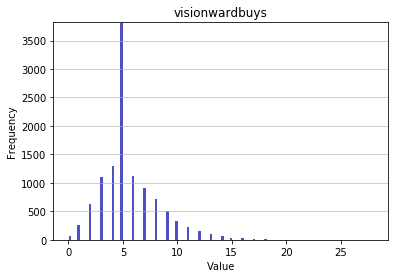

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 5.6135
Standard deviation: 2.6856
Median: 5.0
Maximal value: 28.0


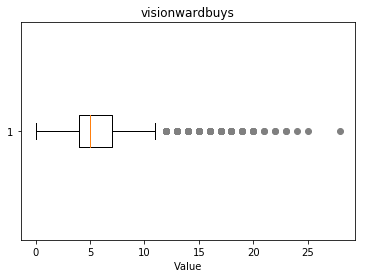

-------------------- 
Outlier detection:
 --------------------
List of outliers: {14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 28.0}


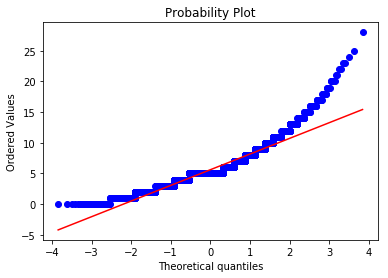

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.3101
Kurtosis: 3.5955


   Jungle 
Overview of variable:  visionwardbuys 


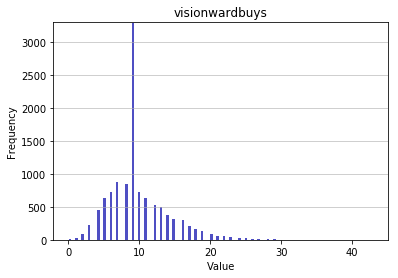

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 9.8061
Standard deviation: 4.233
Median: 9.0
Maximal value: 43.0


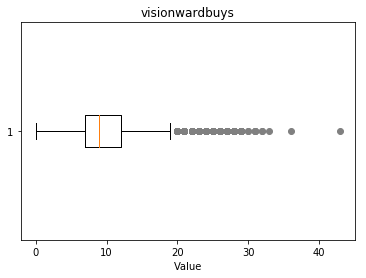

-------------------- 
Outlier detection:
 --------------------
List of outliers: {32.0, 33.0, 36.0, 43.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0}


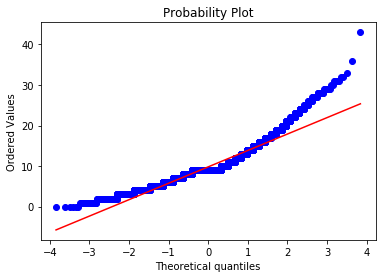

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.2192
Kurtosis: 2.6791


   ADC 
Overview of variable:  visionwardbuys 


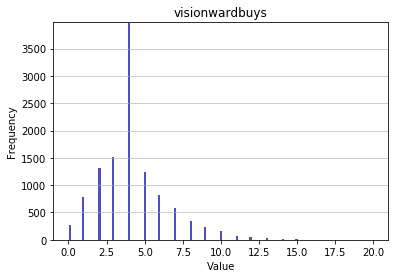

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 4.175
Standard deviation: 2.2321
Median: 4.0
Maximal value: 20.0


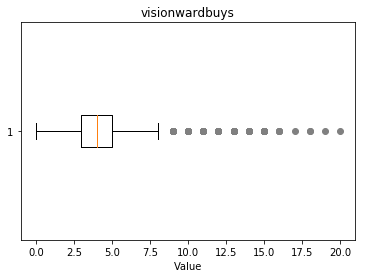

-------------------- 
Outlier detection:
 --------------------
List of outliers: {11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0}


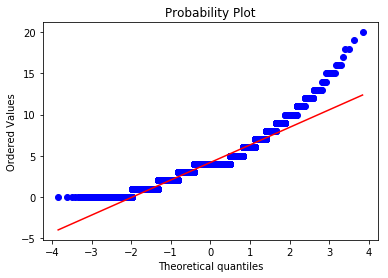

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.0992
Kurtosis: 2.6927


   Support 
Overview of variable:  visionwardbuys 


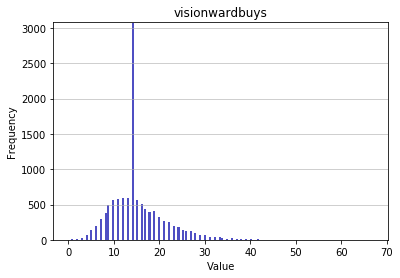

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 15.1127
Standard deviation: 5.9483
Median: 14.0
Maximal value: 67.0


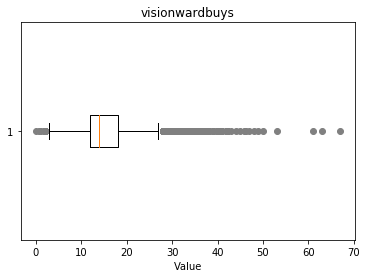

-------------------- 
Outlier detection:
 --------------------
List of outliers: {33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 53.0, 61.0, 63.0, 67.0}


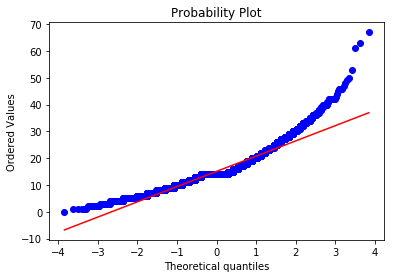

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.2848
Kurtosis: 3.5521


   Top 
Overview of variable:  totalgold 


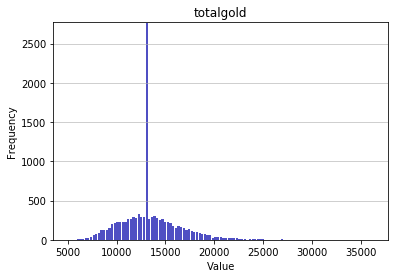

-------------------- 
Summary statistics:
 --------------------
Minimum value: 5080.0
Mean: 13455.8746
Standard deviation: 3026.0353
Median: 13194.0
Maximal value: 36258.0


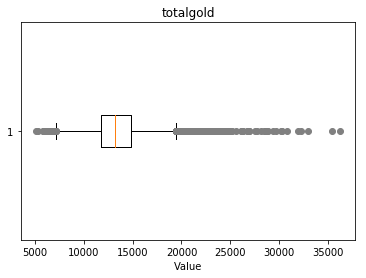

-------------------- 
Outlier detection:
 --------------------
List of outliers: {23554.0, 24069.0, 24074.0, 30224.0, 28694.0, 24600.0, 25121.0, 32290.0, 25635.0, 22566.0, 22570.0, 23596.0, 26164.0, 26680.0, 23609.0, 25145.0, 23611.0, 23103.0, 24639.0, 23110.0, 24134.0, 23121.0, 28757.0, 27737.0, 23131.0, 23132.0, 22621.0, 35424.0, 24162.0, 22627.0, 24164.0, 23653.0, 23654.0, 26215.0, 23145.0, 30317.0, 30841.0, 24697.0, 23682.0, 23685.0, 23173.0, 23189.0, 24216.0, 23193.0, 24737.0, 26795.0, 22703.0, 24754.0, 29367.0, 24255.0, 32961.0, 24257.0, 31939.0, 28878.0, 24276.0, 22754.0, 26852.0, 24293.0, 24303.0, 26355.0, 26874.0, 24837.0, 24838.0, 26887.0, 23821.0, 28431.0, 24336.0, 22801.0, 26905.0, 24352.0, 22822.0, 23338.0, 23857.0, 24374.0, 24920.0, 24415.0, 22892.0, 22896.0, 23928.0, 22908.0, 22916.0, 22918.0, 23430.0, 27528.0, 24457.0, 23956.0, 36258.0, 25004.0, 22958.0, 23987.0, 25018.0, 29636.0, 22982.0, 23495.0, 28106.0, 24019.0, 23517.0, 26087.0, 23530.0, 23020.0, 23532.0, 28656.0, 

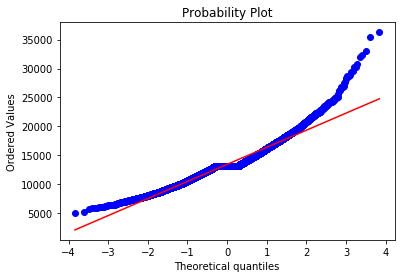

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.9079
Kurtosis: 2.5815


   Middle 
Overview of variable:  totalgold 


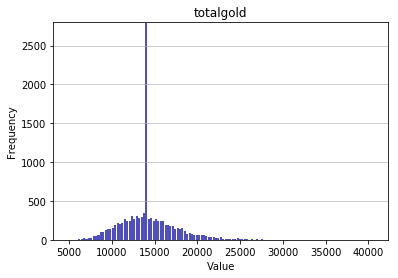

-------------------- 
Summary statistics:
 --------------------
Minimum value: 4911.0
Mean: 14235.3433
Standard deviation: 3173.2954
Median: 13946.0
Maximal value: 40574.0


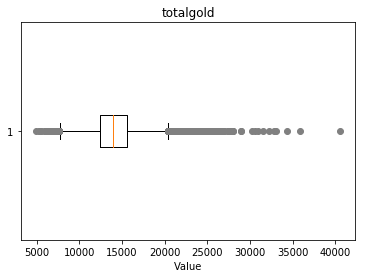

-------------------- 
Outlier detection:
 --------------------
List of outliers: {25088.0, 25604.0, 34314.0, 24586.0, 24594.0, 24595.0, 35860.0, 24603.0, 32805.0, 24102.0, 25139.0, 24117.0, 25151.0, 30276.0, 25159.0, 24650.0, 24140.0, 25167.0, 24666.0, 24163.0, 25187.0, 24677.0, 26747.0, 25726.0, 26238.0, 40574.0, 24705.0, 24197.0, 24204.0, 24716.0, 25233.0, 24729.0, 26266.0, 27303.0, 24746.0, 24748.0, 24241.0, 26290.0, 24761.0, 26821.0, 24777.0, 23757.0, 24785.0, 26323.0, 23773.0, 24289.0, 24291.0, 25835.0, 33005.0, 23790.0, 26863.0, 23798.0, 24314.0, 26878.0, 25342.0, 27912.0, 24840.0, 26387.0, 30998.0, 25372.0, 23837.0, 24351.0, 25888.0, 25378.0, 23851.0, 28972.0, 24366.0, 24371.0, 28979.0, 25910.0, 27959.0, 24378.0, 25403.0, 23871.0, 24384.0, 26436.0, 24396.0, 31565.0, 26451.0, 26963.0, 25427.0, 24407.0, 27992.0, 25435.0, 25436.0, 25952.0, 24932.0, 25444.0, 24423.0, 23912.0, 25964.0, 30576.0, 25968.0, 27507.0, 24952.0, 26492.0, 25474.0, 27528.0, 26004.0, 23961.0, 23970.0, 26532.0, 

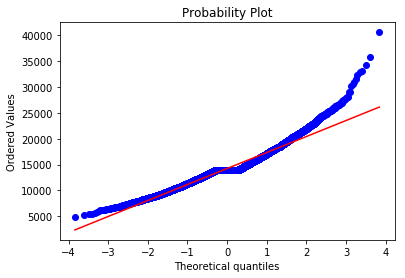

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.8546
Kurtosis: 2.4118


   Jungle 
Overview of variable:  totalgold 


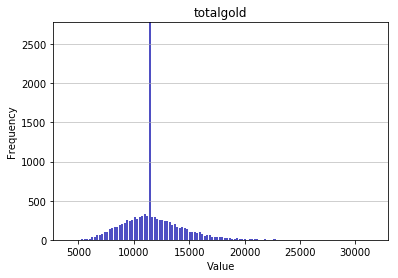

-------------------- 
Summary statistics:
 --------------------
Minimum value: 4104.0
Mean: 11714.1852
Standard deviation: 2553.1288
Median: 11490.5
Maximal value: 31614.0


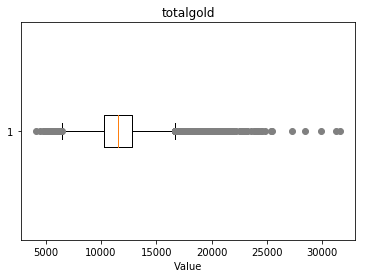

-------------------- 
Outlier detection:
 --------------------
List of outliers: {19459.0, 19463.0, 19465.0, 20490.0, 21515.0, 22030.0, 21519.0, 22545.0, 23570.0, 31258.0, 19997.0, 22562.0, 20523.0, 19503.0, 19504.0, 23088.0, 21044.0, 20024.0, 20025.0, 20541.0, 20031.0, 20039.0, 20040.0, 19529.0, 22611.0, 20052.0, 20565.0, 19542.0, 22621.0, 20579.0, 24165.0, 20074.0, 20588.0, 23150.0, 19568.0, 20986.0, 21109.0, 19574.0, 22645.0, 20601.0, 20090.0, 21113.0, 20603.0, 21632.0, 20097.0, 24193.0, 19600.0, 22167.0, 27294.0, 20129.0, 22694.0, 21161.0, 19625.0, 20665.0, 23228.0, 21199.0, 20688.0, 20178.0, 20701.0, 29918.0, 19685.0, 20710.0, 25321.0, 24817.0, 19701.0, 19703.0, 19705.0, 22782.0, 21769.0, 20754.0, 19731.0, 20761.0, 20256.0, 21798.0, 28459.0, 20783.0, 21811.0, 23863.0, 20791.0, 20793.0, 20794.0, 19777.0, 22852.0, 20823.0, 21857.0, 20833.0, 20837.0, 19818.0, 21362.0, 20341.0, 31614.0, 25472.0, 21890.0, 23940.0, 24454.0, 19853.0, 20878.0, 20882.0, 20895.0, 19893.0, 23990.0, 19385.0, 

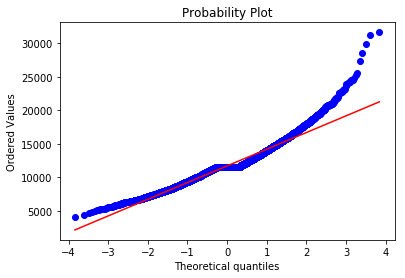

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.9189
Kurtosis: 2.7436


   ADC 
Overview of variable:  totalgold 


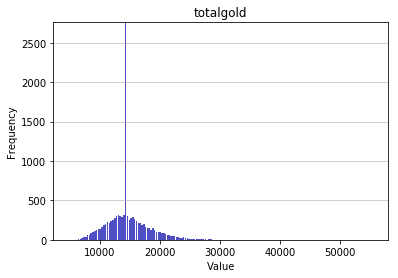

-------------------- 
Summary statistics:
 --------------------
Minimum value: 4752.0
Mean: 14752.0587
Standard deviation: 3520.5952
Median: 14417.0
Maximal value: 55539.0


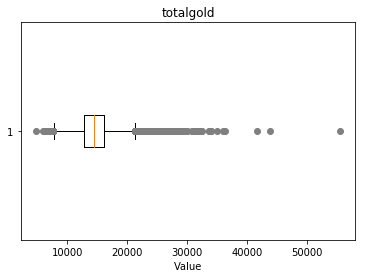

-------------------- 
Outlier detection:
 --------------------
List of outliers: {26122.0, 26125.0, 28696.0, 25629.0, 26147.0, 30760.0, 28205.0, 31796.0, 27701.0, 26174.0, 28222.0, 28224.0, 29257.0, 25676.0, 25678.0, 25679.0, 35923.0, 28247.0, 26202.0, 27226.0, 28253.0, 31338.0, 27755.0, 25712.0, 31348.0, 26747.0, 26237.0, 29821.0, 30864.0, 34963.0, 28316.0, 28339.0, 27342.0, 26320.0, 26836.0, 27862.0, 27352.0, 41690.0, 28898.0, 30951.0, 34025.0, 25324.0, 25839.0, 55539.0, 25844.0, 25846.0, 26358.0, 34041.0, 29436.0, 27390.0, 25346.0, 32520.0, 26379.0, 29963.0, 32015.0, 25361.0, 25874.0, 25875.0, 29971.0, 25877.0, 26394.0, 25375.0, 43808.0, 31521.0, 25376.0, 25891.0, 25387.0, 25900.0, 32045.0, 27441.0, 25396.0, 25409.0, 25411.0, 25413.0, 29510.0, 28488.0, 31563.0, 27472.0, 28496.0, 25428.0, 33624.0, 25443.0, 26987.0, 29052.0, 26496.0, 33666.0, 27010.0, 25476.0, 29574.0, 27015.0, 26000.0, 28051.0, 28054.0, 31644.0, 27550.0, 28574.0, 26538.0, 27565.0, 28594.0, 31172.0, 29637.0, 26584.0, 

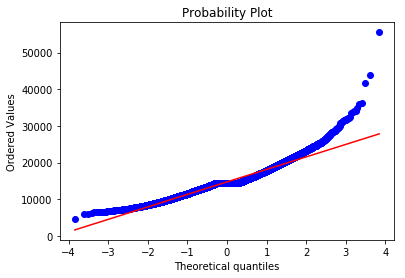

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.0745
Kurtosis: 4.2713


   Support 
Overview of variable:  totalgold 


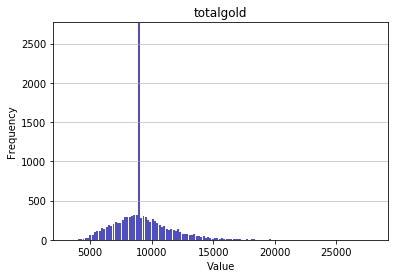

-------------------- 
Summary statistics:
 --------------------
Minimum value: 3243.0
Mean: 9219.5693
Standard deviation: 2197.7669
Median: 8998.5
Maximal value: 27981.0


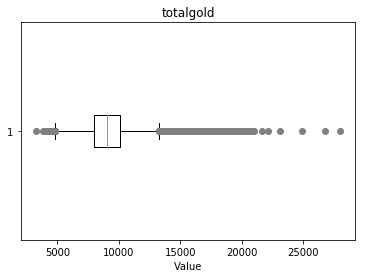

-------------------- 
Outlier detection:
 --------------------
List of outliers: {15872.0, 16897.0, 19458.0, 20993.0, 15877.0, 16905.0, 16396.0, 16909.0, 15895.0, 23065.0, 17947.0, 18462.0, 16935.0, 20521.0, 15914.0, 18477.0, 16439.0, 15932.0, 20029.0, 15939.0, 16968.0, 16969.0, 19020.0, 15963.0, 16479.0, 26727.0, 17006.0, 21617.0, 17010.0, 18036.0, 16508.0, 17021.0, 17022.0, 15998.0, 16518.0, 22152.0, 17038.0, 19599.0, 17043.0, 16021.0, 16533.0, 16539.0, 19612.0, 16541.0, 20127.0, 16546.0, 16040.0, 16555.0, 16556.0, 16045.0, 19124.0, 17592.0, 16062.0, 16577.0, 19652.0, 16074.0, 16077.0, 20688.0, 19158.0, 16090.0, 17628.0, 16604.0, 17121.0, 16612.0, 17126.0, 20200.0, 16106.0, 17143.0, 16635.0, 16637.0, 16128.0, 17158.0, 17670.0, 18185.0, 17674.0, 18193.0, 19730.0, 17682.0, 17171.0, 17690.0, 18207.0, 16161.0, 16679.0, 17703.0, 16170.0, 18224.0, 16183.0, 17722.0, 18748.0, 16189.0, 16196.0, 24902.0, 18246.0, 27981.0, 19279.0, 17239.0, 19287.0, 16217.0, 20315.0, 16733.0, 17760.0, 17764.0, 

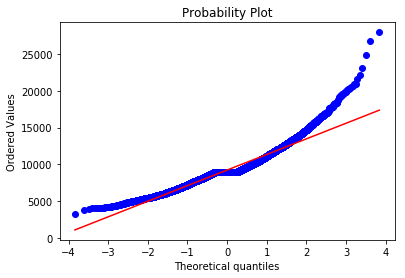

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.0947
Kurtosis: 3.3781


   Top 
Overview of variable:  earnedgpm 


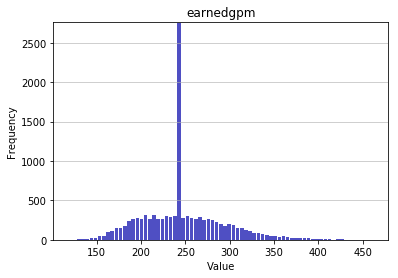

-------------------- 
Summary statistics:
 --------------------
Minimum value: 118.11464435146443
Mean: 248.0359
Standard deviation: 46.3618
Median: 244.68
Maximal value: 461.9096410978184


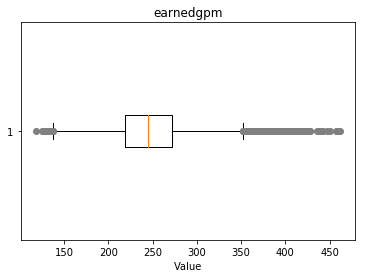

-------------------- 
Outlier detection:
 --------------------
List of outliers: {387.54, 388.51, 389.54, 390.1, 391.11, 392.25, 393.37, 394.74, 390.41, 390.24, 397.72, 397.16, 399.71, 400.46, 400.89, 402.97, 402.72, 403.54, 405.11, 405.74, 406.62, 408.49, 406.42, 410.11, 409.86, 411.01, 413.52, 406.09, 411.0, 416.04, 388.86, 418.67, 388.7, 420.96, 421.89, 389.43, 423.1, 423.45, 425.33, 426.0, 427.76, 390.58, 420.47, 388.73, 424.39, 391.51, 391.15, 390.39, 435.44, 428.24, 437.46, 392.42, 439.89, 437.78, 441.54, 442.56, 446.7, 394.23, 389.94, 450.45, 395.59, 396.88, 457.67, 459.49, 396.96, 461.91, 397.25, 396.51, 396.04, 415.18, 398.73, 399.96, 399.16, 399.56, 390.57, 400.7, 400.42, 401.63, 413.3, 403.91, 388.77}


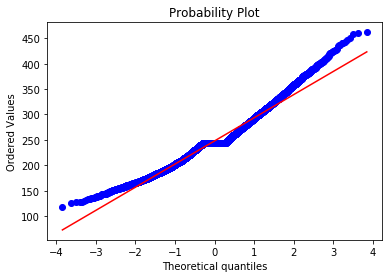

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.5854
Kurtosis: 0.8095


   Middle 
Overview of variable:  earnedgpm 


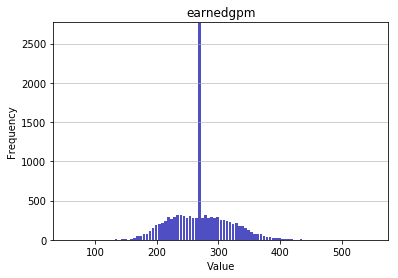

-------------------- 
Summary statistics:
 --------------------
Minimum value: 56.9050847457627
Mean: 270.4388
Standard deviation: 46.4875
Median: 269.0345
Maximal value: 551.0021131137353


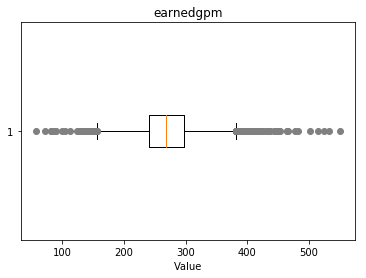

-------------------- 
Outlier detection:
 --------------------
List of outliers: {128.86, 128.02, 128.37, 515.38, 524.6, 532.54, 411.14, 411.94, 413.96, 414.06, 411.58, 416.2, 417.34, 418.95, 419.68, 420.88, 419.82, 422.78, 420.33, 424.55, 419.55, 417.86, 551.0, 415.58, 415.31, 430.02, 426.13, 432.96, 415.59, 434.66, 434.09, 435.22, 436.69, 437.67, 416.1, 56.91, 443.35, 419.62, 446.37, 448.64, 452.42, 454.11, 72.08, 464.26, 465.75, 81.65, 82.32, 465.2, 86.7, 90.25, 477.86, 481.89, 99.37, 104.82, 112.82, 502.73, 124.55}


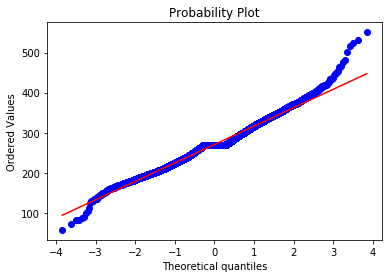

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.3093
Kurtosis: 0.823


   Jungle 
Overview of variable:  earnedgpm 


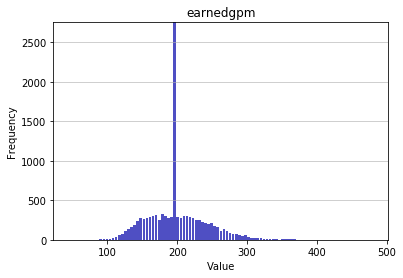

-------------------- 
Summary statistics:
 --------------------
Minimum value: 44.364815970056135
Mean: 200.1832
Standard deviation: 42.916
Median: 197.6646
Maximal value: 480.5052631578948


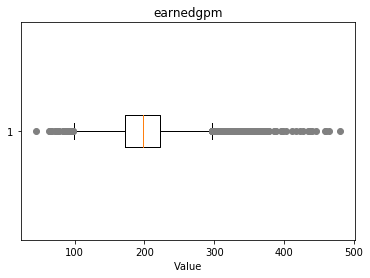

-------------------- 
Outlier detection:
 --------------------
List of outliers: {44.36, 62.99, 64.56, 64.34, 68.21, 330.11, 330.3, 333.66, 334.64, 334.96, 335.09, 336.1, 338.48, 338.79, 338.11, 340.3, 341.57, 350.21, 352.36, 353.92, 355.93, 361.22, 362.95, 329.46, 329.07, 331.49, 331.41, 333.39, 333.45, 335.85, 330.53, 331.28, 331.21, 332.03, 332.99, 332.95, 342.17, 343.4, 343.07, 345.56, 337.32, 347.58, 348.84, 341.77, 350.04, 345.2, 348.85, 348.37, 349.12, 351.22, 350.11, 353.97, 353.3, 355.31, 357.1, 358.84, 358.4, 358.21, 361.72, 362.09, 363.3, 361.43, 362.51, 366.89, 367.07, 368.42, 369.88, 370.43, 372.55, 374.13, 376.73, 377.59, 378.31, 386.26, 387.8, 389.02, 396.63, 396.0, 398.8, 402.45, 412.01, 417.12, 422.94, 427.49, 433.77, 437.96, 440.71, 445.28, 458.63, 460.86, 464.18, 480.51}


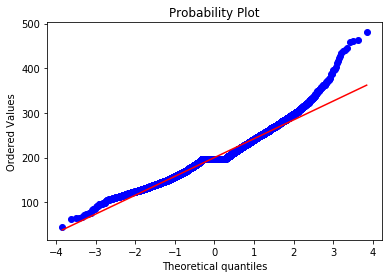

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.6787
Kurtosis: 1.7618


   ADC 
Overview of variable:  earnedgpm 


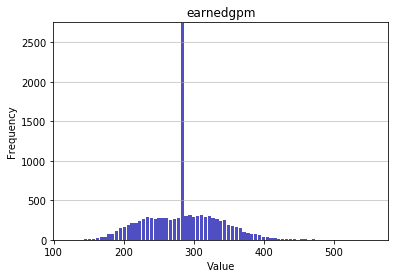

-------------------- 
Summary statistics:
 --------------------
Minimum value: 121.1670436187399
Mean: 284.5058
Standard deviation: 50.3465
Median: 284.9687
Maximal value: 556.5442484121382


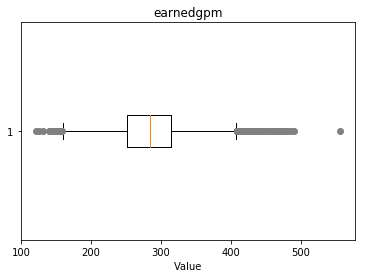

-------------------- 
Outlier detection:
 --------------------
List of outliers: {131.45, 556.54, 436.73, 437.0, 436.26, 439.79, 442.72, 443.39, 444.17, 445.33, 442.17, 447.46, 442.82, 442.8, 451.92, 452.94, 455.83, 456.41, 456.2, 458.25, 459.65, 460.44, 461.37, 460.05, 460.32, 457.96, 465.94, 462.61, 461.71, 468.84, 469.49, 471.06, 472.88, 476.2, 479.68, 482.52, 486.33, 490.19, 455.54, 455.07, 121.17, 126.43}


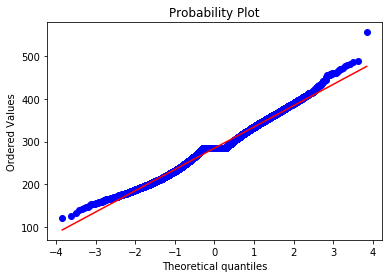

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.1647
Kurtosis: 0.2784


   Support 
Overview of variable:  earnedgpm 


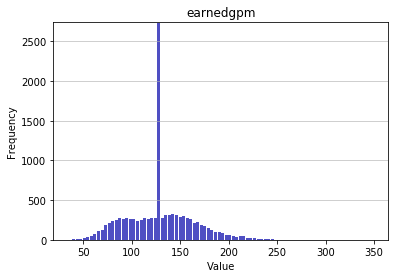

-------------------- 
Summary statistics:
 --------------------
Minimum value: 34.81763470958712
Mean: 129.5332
Standard deviation: 34.3261
Median: 129.4613
Maximal value: 349.17311320754715


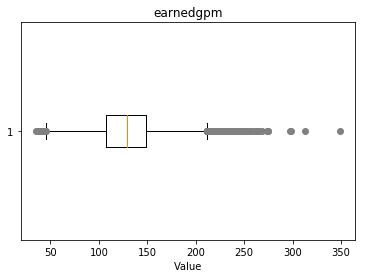

-------------------- 
Outlier detection:
 --------------------
List of outliers: {258.0, 261.53, 262.85, 263.05, 265.11, 268.29, 273.35, 274.71, 275.0, 250.24, 234.71, 234.54, 235.65, 235.05, 297.39, 298.49, 251.57, 240.81, 312.65, 241.36, 241.71, 242.17, 349.17, 249.61, 232.88, 233.91, 234.03, 232.69, 233.25, 236.06, 238.79, 237.07, 238.22, 238.99, 242.14, 243.63, 244.54, 245.38, 246.61, 246.42, 246.39, 245.06, 250.98, 245.82, 254.89, 255.9}


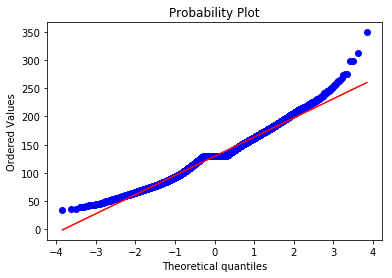

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.323
Kurtosis: 0.5869


   Top 
Overview of variable:  goldspent 


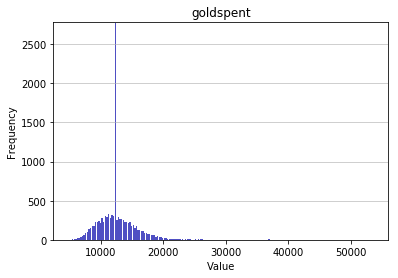

-------------------- 
Summary statistics:
 --------------------
Minimum value: 4825.0
Mean: 12652.6352
Standard deviation: 3078.4072
Median: 12325.0
Maximal value: 53580.0


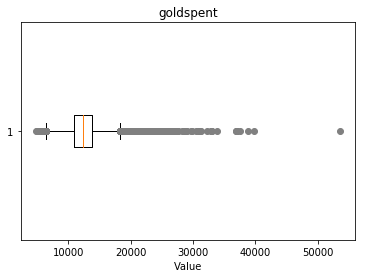

-------------------- 
Outlier detection:
 --------------------
List of outliers: {23040.0, 24578.0, 24075.0, 25100.0, 24078.0, 24083.0, 23575.0, 22558.0, 25630.0, 23075.0, 28708.0, 24100.0, 26150.0, 25660.0, 36925.0, 28225.0, 31300.0, 24138.0, 23633.0, 22610.0, 33875.0, 22100.0, 37458.0, 26200.0, 27225.0, 26208.0, 23650.0, 23658.0, 32875.0, 24683.0, 22125.0, 22130.0, 36983.0, 25208.0, 28795.0, 25215.0, 32898.0, 23683.0, 23685.0, 22150.0, 37000.0, 30865.0, 24213.0, 26775.0, 29850.0, 22170.0, 22175.0, 23200.0, 24225.0, 22183.0, 22708.0, 23733.0, 22200.0, 24250.0, 22715.0, 26300.0, 27325.0, 22725.0, 27338.0, 28875.0, 23758.0, 26833.0, 22225.0, 22738.0, 22233.0, 25318.0, 25833.0, 30448.0, 26358.0, 25858.0, 25860.0, 24325.0, 27408.0, 23828.0, 22300.0, 22310.0, 23850.0, 22833.0, 23858.0, 23358.0, 25925.0, 33100.0, 53580.0, 24910.0, 22875.0, 22363.0, 22395.0, 24445.0, 39805.0, 24450.0, 25990.0, 25478.0, 23945.0, 21900.0, 22925.0, 38796.0, 27540.0, 21908.0, 24983.0, 24473.0, 28570.0, 29083.0, 

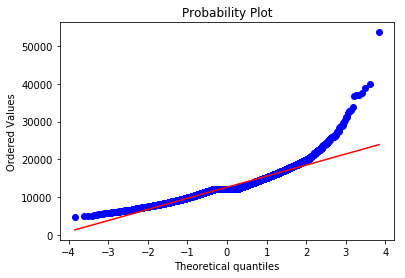

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.5912
Kurtosis: 8.4093


   Middle 
Overview of variable:  goldspent 


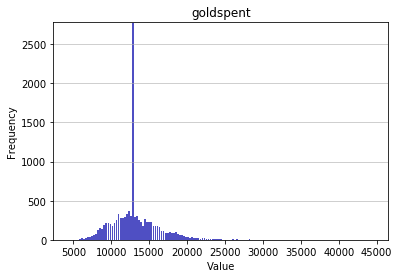

-------------------- 
Summary statistics:
 --------------------
Minimum value: 4375.0
Mean: 13133.1941
Standard deviation: 3087.618
Median: 12800.0
Maximal value: 44535.0


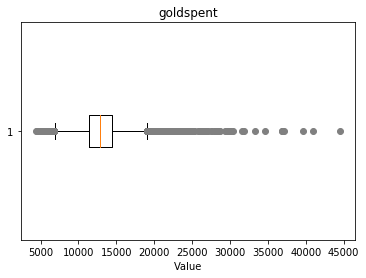

-------------------- 
Outlier detection:
 --------------------
List of outliers: {26625.0, 27655.0, 23050.0, 26125.0, 22550.0, 26150.0, 28200.0, 23080.0, 23608.0, 28220.0, 24125.0, 23105.0, 23110.0, 23625.0, 24137.0, 33355.0, 23125.0, 24158.0, 28258.0, 28260.0, 22633.0, 26218.0, 29803.0, 29290.0, 26733.0, 23150.0, 22650.0, 24700.0, 25725.0, 23678.0, 26750.0, 24703.0, 29825.0, 22658.0, 23175.0, 25225.0, 26250.0, 31885.0, 23185.0, 24210.0, 24725.0, 23200.0, 25250.0, 25258.0, 23725.0, 30415.0, 23250.0, 23775.0, 39655.0, 26358.0, 22775.0, 23808.0, 24325.0, 34575.0, 22808.0, 24350.0, 24870.0, 23850.0, 22830.0, 24375.0, 24380.0, 37180.0, 27975.0, 25930.0, 22860.0, 26958.0, 23375.0, 23895.0, 22875.0, 23900.0, 27485.0, 24420.0, 31590.0, 23925.0, 29558.0, 24950.0, 22400.0, 23425.0, 28550.0, 22925.0, 24470.0, 22425.0, 24480.0, 24483.0, 28070.0, 26025.0, 23983.0, 23985.0, 26550.0, 24510.0, 36800.0, 26050.0, 22980.0, 22475.0, 23500.0, 26575.0, 27090.0, 22995.0, 28628.0, 24533.0, 36825.0, 30175.0, 

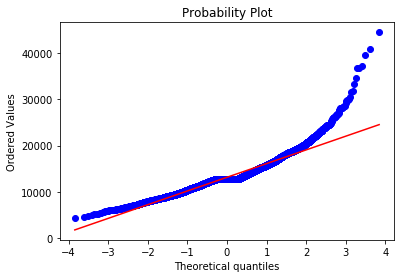

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.2738
Kurtosis: 5.3121


   Jungle 
Overview of variable:  goldspent 


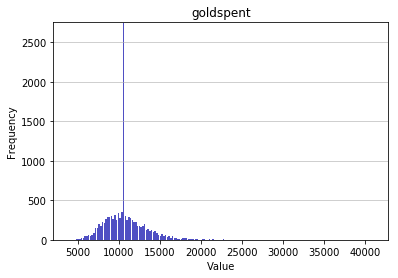

-------------------- 
Summary statistics:
 --------------------
Minimum value: 3900.0
Mean: 10804.4673
Standard deviation: 2508.1991
Median: 10525.0
Maximal value: 40975.0


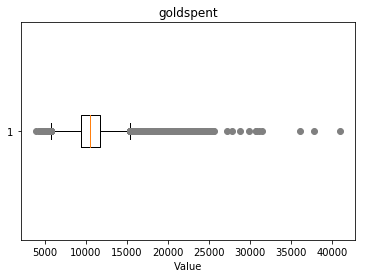

-------------------- 
Outlier detection:
 --------------------
List of outliers: {18435.0, 21000.0, 40975.0, 18450.0, 22560.0, 21025.0, 27175.0, 18475.0, 23600.0, 30770.0, 19510.0, 20025.0, 25662.0, 24130.0, 28742.0, 19025.0, 24150.0, 19550.0, 20575.0, 23650.0, 21095.0, 19050.0, 20075.0, 21100.0, 25200.0, 18545.0, 21105.0, 18550.0, 19075.0, 22660.0, 21125.0, 20100.0, 23175.0, 21500.0, 18575.0, 21650.0, 24725.0, 27800.0, 19100.0, 20125.0, 25255.0, 18600.0, 20650.0, 22200.0, 29880.0, 19128.0, 18625.0, 19650.0, 21700.0, 21210.0, 20700.0, 23270.0, 22250.0, 36080.0, 19185.0, 18675.0, 19700.0, 22775.0, 22783.0, 20225.0, 25347.0, 18695.0, 31495.0, 19208.0, 19225.0, 22825.0, 21300.0, 22325.0, 19255.0, 22850.0, 19275.0, 20300.0, 23905.0, 21865.0, 18800.0, 31090.0, 22900.0, 19325.0, 21375.0, 24960.0, 18825.0, 18835.0, 20375.0, 21400.0, 22425.0, 30713.0, 24480.0, 20385.0, 18850.0, 19875.0, 23462.0, 18345.0, 18350.0, 19375.0, 20400.0, 21940.0, 25525.0, 19895.0, 18360.0, 18875.0, 37830.0, 18375.0, 

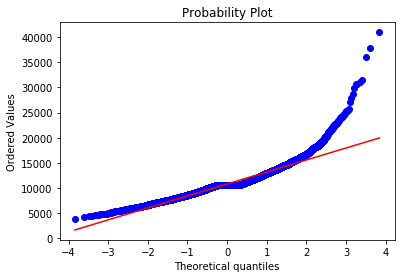

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.6562
Kurtosis: 8.7396


   ADC 
Overview of variable:  goldspent 


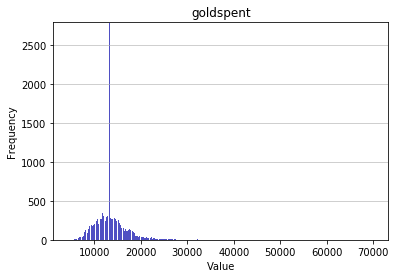

-------------------- 
Summary statistics:
 --------------------
Minimum value: 4450.0
Mean: 13482.0332
Standard deviation: 3412.8095
Median: 13125.0
Maximal value: 70001.0


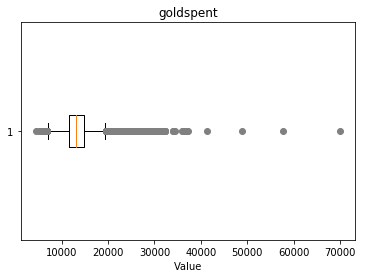

-------------------- 
Outlier detection:
 --------------------
List of outliers: {25600.0, 29186.0, 26120.0, 26633.0, 24595.0, 26643.0, 27158.0, 24600.0, 25625.0, 32283.0, 27165.0, 30750.0, 31775.0, 24615.0, 24625.0, 24628.0, 28215.0, 35900.0, 24125.0, 31810.0, 24658.0, 31320.0, 28270.0, 24175.0, 25200.0, 24690.0, 27258.0, 24700.0, 25725.0, 29825.0, 25735.0, 27275.0, 24720.0, 25745.0, 37008.0, 31400.0, 25770.0, 24750.0, 24250.0, 25275.0, 23740.0, 25790.0, 23750.0, 27850.0, 26830.0, 34000.0, 25300.0, 24280.0, 34520.0, 24795.0, 25308.0, 26845.0, 27870.0, 24800.0, 27875.0, 34020.0, 25325.0, 31473.0, 23800.0, 25848.0, 25850.0, 29445.0, 25365.0, 23833.0, 24350.0, 25375.0, 26400.0, 23845.0, 36134.0, 26408.0, 48941.0, 25390.0, 27450.0, 23870.0, 26950.0, 27975.0, 23880.0, 31560.0, 30538.0, 24395.0, 24908.0, 25933.0, 23900.0, 30050.0, 23908.0, 24425.0, 25450.0, 26475.0, 70001.0, 27508.0, 24950.0, 31100.0, 41340.0, 29568.0, 28545.0, 23938.0, 36745.0, 24460.0, 28045.0, 57740.0, 30608.0, 27025.0, 

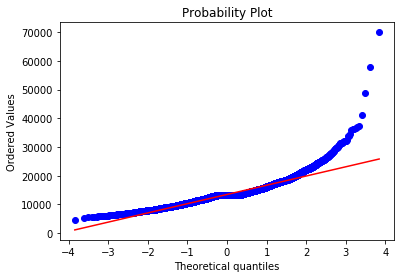

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.9441
Kurtosis: 14.1347


   Support 
Overview of variable:  goldspent 


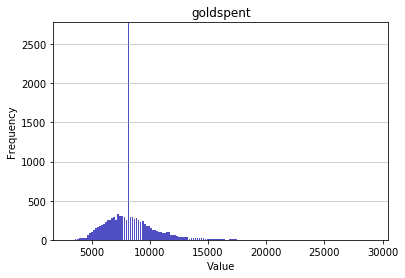

-------------------- 
Summary statistics:
 --------------------
Minimum value: 3025.0
Mean: 8337.1802
Standard deviation: 2068.7237
Median: 8125.0
Maximal value: 29185.0


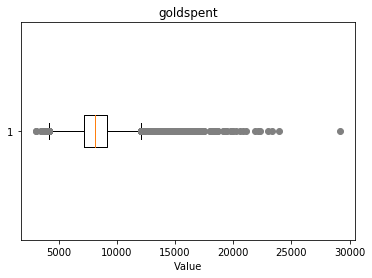

-------------------- 
Outlier detection:
 --------------------
List of outliers: {29185.0, 14850.0, 15875.0, 19975.0, 16400.0, 19475.0, 14875.0, 15900.0, 16925.0, 16425.0, 17450.0, 18475.0, 16955.0, 16445.0, 17985.0, 16450.0, 15425.0, 22090.0, 15435.0, 14925.0, 15950.0, 16475.0, 14950.0, 15975.0, 18025.0, 21100.0, 15475.0, 17525.0, 20600.0, 14975.0, 17025.0, 15495.0, 15500.0, 16525.0, 17050.0, 15525.0, 18600.0, 16050.0, 19125.0, 15550.0, 18625.0, 15050.0, 16075.0, 17100.0, 14550.0, 15575.0, 15075.0, 16100.0, 17125.0, 19175.0, 20200.0, 14575.0, 15600.0, 16625.0, 15100.0, 14595.0, 15110.0, 14600.0, 15630.0, 16655.0, 16150.0, 17175.0, 18200.0, 23325.0, 14625.0, 15650.0, 18725.0, 15150.0, 16175.0, 22325.0, 14650.0, 15675.0, 21825.0, 16200.0, 19275.0, 14670.0, 19280.0, 14675.0, 15700.0, 19800.0, 18265.0, 17250.0, 14700.0, 19830.0, 15225.0, 16250.0, 17275.0, 15235.0, 14725.0, 19850.0, 20875.0, 23950.0, 17305.0, 15260.0, 15775.0, 15265.0, 22950.0, 15275.0, 14765.0, 16820.0, 14775.0, 15800.0, 

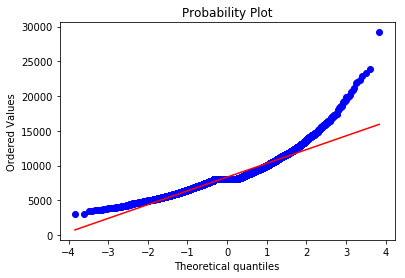

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.3704
Kurtosis: 4.8985


   Top 
Overview of variable:  gspd 


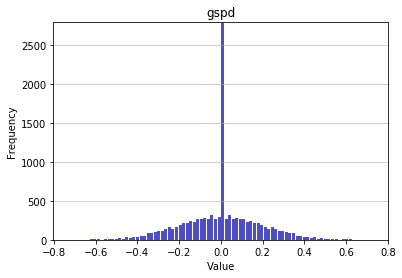

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.7306273062730627
Mean: 0.0
Standard deviation: 0.1779
Median: 0.0
Maximal value: 0.7306273062730627


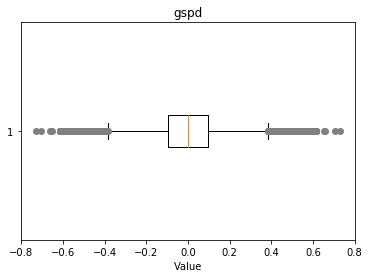

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.61, -0.61, 0.56, -0.56, 0.57, -0.57, 0.6, -0.6, 0.58, -0.58, -0.66, 0.59, -0.65, -0.73, -0.59, 0.7, -0.55, 0.62, -0.54, 0.54, -0.62, -0.7, 0.55, 0.73, 0.65, 0.66}


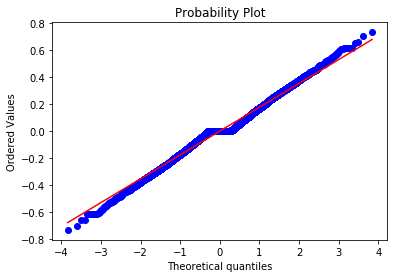

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 0.6482


   Middle 
Overview of variable:  gspd 


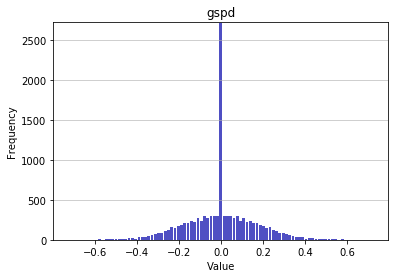

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.7249544626593807
Mean: 0.0
Standard deviation: 0.1646
Median: 0.0
Maximal value: 0.7249544626593807


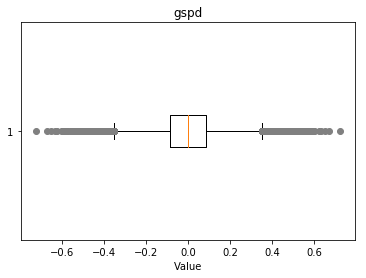

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.63, -0.63, 0.51, 0.54, -0.54, -0.51, -0.5, 0.5, 0.56, -0.56, 0.59, -0.58, -0.67, 0.67, 0.6, -0.65, 0.52, -0.59, -0.55, 0.53, -0.72, 0.62, -0.62, 0.55, -0.53, 0.72, -0.52, -0.6, 0.65, 0.58}


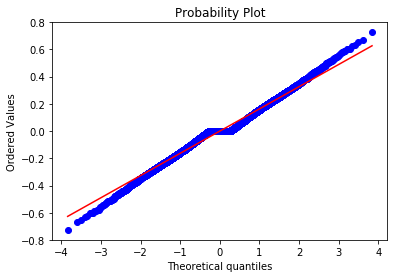

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 0.8396


   Jungle 
Overview of variable:  gspd 


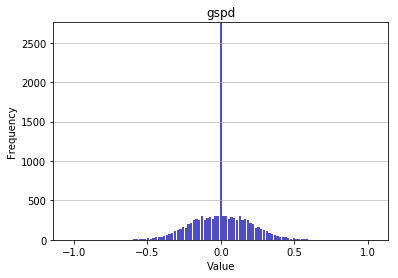

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.0374331550802138
Mean: 0.0
Standard deviation: 0.1807
Median: 0.0
Maximal value: 1.0374331550802138


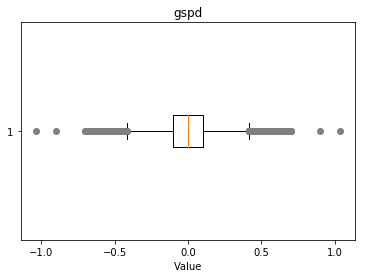

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.57, -0.57, 0.61, 0.64, -0.64, -0.61, 0.66, -0.66, 0.54, -0.54, -0.58, 0.59, 0.68, -0.9, -0.56, -0.59, 0.7, -0.55, 0.62, 1.04, -0.62, -0.7, 0.55, 0.56, -0.68, 0.9, 0.58, -1.04}


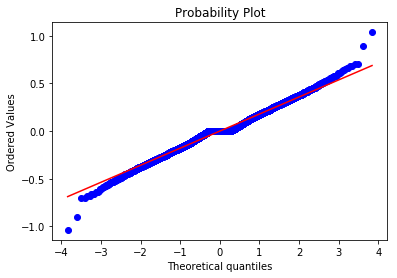

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 0.8517


   ADC 
Overview of variable:  gspd 


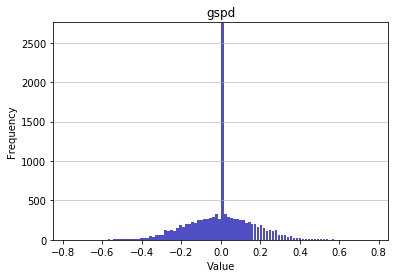

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.7721964159254858
Mean: 0.0
Standard deviation: 0.1589
Median: 0.0
Maximal value: 0.7721964159254858


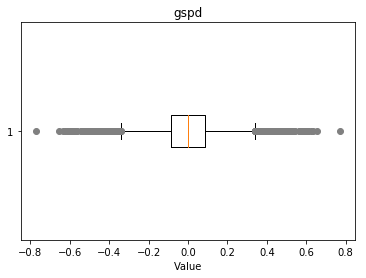

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.49, -0.49, 0.54, -0.54, 0.5, -0.5, -0.48, 0.48, -0.57, 0.57, -0.66, 0.58, -0.58, 0.59, 0.51, 0.6, -0.56, 0.77, 0.52, -0.59, 0.61, -0.64, 0.53, -0.63, 0.63, -0.53, -0.61, 0.64, 0.56, -0.77, -0.52, -0.6, -0.51, 0.66}


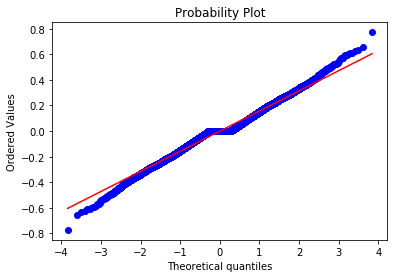

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 0.8903


   Support 
Overview of variable:  gspd 


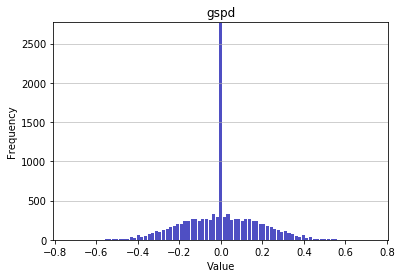

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.7339449541284404
Mean: 0.0
Standard deviation: 0.172
Median: 0.0
Maximal value: 0.7339449541284404


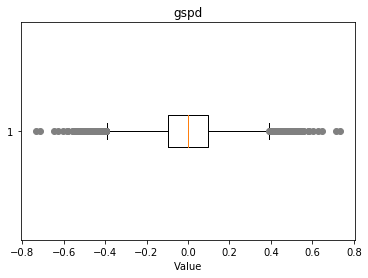

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-0.54, 0.54, 0.62, 0.55, -0.55, -0.62, 0.52, -0.52, 0.71, -0.71, -0.58, -0.65, 0.6, -0.73, -0.56, 0.53, -0.53, 0.56, 0.73, -0.6, 0.65, 0.58}


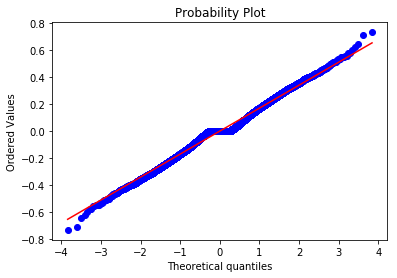

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 0.418


   Top 
Overview of variable:  minionkills 


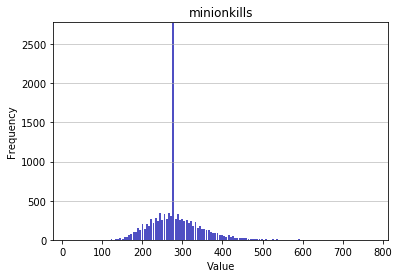

-------------------- 
Summary statistics:
 --------------------
Minimum value: 16.0
Mean: 282.5236
Standard deviation: 60.8035
Median: 277.0
Maximal value: 776.0


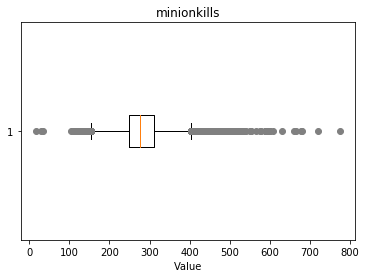

-------------------- 
Outlier detection:
 --------------------
List of outliers: {513.0, 515.0, 520.0, 776.0, 522.0, 521.0, 525.0, 527.0, 16.0, 661.0, 533.0, 535.0, 536.0, 537.0, 666.0, 540.0, 30.0, 33.0, 678.0, 720.0, 680.0, 553.0, 550.0, 566.0, 575.0, 598.0, 579.0, 588.0, 590.0, 592.0, 465.0, 466.0, 467.0, 468.0, 469.0, 470.0, 471.0, 599.0, 473.0, 474.0, 602.0, 476.0, 477.0, 475.0, 479.0, 480.0, 481.0, 482.0, 483.0, 484.0, 485.0, 478.0, 609.0, 488.0, 489.0, 490.0, 491.0, 492.0, 493.0, 486.0, 495.0, 497.0, 498.0, 500.0, 502.0, 503.0, 632.0, 507.0, 509.0, 510.0, 511.0}


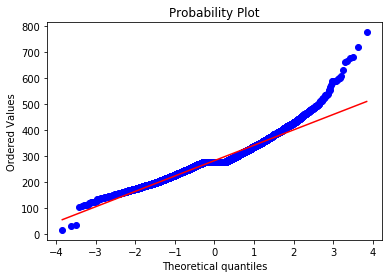

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.8991
Kurtosis: 2.9024


   Middle 
Overview of variable:  minionkills 


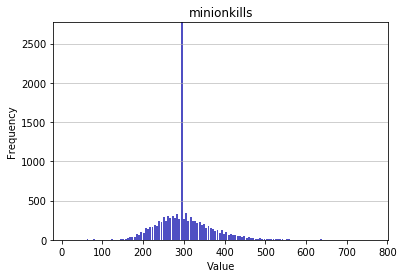

-------------------- 
Summary statistics:
 --------------------
Minimum value: 17.0
Mean: 301.0714
Standard deviation: 64.2515
Median: 296.0
Maximal value: 765.0


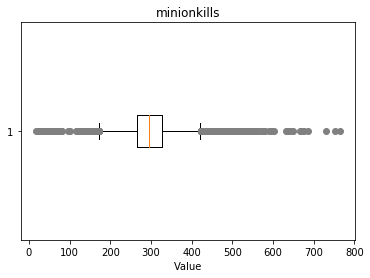

-------------------- 
Outlier detection:
 --------------------
List of outliers: {513.0, 514.0, 516.0, 517.0, 518.0, 520.0, 521.0, 522.0, 523.0, 524.0, 525.0, 526.0, 527.0, 528.0, 529.0, 530.0, 17.0, 532.0, 533.0, 22.0, 535.0, 536.0, 537.0, 24.0, 25.0, 539.0, 541.0, 542.0, 543.0, 544.0, 31.0, 34.0, 547.0, 551.0, 552.0, 553.0, 554.0, 39.0, 40.0, 45.0, 559.0, 560.0, 561.0, 48.0, 564.0, 52.0, 54.0, 570.0, 58.0, 59.0, 61.0, 63.0, 576.0, 577.0, 65.0, 66.0, 581.0, 71.0, 590.0, 79.0, 80.0, 81.0, 597.0, 603.0, 96.0, 100.0, 632.0, 634.0, 638.0, 643.0, 648.0, 667.0, 671.0, 677.0, 685.0, 731.0, 753.0, 765.0, 494.0, 495.0, 496.0, 497.0, 498.0, 499.0, 500.0, 502.0, 503.0, 504.0, 505.0, 507.0, 508.0, 509.0, 510.0, 511.0}


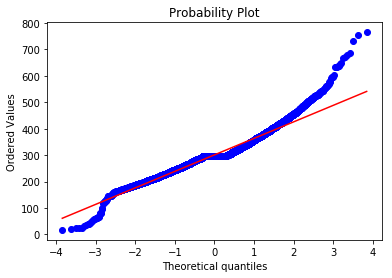

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7756
Kurtosis: 2.9401


   Jungle 
Overview of variable:  minionkills 


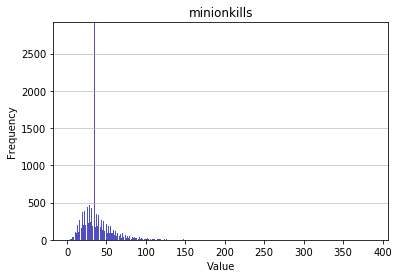

-------------------- 
Summary statistics:
 --------------------
Minimum value: 2.0
Mean: 39.2574
Standard deviation: 23.2181
Median: 35.0
Maximal value: 388.0


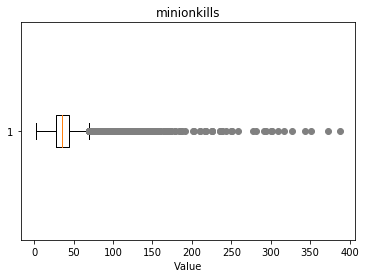

-------------------- 
Outlier detection:
 --------------------
List of outliers: {128.0, 129.0, 130.0, 131.0, 132.0, 133.0, 258.0, 388.0, 136.0, 137.0, 141.0, 143.0, 144.0, 145.0, 146.0, 147.0, 148.0, 149.0, 150.0, 277.0, 152.0, 153.0, 281.0, 157.0, 158.0, 159.0, 160.0, 291.0, 164.0, 165.0, 294.0, 169.0, 170.0, 171.0, 300.0, 173.0, 301.0, 251.0, 178.0, 179.0, 309.0, 183.0, 186.0, 188.0, 317.0, 191.0, 243.0, 327.0, 202.0, 203.0, 125.0, 210.0, 343.0, 216.0, 218.0, 351.0, 225.0, 226.0, 249.0, 122.0, 235.0, 236.0, 109.0, 110.0, 111.0, 112.0, 238.0, 114.0, 113.0, 116.0, 117.0, 118.0, 119.0, 120.0, 121.0, 115.0, 123.0, 124.0, 372.0, 126.0, 127.0}


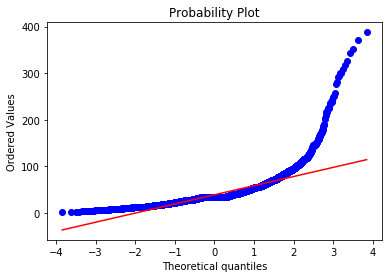

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 4.2
Kurtosis: 35.9774


   ADC 
Overview of variable:  minionkills 


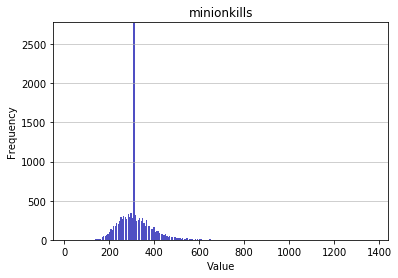

-------------------- 
Summary statistics:
 --------------------
Minimum value: 19.0
Mean: 315.2998
Standard deviation: 71.6621
Median: 308.0
Maximal value: 1373.0


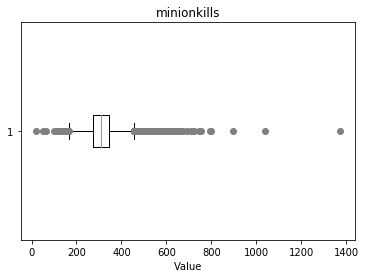

-------------------- 
Outlier detection:
 --------------------
List of outliers: {643.0, 644.0, 645.0, 646.0, 647.0, 650.0, 653.0, 1037.0, 531.0, 19.0, 533.0, 534.0, 535.0, 536.0, 792.0, 667.0, 540.0, 539.0, 542.0, 799.0, 544.0, 545.0, 546.0, 675.0, 548.0, 549.0, 547.0, 551.0, 552.0, 541.0, 555.0, 556.0, 557.0, 558.0, 559.0, 543.0, 561.0, 563.0, 564.0, 565.0, 566.0, 567.0, 568.0, 693.0, 570.0, 571.0, 51.0, 573.0, 576.0, 64.0, 581.0, 709.0, 584.0, 585.0, 713.0, 588.0, 589.0, 591.0, 593.0, 721.0, 595.0, 601.0, 603.0, 604.0, 605.0, 606.0, 607.0, 1373.0, 609.0, 610.0, 611.0, 613.0, 616.0, 744.0, 625.0, 756.0, 629.0, 631.0, 633.0, 637.0, 895.0}


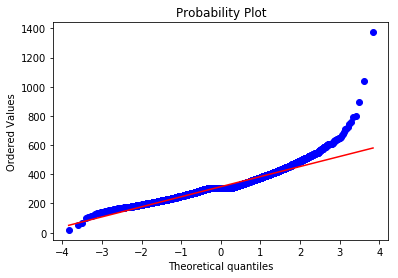

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.323
Kurtosis: 7.6747


   Support 
Overview of variable:  minionkills 


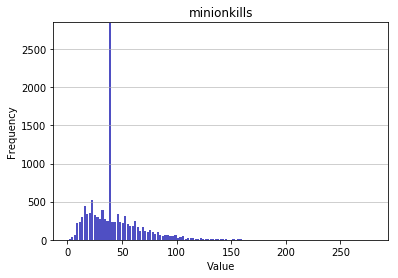

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1.0
Mean: 42.9482
Standard deviation: 24.3984
Median: 39.0
Maximal value: 280.0


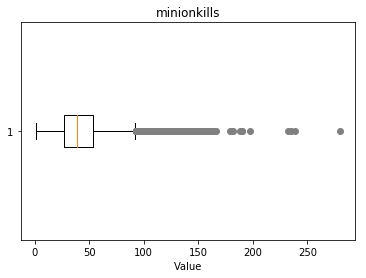

-------------------- 
Outlier detection:
 --------------------
List of outliers: {128.0, 129.0, 130.0, 131.0, 132.0, 133.0, 134.0, 135.0, 136.0, 137.0, 138.0, 139.0, 140.0, 141.0, 142.0, 143.0, 144.0, 145.0, 146.0, 149.0, 150.0, 151.0, 280.0, 153.0, 154.0, 156.0, 157.0, 159.0, 160.0, 161.0, 162.0, 164.0, 165.0, 166.0, 179.0, 180.0, 182.0, 188.0, 190.0, 197.0, 232.0, 235.0, 239.0, 117.0, 118.0, 119.0, 120.0, 121.0, 122.0, 123.0, 124.0, 125.0, 126.0, 127.0}


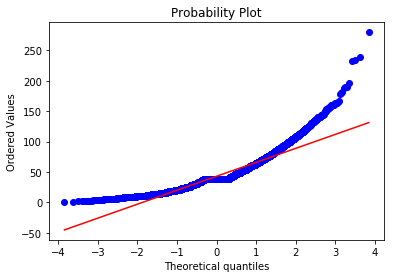

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.576
Kurtosis: 4.6549


   Top 
Overview of variable:  monsterkills 


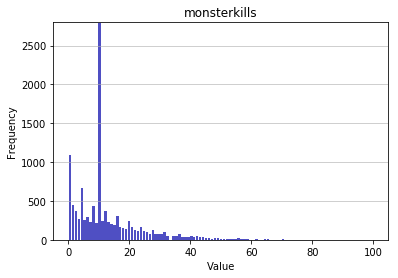

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 12.7125
Standard deviation: 11.6343
Median: 10.0
Maximal value: 100.0


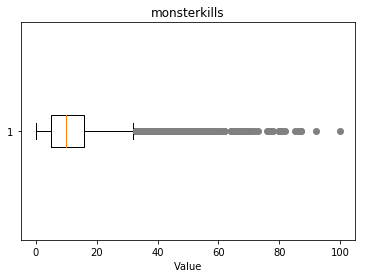

-------------------- 
Outlier detection:
 --------------------
List of outliers: {48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 64.0, 65.0, 66.0, 67.0, 68.0, 69.0, 70.0, 71.0, 72.0, 73.0, 76.0, 77.0, 78.0, 80.0, 81.0, 82.0, 85.0, 86.0, 87.0, 92.0, 100.0}


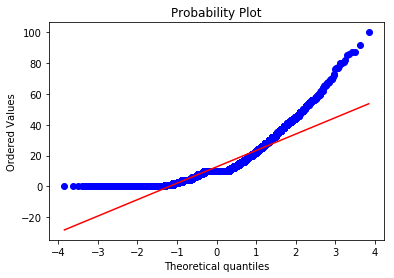

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.7783
Kurtosis: 4.368


   Middle 
Overview of variable:  monsterkills 


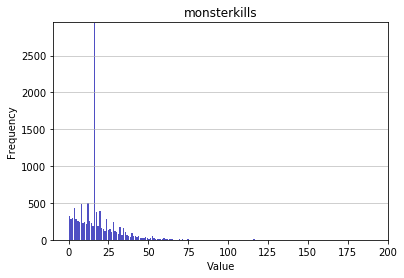

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 18.194
Standard deviation: 15.0718
Median: 16.0
Maximal value: 191.0


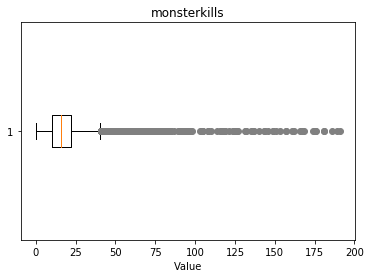

-------------------- 
Outlier detection:
 --------------------
List of outliers: {131.0, 132.0, 135.0, 136.0, 137.0, 140.0, 143.0, 144.0, 146.0, 149.0, 151.0, 153.0, 157.0, 161.0, 162.0, 166.0, 167.0, 168.0, 174.0, 175.0, 176.0, 181.0, 186.0, 189.0, 191.0, 64.0, 65.0, 66.0, 67.0, 68.0, 69.0, 70.0, 72.0, 73.0, 74.0, 75.0, 76.0, 77.0, 78.0, 79.0, 80.0, 81.0, 82.0, 83.0, 84.0, 85.0, 87.0, 89.0, 90.0, 91.0, 92.0, 93.0, 94.0, 95.0, 97.0, 98.0, 103.0, 104.0, 105.0, 108.0, 110.0, 114.0, 116.0, 117.0, 118.0, 119.0, 121.0, 124.0, 125.0, 126.0, 127.0}


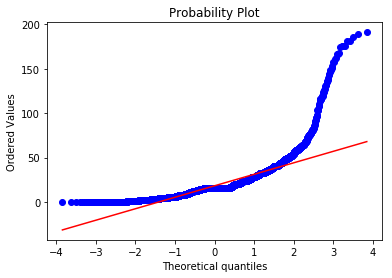

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 3.6492
Kurtosis: 25.6803


   Jungle 
Overview of variable:  monsterkills 


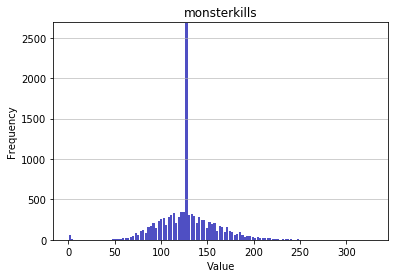

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 128.2579
Standard deviation: 31.0396
Median: 127.0
Maximal value: 329.0


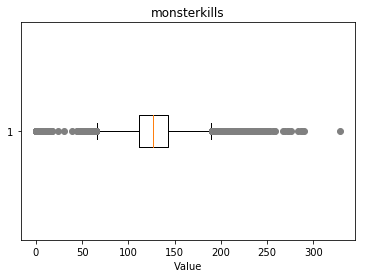

-------------------- 
Outlier detection:
 --------------------
List of outliers: {256.0, 0.0, 2.0, 1.0, 259.0, 3.0, 4.0, 5.0, 8.0, 6.0, 10.0, 267.0, 12.0, 269.0, 14.0, 15.0, 273.0, 18.0, 258.0, 276.0, 24.0, 283.0, 287.0, 288.0, 31.0, 290.0, 329.0, 222.0, 223.0, 224.0, 225.0, 226.0, 227.0, 229.0, 230.0, 231.0, 232.0, 233.0, 234.0, 235.0, 236.0, 238.0, 239.0, 240.0, 241.0, 242.0, 243.0, 244.0, 246.0, 247.0, 248.0, 249.0, 250.0, 252.0, 253.0}


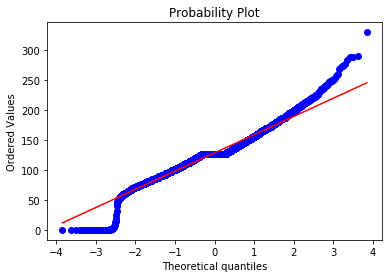

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.165
Kurtosis: 2.5079


   ADC 
Overview of variable:  monsterkills 


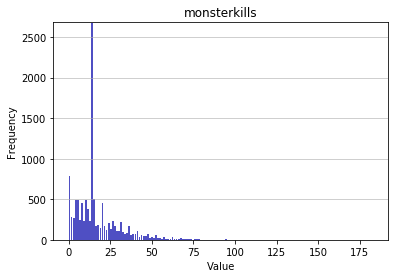

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 17.2903
Standard deviation: 14.4504
Median: 14.0
Maximal value: 183.0


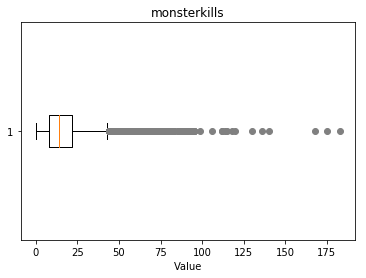

-------------------- 
Outlier detection:
 --------------------
List of outliers: {130.0, 136.0, 140.0, 168.0, 175.0, 183.0, 61.0, 62.0, 63.0, 64.0, 65.0, 66.0, 67.0, 68.0, 69.0, 70.0, 71.0, 72.0, 73.0, 74.0, 75.0, 76.0, 77.0, 78.0, 79.0, 80.0, 81.0, 83.0, 85.0, 86.0, 87.0, 88.0, 89.0, 90.0, 91.0, 92.0, 93.0, 94.0, 95.0, 99.0, 106.0, 112.0, 114.0, 115.0, 118.0, 120.0}


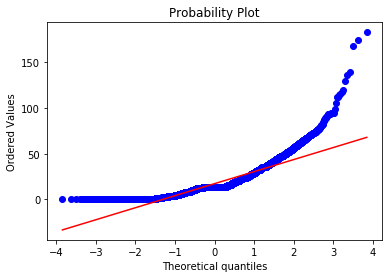

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.1089
Kurtosis: 8.8232


   Support 
Overview of variable:  monsterkills 


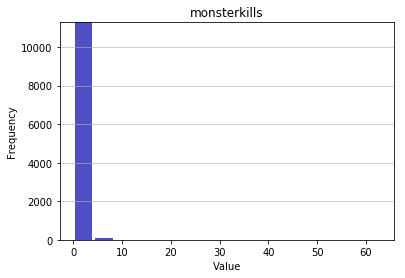

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.3546
Standard deviation: 1.435
Median: 0.0
Maximal value: 63.0


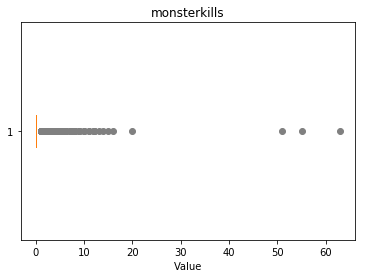

-------------------- 
Outlier detection:
 --------------------
List of outliers: {5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 51.0, 20.0, 55.0, 63.0}


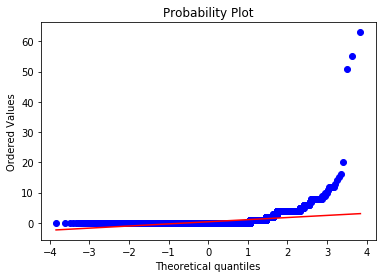

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 18.3498
Kurtosis: 651.3733


   Top 
Overview of variable:  monsterkillsownjungle 


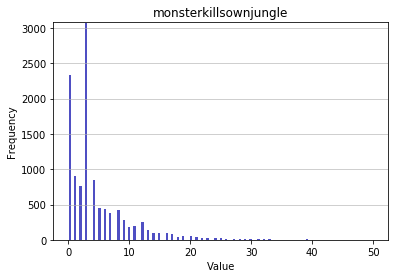

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 4.5756
Standard deviation: 5.3722
Median: 3.0
Maximal value: 50.0


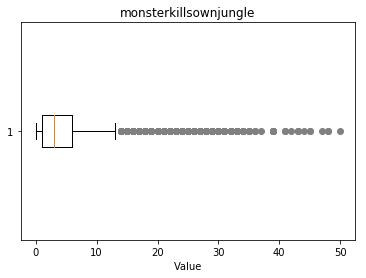

-------------------- 
Outlier detection:
 --------------------
List of outliers: {21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 39.0, 41.0, 42.0, 43.0, 44.0, 45.0, 47.0, 48.0, 50.0}


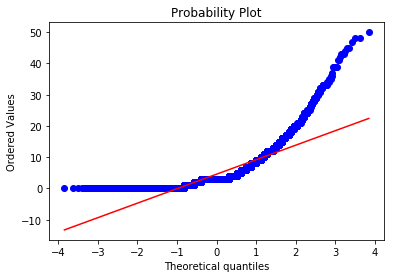

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.4876
Kurtosis: 9.0171


   Middle 
Overview of variable:  monsterkillsownjungle 


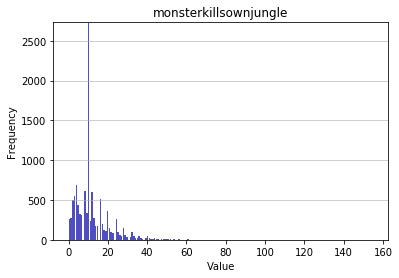

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 12.3065
Standard deviation: 11.0325
Median: 10.0
Maximal value: 155.0


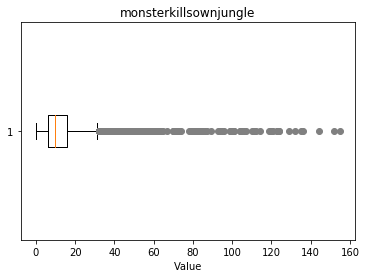

-------------------- 
Outlier detection:
 --------------------
List of outliers: {129.0, 132.0, 135.0, 136.0, 144.0, 152.0, 155.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 63.0, 64.0, 65.0, 67.0, 70.0, 71.0, 72.0, 73.0, 74.0, 78.0, 79.0, 80.0, 81.0, 82.0, 83.0, 84.0, 85.0, 86.0, 87.0, 89.0, 93.0, 94.0, 95.0, 96.0, 99.0, 100.0, 101.0, 104.0, 105.0, 106.0, 107.0, 110.0, 111.0, 112.0, 114.0, 119.0, 120.0, 121.0, 123.0, 124.0}


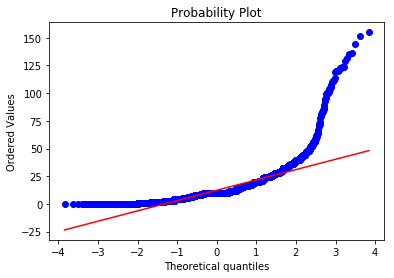

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 3.9779
Kurtosis: 30.1344


   Jungle 
Overview of variable:  monsterkillsownjungle 


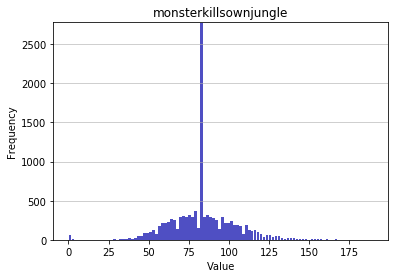

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 83.8834
Standard deviation: 20.5881
Median: 83.0
Maximal value: 190.0


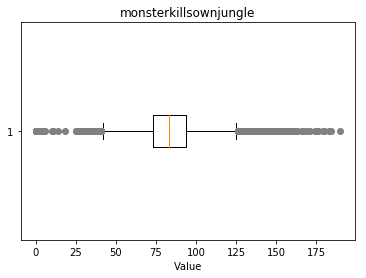

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 10.0, 11.0, 14.0, 146.0, 147.0, 148.0, 149.0, 150.0, 18.0, 152.0, 153.0, 154.0, 155.0, 156.0, 157.0, 158.0, 151.0, 160.0, 161.0, 162.0, 163.0, 166.0, 167.0, 169.0, 171.0, 174.0, 176.0, 179.0, 180.0, 183.0, 184.0, 190.0}


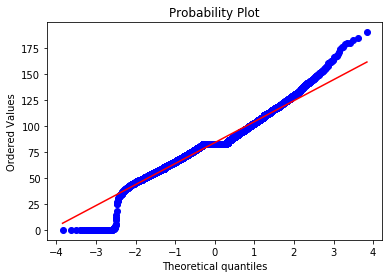

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.1101
Kurtosis: 2.2035


   ADC 
Overview of variable:  monsterkillsownjungle 


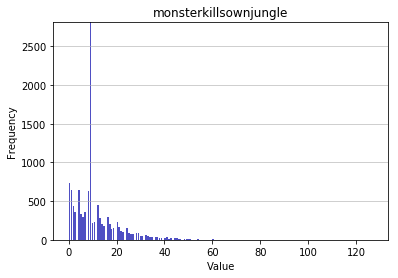

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 11.0841
Standard deviation: 9.7834
Median: 9.0
Maximal value: 127.0


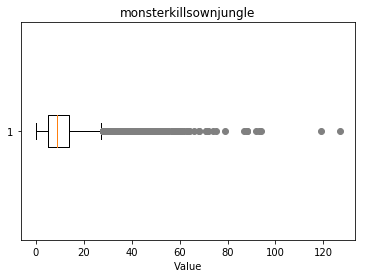

-------------------- 
Outlier detection:
 --------------------
List of outliers: {41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 63.0, 64.0, 66.0, 68.0, 71.0, 72.0, 74.0, 75.0, 79.0, 87.0, 88.0, 92.0, 93.0, 94.0, 119.0, 127.0}


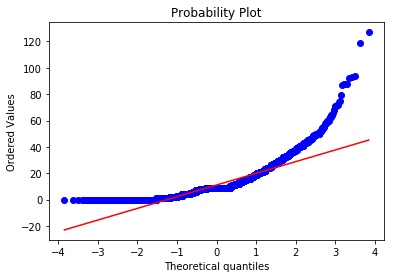

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.1752
Kurtosis: 9.2093


   Support 
Overview of variable:  monsterkillsownjungle 


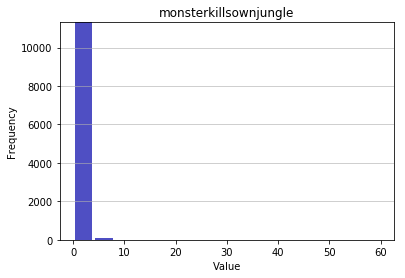

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.1006
Standard deviation: 0.8904
Median: 0.0
Maximal value: 60.0


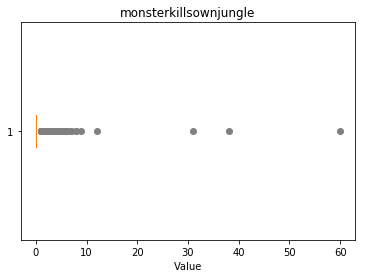

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.0, 4.0, 5.0, 38.0, 7.0, 8.0, 6.0, 9.0, 12.0, 60.0, 31.0}


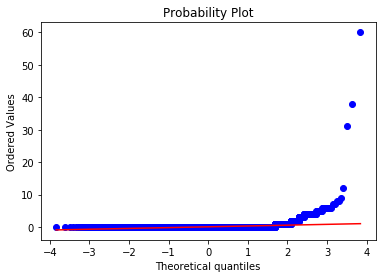

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 38.8222
Kurtosis: 2220.8052


   Top 
Overview of variable:  monsterkillsenemyjungle 


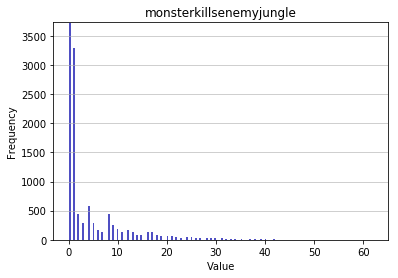

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 4.3865
Standard deviation: 7.3173
Median: 1.0
Maximal value: 62.0


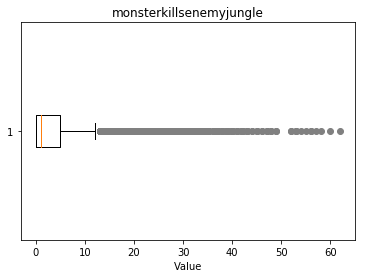

-------------------- 
Outlier detection:
 --------------------
List of outliers: {27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 60.0, 62.0}


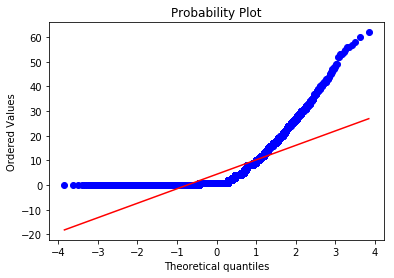

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.5853
Kurtosis: 8.144


   Middle 
Overview of variable:  monsterkillsenemyjungle 


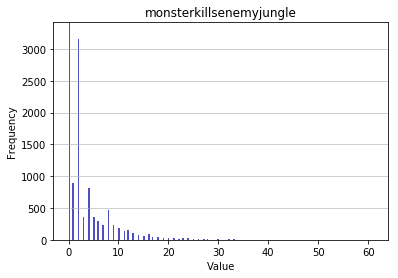

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 3.5426
Standard deviation: 4.9273
Median: 2.0
Maximal value: 61.0


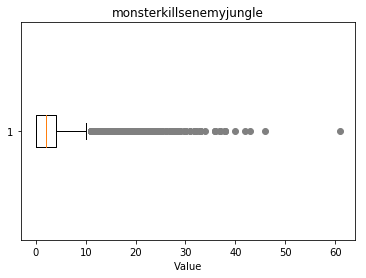

-------------------- 
Outlier detection:
 --------------------
List of outliers: {19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 36.0, 37.0, 38.0, 40.0, 42.0, 43.0, 46.0, 61.0}


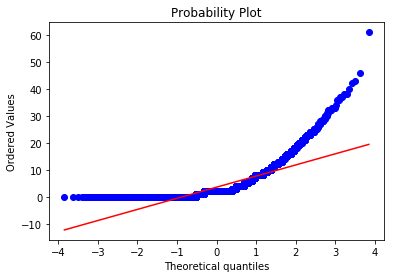

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.6294
Kurtosis: 9.968


   Jungle 
Overview of variable:  monsterkillsenemyjungle 


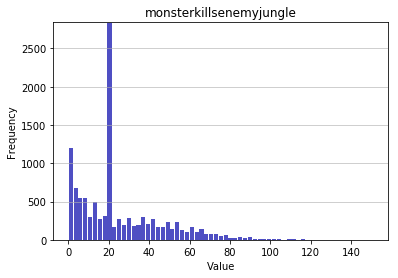

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 25.1587
Standard deviation: 21.2851
Median: 20.0
Maximal value: 151.0


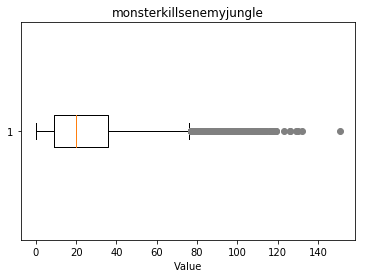

-------------------- 
Outlier detection:
 --------------------
List of outliers: {129.0, 130.0, 132.0, 151.0, 90.0, 91.0, 92.0, 93.0, 94.0, 95.0, 96.0, 97.0, 98.0, 99.0, 100.0, 101.0, 102.0, 103.0, 104.0, 105.0, 106.0, 107.0, 108.0, 109.0, 110.0, 111.0, 112.0, 113.0, 114.0, 116.0, 117.0, 118.0, 119.0, 123.0, 126.0}


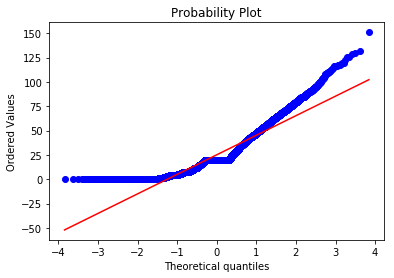

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.2115
Kurtosis: 1.3961


   ADC 
Overview of variable:  monsterkillsenemyjungle 


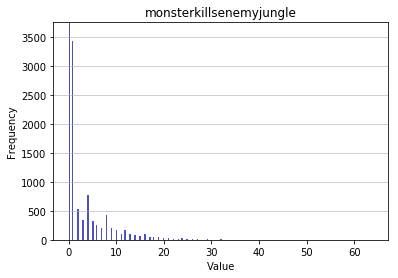

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 3.1908
Standard deviation: 5.1077
Median: 1.0
Maximal value: 64.0


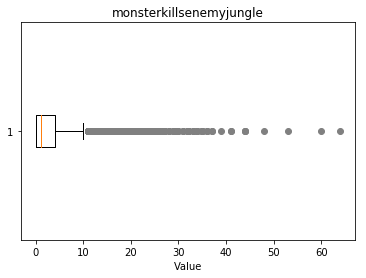

-------------------- 
Outlier detection:
 --------------------
List of outliers: {19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 39.0, 41.0, 44.0, 48.0, 53.0, 60.0, 64.0}


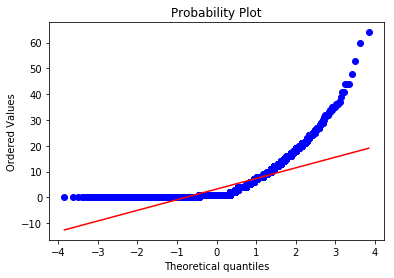

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.8711
Kurtosis: 12.3588


   Support 
Overview of variable:  monsterkillsenemyjungle 


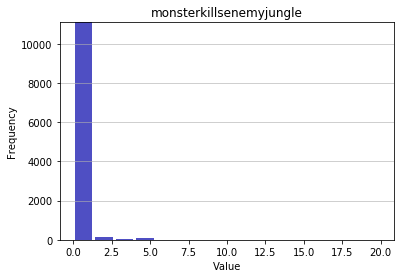

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.1328
Standard deviation: 0.6196
Median: 0.0
Maximal value: 20.0


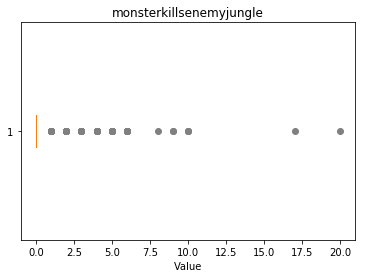

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2.0, 3.0, 4.0, 5.0, 6.0, 8.0, 9.0, 10.0, 17.0, 20.0}


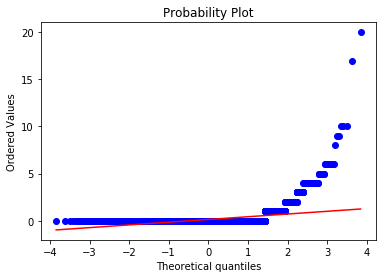

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 10.0438
Kurtosis: 188.1433


   Top 
Overview of variable:  cspm 


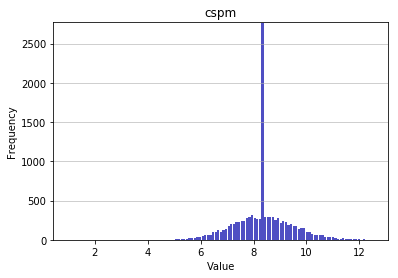

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1.00418410041841
Mean: 8.345
Standard deviation: 1.0497
Median: 8.3294
Maximal value: 12.523833416959357


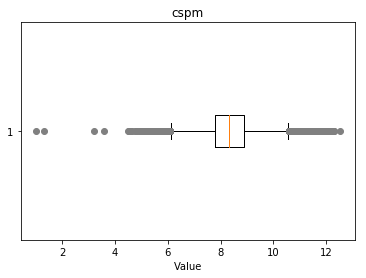

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.31, 1.0, 3.23, 4.74, 5.14, 4.79, 5.15, 4.61, 5.11, 5.08, 11.67, 12.52, 12.07, 12.11, 12.3, 11.94, 12.01, 11.71, 11.63, 11.78, 4.65, 4.91, 4.57, 4.59, 4.83, 5.1, 5.18, 4.49, 5.07, 4.51, 5.02, 11.49, 11.82, 11.51, 11.83, 11.93, 11.62, 11.79, 11.88, 12.03, 12.23, 12.2, 11.65, 11.6, 11.64, 12.18, 12.14, 12.06, 11.81, 4.97, 5.04, 5.19, 11.91, 11.54, 3.58, 11.86}


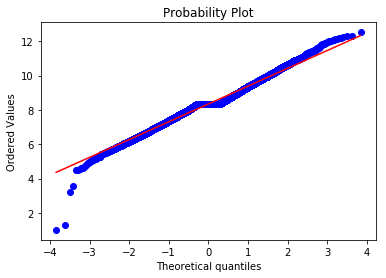

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0483
Kurtosis: 1.1221


   Middle 
Overview of variable:  cspm 


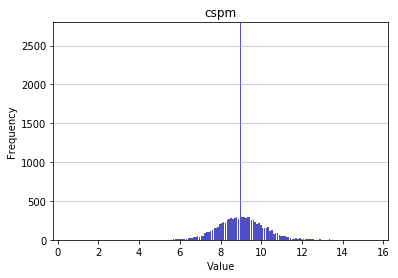

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.5284974093264249
Mean: 9.0034
Standard deviation: 1.0635
Median: 8.9994
Maximal value: 15.502757742893507


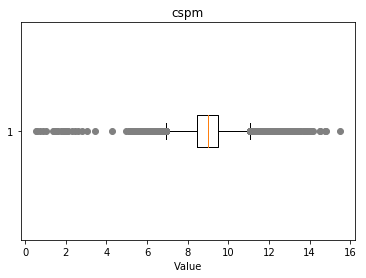

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.76, 1.36, 2.06, 3.03, 4.28, 5.5, 5.78, 5.75, 5.79, 5.35, 5.44, 5.66, 5.57, 12.31, 13.88, 12.81, 12.37, 12.62, 12.21, 12.2, 12.32, 12.88, 13.35, 14.08, 15.5, 5.25, 5.68, 1.5, 2.61, 3.43, 1.61, 12.54, 12.29, 12.71, 12.93, 12.43, 13.11, 13.32, 13.5, 13.0, 14.0, 1.97, 5.36, 5.47, 2.33, 2.08, 1.01, 1.76, 5.33, 5.65, 5.26, 5.76, 12.19, 12.26, 12.22, 12.83, 12.33, 13.26, 12.4, 12.51, 1.87, 14.15, 2.8, 5.12, 1.41, 0.87, 0.61, 2.09, 5.52, 1.52, 1.95, 12.41, 12.7, 12.52, 12.66, 12.23, 13.55, 13.7, 13.2, 13.45, 14.09, 14.52, 4.95, 5.7, 13.85, 0.53, 12.49, 12.38, 12.35, 12.67, 12.92, 13.17, 13.74, 13.38, 13.28, 13.53, 14.49, 14.81, 14.74, 13.31, 2.46}


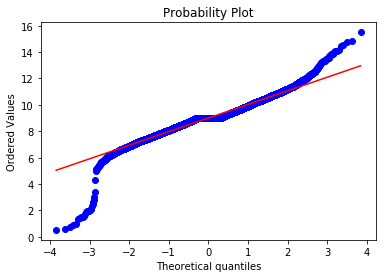

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.37
Kurtosis: 5.7312


   Jungle 
Overview of variable:  cspm 


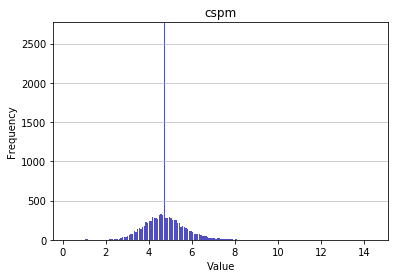

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.274914089347079
Mean: 4.7409
Standard deviation: 0.9348
Median: 4.6923
Maximal value: 14.435643564356436


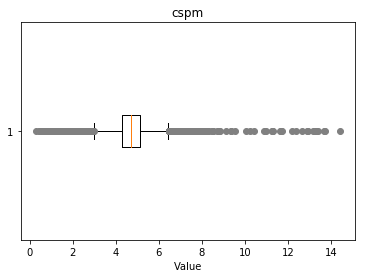

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.27, 1.56, 1.1, 1.16, 1.57, 1.18, 1.84, 7.93, 7.99, 7.55, 7.59, 7.72, 8.01, 8.1, 7.66, 7.71, 8.35, 8.17, 11.7, 13.33, 13.39, 14.44, 13.25, 1.68, 1.43, 7.82, 7.75, 8.18, 8.04, 8.5, 8.21, 8.86, 9.36, 9.54, 1.11, 11.71, 12.21, 12.64, 0.79, 13.68, 7.61, 7.79, 1.4, 0.46, 0.44, 1.58, 0.94, 7.58, 7.65, 7.83, 8.72, 8.26, 10.9, 11.33, 11.65, 13.15, 1.62, 1.8, 0.73, 7.8, 1.66, 0.62, 0.85, 0.64, 0.9, 0.67, 7.98, 7.77, 8.8, 8.02, 8.45, 8.16, 10.05, 10.41, 1.7, 1.2, 12.95, 12.91, 1.13, 0.56, 7.63, 7.56, 7.88, 0.49, 1.67, 7.6, 7.92, 1.35, 8.03, 9.38, 9.13, 0.78, 10.24, 10.99, 1.03, 1.28, 11.28, 11.24, 12.38, 13.74, 1.39, 7.89}


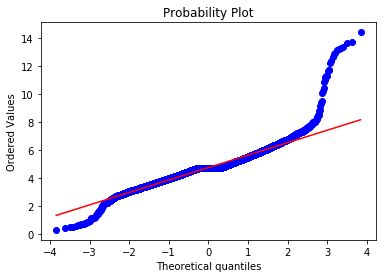

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.2258
Kurtosis: 10.1644


   ADC 
Overview of variable:  cspm 


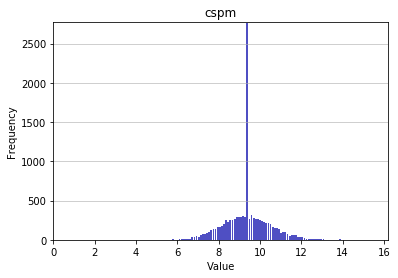

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.7429245283018868
Mean: 9.3593
Standard deviation: 1.095
Median: 9.341
Maximal value: 15.475352112676054


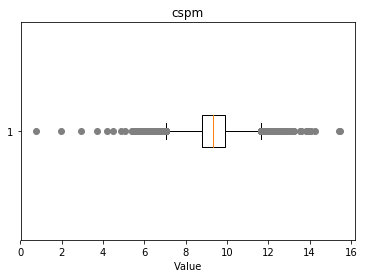

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.74, 1.94, 2.91, 3.7, 4.47, 5.91, 5.47, 6.05, 5.57, 5.77, 5.53, 5.42, 12.79, 13.55, 13.91, 12.8, 13.23, 12.77, 12.74, 12.71, 12.85, 15.48, 13.17, 14.26, 15.44, 4.85, 5.92, 5.76, 5.68, 13.87, 6.0, 12.93, 13.11, 12.86, 12.94, 12.91, 12.89, 12.95, 12.67, 12.9, 13.04, 13.06, 13.58, 12.72, 12.97, 14.07, 13.19, 13.15, 13.12, 13.85, 4.21, 12.83, 5.8, 5.78, 5.05, 5.64, 12.65, 12.84}


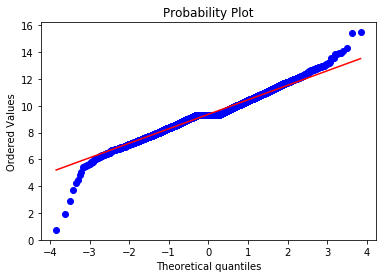

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0609
Kurtosis: 1.6068


   Support 
Overview of variable:  cspm 


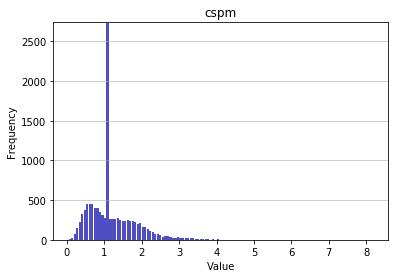

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0422237860661506
Mean: 1.2148
Standard deviation: 0.6391
Median: 1.1079
Maximal value: 8.185430463576159


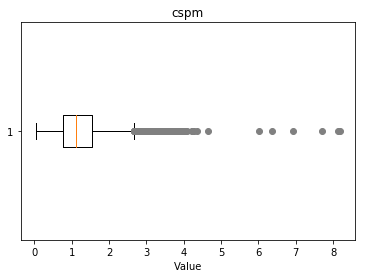

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.55, 3.66, 3.56, 6.37, 7.7, 3.33, 3.43, 4.02, 3.73, 4.04, 4.29, 3.37, 3.34, 3.25, 3.76, 3.17, 3.92, 3.26, 3.49, 3.42, 3.41, 4.07, 3.59, 3.52, 3.38, 3.88, 3.75, 4.35, 3.27, 3.77, 6.93, 8.19, 8.13, 3.7, 3.81, 3.67, 3.31, 3.78, 3.6, 3.35, 3.28, 3.44, 3.19, 3.18, 3.85, 3.53, 3.36, 3.94, 3.74, 3.24, 3.48, 3.45, 3.8, 3.63, 3.13, 3.46, 3.2, 3.3, 3.71, 3.21, 4.64, 4.21, 4.03, 4.22, 6.03, 3.68, 3.29, 3.54, 3.51, 3.5, 3.82, 3.4, 3.23, 3.98, 3.9, 3.22, 3.39, 3.14, 3.32, 3.15, 3.58, 3.69}


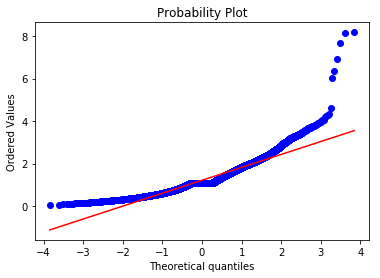

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.493
Kurtosis: 5.8681


   Top 
Overview of variable:  goldat10 


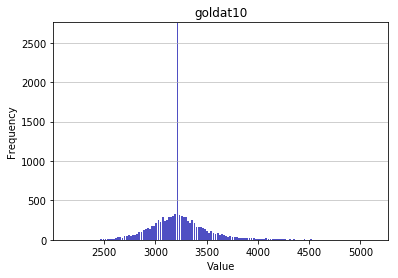

-------------------- 
Summary statistics:
 --------------------
Minimum value: 2152.0
Mean: 3228.8621
Standard deviation: 265.1028
Median: 3212.0
Maximal value: 5126.0


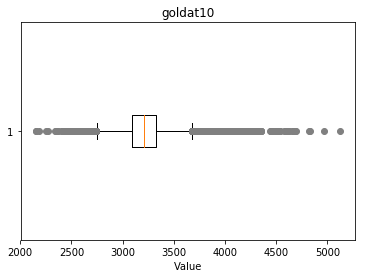

-------------------- 
Outlier detection:
 --------------------
List of outliers: {4099.0, 4102.0, 5126.0, 4105.0, 4618.0, 4106.0, 4620.0, 4108.0, 4110.0, 4111.0, 4623.0, 4113.0, 4107.0, 4116.0, 4121.0, 4123.0, 4125.0, 4132.0, 4133.0, 4134.0, 4137.0, 4653.0, 4143.0, 4144.0, 4152.0, 4157.0, 4669.0, 4161.0, 4680.0, 4172.0, 4173.0, 4177.0, 4178.0, 4179.0, 4180.0, 4182.0, 4184.0, 4185.0, 4697.0, 4187.0, 4188.0, 4192.0, 4194.0, 4197.0, 2152.0, 2156.0, 4205.0, 4207.0, 4218.0, 4223.0, 4225.0, 4226.0, 4227.0, 4230.0, 4606.0, 4231.0, 2187.0, 4236.0, 4241.0, 4242.0, 4249.0, 4252.0, 4255.0, 4260.0, 4261.0, 4265.0, 4269.0, 4270.0, 4278.0, 4293.0, 4301.0, 2254.0, 4305.0, 4823.0, 4316.0, 4317.0, 4318.0, 4833.0, 2273.0, 4327.0, 4330.0, 4351.0, 4355.0, 4356.0, 2339.0, 2354.0, 2359.0, 2369.0, 4438.0, 2396.0, 4448.0, 4451.0, 4452.0, 4459.0, 4971.0, 2414.0, 2418.0, 2424.0, 4472.0, 4491.0, 4505.0, 4507.0, 4511.0, 4512.0, 4527.0, 4027.0, 4539.0, 4029.0, 4540.0, 4030.0, 4038.0, 4040.0, 4042.0, 4043.0, 4047.0

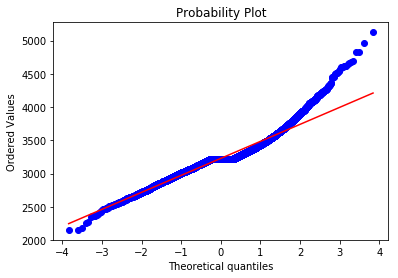

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.8981
Kurtosis: 3.4348


   Middle 
Overview of variable:  goldat10 


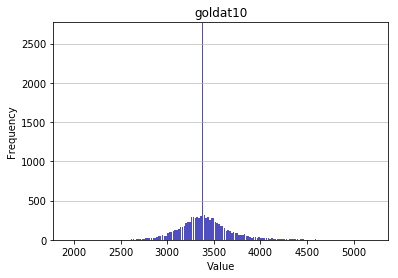

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1943.0
Mean: 3398.1107
Standard deviation: 257.5427
Median: 3386.0
Maximal value: 5208.0


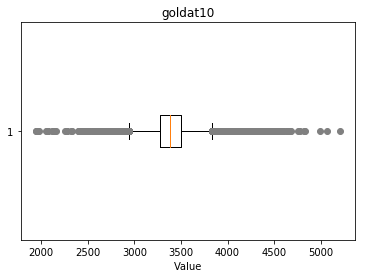

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2560.0, 2052.0, 2060.0, 2572.0, 4623.0, 2581.0, 4635.0, 2076.0, 2591.0, 4644.0, 2600.0, 2604.0, 2614.0, 2616.0, 2618.0, 4667.0, 2116.0, 4681.0, 4171.0, 4174.0, 4175.0, 4176.0, 4177.0, 2131.0, 4184.0, 5208.0, 4186.0, 4185.0, 2143.0, 4192.0, 4195.0, 4200.0, 4202.0, 4203.0, 4204.0, 4205.0, 4207.0, 2159.0, 4208.0, 4210.0, 4213.0, 4214.0, 4221.0, 4223.0, 4227.0, 4231.0, 4232.0, 4234.0, 4236.0, 4239.0, 4240.0, 4754.0, 4243.0, 4246.0, 4247.0, 4252.0, 4255.0, 4257.0, 4258.0, 4773.0, 4263.0, 4269.0, 4274.0, 4275.0, 4276.0, 4279.0, 4282.0, 4283.0, 4285.0, 4286.0, 4295.0, 4299.0, 4816.0, 4305.0, 2257.0, 4309.0, 4310.0, 4311.0, 4314.0, 4317.0, 4830.0, 4319.0, 4326.0, 4328.0, 2281.0, 2282.0, 4334.0, 4340.0, 4341.0, 4345.0, 4347.0, 4348.0, 4349.0, 4351.0, 4359.0, 4363.0, 4371.0, 2325.0, 4374.0, 4375.0, 2329.0, 4379.0, 4383.0, 4388.0, 4392.0, 4396.0, 4406.0, 4408.0, 4413.0, 4423.0, 4427.0, 4433.0, 4437.0, 4440.0, 2397.0

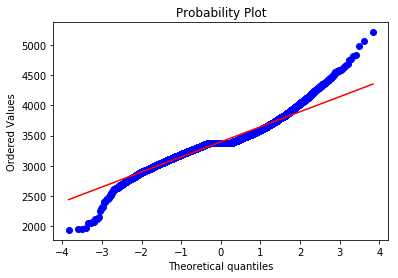

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.528
Kurtosis: 3.7809


   Jungle 
Overview of variable:  goldat10 


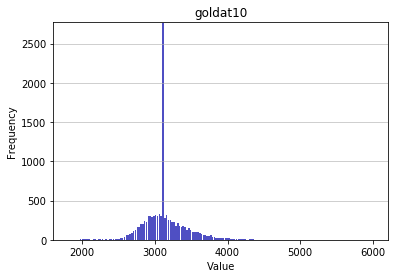

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1812.0
Mean: 3137.8829
Standard deviation: 304.2708
Median: 3105.0
Maximal value: 6004.0


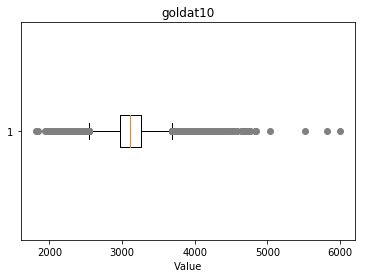

-------------------- 
Outlier detection:
 --------------------
List of outliers: {4096.0, 4097.0, 2052.0, 4101.0, 4102.0, 4104.0, 2059.0, 2060.0, 4115.0, 4121.0, 4122.0, 2074.0, 2073.0, 2078.0, 4127.0, 4641.0, 2082.0, 4129.0, 4133.0, 2043.0, 4135.0, 4138.0, 4140.0, 4143.0, 2100.0, 4150.0, 4663.0, 4151.0, 4662.0, 4154.0, 4155.0, 2107.0, 2111.0, 2112.0, 4162.0, 2114.0, 4166.0, 4684.0, 4175.0, 4176.0, 4182.0, 4694.0, 4183.0, 4185.0, 4186.0, 4187.0, 2139.0, 4189.0, 4702.0, 2142.0, 4188.0, 4193.0, 4194.0, 4203.0, 4207.0, 4208.0, 4209.0, 2159.0, 2163.0, 4213.0, 2167.0, 4216.0, 2169.0, 4219.0, 4221.0, 2174.0, 2178.0, 4227.0, 4739.0, 4229.0, 4231.0, 4238.0, 4240.0, 4241.0, 4245.0, 2197.0, 4247.0, 4248.0, 4249.0, 2200.0, 4760.0, 4761.0, 4253.0, 2209.0, 4261.0, 4268.0, 2225.0, 4276.0, 4292.0, 5829.0, 4293.0, 4300.0, 4301.0, 4314.0, 4321.0, 4322.0, 4836.0, 4325.0, 4327.0, 4839.0, 4339.0, 4346.0, 4348.0, 4354.0, 4362.0, 1812.0, 4386.0, 1848.0, 4418.0, 4427.0, 4449.0, 4450.0, 4464.0, 4467.0, 6004.0

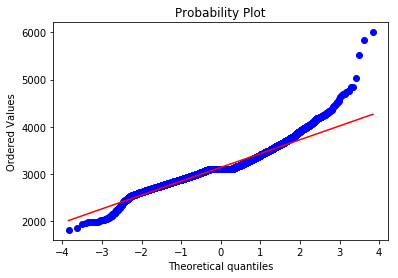

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.9315
Kurtosis: 4.1754


   ADC 
Overview of variable:  goldat10 


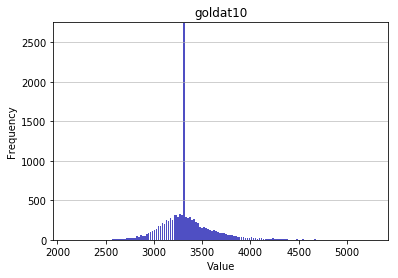

-------------------- 
Summary statistics:
 --------------------
Minimum value: 2116.0
Mean: 3339.0242
Standard deviation: 272.1803
Median: 3309.0
Maximal value: 5271.0


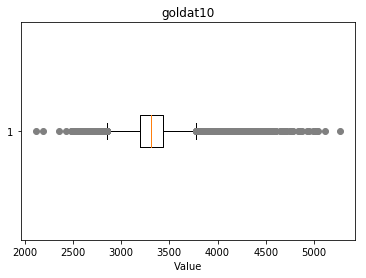

-------------------- 
Outlier detection:
 --------------------
List of outliers: {4648.0, 4660.0, 4663.0, 4664.0, 4157.0, 4159.0, 4672.0, 4673.0, 4162.0, 4163.0, 4674.0, 2116.0, 4166.0, 4167.0, 4168.0, 4169.0, 4170.0, 4171.0, 4172.0, 4173.0, 4682.0, 4176.0, 4689.0, 4178.0, 4181.0, 4182.0, 4698.0, 4189.0, 4190.0, 4703.0, 4192.0, 4702.0, 4194.0, 4197.0, 4201.0, 4202.0, 4206.0, 4208.0, 4721.0, 4212.0, 4218.0, 4220.0, 4227.0, 4228.0, 4230.0, 4231.0, 4234.0, 4235.0, 4236.0, 4237.0, 2191.0, 4240.0, 4241.0, 4242.0, 4239.0, 4756.0, 4245.0, 4758.0, 4247.0, 4248.0, 5271.0, 4249.0, 4251.0, 4764.0, 4253.0, 4254.0, 4256.0, 4257.0, 4258.0, 4770.0, 4260.0, 4267.0, 4268.0, 4782.0, 4273.0, 4275.0, 4279.0, 4284.0, 4286.0, 4291.0, 4296.0, 4297.0, 4298.0, 4299.0, 4301.0, 4305.0, 4313.0, 4315.0, 4316.0, 4317.0, 4830.0, 4320.0, 4321.0, 4323.0, 4326.0, 4330.0, 4331.0, 4332.0, 4341.0, 4342.0, 4343.0, 4344.0, 4858.0, 4355.0, 4361.0, 4873.0, 4366.0, 4368.0, 4369.0, 4373.0, 4375.0, 4381.0, 4382.0, 4388.0, 4394.0

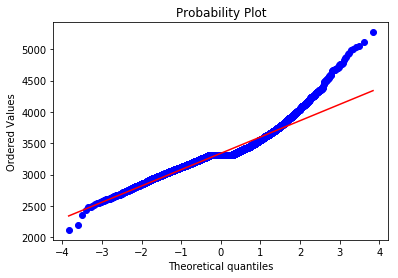

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.1606
Kurtosis: 4.0393


   Support 
Overview of variable:  goldat10 


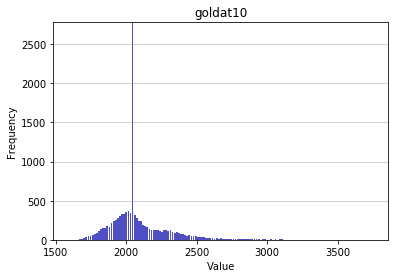

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1591.0
Mean: 2086.177
Standard deviation: 206.8797
Median: 2045.0
Maximal value: 3753.0


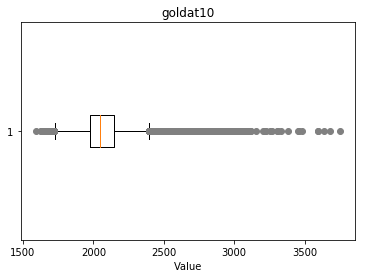

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3596.0, 3086.0, 3089.0, 3093.0, 3094.0, 3097.0, 3103.0, 3110.0, 3111.0, 3635.0, 3123.0, 3158.0, 3683.0, 3208.0, 3216.0, 2708.0, 2710.0, 2713.0, 2714.0, 2716.0, 2717.0, 3229.0, 2719.0, 2720.0, 2721.0, 2718.0, 2724.0, 2725.0, 2726.0, 2728.0, 3753.0, 2733.0, 2734.0, 2737.0, 2738.0, 2739.0, 2740.0, 2742.0, 2743.0, 2744.0, 2745.0, 2746.0, 3258.0, 2748.0, 2750.0, 3266.0, 2755.0, 2758.0, 2759.0, 2762.0, 2763.0, 2764.0, 2765.0, 2766.0, 2767.0, 2768.0, 2769.0, 2770.0, 2772.0, 2778.0, 2780.0, 2781.0, 2782.0, 2783.0, 2787.0, 2788.0, 2792.0, 2794.0, 2795.0, 3307.0, 2797.0, 3312.0, 2803.0, 2806.0, 2808.0, 2809.0, 2810.0, 2811.0, 2812.0, 2813.0, 2816.0, 3333.0, 2823.0, 2825.0, 2827.0, 2829.0, 2830.0, 2833.0, 2835.0, 2838.0, 2840.0, 2843.0, 2844.0, 2847.0, 2848.0, 2849.0, 2851.0, 2852.0, 2853.0, 2854.0, 2856.0, 2860.0, 2865.0, 2866.0, 2867.0, 2870.0, 2871.0, 2872.0, 2873.0, 3385.0, 2879.0, 2881.0, 2887.0, 2888.0, 2889.0

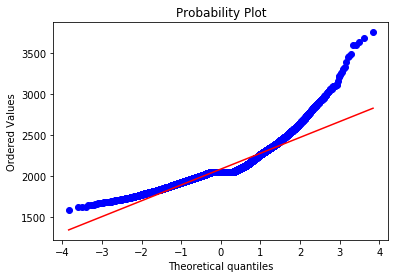

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.7092
Kurtosis: 5.3579


   Top 
Overview of variable:  gdat10 


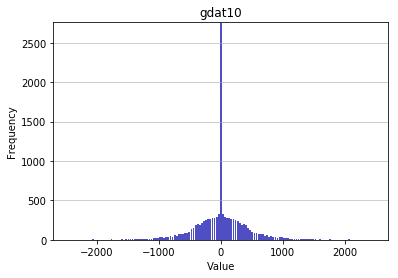

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2460.0
Mean: 0.0
Standard deviation: 425.976
Median: 0.0
Maximal value: 2460.0


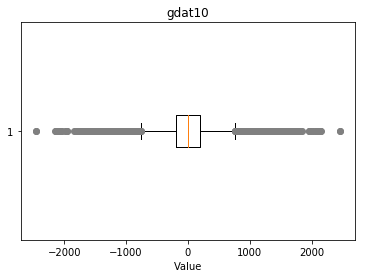

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1536.0, -1536.0, -1534.0, -1533.0, -1531.0, 1548.0, 2065.0, 2066.0, -2029.0, -1513.0, -1512.0, -1509.0, 2075.0, 1568.0, 2083.0, -1500.0, 2086.0, -1493.0, 1579.0, -1490.0, 1584.0, -1992.0, 1603.0, -1467.0, -1466.0, -1464.0, 1609.0, 1612.0, -1453.0, 2133.0, -1448.0, 2138.0, -1445.0, -1955.0, -1952.0, 1635.0, -2460.0, -2453.0, -1428.0, 2157.0, -1427.0, 1652.0, 1653.0, -1418.0, -1414.0, -1410.0, -1408.0, -1405.0, -1402.0, 1684.0, -1384.0, -1382.0, -1381.0, 1696.0, -1376.0, 1706.0, -1363.0, -1357.0, -1356.0, 1719.0, -1352.0, -1346.0, -1342.0, -1337.0, 1736.0, -1845.0, -1333.0, -1323.0, 1754.0, -1314.0, 1762.0, 1763.0, -1306.0, 1769.0, -1303.0, -1301.0, -1300.0, -1298.0, -1297.0, 1776.0, -1296.0, -1804.0, -1290.0, 1784.0, -1285.0, 1790.0, 1279.0, -1279.0, -1790.0, 1285.0, -1784.0, 1290.0, 1804.0, -1776.0, 1296.0, 1298.0, 1297.0, 1300.0, 1301.0, -1769.0, 1303.0, 1306.0, -1763.0, -1762.0, 1314.0, -1754.0, 1323.0,

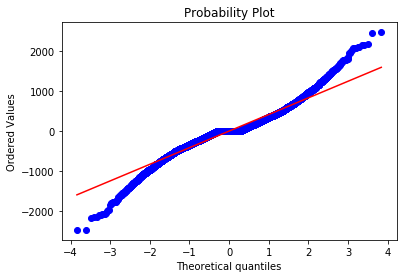

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 3.3497


   Middle 
Overview of variable:  gdat10 


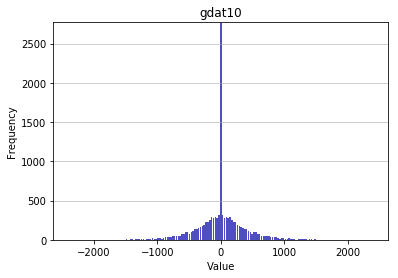

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2404.0
Mean: 0.0
Standard deviation: 383.956
Median: 0.0
Maximal value: 2404.0


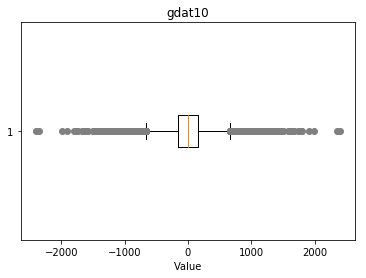

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-1506.0, -1497.0, 1577.0, -1485.0, -1475.0, -1987.0, -1473.0, 1602.0, -1469.0, -1453.0, 1621.0, -1436.0, -1433.0, 1645.0, -1423.0, -1421.0, -1418.0, 1657.0, -1409.0, 1154.0, 1160.0, -1396.0, 1677.0, -1395.0, -1394.0, -1392.0, 1166.0, 1170.0, -1904.0, 1173.0, 1178.0, -2404.0, 1180.0, -1372.0, 1190.0, 1191.0, -1368.0, -1355.0, 1207.0, -1352.0, 1212.0, 1215.0, 1219.0, -1340.0, 1733.0, 1223.0, -1336.0, -1335.0, 1225.0, -1330.0, 1231.0, 1230.0, -2350.0, -1325.0, -1317.0, 1244.0, -1316.0, 1246.0, -1312.0, 1249.0, 1251.0, -1307.0, -1306.0, -1305.0, 1768.0, 1256.0, 1260.0, 1264.0, -1806.0, -1293.0, -1292.0, 1270.0, -1287.0, 1790.0, -1790.0, 1287.0, -1270.0, 1292.0, 1293.0, 1806.0, -1264.0, -1260.0, -1768.0, -1256.0, 1305.0, 1307.0, 1306.0, -1251.0, -1249.0, 1312.0, -1246.0, -1244.0, 1316.0, 1317.0, 1325.0, 2350.0, -1231.0, 1330.0, -1230.0, 1335.0, 1336.0, -1223.0, -1225.0, -1733.0, 1340.0, -1219.0, -1215.0, -1212

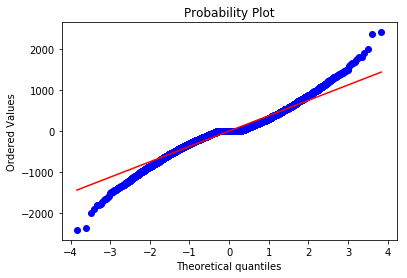

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 2.775


   Jungle 
Overview of variable:  gdat10 


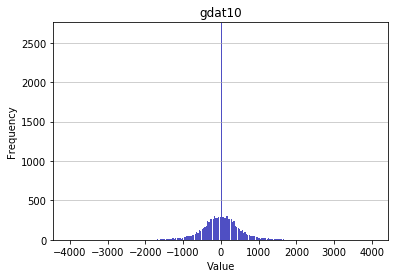

-------------------- 
Summary statistics:
 --------------------
Minimum value: -4033.0
Mean: 0.0
Standard deviation: 445.1808
Median: 0.0
Maximal value: 4033.0


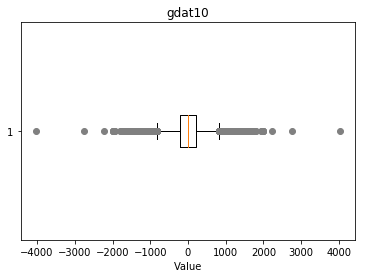

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1538.0, 1540.0, -1524.0, 1551.0, -1520.0, 1553.0, 1554.0, 1555.0, -1515.0, -1510.0, 1568.0, -1502.0, -1501.0, -1499.0, 1578.0, 1579.0, -1999.0, -1486.0, 1591.0, -1480.0, 1592.0, -1479.0, -1991.0, -4033.0, -1984.0, -1467.0, -1976.0, -1970.0, -1454.0, 1619.0, -1452.0, 1621.0, -1962.0, -1451.0, -1447.0, 1631.0, -1440.0, -1437.0, -1427.0, 1650.0, 1652.0, 1654.0, -1926.0, -1413.0, 1660.0, -1410.0, 1666.0, -1406.0, -1401.0, -1398.0, -1396.0, -1392.0, -1388.0, -1381.0, -1378.0, 1696.0, -1373.0, -1372.0, -1366.0, -1355.0, 2230.0, 1718.0, -1346.0, -1342.0, -1338.0, 1737.0, 2768.0, 1750.0, 1764.0, -1808.0, 1808.0, -1764.0, -1750.0, -2768.0, -1737.0, 1338.0, 1342.0, 1346.0, -2230.0, 1355.0, -1718.0, 1366.0, 1372.0, 1373.0, -1696.0, 1378.0, 1381.0, 1388.0, 1392.0, 1396.0, 1398.0, 1401.0, -1666.0, 1406.0, 1410.0, -1660.0, 1413.0, 1926.0, -1654.0, -1652.0, -1650.0, 1427.0, 1437.0, 1440.0, -1631.0, 1447.0, 1962.0, -1621

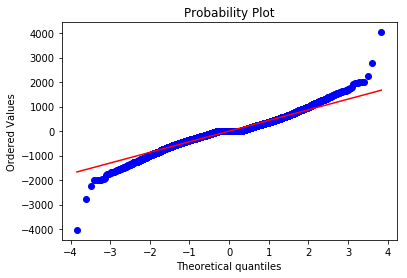

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 3.376


   ADC 
Overview of variable:  gdat10 


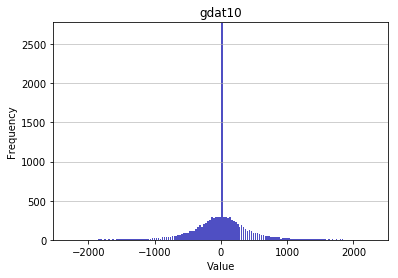

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2299.0
Mean: 0.0
Standard deviation: 426.255
Median: 0.0
Maximal value: 2299.0


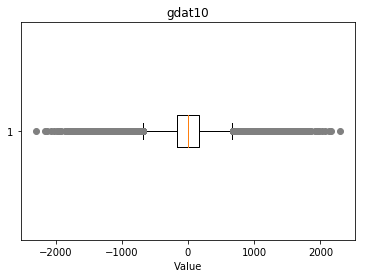

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-1535.0, 1543.0, -1528.0, 1544.0, -1526.0, -1521.0, -1520.0, -1519.0, 1555.0, -2027.0, 1558.0, -1512.0, 2073.0, -1511.0, 1563.0, 1564.0, -1502.0, 1576.0, -1495.0, -1496.0, -1491.0, -1489.0, -1483.0, -1472.0, -1470.0, -1466.0, -1975.0, -1463.0, -1459.0, 2129.0, -1453.0, -1964.0, 1619.0, -1450.0, 1626.0, 1628.0, -1955.0, 1632.0, -1436.0, -1432.0, 1643.0, -1428.0, -1938.0, 2160.0, -1423.0, -1923.0, -1410.0, -1406.0, -1404.0, -1403.0, -1402.0, -1399.0, 1674.0, -1395.0, 1690.0, 1691.0, 1694.0, -1372.0, 1701.0, 1704.0, -1362.0, -1361.0, -1357.0, -1861.0, 1723.0, -1343.0, 1732.0, 1734.0, -1334.0, -1333.0, -1332.0, -1328.0, 1745.0, -1836.0, 1751.0, -1320.0, -1831.0, -1317.0, -1828.0, 1757.0, -1823.0, -1309.0, -1305.0, -1304.0, -1303.0, -1813.0, -1300.0, -1811.0, -1297.0, -1296.0, -1295.0, -1809.0, -1292.0, -1290.0, -1289.0, -1802.0, -1286.0, 2299.0, 1788.0, -1283.0, -1281.0, 1281.0, 1283.0, -1788.0, -2299.0, 1286

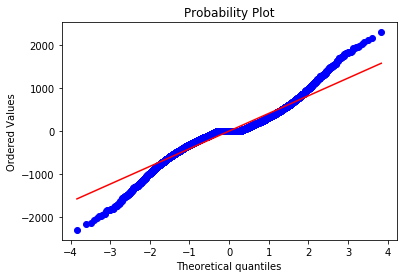

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 3.4403


   Support 
Overview of variable:  gdat10 


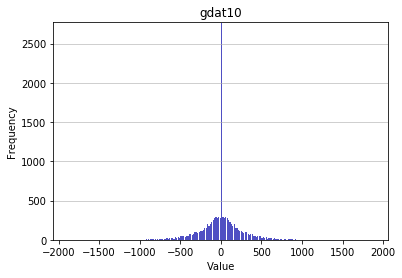

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1877.0
Mean: 0.0
Standard deviation: 256.5251
Median: 0.0
Maximal value: 1877.0


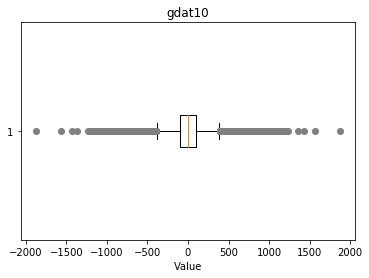

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-1021.0, -1015.0, 1034.0, 1038.0, 1039.0, -1006.0, -1003.0, -996.0, -994.0, -992.0, 1569.0, 1061.0, 1079.0, -968.0, -961.0, 1088.0, -959.0, 1093.0, 1106.0, -942.0, 1107.0, -941.0, -936.0, -928.0, -926.0, 1123.0, 1128.0, -919.0, -918.0, -1432.0, -916.0, -915.0, -912.0, -911.0, -903.0, -895.0, 1156.0, -886.0, -879.0, -876.0, -875.0, 1177.0, -871.0, -867.0, 1182.0, -865.0, -861.0, -859.0, -857.0, -1877.0, -1363.0, 1201.0, -845.0, -840.0, 1209.0, -838.0, -835.0, -833.0, -831.0, -830.0, -820.0, 1229.0, -815.0, -814.0, -807.0, -806.0, -805.0, -804.0, -802.0, -800.0, -799.0, -795.0, -790.0, -789.0, -787.0, -783.0, -782.0, -779.0, -778.0, -777.0, -771.0, 771.0, 777.0, 778.0, 779.0, 782.0, 783.0, 787.0, 789.0, 790.0, 795.0, 799.0, 800.0, 802.0, 804.0, 805.0, 806.0, 807.0, 814.0, 815.0, -1229.0, 820.0, 830.0, 831.0, 833.0, 835.0, 838.0, -1209.0, 840.0, 845.0, -1201.0, 1363.0, 1877.0, 857.0, 859.0, 861.0, 865.0, -11

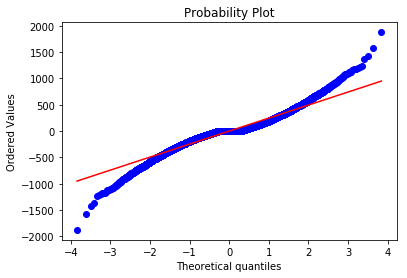

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 3.7022


   Top 
Overview of variable:  goldat15 


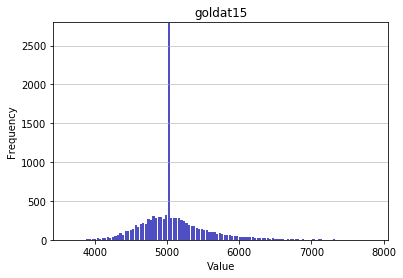

-------------------- 
Summary statistics:
 --------------------
Minimum value: 3634.0
Mean: 5084.8188
Standard deviation: 441.5544
Median: 5035.5
Maximal value: 7857.0


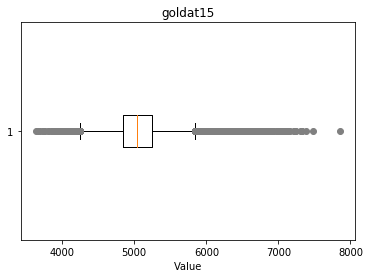

-------------------- 
Outlier detection:
 --------------------
List of outliers: {6658.0, 6662.0, 6664.0, 6666.0, 6673.0, 6690.0, 6693.0, 6695.0, 6697.0, 6698.0, 7217.0, 3634.0, 6707.0, 7219.0, 6715.0, 6717.0, 6719.0, 7236.0, 7243.0, 6736.0, 3669.0, 6742.0, 6743.0, 6751.0, 6754.0, 6761.0, 3695.0, 6775.0, 6778.0, 6788.0, 6792.0, 6796.0, 7309.0, 7313.0, 3730.0, 3731.0, 7316.0, 7327.0, 6821.0, 6823.0, 6829.0, 7857.0, 6834.0, 6837.0, 6868.0, 6875.0, 6876.0, 7387.0, 6894.0, 6903.0, 6904.0, 6913.0, 6921.0, 6415.0, 6416.0, 6417.0, 6418.0, 6930.0, 6419.0, 6421.0, 6420.0, 6425.0, 6426.0, 6430.0, 6434.0, 6437.0, 6446.0, 6448.0, 6450.0, 6452.0, 6965.0, 6457.0, 6458.0, 7486.0, 6464.0, 6468.0, 6470.0, 6471.0, 6472.0, 6986.0, 6478.0, 6481.0, 6483.0, 6486.0, 6999.0, 6488.0, 6492.0, 7005.0, 6494.0, 6498.0, 6503.0, 7016.0, 7017.0, 7021.0, 7022.0, 6510.0, 6511.0, 6514.0, 6515.0, 6516.0, 6518.0, 6522.0, 7035.0, 6524.0, 7036.0, 6529.0, 7045.0, 6540.0, 6545.0, 7059.0, 6552.0, 6555.0, 6556.0, 6560.0, 6567.0

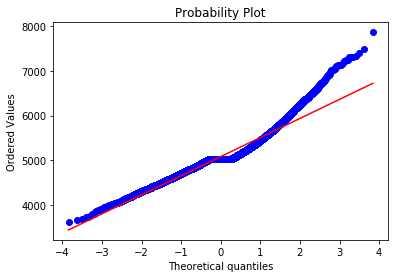

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.0347
Kurtosis: 2.6899


   Middle 
Overview of variable:  goldat15 


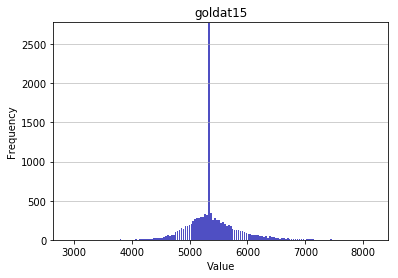

-------------------- 
Summary statistics:
 --------------------
Minimum value: 2906.0
Mean: 5392.1852
Standard deviation: 437.9005
Median: 5352.0
Maximal value: 8173.0


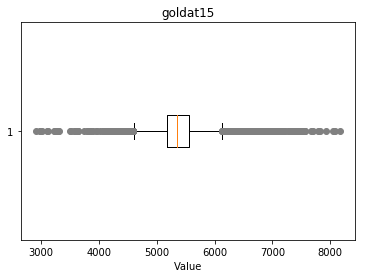

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3589.0, 3096.0, 7705.0, 3614.0, 7203.0, 7208.0, 3629.0, 3632.0, 6706.0, 3123.0, 7224.0, 6715.0, 6716.0, 3645.0, 6719.0, 6727.0, 6730.0, 6733.0, 6735.0, 6737.0, 6746.0, 6747.0, 6748.0, 6751.0, 6752.0, 7264.0, 6756.0, 7783.0, 6762.0, 6767.0, 6768.0, 7284.0, 6775.0, 7289.0, 6780.0, 6781.0, 6784.0, 6795.0, 3214.0, 7825.0, 3732.0, 6806.0, 6809.0, 7327.0, 6816.0, 6817.0, 7328.0, 3236.0, 7346.0, 6835.0, 6837.0, 6838.0, 3257.0, 6847.0, 6848.0, 7359.0, 6850.0, 3263.0, 7366.0, 6862.0, 3791.0, 6867.0, 3801.0, 3805.0, 3294.0, 6880.0, 6887.0, 6889.0, 3305.0, 6892.0, 3821.0, 6893.0, 7407.0, 6900.0, 7413.0, 6902.0, 7933.0, 6914.0, 6917.0, 6921.0, 6924.0, 7439.0, 6931.0, 3859.0, 7447.0, 6937.0, 7450.0, 6943.0, 7457.0, 6954.0, 6957.0, 7472.0, 3892.0, 6969.0, 6972.0, 6975.0, 6980.0, 7493.0, 6982.0, 6983.0, 6992.0, 7506.0, 6997.0, 7511.0, 2906.0, 7005.0, 7019.0, 7022.0, 3950.0, 7026.0, 8054.0, 3961.0, 7550.0, 7040.0, 7556.0

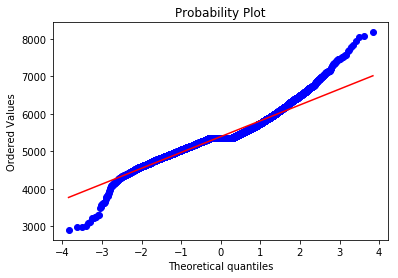

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7123
Kurtosis: 3.561


   Jungle 
Overview of variable:  goldat15 


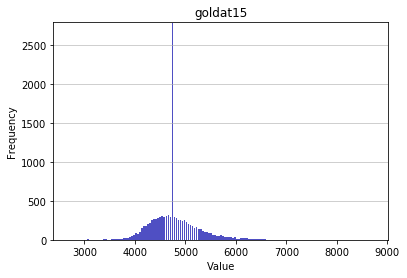

-------------------- 
Summary statistics:
 --------------------
Minimum value: 2687.0
Mean: 4774.2816
Standard deviation: 464.9939
Median: 4731.0
Maximal value: 8720.0


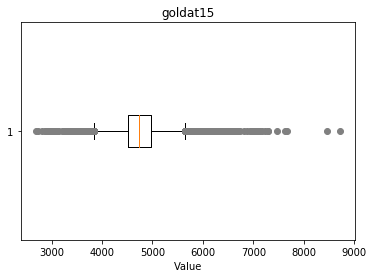

-------------------- 
Outlier detection:
 --------------------
List of outliers: {6661.0, 7179.0, 8720.0, 6172.0, 3101.0, 6178.0, 6180.0, 6693.0, 6182.0, 6184.0, 6186.0, 6699.0, 6187.0, 6190.0, 6191.0, 6703.0, 3124.0, 6197.0, 6200.0, 6201.0, 6203.0, 6204.0, 7229.0, 6205.0, 3131.0, 6208.0, 6209.0, 6212.0, 6214.0, 6729.0, 6218.0, 6219.0, 6220.0, 6221.0, 6222.0, 6234.0, 6235.0, 6237.0, 6238.0, 6241.0, 6246.0, 6247.0, 6253.0, 6262.0, 6265.0, 6267.0, 7292.0, 7291.0, 2687.0, 6272.0, 6282.0, 6285.0, 3216.0, 6289.0, 6297.0, 6306.0, 3238.0, 6823.0, 6313.0, 6315.0, 2732.0, 3245.0, 6326.0, 3256.0, 6331.0, 3259.0, 6334.0, 6338.0, 6340.0, 6343.0, 6352.0, 3283.0, 6356.0, 6359.0, 6367.0, 6370.0, 6883.0, 3304.0, 6377.0, 6386.0, 3325.0, 6399.0, 6400.0, 6401.0, 2818.0, 3328.0, 6413.0, 6927.0, 8465.0, 6418.0, 6419.0, 6420.0, 6421.0, 3348.0, 3358.0, 6433.0, 6951.0, 7468.0, 6445.0, 3379.0, 6454.0, 6456.0, 2876.0, 6466.0, 6984.0, 2891.0, 2892.0, 6480.0, 6995.0, 6999.0, 6497.0, 6498.0, 6499.0, 6500.0, 2917.0

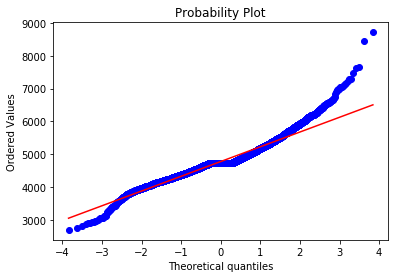

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.8512
Kurtosis: 3.3909


   ADC 
Overview of variable:  goldat15 


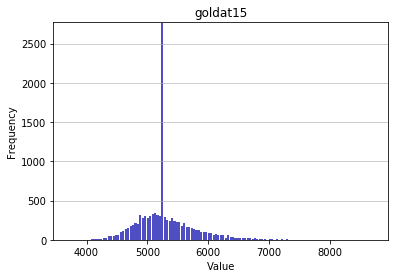

-------------------- 
Summary statistics:
 --------------------
Minimum value: 3703.0
Mean: 5292.4466
Standard deviation: 468.056
Median: 5234.0
Maximal value: 8710.0


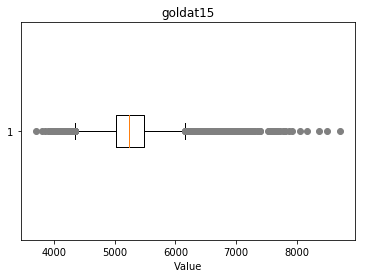

-------------------- 
Outlier detection:
 --------------------
List of outliers: {8710.0, 7694.0, 7184.0, 7188.0, 7189.0, 6698.0, 6700.0, 6701.0, 7214.0, 7725.0, 6704.0, 7219.0, 6708.0, 6709.0, 7220.0, 6713.0, 6716.0, 6722.0, 7234.0, 6724.0, 6725.0, 7236.0, 6729.0, 6731.0, 6735.0, 7762.0, 6739.0, 6742.0, 6750.0, 6752.0, 7269.0, 6758.0, 6761.0, 7274.0, 6763.0, 6765.0, 6767.0, 6768.0, 6769.0, 7283.0, 7796.0, 7284.0, 6771.0, 3703.0, 7800.0, 6778.0, 7292.0, 7294.0, 6782.0, 6787.0, 6789.0, 6790.0, 6802.0, 6804.0, 6808.0, 6810.0, 6811.0, 6814.0, 6815.0, 6816.0, 6818.0, 6819.0, 7338.0, 6827.0, 8368.0, 6833.0, 7867.0, 7355.0, 6848.0, 6854.0, 6861.0, 6869.0, 6870.0, 6871.0, 3804.0, 6876.0, 7391.0, 6880.0, 6882.0, 7394.0, 6886.0, 6891.0, 7920.0, 6904.0, 6907.0, 6921.0, 6925.0, 3857.0, 6933.0, 6941.0, 6942.0, 6943.0, 8486.0, 6964.0, 6974.0, 6977.0, 6988.0, 6990.0, 6994.0, 6998.0, 7015.0, 7530.0, 7533.0, 7022.0, 8050.0, 7036.0, 7037.0, 7038.0, 7039.0, 7041.0, 7046.0, 7562.0, 7053.0, 7061.0, 7071.0

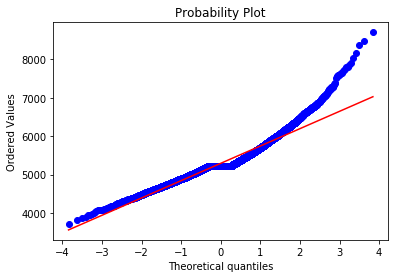

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.0577
Kurtosis: 2.9769


   Support 
Overview of variable:  goldat15 


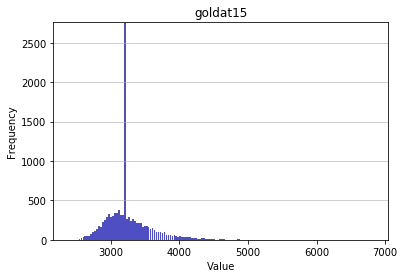

-------------------- 
Summary statistics:
 --------------------
Minimum value: 2388.0
Mean: 3263.861
Standard deviation: 340.6013
Median: 3209.0
Maximal value: 6825.0


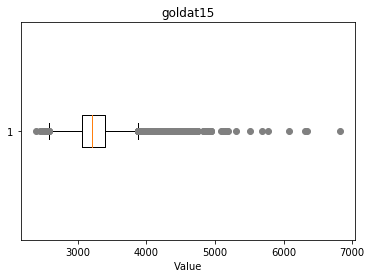

-------------------- 
Outlier detection:
 --------------------
List of outliers: {5122.0, 4612.0, 4616.0, 4624.0, 5139.0, 4628.0, 4631.0, 4633.0, 4634.0, 4635.0, 4638.0, 4648.0, 4659.0, 5686.0, 4663.0, 4667.0, 5179.0, 5183.0, 4672.0, 4681.0, 4695.0, 4706.0, 4735.0, 4742.0, 4743.0, 4752.0, 5777.0, 6306.0, 6825.0, 5311.0, 4287.0, 4288.0, 4290.0, 4291.0, 6339.0, 4293.0, 4298.0, 4305.0, 4311.0, 4824.0, 4312.0, 4315.0, 4316.0, 4317.0, 4322.0, 4323.0, 4325.0, 4328.0, 4329.0, 4330.0, 4841.0, 4332.0, 4333.0, 4840.0, 4335.0, 4339.0, 4340.0, 4342.0, 4343.0, 4856.0, 4344.0, 4855.0, 4346.0, 4348.0, 4349.0, 4351.0, 4352.0, 4353.0, 4356.0, 4359.0, 4360.0, 4872.0, 4362.0, 4364.0, 4366.0, 4367.0, 4879.0, 4369.0, 4883.0, 4373.0, 4374.0, 4893.0, 4383.0, 4385.0, 4388.0, 4389.0, 4391.0, 4397.0, 4401.0, 4404.0, 4406.0, 4407.0, 4920.0, 4411.0, 4412.0, 4413.0, 4419.0, 4420.0, 4421.0, 4422.0, 4936.0, 4426.0, 4429.0, 4942.0, 4941.0, 4430.0, 4441.0, 4448.0, 4451.0, 4452.0, 4453.0, 4459.0, 4461.0, 4463.0, 4465.0

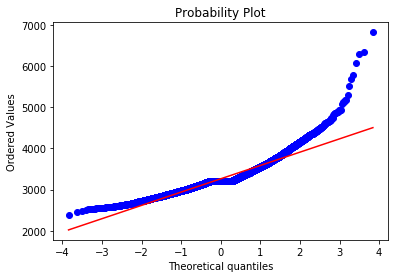

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.5027
Kurtosis: 5.4687


   Top 
Overview of variable:  gdat15 


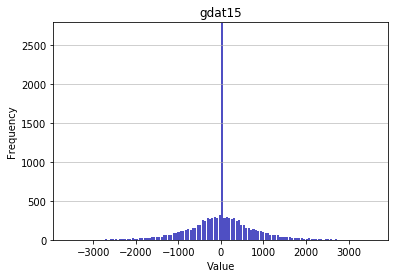

-------------------- 
Summary statistics:
 --------------------
Minimum value: -3579.0
Mean: 0.0
Standard deviation: 721.3729
Median: 0.0
Maximal value: 3579.0


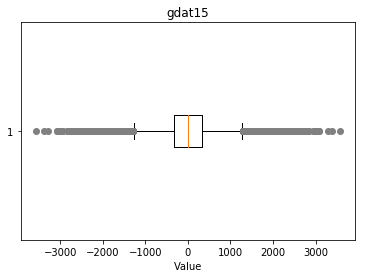

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-3579.0, 3081.0, 2569.0, -2546.0, 3088.0, 2578.0, -2538.0, -2536.0, -3042.0, -2526.0, 2597.0, 2612.0, -2502.0, -3011.0, -2494.0, -2488.0, -2998.0, 2639.0, -2980.0, -2467.0, 2654.0, -2465.0, -2463.0, -2458.0, -2455.0, 2669.0, 2673.0, 2169.0, 2173.0, 2686.0, 2176.0, -2431.0, 2178.0, 2691.0, 2694.0, -2933.0, -2421.0, 2200.0, 2204.0, -2399.0, 2723.0, 2212.0, 2211.0, 2218.0, 2736.0, 2225.0, -2382.0, -2383.0, 2232.0, 2233.0, 2240.0, 2241.0, 2243.0, 2245.0, -2360.0, -2356.0, -2354.0, -3376.0, -2351.0, -2350.0, 2260.0, 2773.0, 3290.0, 2268.0, 2270.0, -2336.0, 2274.0, 2276.0, -2836.0, 2287.0, -2321.0, 2295.0, 2808.0, 2296.0, 2301.0, -2819.0, 2303.0, -2303.0, -2301.0, 2819.0, -2296.0, -2295.0, -2808.0, -2287.0, 2321.0, 2836.0, -2276.0, -2274.0, 2336.0, -2270.0, -2268.0, -3290.0, -2773.0, -2260.0, 2350.0, 2351.0, 3376.0, 2354.0, 2356.0, 2360.0, -2245.0, -2243.0, -2241.0, -2240.0, -2233.0, -2232.0, 2382.0, -2225.0, -

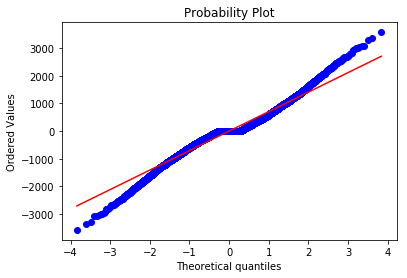

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 2.0496


   Middle 
Overview of variable:  gdat15 


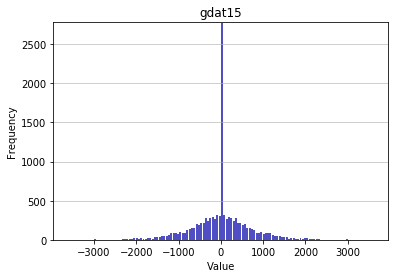

-------------------- 
Summary statistics:
 --------------------
Minimum value: -3601.0
Mean: 0.0
Standard deviation: 681.163
Median: 0.0
Maximal value: 3601.0


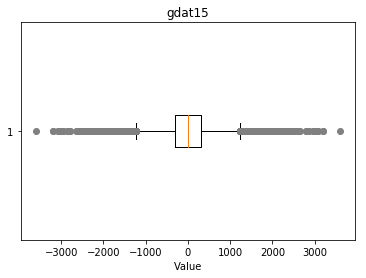

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2048.0, -2048.0, 2050.0, -2045.0, -2554.0, 3080.0, 2569.0, 2571.0, 2061.0, 3087.0, 3601.0, 2066.0, 2065.0, 2580.0, -2536.0, 2075.0, -3038.0, 2085.0, -2517.0, -2496.0, -3005.0, 2116.0, -2492.0, 2119.0, -2999.0, 2125.0, 2129.0, 2134.0, 2647.0, 2137.0, -2982.0, 2153.0, -2449.0, 2160.0, -2955.0, -2952.0, 2170.0, 2172.0, 2175.0, 3199.0, 2178.0, 3204.0, -2419.0, -2402.0, -2397.0, 2216.0, 2218.0, 2221.0, -2382.0, 2227.0, 2233.0, -2374.0, 2234.0, 2240.0, 2253.0, -2865.0, -2343.0, 2266.0, 2273.0, 2274.0, 2786.0, -2841.0, 2284.0, -2322.0, -2320.0, 2801.0, -2315.0, -2821.0, 2303.0, -2303.0, 2821.0, 2315.0, -2801.0, 2320.0, 2322.0, -2284.0, 2841.0, -2274.0, -2273.0, -2786.0, -2266.0, 2343.0, 2865.0, -2253.0, -2240.0, 2374.0, -2233.0, -2234.0, -2227.0, 2382.0, -2221.0, -2218.0, -2216.0, 2397.0, 2402.0, 2419.0, -3204.0, -2178.0, -2175.0, -3199.0, -2172.0, -2170.0, 2952.0, 2955.0, -2160.0, 2449.0, -2153.0, 2982.0, -2137

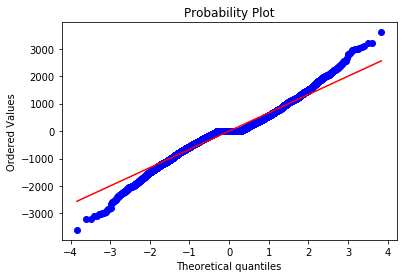

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 2.1756


   Jungle 
Overview of variable:  gdat15 


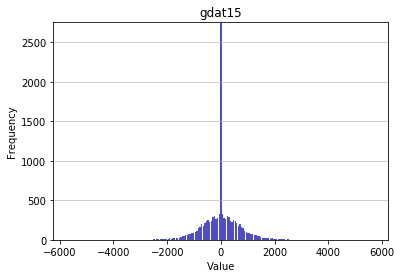

-------------------- 
Summary statistics:
 --------------------
Minimum value: -5672.0
Mean: 0.0
Standard deviation: 698.734
Median: 0.0
Maximal value: 5672.0


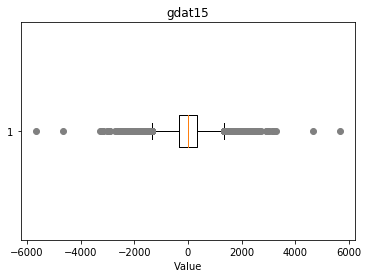

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-2553.0, 2567.0, 2582.0, 2597.0, -2520.0, 5672.0, 4650.0, -3029.0, -2516.0, 2108.0, -2500.0, -2498.0, 2112.0, 2113.0, 2627.0, 2117.0, 2118.0, 2119.0, 2121.0, -2485.0, 3149.0, 2126.0, -2992.0, 2129.0, 3154.0, 2135.0, 2655.0, -2463.0, 2149.0, 2152.0, 2160.0, 2161.0, -2955.0, 2166.0, 2167.0, 2168.0, 2185.0, -2421.0, 2189.0, 2190.0, -2929.0, 2196.0, 3221.0, 2201.0, -2918.0, 2210.0, 2212.0, 2730.0, 2221.0, 2232.0, 2234.0, 2236.0, -2369.0, -2367.0, -2366.0, -2361.0, 3274.0, -2355.0, 2255.0, -2351.0, 2261.0, 2266.0, -2338.0, -2336.0, 2284.0, -2321.0, -2314.0, -2308.0, -2305.0, 2304.0, 2305.0, -2304.0, 2308.0, 2314.0, 2321.0, -2284.0, 2336.0, 2338.0, -2266.0, -2261.0, 2351.0, -2255.0, 2355.0, -3274.0, 2361.0, 2366.0, 2367.0, 2369.0, -2236.0, -2234.0, -2232.0, -2221.0, -2730.0, -2212.0, -2210.0, 2918.0, -2201.0, -3221.0, -2196.0, 2929.0, -2190.0, -2189.0, 2421.0, -2185.0, -2168.0, -2167.0, -2166.0, 2955.0, -2567.0

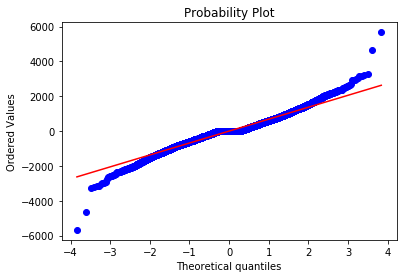

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 2.729


   ADC 
Overview of variable:  gdat15 


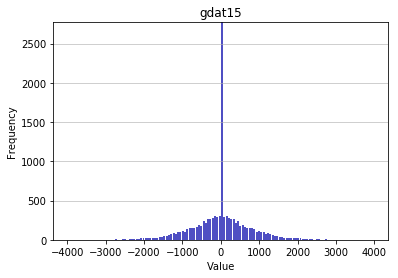

-------------------- 
Summary statistics:
 --------------------
Minimum value: -3970.0
Mean: 0.0
Standard deviation: 755.7818
Median: 0.0
Maximal value: 3970.0


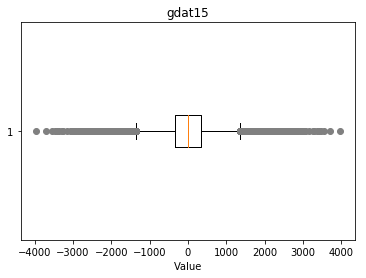

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-2547.0, -2546.0, -3057.0, 2577.0, -2539.0, -3048.0, -2535.0, -3556.0, -3042.0, -2526.0, -2499.0, -2494.0, -3005.0, 2639.0, 2647.0, -2472.0, -2466.0, 3168.0, -2975.0, -3480.0, 3699.0, 2685.0, -3970.0, -2433.0, -2414.0, -2924.0, 2709.0, 2714.0, -2403.0, -2402.0, -3426.0, 2727.0, 2733.0, -2385.0, -2380.0, -2371.0, 3262.0, 2750.0, -2360.0, -2870.0, -2344.0, -2341.0, 3293.0, 2270.0, 2782.0, -2334.0, 2275.0, 2787.0, -2331.0, -3357.0, 2282.0, 2284.0, -2833.0, -2321.0, -2827.0, -2307.0, 2307.0, 2827.0, 2833.0, 2321.0, -2284.0, -2282.0, 2331.0, -2275.0, 2334.0, -2787.0, 3357.0, -2270.0, -3293.0, -2782.0, 2341.0, 2344.0, 2870.0, 2360.0, -3262.0, 2371.0, -2750.0, 2380.0, 2385.0, -2733.0, -2727.0, 2402.0, 2403.0, 3426.0, -2714.0, -2709.0, 2924.0, 2414.0, 2433.0, 3970.0, -2685.0, -3699.0, 3480.0, 2975.0, -3168.0, 2466.0, 2472.0, -2647.0, -2639.0, 3005.0, 2494.0, 2499.0, 2526.0, 3042.0, 3556.0, 2535.0, 3048.0, 2539.0,

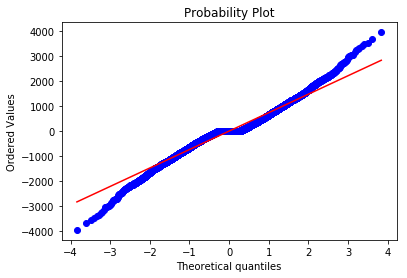

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 1.9001


   Support 
Overview of variable:  gdat15 


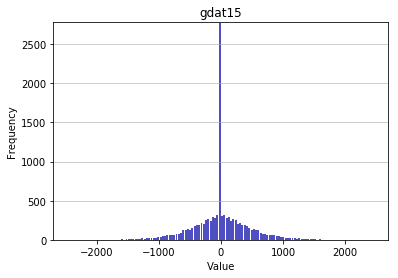

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2452.0
Mean: 0.0
Standard deviation: 450.7197
Median: 0.0
Maximal value: 2452.0


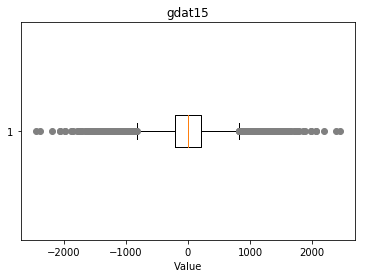

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-1534.0, -1532.0, 1547.0, 2061.0, 2063.0, -1520.0, -1519.0, 1564.0, 1565.0, -1498.0, 1576.0, 1582.0, 1584.0, 1585.0, -1485.0, -1481.0, -1989.0, 1600.0, -1471.0, -1467.0, -1465.0, -1462.0, 1616.0, -1455.0, -1451.0, -1448.0, -1446.0, -1444.0, -1442.0, -1441.0, -1434.0, -1433.0, -1431.0, -1430.0, -2452.0, -1424.0, 1649.0, -1416.0, -1415.0, -1414.0, -1412.0, -1410.0, -1408.0, 1665.0, -1403.0, -1402.0, -1394.0, 2191.0, -1388.0, -1385.0, -1382.0, -1376.0, -1880.0, 1710.0, -2385.0, -1360.0, 1718.0, 1735.0, -1846.0, 1761.0, 1785.0, -1785.0, -1761.0, 1846.0, -1735.0, -1718.0, 1360.0, 2385.0, -1710.0, 1880.0, 1376.0, 1382.0, 1385.0, 1388.0, -2191.0, 1394.0, 1402.0, 1403.0, -1665.0, 1408.0, 1410.0, 1412.0, 1414.0, 1415.0, 1416.0, -1649.0, 1424.0, 2452.0, 1430.0, 1431.0, 1433.0, 1434.0, 1441.0, 1442.0, 1444.0, 1446.0, 1448.0, 1451.0, 1455.0, -1616.0, 1462.0, 1465.0, 1467.0, 1471.0, -1600.0, 1989.0, 1481.0, 1485.0, -1

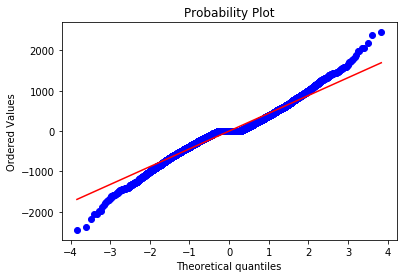

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 2.0002


   Top 
Overview of variable:  xpat10 


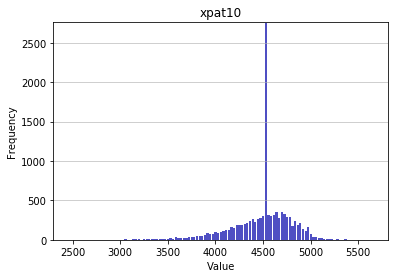

-------------------- 
Summary statistics:
 --------------------
Minimum value: 2457.0
Mean: 4483.4953
Standard deviation: 316.1543
Median: 4522.0
Maximal value: 5658.0


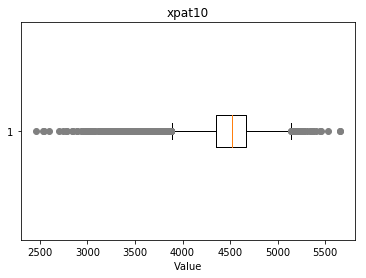

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3079.0, 5653.0, 5658.0, 2600.0, 3113.0, 3126.0, 3131.0, 3135.0, 3163.0, 3167.0, 3169.0, 3170.0, 3177.0, 3182.0, 3184.0, 3199.0, 3201.0, 3202.0, 3203.0, 3208.0, 2702.0, 3219.0, 3234.0, 3245.0, 3251.0, 3252.0, 3257.0, 2748.0, 3276.0, 3282.0, 3283.0, 3285.0, 2778.0, 2782.0, 3297.0, 3300.0, 3308.0, 3311.0, 3315.0, 3325.0, 3331.0, 3332.0, 3334.0, 3338.0, 3340.0, 3341.0, 3342.0, 3345.0, 3346.0, 3349.0, 2840.0, 3352.0, 3359.0, 2849.0, 3363.0, 3368.0, 3370.0, 3371.0, 3372.0, 3373.0, 3374.0, 3375.0, 3376.0, 3378.0, 3384.0, 3388.0, 3397.0, 2888.0, 3400.0, 3403.0, 5451.0, 3405.0, 2895.0, 3407.0, 5457.0, 3412.0, 3416.0, 3418.0, 3421.0, 3423.0, 3426.0, 3428.0, 3429.0, 3439.0, 3440.0, 2928.0, 3443.0, 3446.0, 3447.0, 3448.0, 3450.0, 3452.0, 3459.0, 3466.0, 3467.0, 2955.0, 3475.0, 3477.0, 3478.0, 2457.0, 3481.0, 3483.0, 3484.0, 5532.0, 2973.0, 3487.0, 3488.0, 3492.0, 3499.0, 3503.0, 2995.0, 3507.0, 3510.0, 3512.0, 3001.0

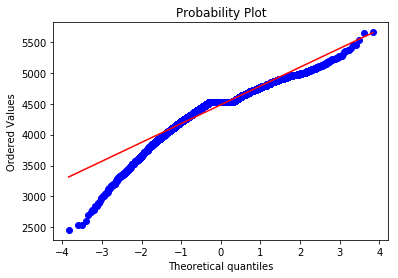

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -1.1381
Kurtosis: 2.8367


   Middle 
Overview of variable:  xpat10 


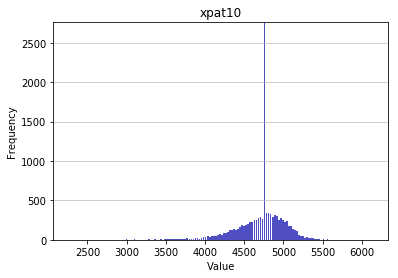

-------------------- 
Summary statistics:
 --------------------
Minimum value: 2259.0
Mean: 4712.6177
Standard deviation: 310.6443
Median: 4752.0
Maximal value: 6146.0


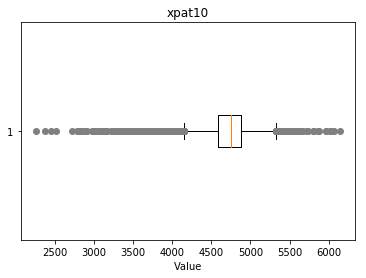

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3585.0, 6146.0, 3081.0, 3596.0, 3606.0, 3096.0, 3609.0, 3100.0, 3102.0, 5666.0, 3108.0, 3622.0, 3623.0, 3626.0, 3632.0, 3125.0, 3641.0, 3644.0, 3650.0, 3651.0, 3655.0, 3656.0, 3146.0, 3659.0, 3156.0, 3670.0, 3673.0, 3676.0, 5726.0, 5728.0, 5729.0, 3171.0, 3684.0, 3685.0, 3683.0, 3687.0, 3693.0, 3694.0, 3695.0, 3702.0, 3704.0, 3705.0, 3706.0, 3708.0, 3710.0, 3713.0, 3715.0, 3717.0, 3720.0, 3723.0, 3724.0, 3726.0, 3727.0, 3215.0, 3730.0, 3731.0, 3733.0, 3738.0, 3741.0, 3742.0, 3744.0, 2721.0, 3746.0, 5794.0, 3753.0, 3757.0, 3758.0, 3760.0, 3761.0, 3251.0, 3763.0, 3765.0, 3766.0, 5813.0, 3768.0, 3770.0, 3771.0, 3774.0, 3775.0, 3776.0, 3278.0, 3281.0, 3282.0, 2259.0, 3292.0, 2781.0, 3299.0, 3304.0, 5865.0, 3309.0, 2805.0, 5878.0, 2809.0, 3322.0, 3331.0, 3352.0, 2842.0, 3356.0, 2849.0, 3362.0, 3361.0, 3363.0, 3365.0, 3372.0, 3373.0, 3379.0, 3385.0, 3388.0, 2374.0, 5959.0, 5963.0, 2892.0, 3411.0, 2911.0, 3436.0

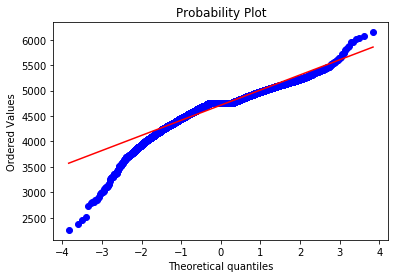

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -1.2427
Kurtosis: 4.6327


   Jungle 
Overview of variable:  xpat10 


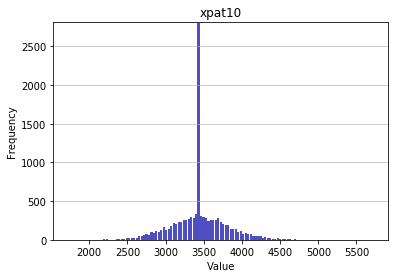

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1728.0
Mean: 3445.4673
Standard deviation: 360.4214
Median: 3440.0
Maximal value: 5719.0


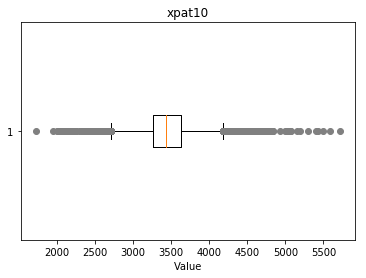

-------------------- 
Outlier detection:
 --------------------
List of outliers: {4609.0, 4610.0, 2049.0, 4616.0, 2063.0, 2067.0, 4631.0, 4639.0, 4640.0, 5155.0, 2086.0, 2099.0, 4665.0, 4675.0, 2117.0, 4681.0, 5197.0, 2126.0, 4687.0, 5719.0, 4697.0, 4700.0, 2143.0, 4705.0, 2163.0, 4729.0, 2174.0, 4739.0, 4741.0, 2190.0, 2198.0, 2207.0, 4769.0, 4771.0, 2214.0, 2219.0, 5292.0, 4789.0, 2230.0, 2234.0, 2236.0, 4799.0, 1728.0, 4801.0, 2249.0, 2251.0, 4820.0, 4838.0, 4839.0, 2295.0, 2323.0, 5402.0, 2337.0, 2348.0, 2353.0, 5432.0, 2361.0, 2364.0, 4929.0, 5500.0, 4999.0, 5026.0, 1960.0, 5040.0, 4531.0, 4532.0, 4534.0, 4539.0, 4540.0, 4541.0, 5055.0, 4544.0, 4546.0, 5058.0, 5587.0, 5078.0, 4568.0, 2008.0, 4571.0, 2013.0, 4574.0, 4577.0, 2021.0, 4588.0, 4607.0}


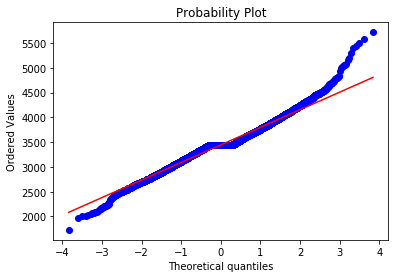

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.2042
Kurtosis: 1.7095


   ADC 
Overview of variable:  xpat10 


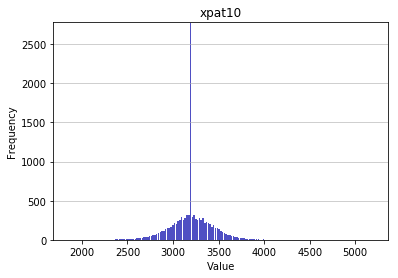

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1853.0
Mean: 3204.2769
Standard deviation: 232.1112
Median: 3202.0
Maximal value: 5197.0


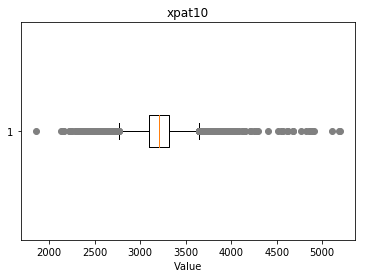

-------------------- 
Outlier detection:
 --------------------
List of outliers: {4610.0, 4621.0, 4122.0, 4127.0, 4144.0, 4154.0, 4157.0, 5181.0, 4681.0, 4684.0, 5197.0, 2128.0, 4203.0, 2157.0, 4212.0, 2165.0, 4246.0, 4764.0, 2213.0, 4270.0, 2230.0, 2240.0, 4294.0, 2249.0, 4822.0, 2286.0, 4854.0, 2298.0, 2302.0, 4864.0, 4884.0, 2327.0, 2330.0, 2334.0, 2344.0, 2350.0, 2355.0, 4915.0, 4409.0, 2365.0, 3902.0, 1853.0, 2368.0, 2369.0, 3904.0, 2370.0, 3908.0, 3907.0, 2373.0, 3911.0, 3910.0, 3913.0, 3912.0, 3915.0, 3919.0, 3922.0, 2387.0, 3925.0, 2392.0, 3928.0, 3933.0, 3934.0, 3935.0, 2400.0, 2401.0, 2397.0, 3937.0, 3942.0, 2408.0, 3945.0, 2411.0, 2415.0, 2419.0, 2420.0, 2422.0, 3959.0, 3962.0, 2430.0, 2433.0, 2435.0, 2436.0, 2440.0, 2444.0, 3980.0, 3985.0, 2451.0, 2453.0, 2455.0, 3992.0, 2457.0, 3994.0, 2459.0, 2460.0, 2461.0, 2458.0, 3995.0, 2464.0, 4001.0, 4002.0, 2468.0, 2469.0, 4004.0, 4517.0, 2473.0, 4010.0, 2483.0, 2485.0, 2491.0, 4032.0, 4033.0, 4545.0, 2499.0, 2500.0, 2502.0, 2504.0

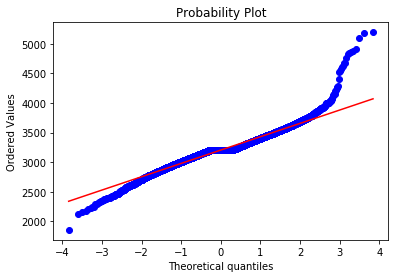

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.3879
Kurtosis: 4.7526


   Support 
Overview of variable:  xpat10 


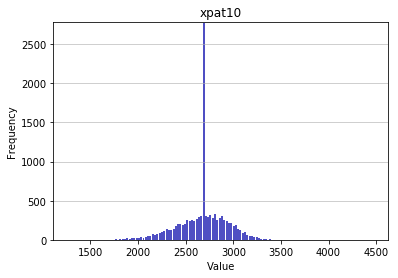

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1270.0
Mean: 2677.2182
Standard deviation: 255.5649
Median: 2695.0
Maximal value: 4469.0


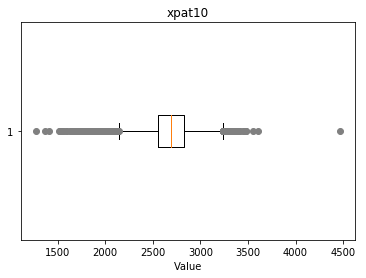

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1664.0, 1793.0, 1413.0, 1670.0, 1804.0, 1806.0, 1551.0, 1553.0, 1810.0, 3604.0, 1813.0, 3479.0, 1816.0, 1817.0, 1690.0, 1819.0, 1818.0, 3482.0, 1822.0, 1824.0, 1702.0, 1831.0, 1834.0, 1835.0, 1838.0, 1839.0, 1843.0, 1844.0, 1588.0, 1845.0, 1847.0, 1720.0, 1850.0, 1851.0, 1853.0, 1598.0, 1855.0, 1728.0, 1859.0, 1863.0, 1864.0, 1869.0, 1872.0, 1873.0, 1746.0, 1874.0, 1877.0, 1366.0, 1879.0, 1880.0, 1878.0, 1882.0, 1881.0, 1883.0, 1884.0, 1631.0, 1887.0, 1761.0, 3454.0, 1763.0, 1888.0, 1893.0, 3552.0, 1892.0, 1512.0, 1641.0, 1897.0, 1895.0, 1644.0, 1773.0, 1903.0, 1904.0, 1906.0, 1523.0, 1907.0, 1909.0, 1270.0, 1783.0, 1653.0, 4469.0, 1532.0, 1790.0}


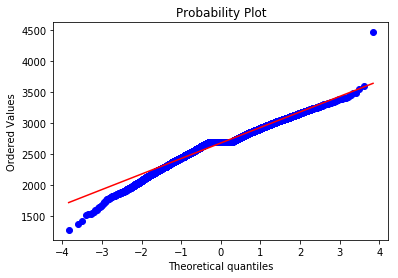

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.518
Kurtosis: 1.3817


   Top 
Overview of variable:  xpdat10 


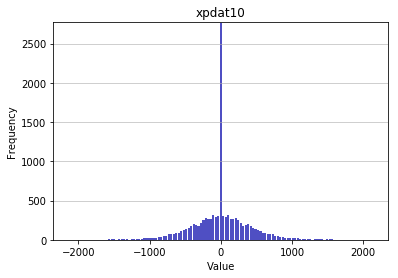

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2140.0
Mean: 0.0
Standard deviation: 413.5448
Median: 0.0
Maximal value: 2140.0


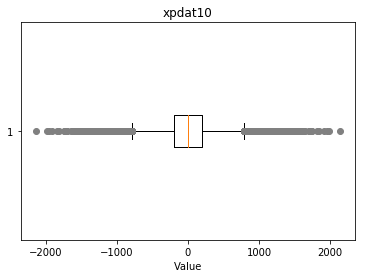

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-1536.0, 1536.0, -1534.0, -1525.0, 1549.0, -1521.0, 1552.0, 1560.0, -1505.0, 1578.0, -1490.0, 1584.0, -1486.0, -1478.0, -1989.0, 1600.0, -1462.0, 2140.0, 1630.0, -1952.0, -1439.0, -1429.0, 1645.0, -1425.0, -1422.0, -1420.0, -1411.0, -1407.0, -1406.0, -1405.0, -1911.0, -1385.0, -1383.0, -1373.0, -1369.0, 1703.0, -1366.0, 1707.0, -1365.0, -1361.0, -1355.0, -1352.0, -1348.0, 1724.0, 1727.0, -1343.0, -1336.0, -1335.0, -1334.0, 1740.0, -1328.0, -1837.0, -1324.0, -1323.0, -1321.0, 1241.0, -1315.0, 1247.0, -1313.0, 1253.0, -1306.0, -1816.0, 1258.0, -1296.0, 1267.0, -1291.0, 1277.0, -1277.0, 1291.0, -1267.0, 1296.0, -1258.0, 1816.0, 1306.0, -1253.0, -1247.0, 1313.0, 1315.0, -1241.0, 1321.0, 1323.0, 1324.0, 1837.0, 1328.0, -1740.0, 1334.0, 1335.0, 1336.0, 1343.0, -1727.0, 1348.0, -1724.0, 1352.0, 1355.0, 1361.0, -1707.0, 1366.0, 1365.0, 1369.0, -1703.0, 1373.0, 1383.0, 1385.0, 1911.0, 1405.0, 1406.0, 1407.0, 1411.

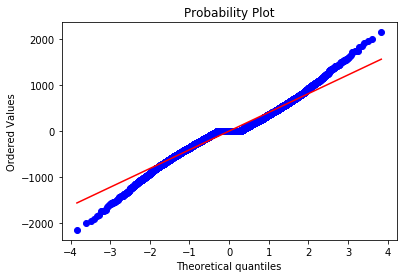

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 2.0478


   Middle 
Overview of variable:  xpdat10 


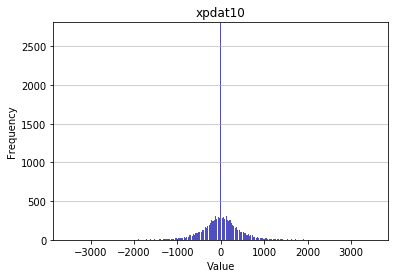

-------------------- 
Summary statistics:
 --------------------
Minimum value: -3506.0
Mean: 0.0
Standard deviation: 402.5621
Median: 0.0
Maximal value: 3506.0


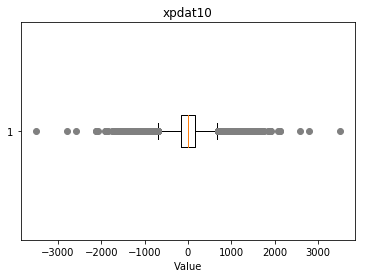

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1538.0, -1533.0, 1542.0, 1543.0, 2571.0, 1550.0, 1567.0, 2080.0, -1491.0, 1586.0, -1484.0, 1603.0, 2116.0, 2123.0, 1613.0, -3506.0, -1454.0, 1619.0, -1448.0, -1446.0, 1629.0, 1633.0, 1635.0, 1636.0, 1638.0, -1424.0, -1423.0, 1655.0, -1414.0, -1412.0, -1410.0, -1405.0, -1401.0, -1400.0, 1673.0, -1905.0, -1390.0, 1683.0, 1689.0, -1382.0, -1893.0, -1380.0, -1375.0, -1887.0, -1884.0, -1368.0, 1704.0, 1707.0, -1364.0, 1708.0, -1355.0, 1208.0, -1859.0, 1214.0, 1215.0, 1727.0, 1219.0, 1220.0, -1338.0, 1227.0, 1228.0, 1233.0, -1326.0, 1235.0, -1836.0, 1237.0, -1323.0, -1320.0, 1752.0, 1242.0, 1246.0, 1247.0, 2787.0, -1302.0, -1301.0, 1262.0, 1263.0, 1264.0, 1266.0, -1294.0, 1271.0, 1272.0, -1287.0, 1278.0, -1278.0, 1287.0, -1272.0, -1271.0, -1266.0, 1294.0, -1264.0, -1263.0, -1262.0, 1301.0, 1302.0, -2787.0, -1247.0, -1246.0, -1242.0, 1320.0, -1752.0, -1237.0, 1323.0, -1235.0, 1326.0, -1233.0, 1836.0, -1228.0, -1

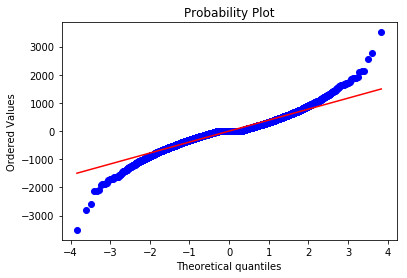

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 4.3839


   Jungle 
Overview of variable:  xpdat10 


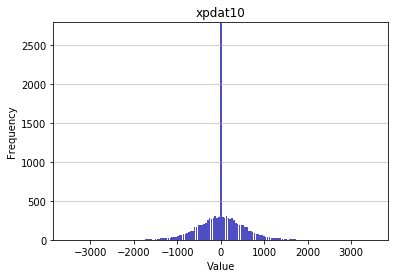

-------------------- 
Summary statistics:
 --------------------
Minimum value: -3505.0
Mean: 0.0
Standard deviation: 484.0388
Median: 0.0
Maximal value: 3505.0


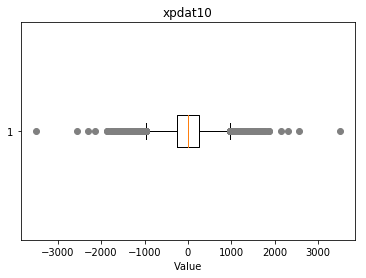

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2305.0, -1529.0, 1544.0, -2553.0, 1673.0, 1675.0, -1778.0, 1678.0, -1649.0, -1517.0, -1513.0, 1690.0, -2150.0, 1695.0, 1569.0, -1629.0, -1627.0, -1497.0, -1752.0, -1494.0, 1707.0, -1622.0, 2553.0, -1490.0, 1583.0, -1744.0, -1615.0, 1586.0, -1486.0, 1715.0, 3505.0, 1462.0, -1481.0, -1479.0, -1860.0, 1853.0, -1603.0, 1599.0, 1728.0, -1728.0, -1599.0, 1603.0, -1853.0, 1860.0, 1726.0, 1479.0, -1726.0, 1481.0, -1462.0, -1468.0, -1715.0, -1586.0, 1486.0, 1744.0, -1583.0, 1615.0, -3505.0, 1490.0, -1707.0, 1494.0, 1622.0, 1752.0, 1497.0, 1468.0, 1627.0, 1629.0, -1569.0, -1695.0, -1690.0, 2150.0, 1513.0, 1517.0, 1649.0, 1778.0, -1678.0, -1675.0, -1673.0, -1544.0, 1529.0, -2305.0}


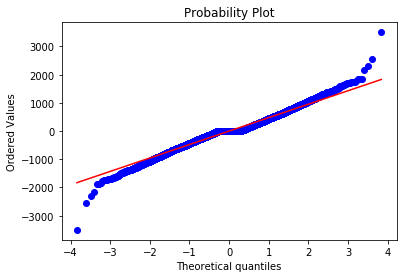

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 1.7192


   ADC 
Overview of variable:  xpdat10 


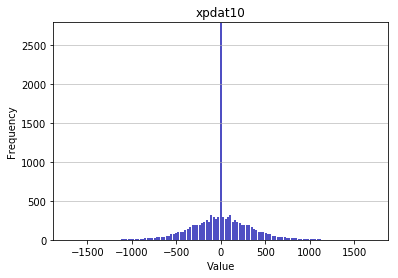

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1711.0
Mean: 0.0
Standard deviation: 322.2652
Median: 0.0
Maximal value: 1711.0


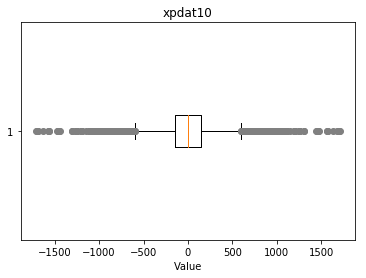

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-1022.0, 1028.0, 1029.0, 1031.0, -1017.0, -1014.0, -1013.0, -1011.0, -1010.0, -1005.0, 1044.0, -1001.0, -1000.0, 1049.0, 1565.0, -993.0, 1568.0, -991.0, 1057.0, 1059.0, -988.0, 1061.0, -989.0, -983.0, 1578.0, -980.0, 1069.0, -977.0, 1072.0, -974.0, 1075.0, -972.0, -971.0, -969.0, 1085.0, -1475.0, 1090.0, 1093.0, 1097.0, -1463.0, -1460.0, 1102.0, 1107.0, -1449.0, 1112.0, 1113.0, 1625.0, -1443.0, 1146.0, 1681.0, 1691.0, 1694.0, 1192.0, 1195.0, 1711.0, 1203.0, 1207.0, 1243.0, 1248.0, -1303.0, -1302.0, 1265.0, -1265.0, 1302.0, 1303.0, -1248.0, -1243.0, -1207.0, -1203.0, -1711.0, -1195.0, -1192.0, -1694.0, -1691.0, -1681.0, -1146.0, 1443.0, -1113.0, -1112.0, 1449.0, -1625.0, -1107.0, -1102.0, 1460.0, -1097.0, 1463.0, -1093.0, -1090.0, -1085.0, 1475.0, 969.0, 971.0, 972.0, -1075.0, 974.0, -1072.0, 977.0, -1069.0, 980.0, -1578.0, 983.0, -1061.0, 988.0, -1059.0, 989.0, 991.0, -1568.0, 993.0, -1057.0, -1565.0, -10

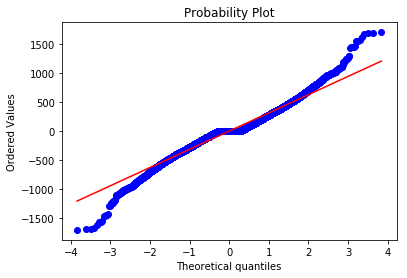

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 2.3268


   Support 
Overview of variable:  xpdat10 


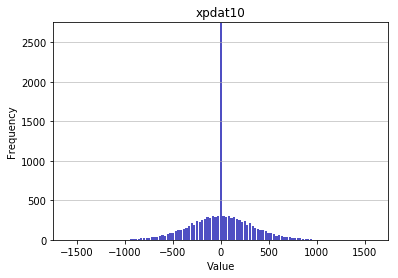

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1591.0
Mean: 0.0
Standard deviation: 301.3347
Median: 0.0
Maximal value: 1591.0


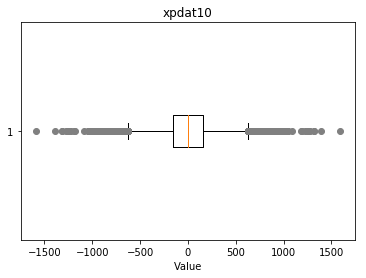

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-1278.0, -1016.0, 905.0, 1033.0, 907.0, -1268.0, -1011.0, 910.0, 1039.0, 911.0, -1391.0, 906.0, 909.0, 1044.0, -1003.0, 1045.0, 920.0, -999.0, 922.0, 1177.0, 921.0, 925.0, -992.0, 928.0, 1315.0, -1243.0, 1190.0, 1319.0, 936.0, 939.0, 940.0, 941.0, 946.0, -973.0, -1033.0, -1226.0, 1591.0, 953.0, -1090.0, 959.0, -959.0, 1090.0, -953.0, -1591.0, 1226.0, 973.0, -946.0, -941.0, -940.0, -939.0, -936.0, -1319.0, -1190.0, 1243.0, -1315.0, 992.0, -928.0, -925.0, -922.0, 999.0, -1177.0, -921.0, -920.0, 1003.0, -1045.0, -1044.0, 1391.0, -1039.0, -911.0, -910.0, 1268.0, -907.0, 1011.0, -905.0, 1016.0, -906.0, -909.0, 1278.0}


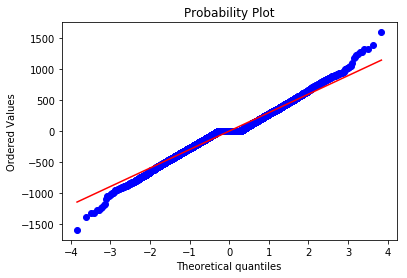

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 1.2377


   Top 
Overview of variable:  csat10 


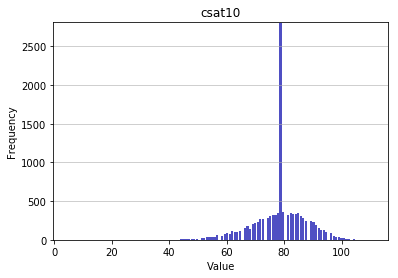

-------------------- 
Summary statistics:
 --------------------
Minimum value: 5.0
Mean: 78.3284
Standard deviation: 9.412
Median: 79.0
Maximal value: 111.0


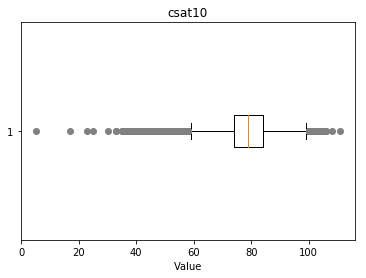

-------------------- 
Outlier detection:
 --------------------
List of outliers: {5.0, 17.0, 23.0, 25.0, 30.0, 33.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 108.0, 111.0}


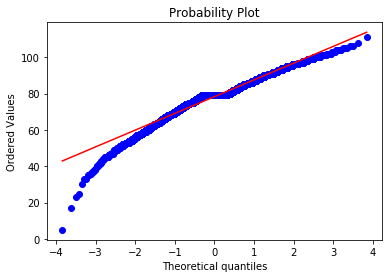

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.6848
Kurtosis: 1.8034


   Middle 
Overview of variable:  csat10 


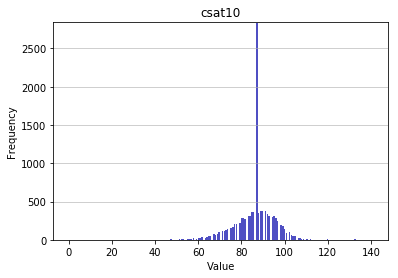

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 86.2125
Standard deviation: 9.6348
Median: 87.0
Maximal value: 141.0


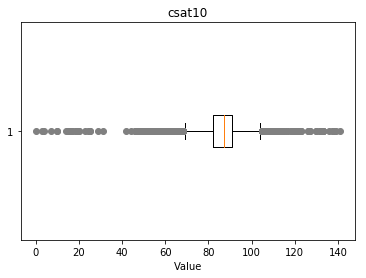

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.0, 130.0, 131.0, 4.0, 132.0, 133.0, 7.0, 136.0, 137.0, 10.0, 139.0, 138.0, 141.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 3.0, 23.0, 24.0, 25.0, 29.0, 31.0, 42.0, 44.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 116.0, 117.0, 118.0, 119.0, 120.0, 121.0, 122.0, 123.0, 126.0, 127.0}


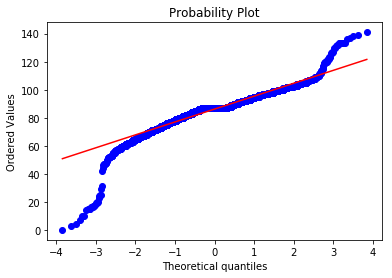

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -1.0934
Kurtosis: 7.5977


   Jungle 
Overview of variable:  csat10 


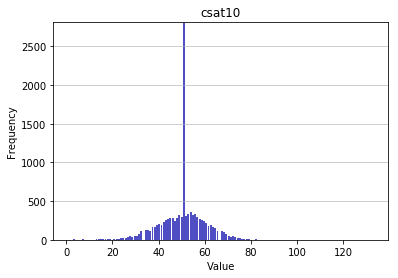

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1.0
Mean: 50.5978
Standard deviation: 10.1391
Median: 51.0
Maximal value: 133.0


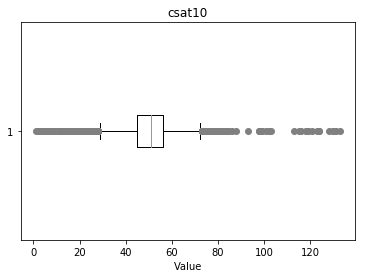

-------------------- 
Outlier detection:
 --------------------
List of outliers: {128.0, 1.0, 2.0, 3.0, 130.0, 4.0, 5.0, 7.0, 131.0, 9.0, 6.0, 11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 133.0, 8.0, 10.0, 82.0, 83.0, 84.0, 85.0, 86.0, 88.0, 93.0, 98.0, 99.0, 101.0, 102.0, 103.0, 113.0, 115.0, 116.0, 118.0, 119.0, 121.0, 123.0, 124.0}


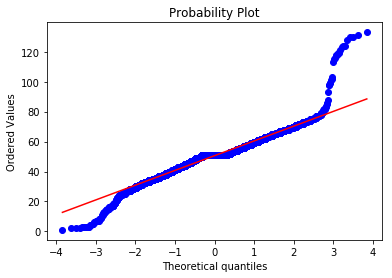

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.1707
Kurtosis: 4.9249


   ADC 
Overview of variable:  csat10 


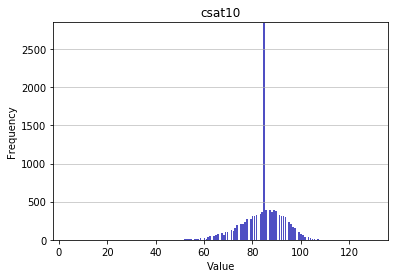

-------------------- 
Summary statistics:
 --------------------
Minimum value: 4.0
Mean: 84.3203
Standard deviation: 8.569
Median: 85.0
Maximal value: 130.0


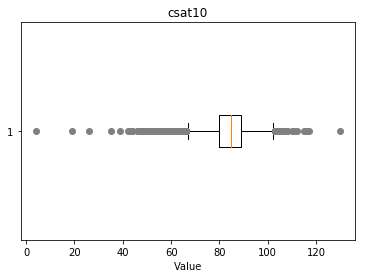

-------------------- 
Outlier detection:
 --------------------
List of outliers: {130.0, 4.0, 19.0, 26.0, 35.0, 39.0, 42.0, 43.0, 44.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 111.0, 112.0, 115.0, 116.0, 117.0}


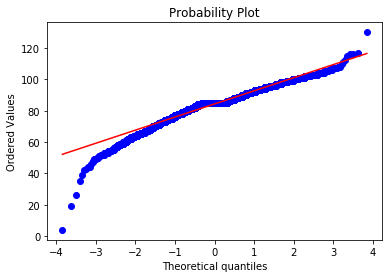

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.7882
Kurtosis: 2.5267


   Support 
Overview of variable:  csat10 


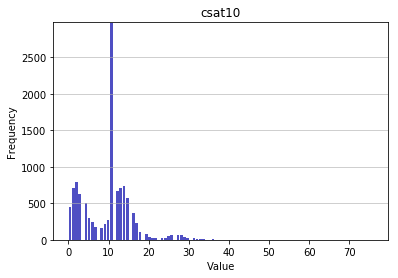

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 9.8204
Standard deviation: 6.2906
Median: 11.0
Maximal value: 76.0


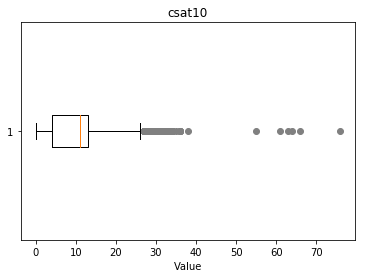

-------------------- 
Outlier detection:
 --------------------
List of outliers: {32.0, 33.0, 34.0, 35.0, 36.0, 64.0, 38.0, 66.0, 76.0, 61.0, 55.0, 31.0, 29.0, 30.0, 63.0}


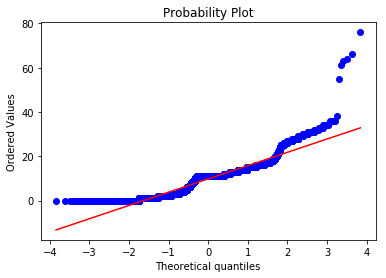

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.8535
Kurtosis: 3.8503


   Top 
Overview of variable:  csdat10 


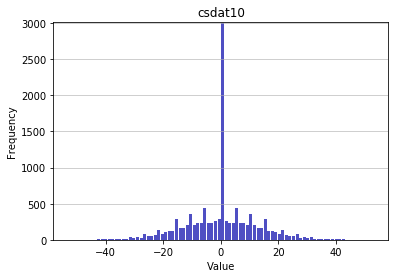

-------------------- 
Summary statistics:
 --------------------
Minimum value: -53.0
Mean: 0.0
Standard deviation: 12.4384
Median: 0.0
Maximal value: 53.0


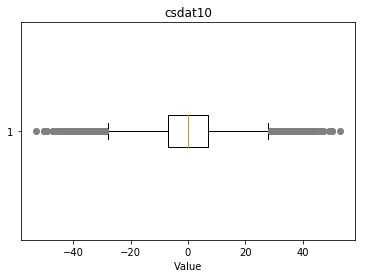

-------------------- 
Outlier detection:
 --------------------
List of outliers: {38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 49.0, 50.0, 53.0, -53.0, -50.0, -49.0, -47.0, -46.0, -45.0, -44.0, -43.0, -42.0, -41.0, -40.0, -39.0, -38.0}


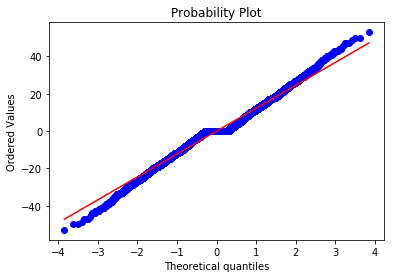

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 0.9443


   Middle 
Overview of variable:  csdat10 


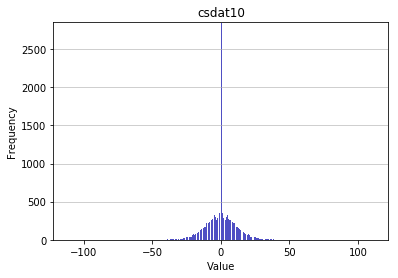

-------------------- 
Summary statistics:
 --------------------
Minimum value: -111.0
Mean: 0.0
Standard deviation: 11.3824
Median: 0.0
Maximal value: 111.0


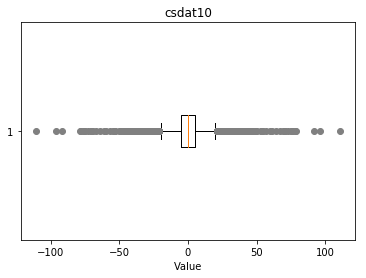

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-111.0, -96.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, -44.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 49.0, 50.0, -78.0, -76.0, -75.0, 53.0, -73.0, 55.0, -71.0, 54.0, 57.0, 60.0, 61.0, -67.0, -69.0, 64.0, -64.0, -61.0, -60.0, 67.0, 69.0, 71.0, -57.0, 73.0, -55.0, 75.0, 76.0, -53.0, -50.0, 78.0, -54.0, -47.0, -46.0, -45.0, -49.0, -43.0, -42.0, 79.0, -40.0, -39.0, -38.0, -37.0, -36.0, -35.0, 92.0, 96.0, 111.0, -79.0, -92.0}


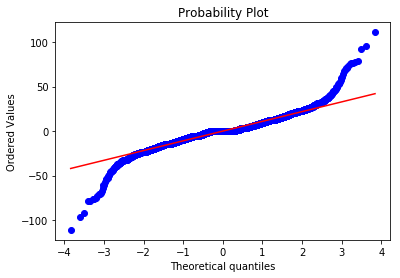

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 7.6645


   Jungle 
Overview of variable:  csdat10 


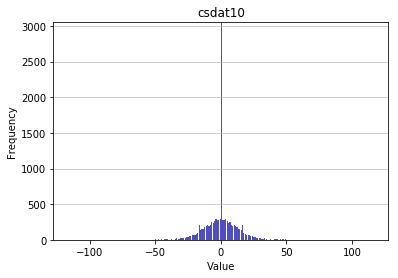

-------------------- 
Summary statistics:
 --------------------
Minimum value: -116.0
Mean: 0.0
Standard deviation: 12.5782
Median: 0.0
Maximal value: 116.0


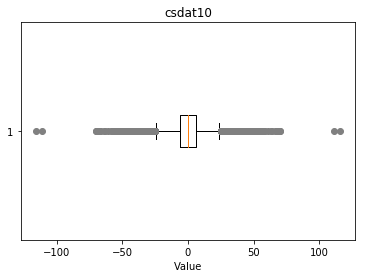

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-51.0, 59.0, -116.0, -111.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, -70.0, -69.0, 58.0, 61.0, -67.0, 63.0, -64.0, -63.0, 64.0, -61.0, 67.0, 69.0, 70.0, -58.0, -56.0, -55.0, -57.0, -53.0, -59.0, -54.0, -50.0, -49.0, -48.0, -47.0, -46.0, -45.0, -44.0, -43.0, -42.0, -41.0, -40.0, -39.0, -38.0, 111.0, 116.0, -52.0}


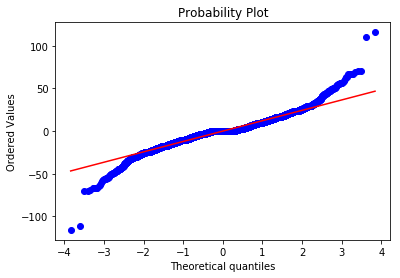

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 5.3201


   ADC 
Overview of variable:  csdat10 


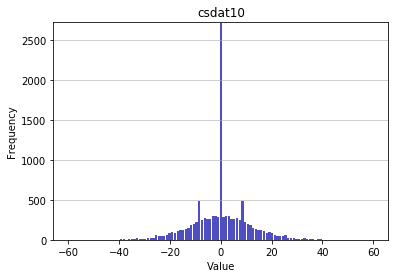

-------------------- 
Summary statistics:
 --------------------
Minimum value: -60.0
Mean: 0.0
Standard deviation: 11.0117
Median: 0.0
Maximal value: 60.0


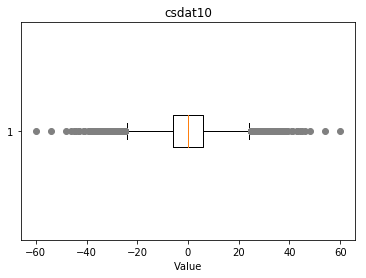

-------------------- 
Outlier detection:
 --------------------
List of outliers: {34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 41.0, 43.0, 44.0, 45.0, 46.0, 48.0, 54.0, 60.0, -60.0, -54.0, -48.0, -46.0, -45.0, -44.0, -43.0, -41.0, -39.0, -38.0, -37.0, -36.0, -35.0, -34.0}


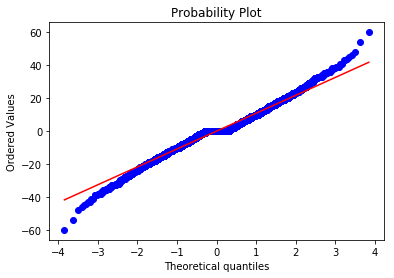

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 1.2928


   Support 
Overview of variable:  csdat10 


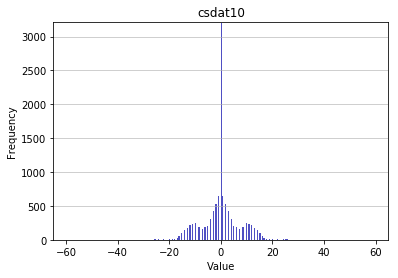

-------------------- 
Summary statistics:
 --------------------
Minimum value: -59.0
Mean: 0.0
Standard deviation: 7.2209
Median: 0.0
Maximal value: 59.0


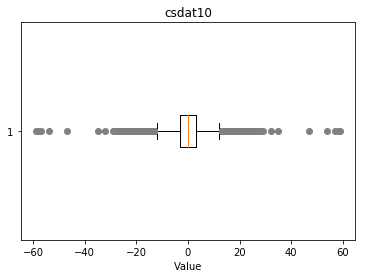

-------------------- 
Outlier detection:
 --------------------
List of outliers: {22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 32.0, 35.0, 47.0, 54.0, 57.0, 58.0, 59.0, -59.0, -58.0, -57.0, -54.0, -47.0, -35.0, -32.0, -29.0, -28.0, -27.0, -26.0, -25.0, -24.0, -23.0, -22.0}


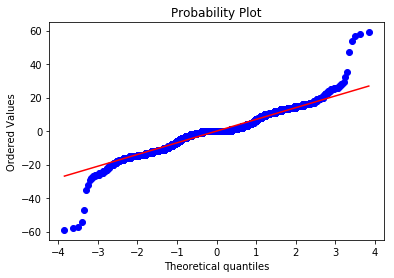

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 3.6065


   Top 
Overview of variable:  csat15 


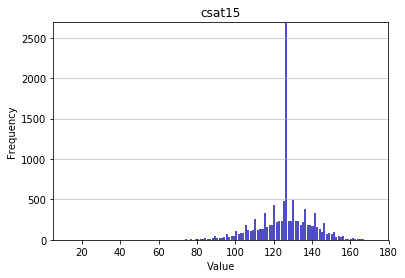

-------------------- 
Summary statistics:
 --------------------
Minimum value: 13.0
Mean: 125.996
Standard deviation: 13.6917
Median: 127.0
Maximal value: 172.0


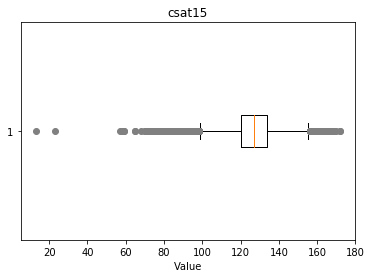

-------------------- 
Outlier detection:
 --------------------
List of outliers: {13.0, 23.0, 168.0, 169.0, 170.0, 172.0, 57.0, 58.0, 59.0, 65.0, 68.0, 70.0, 71.0, 72.0, 73.0, 74.0, 75.0, 76.0, 77.0, 79.0, 80.0, 81.0, 82.0, 83.0, 84.0}


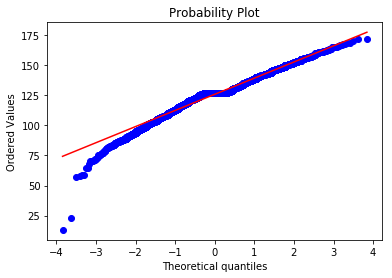

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.5306
Kurtosis: 1.6683


   Middle 
Overview of variable:  csat15 


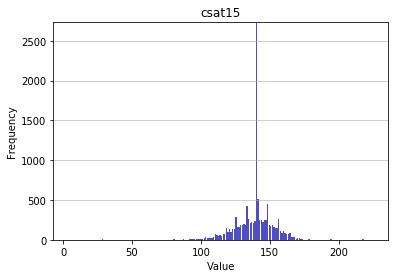

-------------------- 
Summary statistics:
 --------------------
Minimum value: 4.0
Mean: 138.9588
Standard deviation: 14.5498
Median: 140.0
Maximal value: 225.0


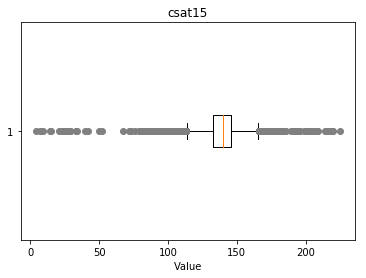

-------------------- 
Outlier detection:
 --------------------
List of outliers: {4.0, 7.0, 8.0, 205.0, 9.0, 14.0, 15.0, 21.0, 23.0, 24.0, 25.0, 26.0, 208.0, 28.0, 29.0, 209.0, 33.0, 34.0, 40.0, 42.0, 50.0, 52.0, 214.0, 183.0, 184.0, 186.0, 215.0, 189.0, 190.0, 191.0, 192.0, 193.0, 194.0, 67.0, 196.0, 195.0, 199.0, 72.0, 73.0, 201.0, 200.0, 76.0, 204.0, 206.0, 79.0, 80.0, 81.0, 82.0, 202.0, 84.0, 85.0, 86.0, 87.0, 88.0, 217.0, 90.0, 91.0, 92.0, 93.0, 94.0, 95.0, 219.0, 218.0, 225.0, 220.0, 203.0}


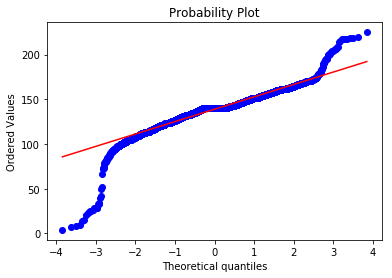

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -1.1006
Kurtosis: 9.7254


   Jungle 
Overview of variable:  csat15 


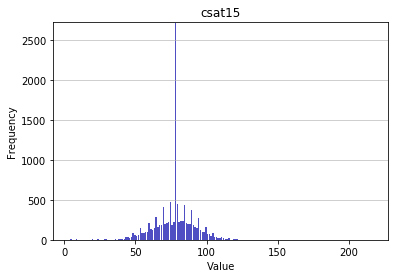

-------------------- 
Summary statistics:
 --------------------
Minimum value: 3.0
Mean: 77.7389
Standard deviation: 14.6633
Median: 78.0
Maximal value: 217.0


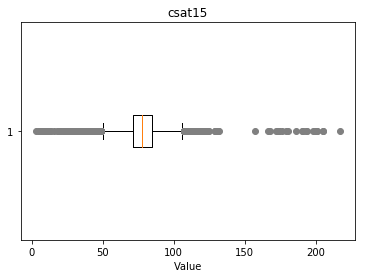

-------------------- 
Outlier detection:
 --------------------
List of outliers: {129.0, 130.0, 131.0, 132.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 16.0, 3.0, 18.0, 19.0, 20.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 157.0, 29.0, 31.0, 32.0, 33.0, 30.0, 166.0, 168.0, 172.0, 173.0, 174.0, 176.0, 179.0, 180.0, 186.0, 190.0, 191.0, 193.0, 194.0, 198.0, 199.0, 200.0, 201.0, 205.0, 217.0, 122.0, 123.0, 124.0, 125.0}


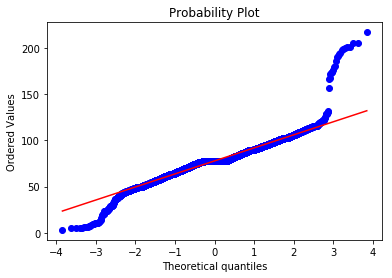

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.5071
Kurtosis: 7.7951


   ADC 
Overview of variable:  csat15 


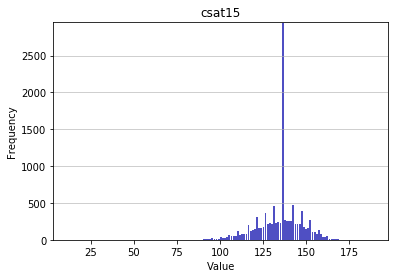

-------------------- 
Summary statistics:
 --------------------
Minimum value: 12.0
Mean: 134.7893
Standard deviation: 12.8832
Median: 136.0
Maximal value: 189.0


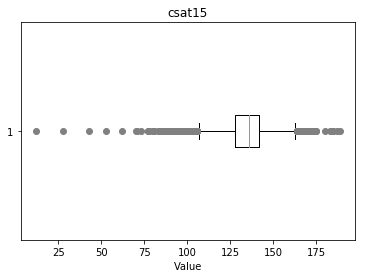

-------------------- 
Outlier detection:
 --------------------
List of outliers: {12.0, 28.0, 43.0, 174.0, 175.0, 180.0, 53.0, 183.0, 184.0, 185.0, 187.0, 189.0, 62.0, 70.0, 71.0, 73.0, 77.0, 78.0, 80.0, 81.0, 83.0, 84.0, 85.0, 86.0, 87.0, 88.0, 89.0, 90.0, 91.0, 92.0, 93.0, 94.0, 95.0, 96.0}


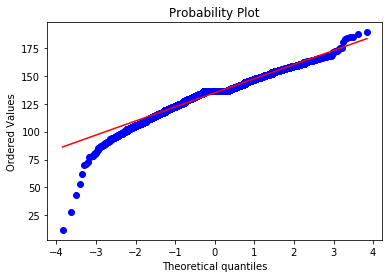

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.66
Kurtosis: 2.5279


   Support 
Overview of variable:  csat15 


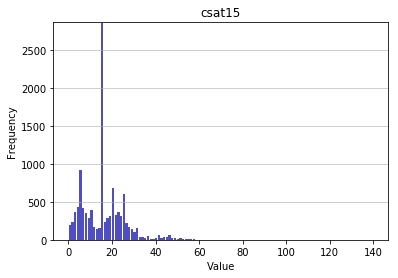

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 16.3218
Standard deviation: 9.8913
Median: 16.0
Maximal value: 140.0


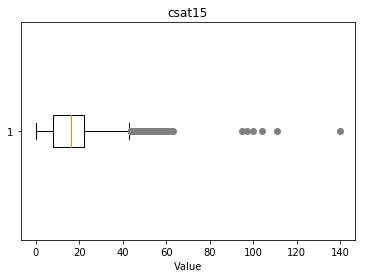

-------------------- 
Outlier detection:
 --------------------
List of outliers: {140.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 63.0, 95.0, 97.0, 100.0, 104.0, 111.0}


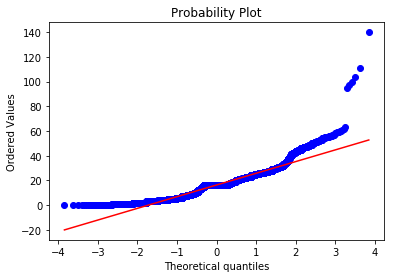

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.2817
Kurtosis: 5.8364


   Top 
Overview of variable:  csdat15 


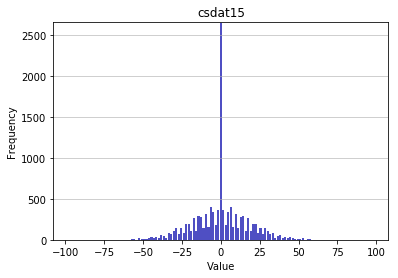

-------------------- 
Summary statistics:
 --------------------
Minimum value: -98.0
Mean: 0.0
Standard deviation: 17.5195
Median: 0.0
Maximal value: 98.0


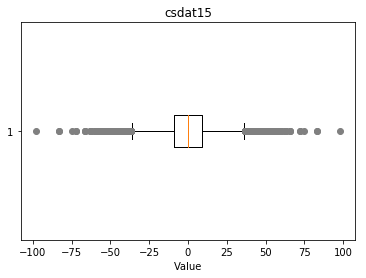

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-98.0, 57.0, -83.0, 53.0, 54.0, 55.0, -72.0, 56.0, 58.0, 59.0, 60.0, -75.0, 62.0, 63.0, -66.0, -63.0, -62.0, 66.0, -60.0, -59.0, -58.0, -57.0, -56.0, 72.0, -54.0, -53.0, -55.0, 75.0, 83.0, 98.0}


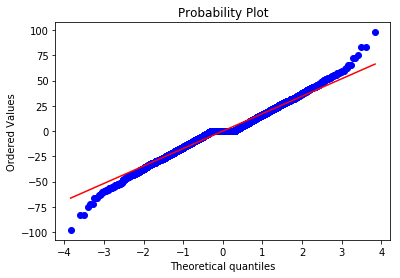

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 1.1902


   Middle 
Overview of variable:  csdat15 


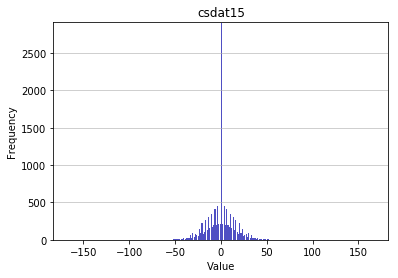

-------------------- 
Summary statistics:
 --------------------
Minimum value: -166.0
Mean: 0.0
Standard deviation: 16.7948
Median: 0.0
Maximal value: 166.0


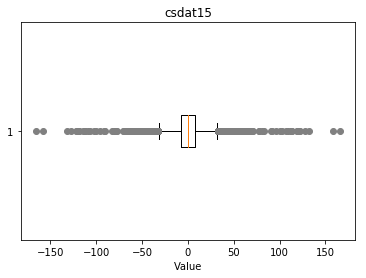

-------------------- 
Outlier detection:
 --------------------
List of outliers: {128.0, -128.0, 132.0, -122.0, -121.0, -120.0, -119.0, -114.0, -112.0, -109.0, -107.0, -103.0, 56.0, -71.0, -100.0, 158.0, 57.0, -96.0, -92.0, -91.0, 166.0, -69.0, -64.0, -83.0, -81.0, -78.0, 51.0, 52.0, 53.0, 54.0, 55.0, 62.0, -65.0, 58.0, -70.0, 60.0, -67.0, -66.0, 63.0, 59.0, -63.0, 66.0, 67.0, -60.0, -59.0, -58.0, 70.0, 65.0, -55.0, -54.0, -53.0, -52.0, -51.0, -62.0, -57.0, 71.0, 81.0, 78.0, 83.0, 64.0, 77.0, -166.0, 91.0, 92.0, 69.0, 96.0, -158.0, 100.0, -56.0, 103.0, 107.0, 109.0, 112.0, 114.0, 119.0, 120.0, 121.0, 122.0, -132.0, -77.0}


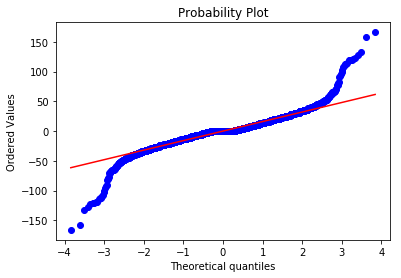

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 9.806


   Jungle 
Overview of variable:  csdat15 


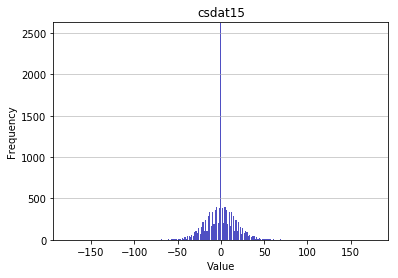

-------------------- 
Summary statistics:
 --------------------
Minimum value: -176.0
Mean: 0.0
Standard deviation: 18.2585
Median: 0.0
Maximal value: 176.0


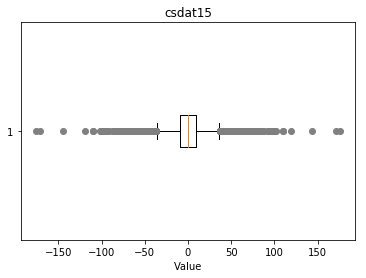

-------------------- 
Outlier detection:
 --------------------
List of outliers: {55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 63.0, 64.0, 65.0, 67.0, 68.0, 69.0, 70.0, 71.0, 72.0, 74.0, 75.0, 77.0, 78.0, 79.0, 80.0, 81.0, 82.0, 83.0, 84.0, 85.0, 86.0, 88.0, 92.0, 93.0, 95.0, 96.0, 97.0, 98.0, 101.0, 102.0, 110.0, 119.0, 144.0, 171.0, 176.0, -176.0, -171.0, -144.0, -119.0, -110.0, -102.0, -101.0, -98.0, -97.0, -96.0, -95.0, -93.0, -92.0, -88.0, -86.0, -85.0, -84.0, -83.0, -82.0, -81.0, -80.0, -79.0, -78.0, -77.0, -75.0, -74.0, -72.0, -71.0, -70.0, -69.0, -68.0, -67.0, -65.0, -64.0, -63.0, -62.0, -61.0, -60.0, -59.0, -58.0, -57.0, -56.0, -55.0}


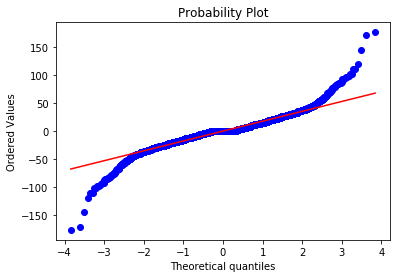

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 7.0613


   ADC 
Overview of variable:  csdat15 


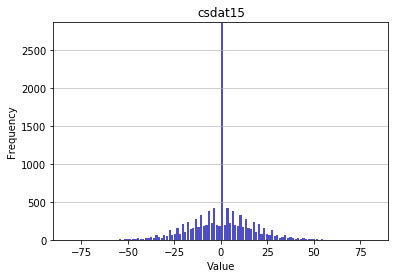

-------------------- 
Summary statistics:
 --------------------
Minimum value: -82.0
Mean: 0.0
Standard deviation: 15.8721
Median: 0.0
Maximal value: 82.0


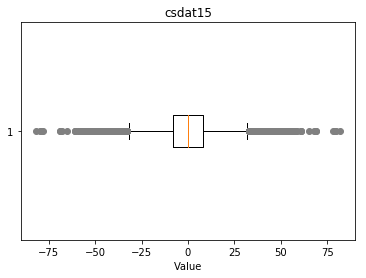

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-82.0, 48.0, -79.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 49.0, 58.0, 59.0, -69.0, -68.0, 61.0, -65.0, 57.0, 65.0, -61.0, 68.0, 69.0, -59.0, -58.0, -56.0, -55.0, -54.0, -53.0, -52.0, -51.0, -50.0, 79.0, -48.0, -49.0, 82.0, 78.0, 80.0, -57.0, -80.0, -78.0}


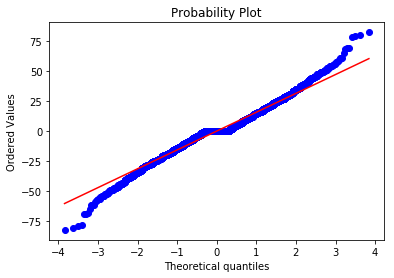

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 1.5019


   Support 
Overview of variable:  csdat15 


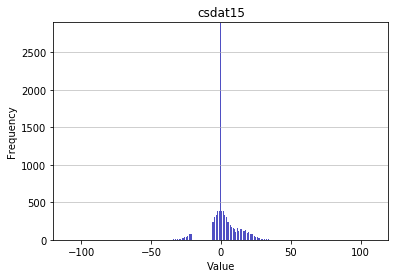

-------------------- 
Summary statistics:
 --------------------
Minimum value: -109.0
Mean: 0.0
Standard deviation: 11.1127
Median: 0.0
Maximal value: 109.0


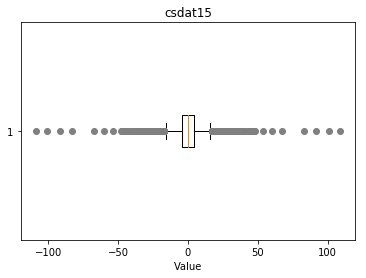

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-109.0, -101.0, 34.0, 35.0, 36.0, -92.0, 37.0, 39.0, 40.0, 41.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, -83.0, 54.0, 60.0, -67.0, 67.0, -60.0, -54.0, -48.0, -47.0, -46.0, -45.0, -44.0, -43.0, 83.0, -41.0, -40.0, -39.0, -37.0, 92.0, -36.0, -34.0, -35.0, 101.0, 109.0}


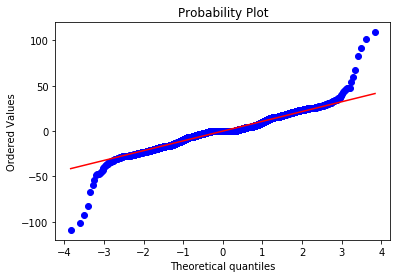

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 5.0924


   Top 
Overview of variable:  Encoded_champion 


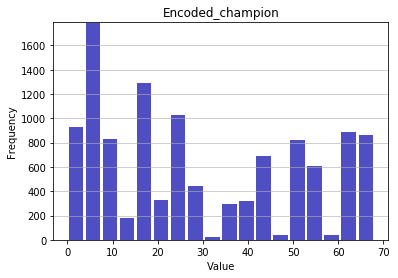

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0
Mean: 29.6739
Standard deviation: 22.1013
Median: 24.0
Maximal value: 68


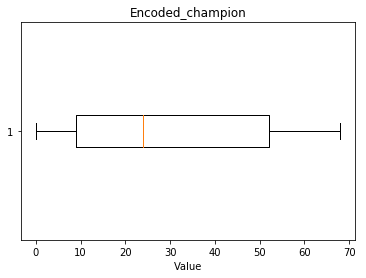

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


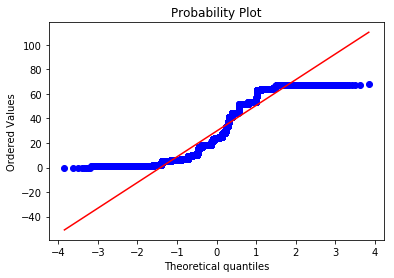

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.3679
Kurtosis: -1.2993


   Middle 
Overview of variable:  Encoded_champion 


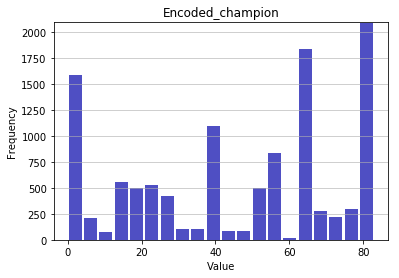

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0
Mean: 45.3464
Standard deviation: 27.9478
Median: 50.0
Maximal value: 83


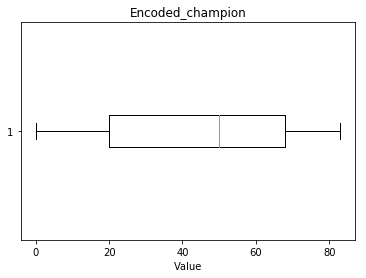

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


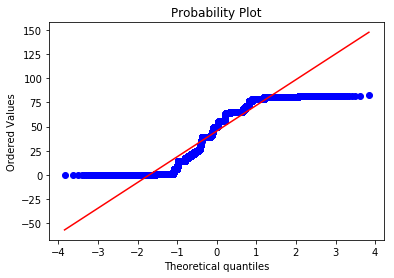

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.2969
Kurtosis: -1.3015


   Jungle 
Overview of variable:  Encoded_champion 


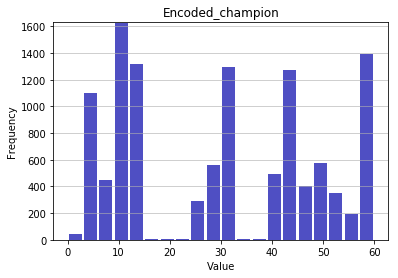

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0
Mean: 29.3567
Standard deviation: 19.0846
Median: 30.0
Maximal value: 60


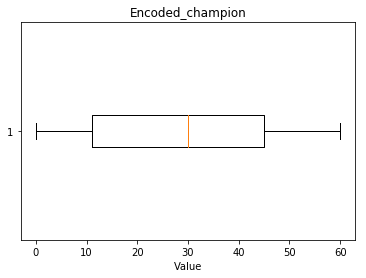

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


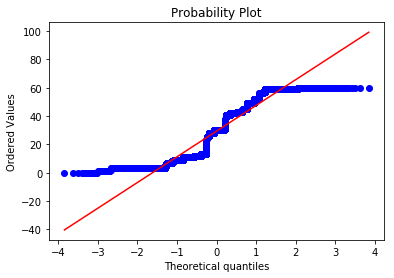

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.1258
Kurtosis: -1.3968


   ADC 
Overview of variable:  Encoded_champion 


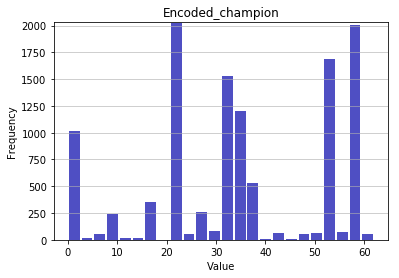

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0
Mean: 35.0179
Standard deviation: 17.7767
Median: 36.0
Maximal value: 62


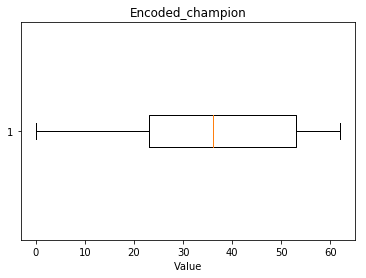

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


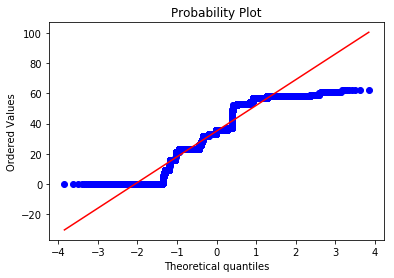

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.3325
Kurtosis: -0.7939


   Support 
Overview of variable:  Encoded_champion 


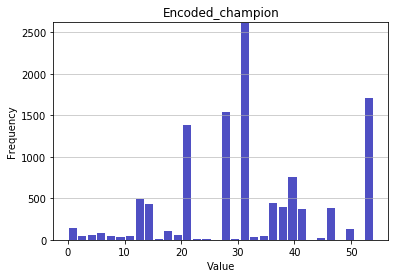

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0
Mean: 32.2591
Standard deviation: 13.0273
Median: 32.0
Maximal value: 54


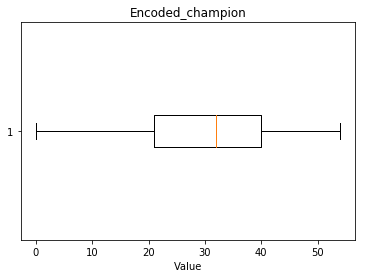

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


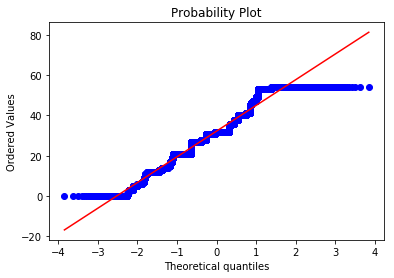

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.016
Kurtosis: -0.4361


<Figure size 432x288 with 0 Axes>

In [16]:
# Loop through all numerical variables and visualize data
for num_variable in numerical_variables:
    # Only plot features that different between the positions
    x = [set(data_dict[pos][num_variable]) for pos in data_dict]
    if x.count(x[0]) != len(x):
        for pos, df in data_dict.items():
            print("\n\n","="*10, "\n  ", pos, "\n", "="*10)
            SummaryNumericVar(df[num_variable].dropna(), num_variable)

##### Remove irrelevant features for further analysis
* Impossible column values are removed (gamelength of zero).
* Features with zero or near zero variance (<0.05) for categorical encoders were removed (because of their redundancy in further analysis). Note here that not all numerical features with a variance smaller than 0.05 were removed from analysis, because standardization is not considered yet.
* Extreme outliers

In [17]:
# Remove redundant features
data_dict['Top'] = data_dict['Top'].drop(['quadras', 'pentas'], axis = 1)
data_dict['Middle'] = data_dict['Middle'].drop(['pentas'], axis = 1)
data_dict['Jungle'] = data_dict['Jungle'].drop(['quadras'], axis = 1)
data_dict['ADC'] = data_dict['ADC'].drop(['quadras', 'pentas'], axis = 1)
data_dict['Support'] = data_dict['Support'].drop(['triples', 'quadras', 'pentas'], axis = 1)
for pos, df in data_dict.items():
    data_dict[pos] = df[df.datediff != 17973.0]

##### Reduce the influence of outliers by applying a box-cox transformation on the data
Because ridge and lasso regression are both sensitive to outlying observations, it was decided to reduce the influence of the latter by applying a box-cox transformation on the numerical features, hence transforming them in a normal shape. We refrained from removing outliers because these could capture relevant information and transformation is assumed to reduce their influence. Different lambda values underlying the exponential transformation of the data are explored [-5, 5] and the optimal value, resulting in the best approximation of the normal curve, is selected.

In [18]:
# Creation of new data_dict capturing features after transformation
trans_data_dict, optimiser_data_dict = dict(), dict()

##### Top - Data transformation

Feature:  split
The optimal value for lambda:  0.04490588994876214
Feature:  dmgtochamps
The optimal value for lambda:  0.13835335408109692
Feature:  dmgtochampsperminute
The optimal value for lambda:  0.27452963581692347
Feature:  dmgshare
The optimal value for lambda:  0.3395273604946894
Feature:  earnedgoldshare
The optimal value for lambda:  -0.27290929777772294
Feature:  wards
The optimal value for lambda:  0.04289906300778466
Feature:  wpm
The optimal value for lambda:  0.19938534818260914
Feature:  wardshare
The optimal value for lambda:  0.5206103944549727
Feature:  totalgold
The optimal value for lambda:  0.10176047858738152
Feature:  earnedgpm
The optimal value for lambda:  0.09137839971258428
Feature:  goldspent
The optimal value for lambda:  -0.11129046455564971
Feature:  minionkills
The optimal value for lambda:  0.29726439623449336
Feature:  cspm
The optimal value for lambda:  1.020671579273106
Feature:  goldat10
The optimal value for lambda:  -0.8456534921882221
Feature:

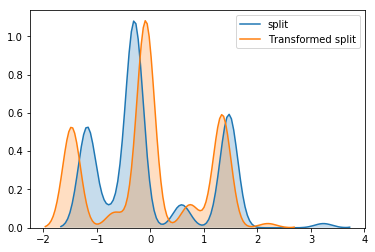

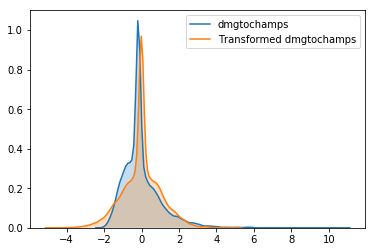

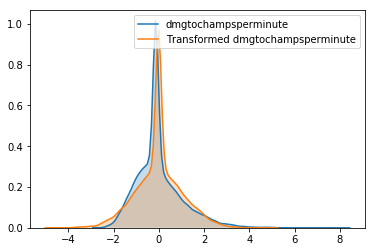

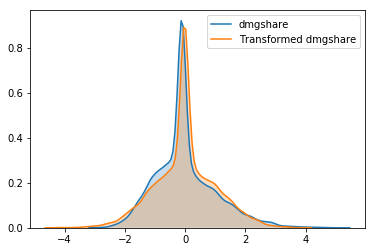

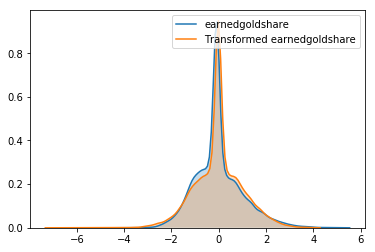

...

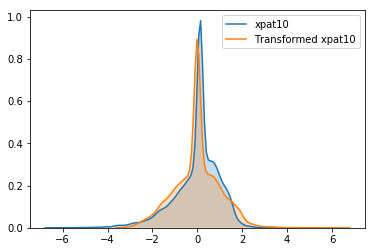

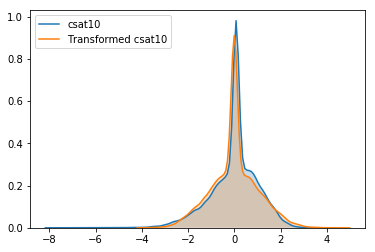

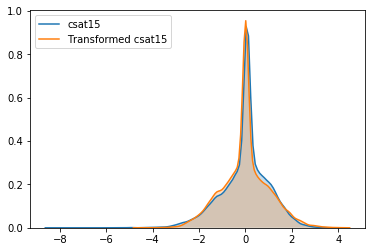

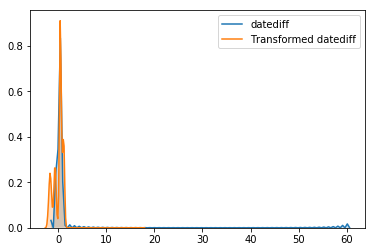

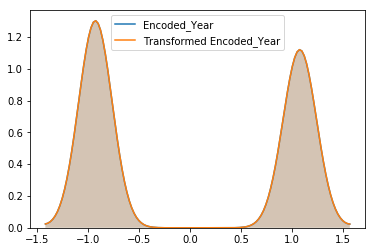

In [19]:
# Initialization
df, transformed_data_df, optimiser_dict = data_dict['Top'], pd.DataFrame(), dict()

# Loop through the data and apply box cox transformation
for num_variable in df.columns:
    if str(df[num_variable].dtypes) != 'object':
        if all(df[num_variable] > 0):
            transformed_feature, optimiser = feature_transformer(df[num_variable], num_variable)
            if -5 <= optimiser <= 5:
                transformed_data_df[num_variable] = transformed_feature
                optimiser_dict[num_variable] = optimiser
            else:
                transformed_data_df[num_variable] = preprocessing.scale(df[num_variable])
                optimiser_dict[num_variable] = np.nan
        else:
            transformed_data_df[num_variable] = preprocessing.scale(df[num_variable])

In [20]:
# Add player feature
transformed_data_df['player'] = list(df['player'])

# Add transformed dataframe to dictionary
trans_data_dict["Top"] = transformed_data_df
optimiser_data_dict["Top"] = optimiser_dict

##### Middle- Data transformation

Feature:  split
The optimal value for lambda:  0.04490588994876214
Feature:  dmgtochamps
The optimal value for lambda:  0.19337789798245816
Feature:  dmgtochampsperminute
The optimal value for lambda:  0.4534313819165294
Feature:  dmgshare
The optimal value for lambda:  0.7645770065517564
Feature:  earnedgoldshare
The optimal value for lambda:  0.8068371146650921
Feature:  wards
The optimal value for lambda:  0.3148474318023757
Feature:  wpm
The optimal value for lambda:  0.7095920629202521
Feature:  wardshare
The optimal value for lambda:  0.8567097044939863
Feature:  totalgold
The optimal value for lambda:  0.1753005614417406
Feature:  earnedgpm
The optimal value for lambda:  0.60293406367448
Feature:  goldspent
The optimal value for lambda:  0.0032138062449230693
Feature:  minionkills
The optimal value for lambda:  0.5804307361464425
Feature:  cspm
The optimal value for lambda:  1.4648262906080196
Feature:  goldat10
The optimal value for lambda:  0.22186379581813584
Feature:  goldat

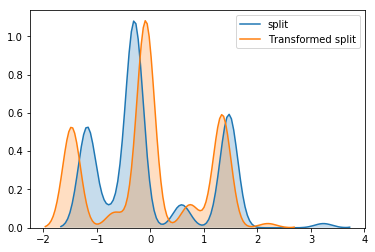

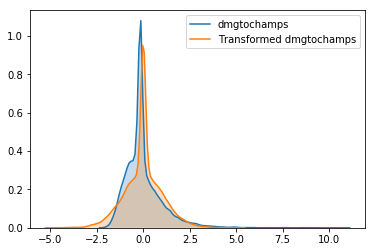

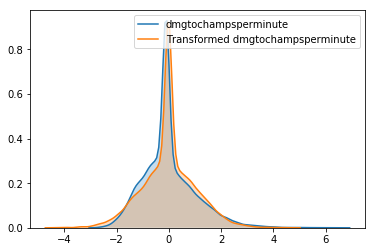

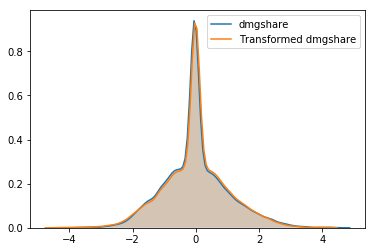

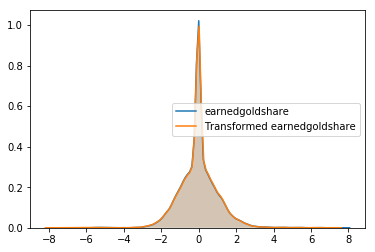

...

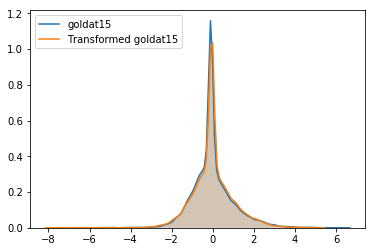

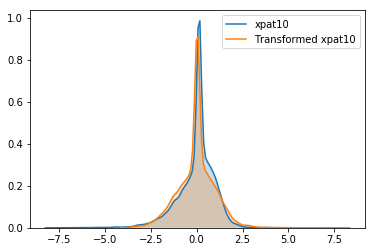

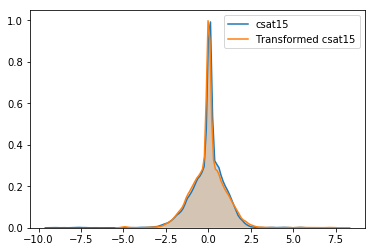

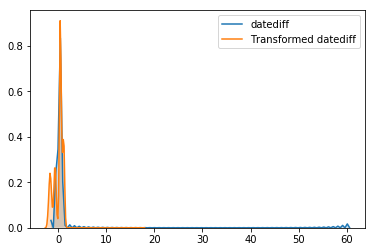

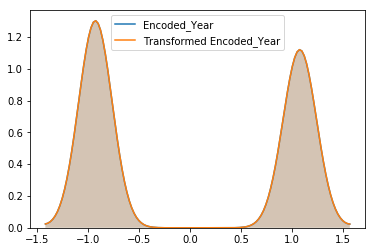

In [21]:
# Initialization
df, transformed_data_df, optimiser_dict = data_dict['Middle'], pd.DataFrame(), dict()

# Loop through the data and apply box cox transformation
for num_variable in df.columns:
    if str(df[num_variable].dtypes) != 'object':
        if all(df[num_variable] > 0):
            transformed_feature, optimiser = feature_transformer(df[num_variable], num_variable)
            if -5 <= optimiser <= 5:
                transformed_data_df[num_variable] = transformed_feature
                optimiser_dict[num_variable] = optimiser
            else:
                transformed_data_df[num_variable] = preprocessing.scale(df[num_variable])
                optimiser_dict[num_variable] = np.nan
        else:
            transformed_data_df[num_variable] = preprocessing.scale(df[num_variable])

In [22]:
# Add player feature
transformed_data_df['player'] = list(df['player'])

# Add transformed dataframe to dictionary
trans_data_dict["Middle"] = transformed_data_df
optimiser_data_dict["Middle"] = optimiser_dict

##### Jungle- Data transformation

Feature:  split
The optimal value for lambda:  0.04490588994876214
Feature:  dmgtochamps
The optimal value for lambda:  0.14219953183325215
Feature:  dmgtochampsperminute
The optimal value for lambda:  0.24621184522188805
Feature:  dmgshare
The optimal value for lambda:  0.3031910502844089
Feature:  earnedgoldshare
The optimal value for lambda:  0.32169029311818115
Feature:  wards
The optimal value for lambda:  0.13137753789266096
Feature:  wpm
The optimal value for lambda:  0.26056303832838307
Feature:  wardshare
The optimal value for lambda:  0.7444976387885963
Feature:  totalgold
The optimal value for lambda:  0.1013550545017526
Feature:  earnedgpm
The optimal value for lambda:  0.27662236796405637
Feature:  goldspent
The optimal value for lambda:  -0.16833350221665067
Feature:  minionkills
The optimal value for lambda:  0.020656293449300967
Feature:  cspm
The optimal value for lambda:  0.614110215598161
Feature:  goldat10
The optimal value for lambda:  -0.37843658548270637
Feature:

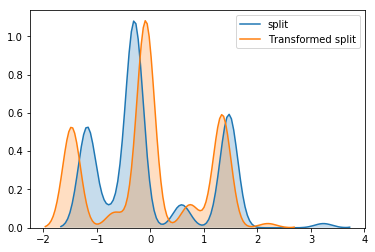

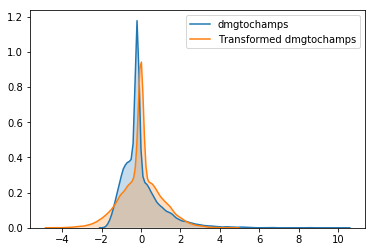

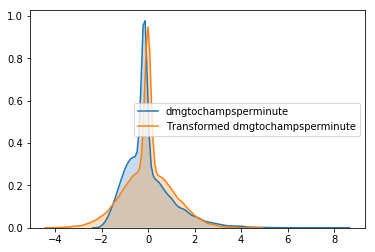

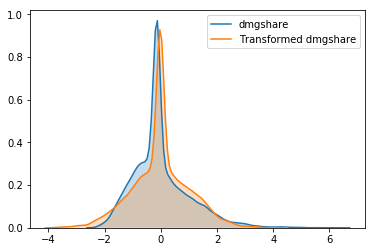

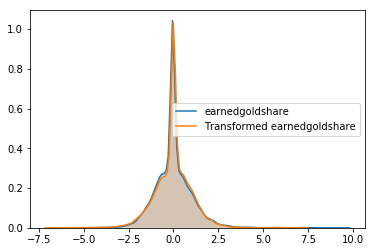

...

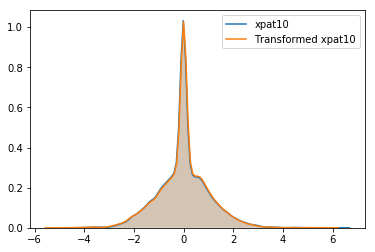

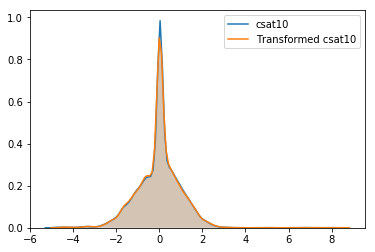

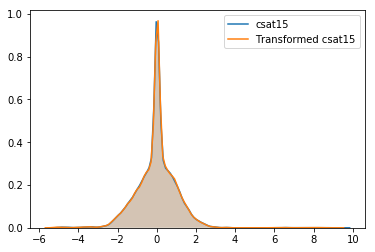

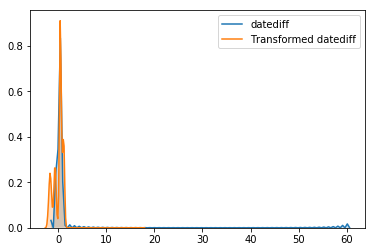

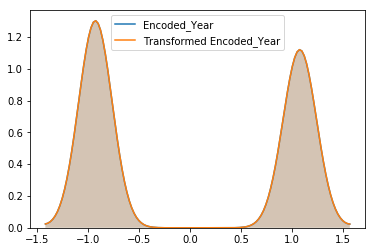

In [23]:
# Initialization
df, transformed_data_df, optimiser_dict = data_dict['Jungle'], pd.DataFrame(), dict()

# Loop through the data and apply box cox transformation
for num_variable in df.columns:
    if str(df[num_variable].dtypes) != 'object':
        if all(df[num_variable] > 0):
            transformed_feature, optimiser = feature_transformer(df[num_variable], num_variable)
            if -5 <= optimiser <= 5:
                transformed_data_df[num_variable] = transformed_feature
                optimiser_dict[num_variable] = optimiser
            else:
                transformed_data_df[num_variable] = preprocessing.scale(df[num_variable])
                optimiser_dict[num_variable] = np.nan
        else:
            transformed_data_df[num_variable] = preprocessing.scale(df[num_variable])

In [24]:
# Add player feature
transformed_data_df['player'] = list(df['player'])

# Add transformed dataframe to dictionary
trans_data_dict["Jungle"] = transformed_data_df
optimiser_data_dict["Jungle"] = optimiser_dict

##### ADC- Data Tranformation

Feature:  split
The optimal value for lambda:  0.04490588994876214
Feature:  dmgtochamps
The optimal value for lambda:  0.08618851969161498
Feature:  dmgtochampsperminute
The optimal value for lambda:  0.28321504973642586
Feature:  dmgshare
The optimal value for lambda:  0.5619601341229791
Feature:  earnedgoldshare
The optimal value for lambda:  0.2461555936505591
Feature:  wards
The optimal value for lambda:  0.15340310571191157
Feature:  wpm
The optimal value for lambda:  0.30430197079902405
Feature:  wardshare
The optimal value for lambda:  0.37172172261593867
Feature:  totalgold
The optimal value for lambda:  0.11037613635068441
Feature:  earnedgpm
The optimal value for lambda:  0.7269527280229743
Feature:  goldspent
The optimal value for lambda:  -0.14113800225097695
Feature:  minionkills
The optimal value for lambda:  0.14797907079432346
Feature:  cspm
The optimal value for lambda:  1.0319161843396585
Feature:  goldat10
The optimal value for lambda:  -1.4487653846042905
Feature: 

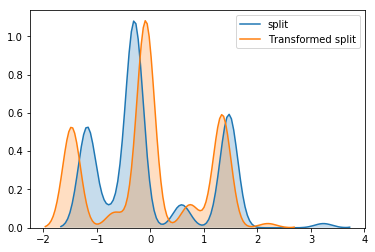

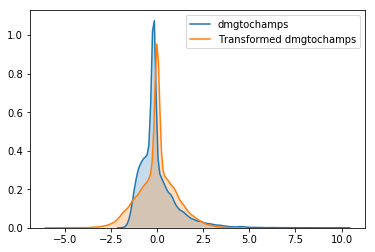

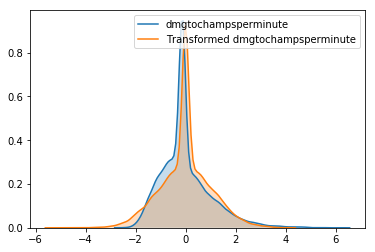

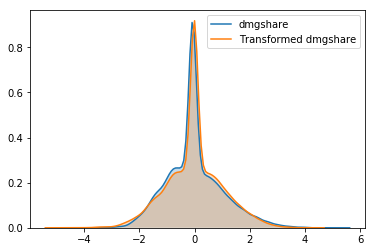

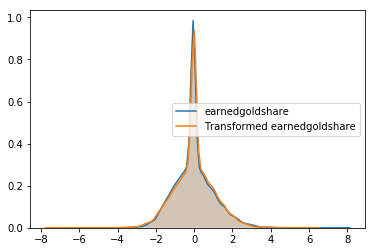

...

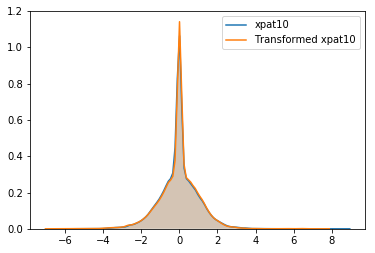

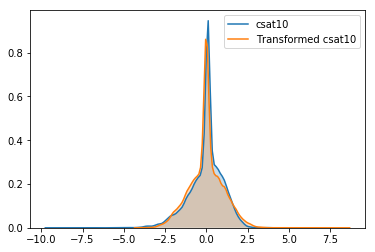

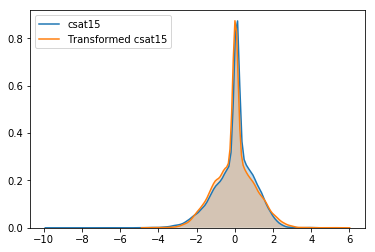

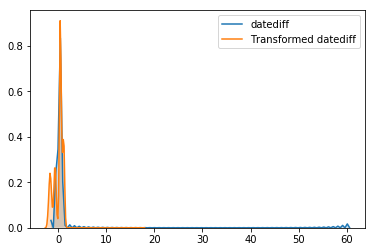

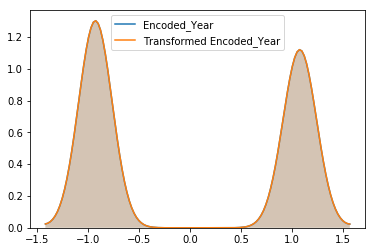

In [25]:
# Initialization
df, transformed_data_df, optimiser_dict = data_dict['ADC'], pd.DataFrame(), dict()


# Loop through the data and apply box cox transformation
for num_variable in df.columns:
    if str(df[num_variable].dtypes) != 'object':
        if all(df[num_variable] > 0):
            transformed_feature, optimiser = feature_transformer(df[num_variable], num_variable)
            if -5 <= optimiser <= 5:
                transformed_data_df[num_variable] = transformed_feature
                optimiser_dict[num_variable] = optimiser
            else:
                transformed_data_df[num_variable] = preprocessing.scale(df[num_variable])
                optimiser_dict[num_variable] = np.nan
        else:
            transformed_data_df[num_variable] = preprocessing.scale(df[num_variable])

In [26]:
# Add player feature
transformed_data_df['player'] = list(df['player'])

# Add transformed dataframe to dictionary
trans_data_dict["ADC"] = transformed_data_df
optimiser_data_dict["ADC"] = optimiser_dict

##### Support- Data Tranformation

Feature:  split
The optimal value for lambda:  0.04490588994876214
Feature:  dmgtochamps
The optimal value for lambda:  0.00755689169074314
Feature:  dmgtochampsperminute
The optimal value for lambda:  0.06401835522458195
Feature:  dmgshare
The optimal value for lambda:  0.03789396849487017
Feature:  earnedgoldshare
The optimal value for lambda:  0.722252295028215
Feature:  wards
The optimal value for lambda:  0.16621919041619065
Feature:  wpm
The optimal value for lambda:  0.5939183252956064
Feature:  wardshare
The optimal value for lambda:  1.0993176517922032
Feature:  totalgold
The optimal value for lambda:  0.018846756657412814
Feature:  earnedgpm
The optimal value for lambda:  0.6632549589528527
Feature:  goldspent
The optimal value for lambda:  -0.12918845117545516
Feature:  minionkills
The optimal value for lambda:  0.2598576234815157
Feature:  cspm
The optimal value for lambda:  0.26520158617729694
Feature:  goldat10
The optimal value for lambda:  -3.0815717916536967
Feature:  

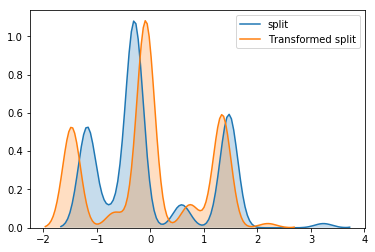

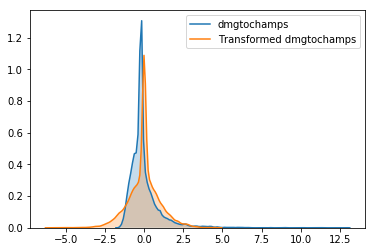

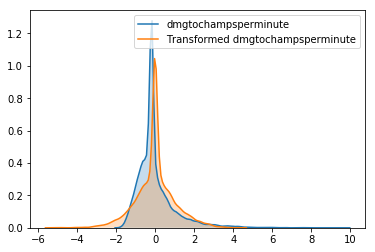

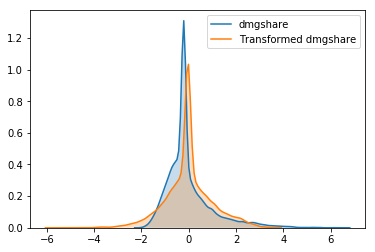

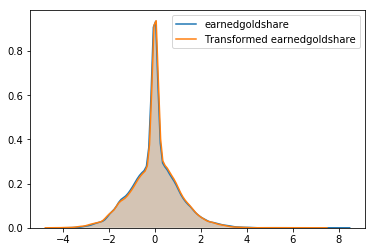

...

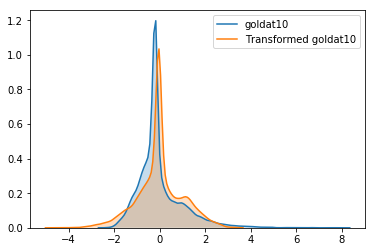

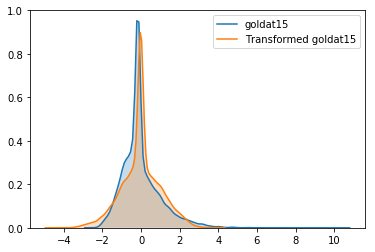

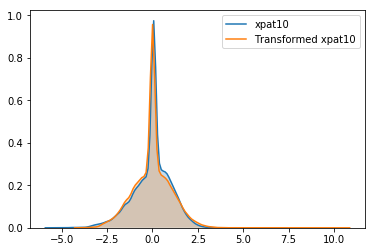

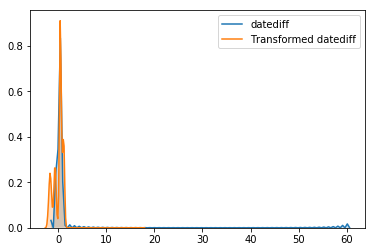

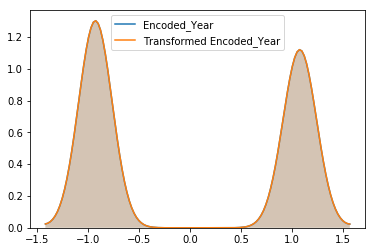

In [27]:
# Initialization
df, transformed_data_df, optimiser_dict = data_dict['Support'], pd.DataFrame(), dict()

# Loop through the data and apply box cox transformation
for num_variable in df.columns:
    if str(df[num_variable].dtypes) != 'object':
        if all(df[num_variable] > 0):
            transformed_feature, optimiser = feature_transformer(df[num_variable], num_variable)
            if -5 <= optimiser <= 5:
                transformed_data_df[num_variable] = transformed_feature
                optimiser_dict[num_variable] = optimiser
            else:
                transformed_data_df[num_variable] = preprocessing.scale(df[num_variable])
                optimiser_dict[num_variable] = np.nan
        else:
            transformed_data_df[num_variable] = preprocessing.scale(df[num_variable])

In [28]:
# Add player feature
transformed_data_df['player'] = list(df['player'])

# Add transformed dataframe to dictionary
trans_data_dict["Support"] = transformed_data_df
optimiser_data_dict["Support"] = optimiser_dict

Overview of variable:  split 


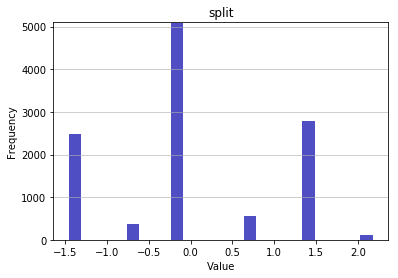

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.4749548570890703
Mean: -0.0
Standard deviation: 1.0
Median: -0.0903
Maximal value: 2.194588749619039


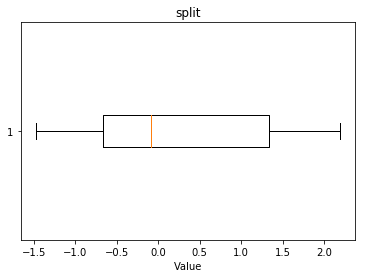

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


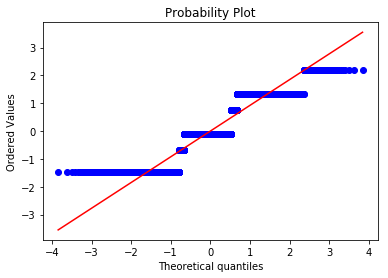

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.007
Kurtosis: -0.9541
Overview of variable:  patchno 


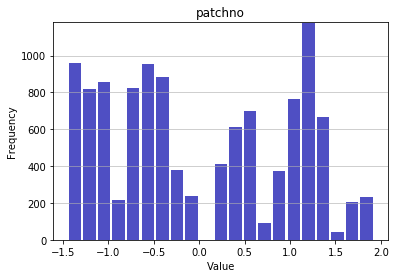

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.4472277558060447
Mean: -0.0
Standard deviation: 1.0
Median: -0.2962
Maximal value: 1.923677775215167


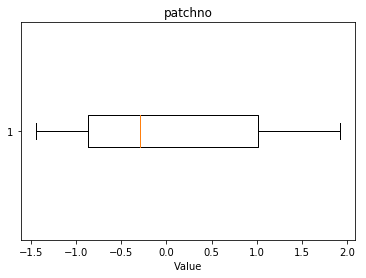

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


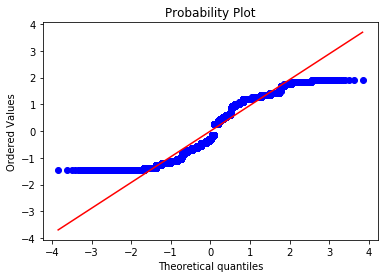

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.1651
Kurtosis: -1.3668
Overview of variable:  result 


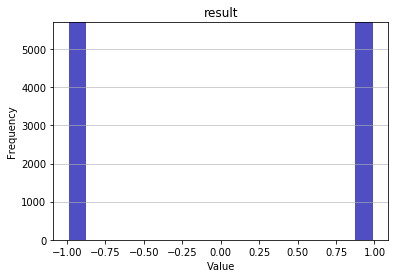

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.0
Mean: 0.0
Standard deviation: 1.0
Median: 0.0
Maximal value: 1.0


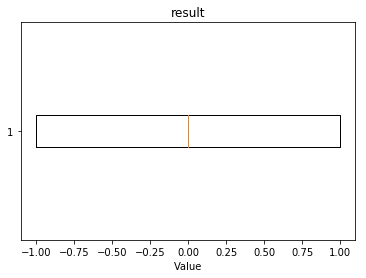

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


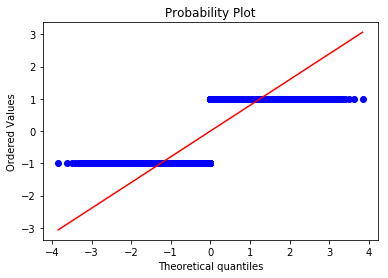

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: -2.0
Overview of variable:  k 


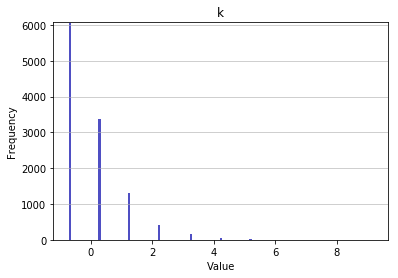

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.7243112913653703
Mean: 0.0
Standard deviation: 1.0
Median: -0.7243
Maximal value: 9.179998135560188


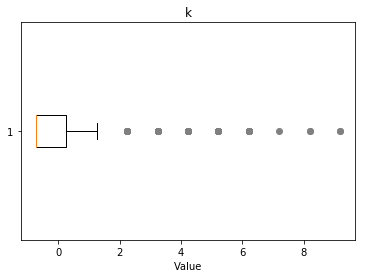

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.24, 4.23, 5.22, 6.21, 7.2, 8.19, 9.18}


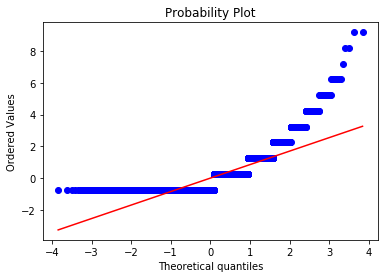

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.9639
Kurtosis: 6.0966
Overview of variable:  d 


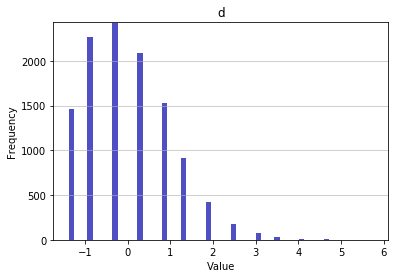

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.389816243373667
Mean: -0.0
Standard deviation: 1.0
Median: -0.2896
Maximal value: 5.761671958610356


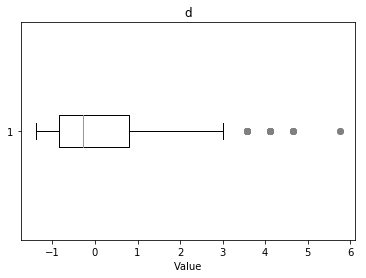

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.56, 3.01, 5.76, 4.11, 4.66}


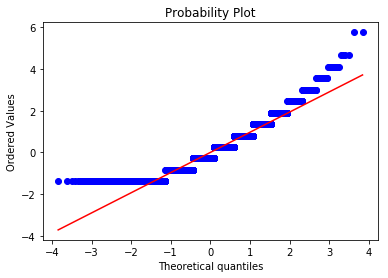

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.709
Kurtosis: 0.4987
Overview of variable:  a 


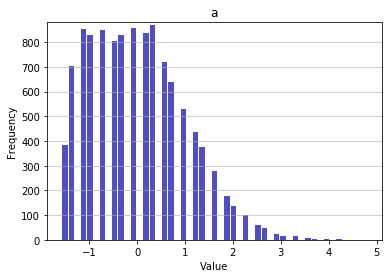

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.5749859763762186
Mean: -0.0
Standard deviation: 1.0
Median: -0.0866
Maximal value: 4.803768798939507


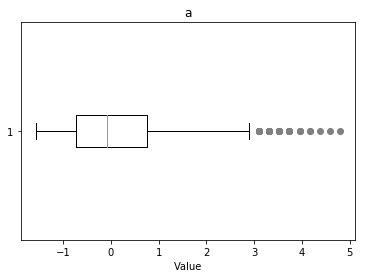

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.74, 3.32, 4.17, 3.1, 3.53, 3.95, 4.59, 4.38, 4.8}


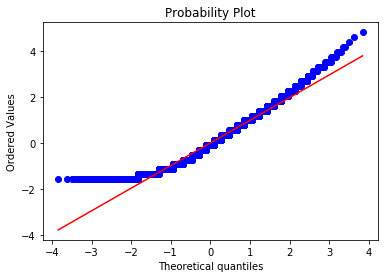

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.5589
Kurtosis: -0.0005
Overview of variable:  doubles 


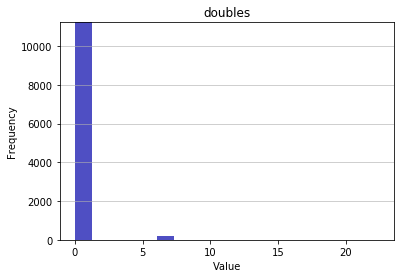

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.12352340539506916
Mean: -0.0
Standard deviation: 1.0
Median: -0.1235
Maximal value: 22.58087543141474


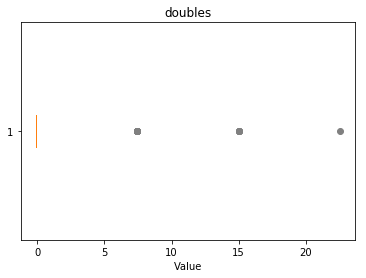

-------------------- 
Outlier detection:
 --------------------
List of outliers: {15.01, 22.58, 7.44}


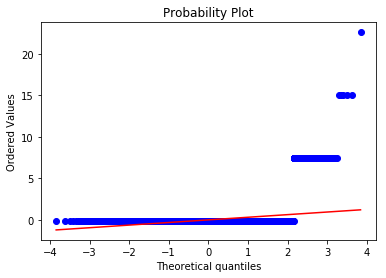

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 8.7566
Kurtosis: 88.7316
Overview of variable:  fb 


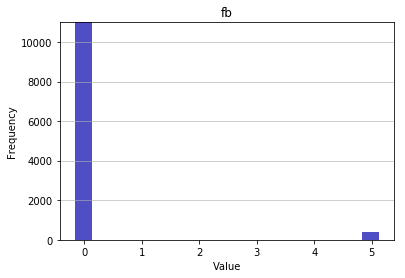

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.19391639732711186
Mean: 0.0
Standard deviation: 1.0
Median: -0.1939
Maximal value: 5.15686148146167


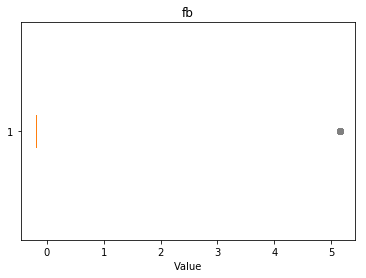

-------------------- 
Outlier detection:
 --------------------
List of outliers: {5.16}


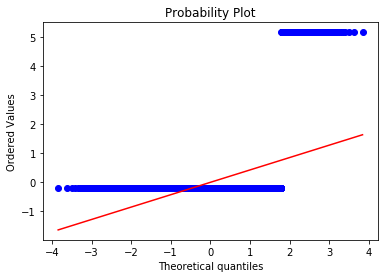

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 4.9629
Kurtosis: 22.6308
Overview of variable:  fbassist 


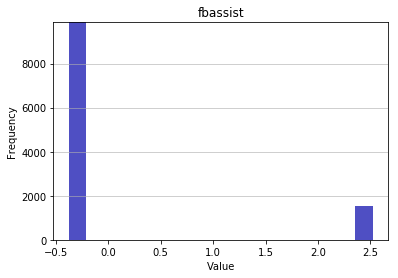

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.3937994995094666
Mean: -0.0
Standard deviation: 1.0
Median: -0.3938
Maximal value: 2.539363308601567


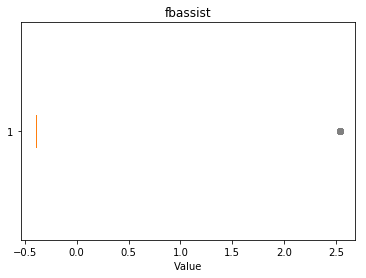

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


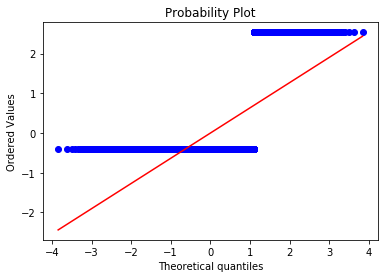

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.1456
Kurtosis: 2.6034
Overview of variable:  fbvictim 


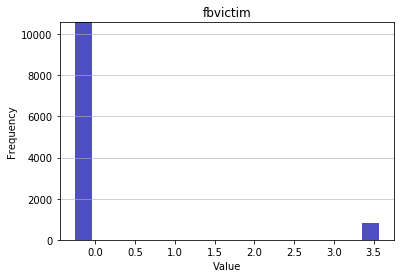

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.2786322555020265
Mean: -0.0
Standard deviation: 1.0
Median: -0.2786
Maximal value: 3.588959929273971


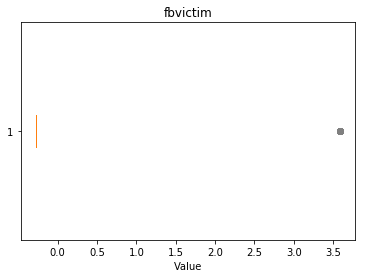

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.59}


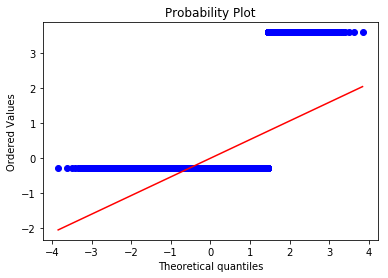

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 3.3103
Kurtosis: 8.9583
Overview of variable:  kpm 


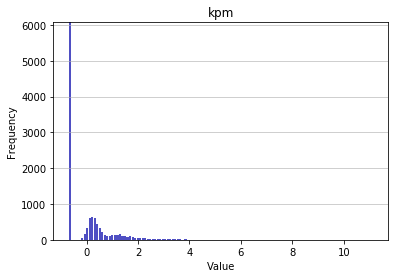

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.7081232401283417
Mean: -0.0
Standard deviation: 1.0
Median: -0.7081
Maximal value: 11.13904516279922


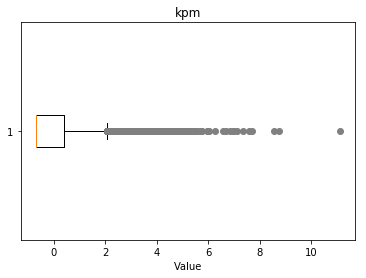

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.94, 4.47, 3.1, 4.2, 3.07, 3.32, 3.33, 3.56, 3.28, 3.25, 4.57, 5.06, 6.05, 3.5, 8.76, 11.14, 3.0, 4.25, 4.0, 4.93, 5.25, 5.18, 5.0, 8.57, 3.86, 3.18, 3.43, 3.61, 3.79, 3.54, 3.04, 3.29, 4.61, 4.22, 4.97, 4.54, 4.29, 5.29, 5.36, 5.47, 6.86, 7.11, 3.9, 3.15, 3.4, 3.22, 3.26, 3.08, 3.76, 4.58, 4.15, 5.26, 6.58, 6.01, 7.58, 3.44, 3.19, 3.55, 3.3, 3.05, 3.8, 4.05, 4.12, 5.44, 3.23, 3.98, 3.48, 3.16, 3.91, 3.66, 3.41, 3.59, 4.91, 4.84, 4.59, 4.02, 4.73, 5.48, 4.34, 4.27, 5.09, 4.48, 6.27, 5.77, 3.09, 3.52, 3.27, 3.02, 3.7, 3.45, 3.63, 3.38, 3.88, 4.13, 4.45, 5.13, 6.95, 7.7, 3.06, 3.81, 3.31, 3.17, 3.49, 3.42, 4.17, 4.24, 4.42, 5.6, 5.74, 5.49, 6.99, 7.35, 3.78, 3.6, 3.03, 3.35, 3.46, 3.21, 3.96, 3.71, 4.21, 4.96, 4.39, 4.03, 4.71, 5.96, 6.71, 3.64, 3.14, 3.57, 3.82, 3.89}


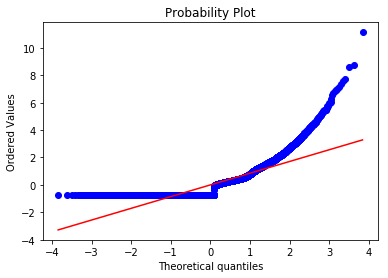

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.1425
Kurtosis: 7.7385
Overview of variable:  fd 


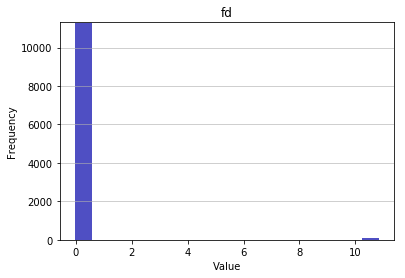

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.09168607158397853
Mean: -0.0
Standard deviation: 1.0
Median: -0.0917
Maximal value: 10.906782052321487


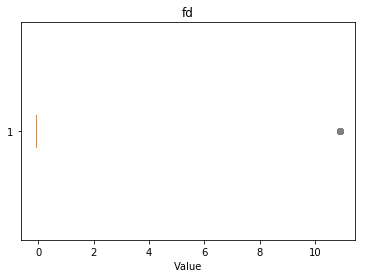

-------------------- 
Outlier detection:
 --------------------
List of outliers: {10.91}


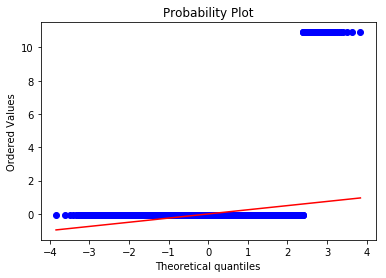

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 10.8151
Kurtosis: 114.9663
Overview of variable:  elementals 


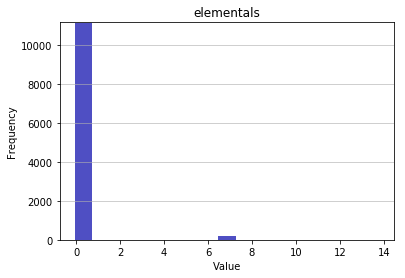

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.13695879436813488
Mean: -0.0
Standard deviation: 1.0
Median: -0.137
Maximal value: 13.861089821051282


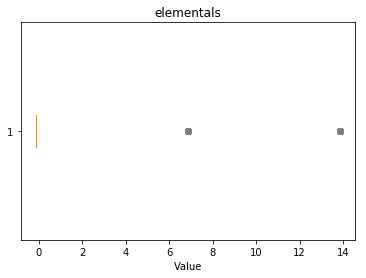

-------------------- 
Outlier detection:
 --------------------
List of outliers: {13.86, 6.86}


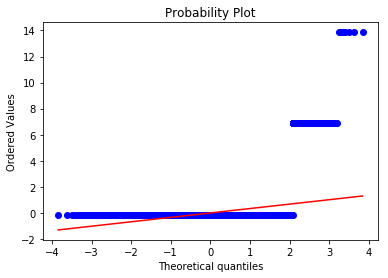

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 7.5593
Kurtosis: 60.339
Overview of variable:  firedrakes 


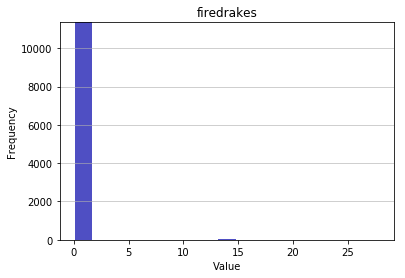

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.06656771553410842
Mean: -0.0
Standard deviation: 1.0
Median: -0.0666
Maximal value: 28.02993918175106


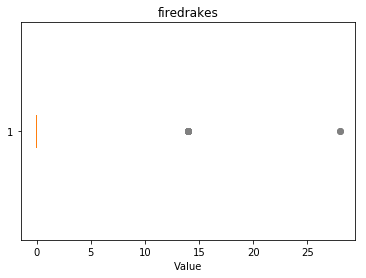

-------------------- 
Outlier detection:
 --------------------
List of outliers: {28.03, 13.98}


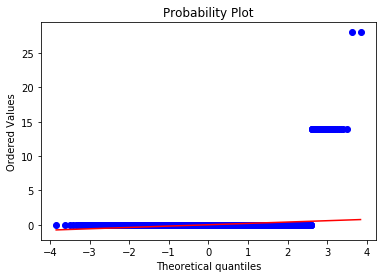

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 15.8568
Kurtosis: 273.0045
Overview of variable:  waterdrakes 


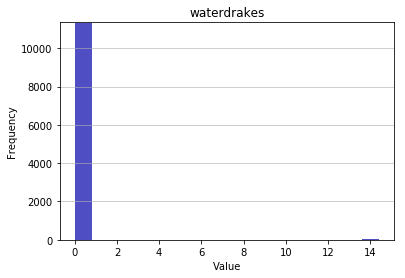

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.06900047150483293
Mean: 0.0
Standard deviation: 1.0
Median: -0.069
Maximal value: 14.492654589033615


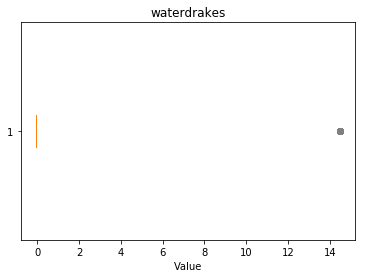

-------------------- 
Outlier detection:
 --------------------
List of outliers: {14.49}


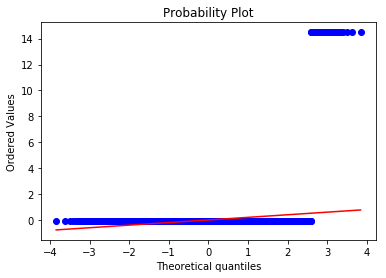

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 14.4237
Kurtosis: 206.0418
Overview of variable:  earthdrakes 


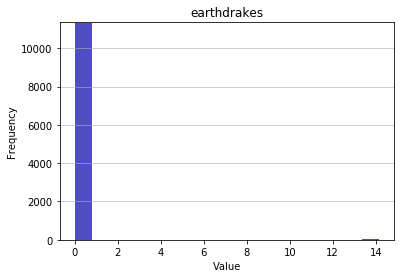

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.07027283689263064
Mean: 0.0
Standard deviation: 1.0
Median: -0.0703
Maximal value: 14.230249470757705


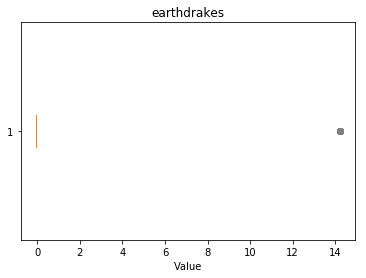

-------------------- 
Outlier detection:
 --------------------
List of outliers: {14.23}


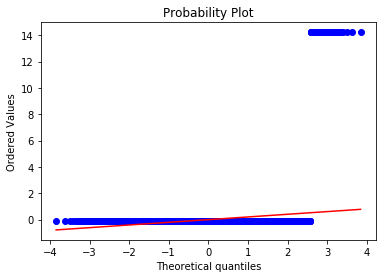

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 14.16
Kurtosis: 198.5049
Overview of variable:  airdrakes 


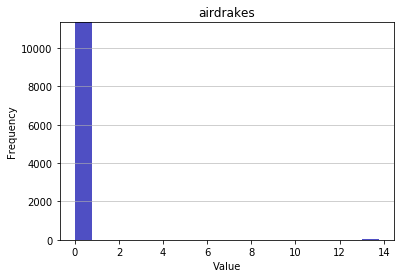

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.07214013197670176
Mean: 0.0
Standard deviation: 1.0
Median: -0.0721
Maximal value: 13.861909766438439


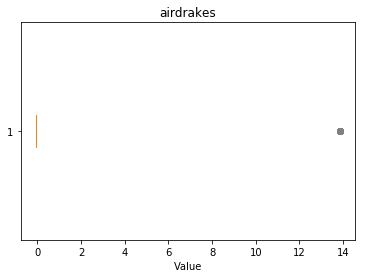

-------------------- 
Outlier detection:
 --------------------
List of outliers: {13.86}


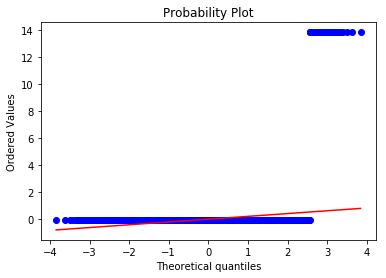

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 13.7898
Kurtosis: 188.1577
Overview of variable:  elders 


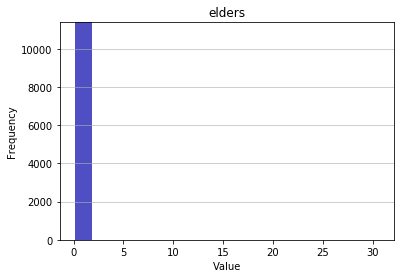

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.03246707613920312
Mean: 0.0
Standard deviation: 1.0
Median: -0.0325
Maximal value: 30.800432897390692


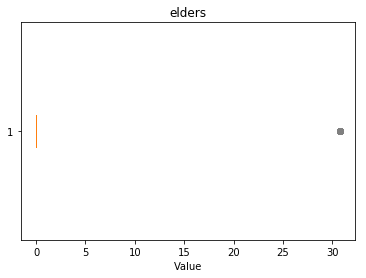

-------------------- 
Outlier detection:
 --------------------
List of outliers: {30.8}


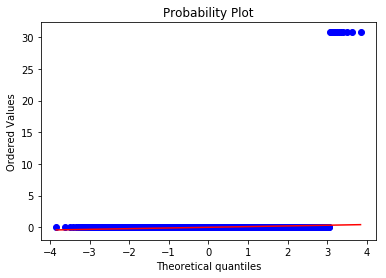

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 30.768
Kurtosis: 944.6677
Overview of variable:  herald 


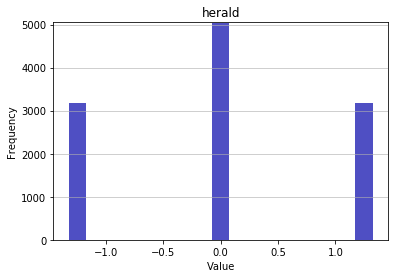

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.3396438591250057
Mean: 0.0
Standard deviation: 1.0
Median: 0.0
Maximal value: 1.3396438591250057


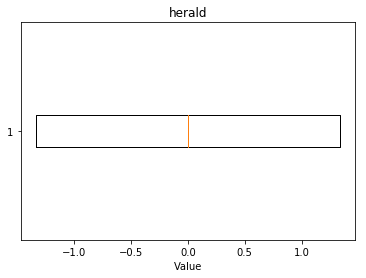

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


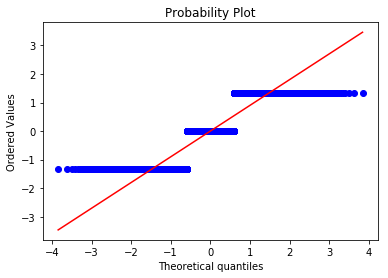

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: -1.2054
Overview of variable:  dmgtochamps 


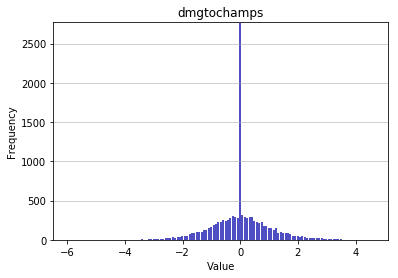

-------------------- 
Summary statistics:
 --------------------
Minimum value: -5.9537889079311945
Mean: -0.0
Standard deviation: 1.0
Median: 0.002
Maximal value: 4.610958002208722


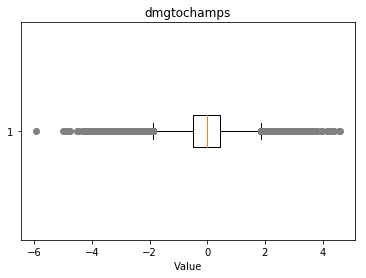

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.17, 3.49, 3.09, 3.53, 3.31, 3.8, 3.1, 4.61, 3.98, 3.82, 4.29, 3.25, -3.07, -3.39, -3.14, -3.32, 4.57, 4.0, -3.82, 3.0, -4.14, -4.78, -4.53, -4.46, 3.11, -3.46, -3.21, 3.04, -3.03, 3.29, -3.35, -4.92, -4.1, 3.4, -3.17, 3.47, 3.22, 3.72, 3.33, -3.56, 3.26, 3.08, 4.33, 4.4, -3.2, -3.45, 3.37, -3.52, -3.27, -3.02, 4.37, 3.48, -3.66, -3.59, -3.09, 3.16, 3.66, 3.41, -3.48, -3.23, -3.98, -4.19, -4.05, -4.3, -3.12, 3.2, -3.69, -3.19, 4.2, -5.01, -4.33, -4.01, -4.76, -3.08, 3.42, -3.4, 4.35, -4.29, 3.35, -3.79, 3.03, 3.21, -3.93, 3.96, -3.18, 3.46, 4.14, 3.64, 3.32, 3.14, -3.25, 3.07, -5.95, -4.07, -3.8}


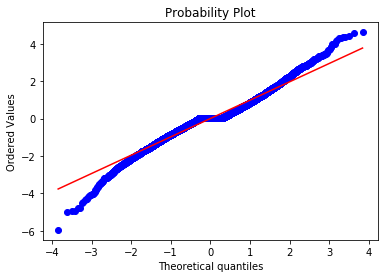

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0025
Kurtosis: 1.9766
Overview of variable:  dmgtochampsperminute 


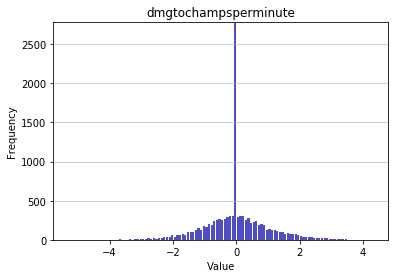

-------------------- 
Summary statistics:
 --------------------
Minimum value: -5.299678941638443
Mean: 0.0
Standard deviation: 1.0
Median: -0.013
Maximal value: 4.326367406822171


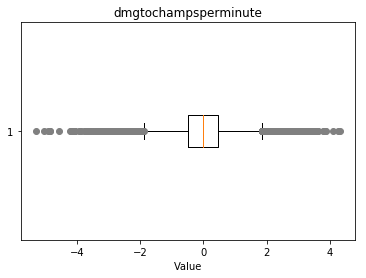

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.11, 3.59, 3.32, 3.07, 3.03, 3.08, 3.29, 3.05, 3.23, 3.0, 4.09, -3.89, -3.07, -5.03, 3.18, -3.21, 3.43, 3.79, -3.6, -3.03, 3.04, -3.28, 3.4, -3.17, -3.67, 3.15, 3.58, -3.06, 3.83, 3.01, 4.26, 4.33, 3.44, -3.2, -3.13, -3.95, -3.7, 3.19, 3.55, 3.62, 3.3, -3.77, -3.02, -4.09, -4.16, -4.84, -4.91, -3.41, -3.66, -3.34, 3.84, 3.41, -4.05, -4.19, 3.02, -3.37, -3.05, -3.12, -3.62, 3.2, -3.19, 3.38, 3.13, -4.58, 3.06, -3.26, 3.31, -3.33, -3.01, -3.08, 3.24, -3.15, -3.65, 3.49, -4.86, 3.35, 3.1, -3.29, 3.46, -3.86, -3.36, -3.68, -3.11, -3.61, 3.39, -3.5, 3.89, -5.3, -4.22, -3.55}


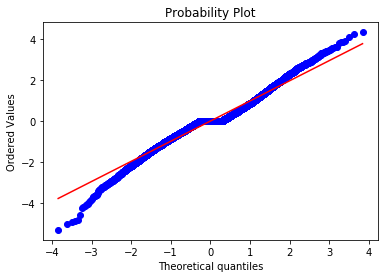

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0169
Kurtosis: 1.66
Overview of variable:  dmgshare 


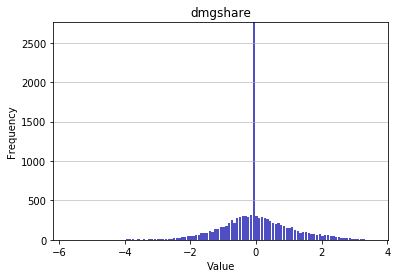

-------------------- 
Summary statistics:
 --------------------
Minimum value: -5.71624667910529
Mean: 0.0
Standard deviation: 1.0
Median: -0.0351
Maximal value: 3.574706311675144


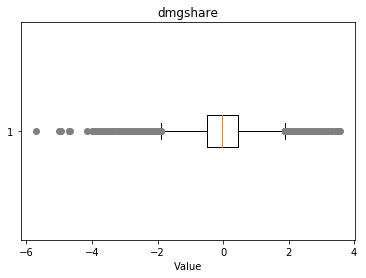

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.0, 3.21, 3.24, 3.28, 3.05, 3.04, 3.27, 3.26, 3.17, 3.07, -3.05, 3.01, -3.64, -3.14, -3.81, -3.72, -3.56, -3.22, -3.9, 3.08, -3.82, -3.47, -3.01, -5.72, -4.71, -4.7, -4.94, 3.53, -3.37, 3.43, -3.04, -3.13, -3.95, 3.52, -3.83, -3.62, -3.75, 3.14, -3.39, -3.11, -3.57, -3.07, -3.99, -3.74, 3.29, -3.94, -3.53, -3.03, -3.18, -3.69, -3.43, -3.27, 3.12, -3.17, -3.42, -3.92, -4.67, 3.57, -3.25, -3.59, -3.08, -3.84, -3.16, -3.41, -3.09, 3.47, 3.15, -3.67, -5.0, -4.15, -3.71, 3.44}


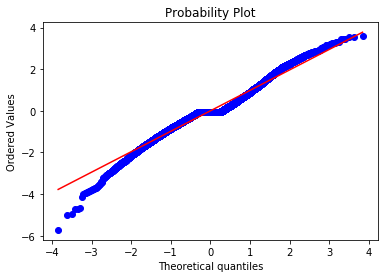

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0078
Kurtosis: 1.4292
Overview of variable:  earnedgoldshare 


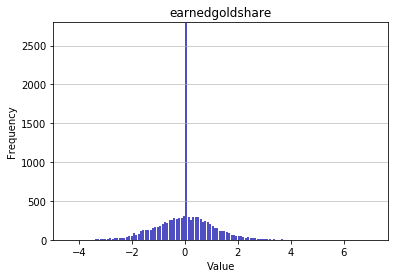

-------------------- 
Summary statistics:
 --------------------
Minimum value: -4.391659846118455
Mean: -0.0
Standard deviation: 1.0
Median: 0.0156
Maximal value: 7.112470659811763


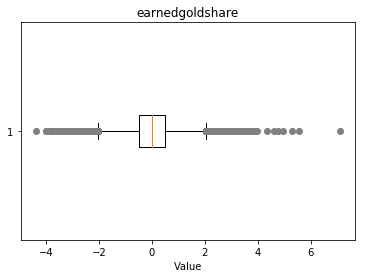

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.3, 3.0, 3.04, 3.75, 3.26, 3.02, 3.13, 3.12, 3.14, 3.22, 5.58, 5.29, 7.11, 3.09, 3.24, 3.99, 3.16, 3.42, 4.77, 4.6, 4.33, 3.34, 3.67, -3.22, -3.47, 3.66, -3.15, -3.9, -3.34, 3.7, 3.85, 3.03, 3.1, 3.36, 3.11, 3.44, -3.37, -3.05, -3.12, -3.29, -3.3, -3.11, -3.08, -3.07, -3.32, -3.21, 3.29, 3.21, 3.46, 3.62, 3.54, 3.55, 3.45, -3.6, -3.85, -3.18, -3.28, 4.95, 3.76, -4.01, -3.02, -4.02, -3.16, 3.23, 3.15, -3.26, 3.89, -3.74, -3.33, -3.44, -3.5, -3.24, -3.25, -3.41, -3.19, -4.39, -3.01, -3.73}


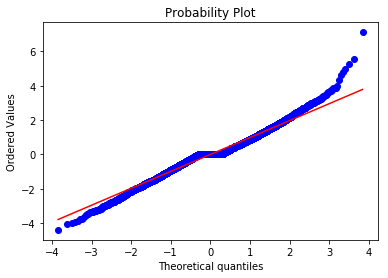

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.057
Kurtosis: 1.5242
Overview of variable:  wards 


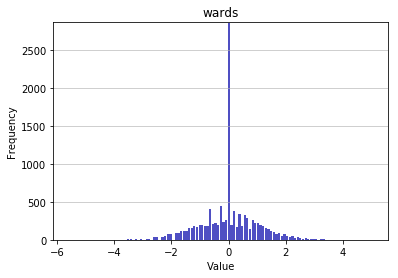

-------------------- 
Summary statistics:
 --------------------
Minimum value: -5.60054694885417
Mean: 0.0
Standard deviation: 1.0
Median: -0.0293
Maximal value: 5.0542332670109


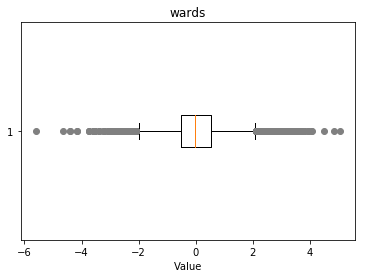

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.08, 3.38, 4.5, 4.85, 3.05, 3.32, 3.01, 3.4, 3.11, 3.23, 4.07, 5.05, 3.49, -3.56, 3.26, 3.74, 3.68, -3.38, 3.35, -3.21, 3.52, 3.43, 3.95, 3.63, 3.55, 3.29, 4.05, -4.4, -4.17, 3.82, -3.75, 3.14, -5.6, -4.66, -3.05}


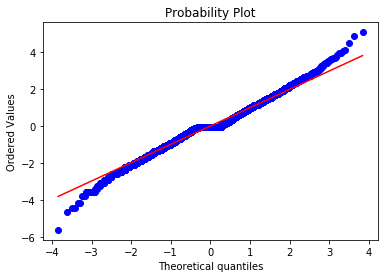

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0197
Kurtosis: 1.114
Overview of variable:  wpm 


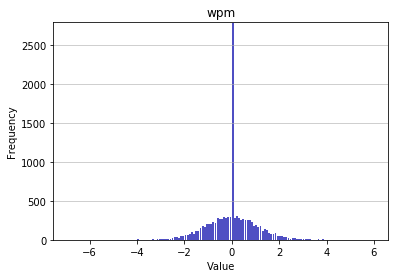

-------------------- 
Summary statistics:
 --------------------
Minimum value: -6.892265152462001
Mean: 0.0
Standard deviation: 1.0
Median: -0.0026
Maximal value: 5.968848505983419


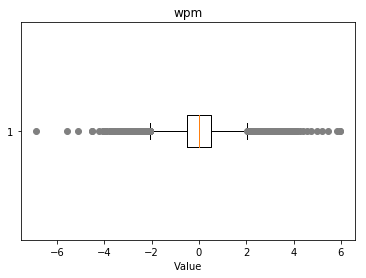

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.0, 3.86, 3.02, 5.84, 3.13, 3.38, 4.15, 4.28, 5.01, 3.47, 4.07, 5.97, 3.25, -3.07, -3.39, -3.32, -3.14, -3.57, -3.64, -3.96, 3.04, -3.6, -3.28, 3.79, -3.03, -4.24, 3.22, -3.24, 3.4, 3.65, -3.99, -3.74, -3.92, 3.08, -3.06, 3.58, 3.01, 4.01, -5.56, 3.94, -3.2, 3.69, 3.12, 3.55, -3.27, 3.8, 3.05, 4.55, 5.94, 5.19, -4.52, 3.73, -3.09, -3.91, -3.41, 3.66, -3.73, 4.73, 4.41, -4.05, 3.27, -3.05, 3.88, 3.63, 3.2, 5.45, 3.06, 3.31, -3.33, -3.08, 3.99, -3.15, 3.28, 3.1, -3.54, 3.03, -3.29, 3.21, -3.11, -3.43, -3.93, 4.14, -4.07, 3.07, -6.89, -5.1, -4.53, -3.72}


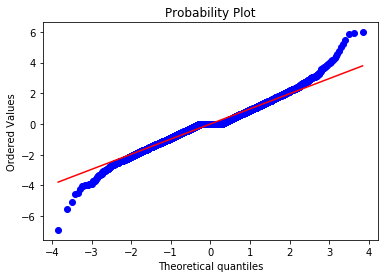

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0744
Kurtosis: 1.9786
Overview of variable:  wardshare 


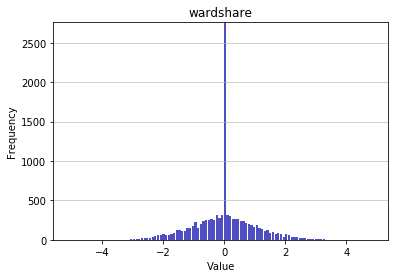

-------------------- 
Summary statistics:
 --------------------
Minimum value: -5.093933876140545
Mean: -0.0
Standard deviation: 1.0
Median: -0.0044
Maximal value: 4.879039308953279


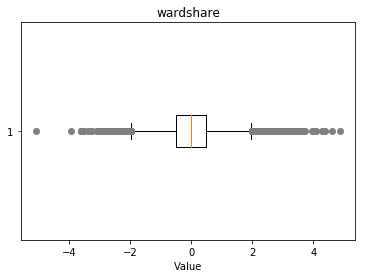

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.02, 3.28, 3.63, 3.05, 3.46, 3.35, 3.08, 3.27, 3.11, 4.29, 4.0, 3.59, 3.16, -3.06, -3.32, 3.74, 3.5, 4.6, 4.09, 3.17, 3.01, 3.67, 3.52, -3.62, -3.38, -3.29, -3.04, -3.63, 3.24, 3.38, -3.6, -3.03, 3.04, 3.54, 4.88, 4.38, 3.45, 3.95, 3.0, 3.15, 3.26, 3.06, -3.24, -3.01, -3.08, -3.09, -3.34, -3.51, 3.32, 3.4, 3.14, -5.09, -3.95}


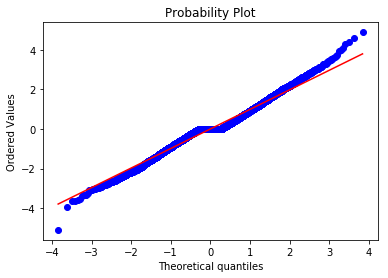

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0572
Kurtosis: 1.022
Overview of variable:  wardkills 


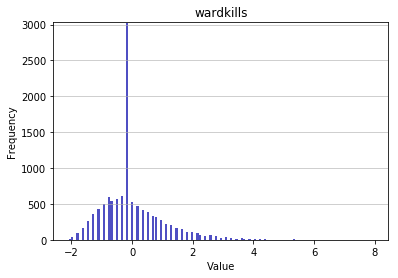

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2.094695856505171
Mean: 0.0
Standard deviation: 1.0
Median: -0.1516
Maximal value: 7.944657741730098


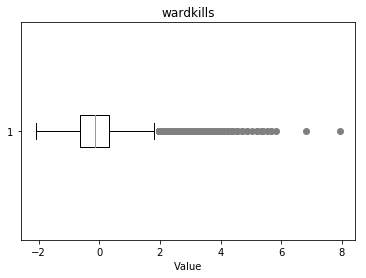

-------------------- 
Outlier detection:
 --------------------
List of outliers: {5.03, 3.09, 3.41, 3.57, 4.38, 4.06, 5.84, 4.71, 5.35, 3.73, 5.19, 4.87, 5.68, 7.94, 3.25, 3.9, 4.22, 4.54, 5.52, 6.81}


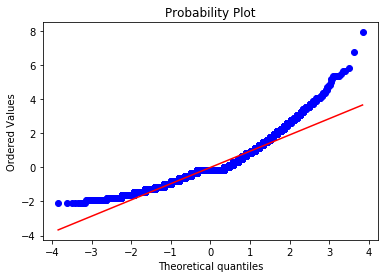

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.2769
Kurtosis: 3.0878
Overview of variable:  wcpm 


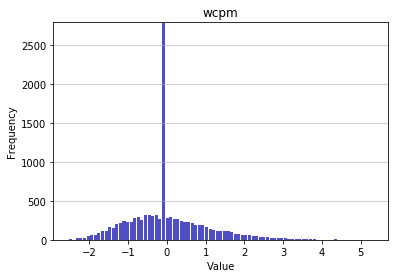

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2.538003177945278
Mean: -0.0
Standard deviation: 1.0
Median: -0.0969
Maximal value: 5.321786523350712


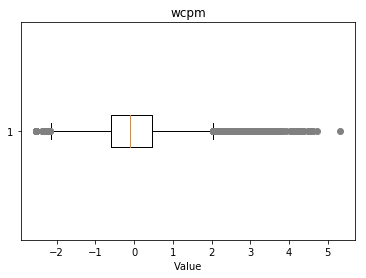

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.24, 3.14, 4.2, 4.55, 3.12, 4.38, 3.75, 4.28, 3.06, 4.09, 4.72, 3.37, 3.84, 3.42, 3.33, 3.0, 3.67, 3.51, 4.59, 4.52, 4.34, 4.33, 3.09, 4.5, 3.16, 3.13, 3.38, 4.07, 5.32, 3.2, 3.68, 3.02, 3.19, 3.78, 3.35, 3.1, 3.94, 3.53, 3.03, 3.36, 4.27, 3.74, 3.45, 3.05, 3.55, 3.21, 3.63, 4.03, 4.13, 4.3, 3.04, 3.62, 4.63, 3.43, 3.54, 3.15, 3.18, 3.01, 3.23, 3.32, 3.39, 3.48, 3.47, 3.4, 3.31, 3.57, 3.72, 3.65, 3.69, 3.08}


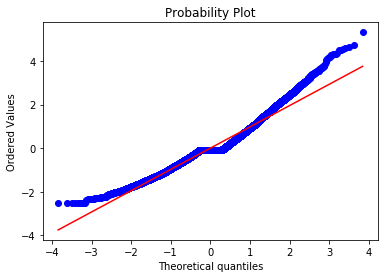

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7533
Kurtosis: 1.3179
Overview of variable:  visionwards 


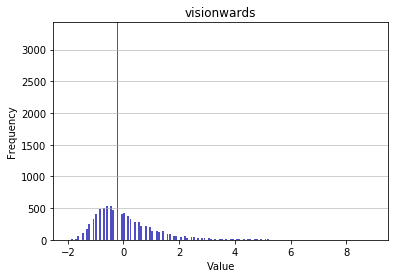

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.9734682658980263
Mean: 0.0
Standard deviation: 1.0
Median: -0.213
Maximal value: 8.966420239336136


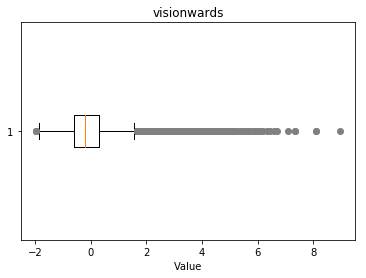

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.43, 3.18, 4.57, 5.95, 6.45, 4.69, 3.31, 3.06, 4.06, 6.07, 7.33, 6.58, 6.33, 8.97, 8.09, 4.82, 5.82, 5.07, 5.57, 5.32, 7.08, 3.94, 3.69, 4.44, 4.31, 4.19, 4.94, 5.45, 5.19, 5.7, 6.7, 6.2, 3.81, 3.56}


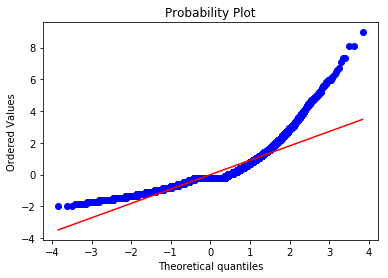

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.1576
Kurtosis: 7.7467
Overview of variable:  visionwardbuys 


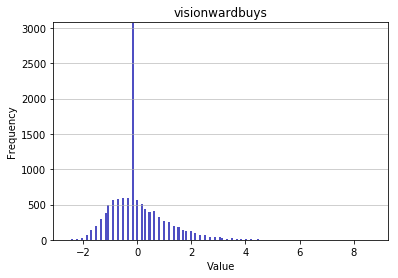

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2.5407621627605192
Mean: 0.0
Standard deviation: 1.0
Median: -0.1871
Maximal value: 8.723366040375309


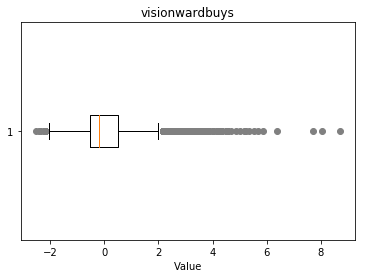

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.01, 3.34, 3.68, 3.18, 3.85, 4.52, 3.51, 4.18, 8.05, 8.72, 4.86, 5.19, 6.37, 7.71, 4.35, 4.02, 5.02, 4.69, 5.36, 5.53, 5.7, 5.87}


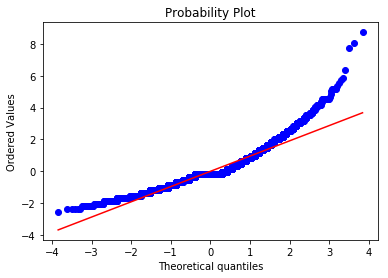

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.2848
Kurtosis: 3.5521
Overview of variable:  totalgold 


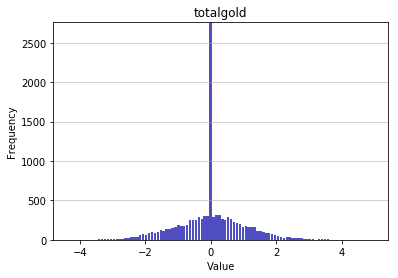

-------------------- 
Summary statistics:
 --------------------
Minimum value: -4.348368290871499
Mean: 0.0
Standard deviation: 1.0
Median: 0.0095
Maximal value: 4.953193687193911


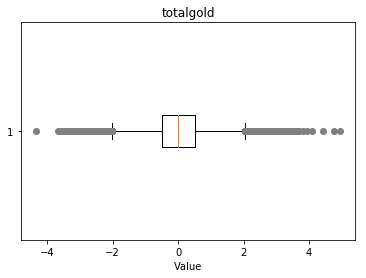

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.39, 3.26, 3.06, 3.1, 3.2, 3.49, 3.45, 4.1, 3.29, 3.67, 4.44, 3.42, -3.15, -3.47, 3.09, 3.59, 3.08, 4.75, 3.51, 3.01, -3.22, -3.07, 3.03, -3.21, 3.36, -3.37, 3.28, 3.52, 3.69, 3.93, -3.29, -3.38, -3.12, -3.39, -3.32, -3.57, 3.55, -3.02, 3.21, 3.13, 3.63, 4.95, -3.11, -3.44, -3.18, -3.1, -3.06, -3.45, -3.2, 3.56, -3.01, 3.32, 3.07, 3.4, 3.82, -3.0, -3.24, -3.16, -3.67, -3.34, -4.35, -3.09, -3.23}


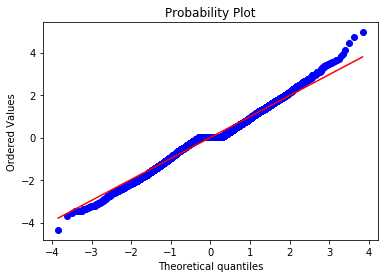

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0014
Kurtosis: 0.9484
Overview of variable:  earnedgpm 


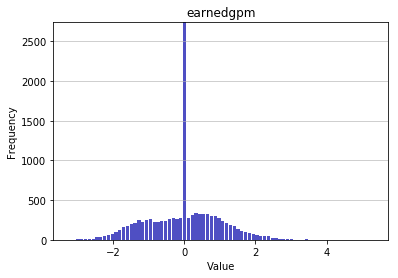

-------------------- 
Summary statistics:
 --------------------
Minimum value: -3.245244254216809
Mean: -0.0
Standard deviation: 1.0
Median: 0.0433
Maximal value: 5.309035983357932


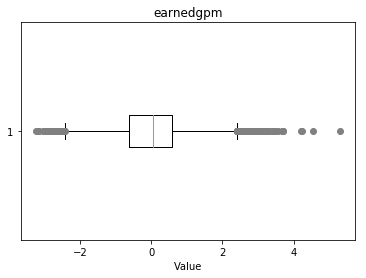

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.7, 3.06, 3.67, 3.03, 3.05, 3.44, 3.71, 3.43, 5.31, 3.32, 4.23, 3.01, 3.16, 3.49, 3.25, 3.17, 3.02, 3.27, -3.05, 3.04, 3.13, 4.21, 4.54, 3.14, 3.4, -3.17, 3.56, -3.16, -3.0, -3.25}


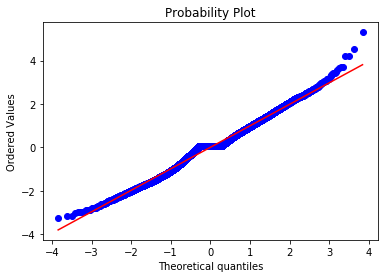

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0103
Kurtosis: 0.2771
Overview of variable:  goldspent 


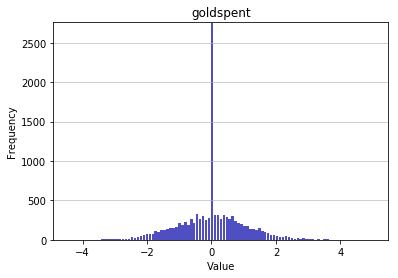

-------------------- 
Summary statistics:
 --------------------
Minimum value: -4.436575797373997
Mean: 0.0
Standard deviation: 1.0
Median: 0.0262
Maximal value: 5.017439767826193


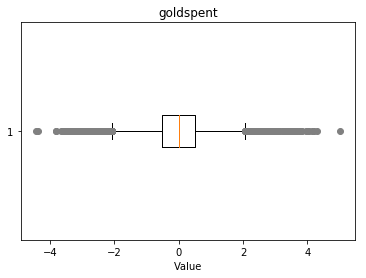

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.47, 3.08, 3.62, 3.38, 3.31, 3.32, 3.27, 4.04, 4.14, 3.35, 4.0, 5.02, 3.59, -3.32, -3.15, 3.33, 3.49, 3.09, 3.01, 3.74, 3.66, 3.83, -3.39, -3.54, -4.36, 3.6, -3.2, -3.29, 3.02, 3.11, 3.03, 3.1, 3.36, 3.28, 3.53, -3.64, -3.07, 3.79, 3.95, 3.04, 3.12, 3.05, 4.3, 4.2, -3.03, -3.02, 3.46, -3.06, -3.81, 3.22, -3.26, -3.17, 3.06, -3.0, 3.23, 3.07, -3.58, -3.42, -3.09, -3.51, -4.44, -3.23, -3.48, -3.12}


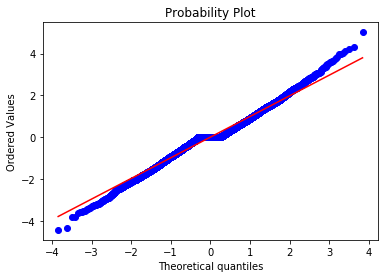

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.0105
Kurtosis: 1.0233
Overview of variable:  gspd 


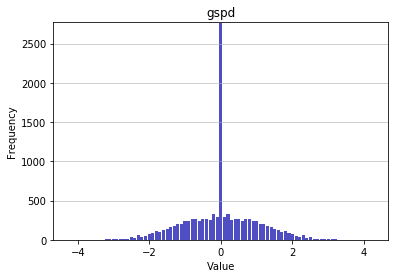

-------------------- 
Summary statistics:
 --------------------
Minimum value: -4.268101910857731
Mean: 0.0
Standard deviation: 1.0
Median: 0.0
Maximal value: 4.268101910857731


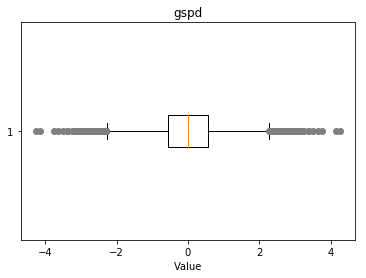

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.18, 3.13, 3.63, 3.02, 4.14, 3.51, 3.23, 3.35, 3.12, 3.76, 4.27, 3.08, -3.23, -3.39, -3.07, 3.11, -3.63, -3.12, -3.21, 3.21, -3.02, -3.35, -3.18, -3.11, -4.27, 3.39, -3.51, -3.76, -3.08, 3.07, -4.14, -3.13}


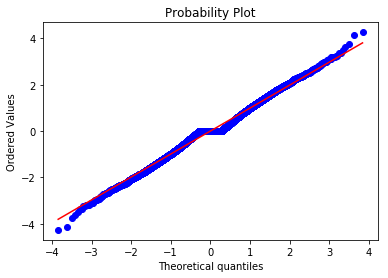

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 0.418
Overview of variable:  minionkills 


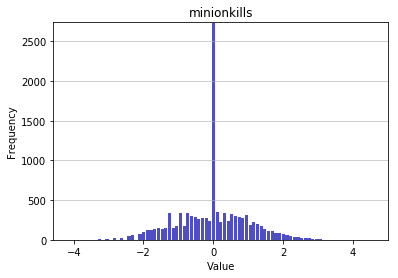

-------------------- 
Summary statistics:
 --------------------
Minimum value: -4.152550598453988
Mean: -0.0
Standard deviation: 1.0
Median: 0.0306
Maximal value: 4.588405530701789


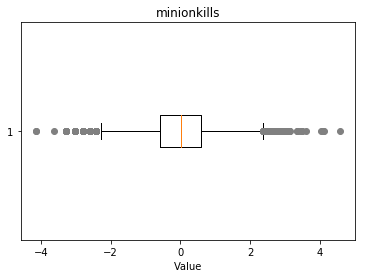

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.14, 4.05, 3.6, 3.05, 3.11, 3.34, 3.0, 3.47, 3.36, 3.5, 4.08, 3.08, 4.59, 3.03, -3.63, 3.13, 3.38, -3.28, 4.13, 3.07, -4.15, -3.01}


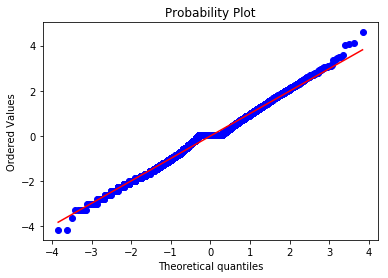

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0178
Kurtosis: 0.3878
Overview of variable:  monsterkills 


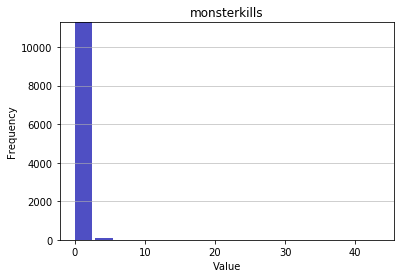

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.2471217473208542
Mean: -0.0
Standard deviation: 1.0
Median: -0.2471
Maximal value: 43.657991899180665


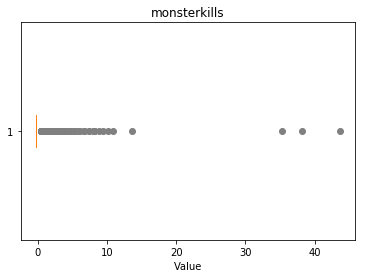

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.24, 3.93, 4.63, 6.03, 38.08, 7.42, 8.12, 10.21, 5.33, 6.72, 43.66, 9.51, 8.81, 10.9, 35.3, 13.69}


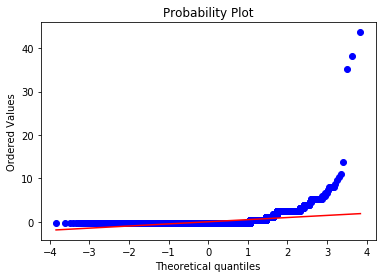

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 18.3498
Kurtosis: 651.3733
Overview of variable:  monsterkillsownjungle 


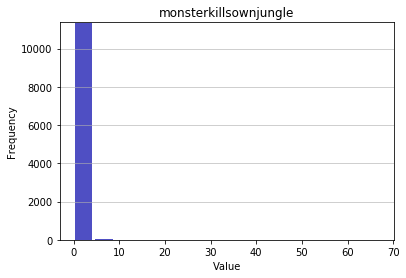

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.11294062156257505
Mean: 0.0
Standard deviation: 1.0
Median: -0.1129
Maximal value: 67.27299253692462


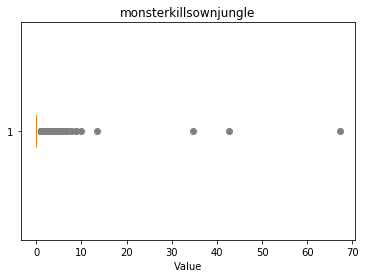

-------------------- 
Outlier detection:
 --------------------
List of outliers: {34.7, 3.26, 4.38, 5.5, 6.63, 7.75, 8.87, 67.27, 42.56, 9.99, 13.36}


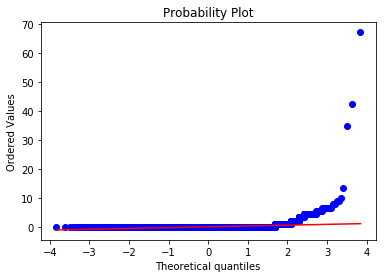

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 38.8222
Kurtosis: 2220.8052
Overview of variable:  monsterkillsenemyjungle 


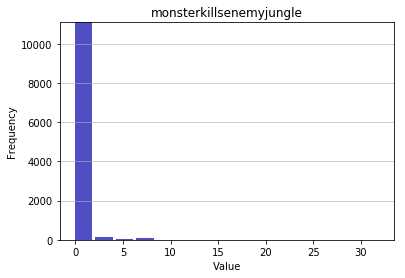

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.2142974987073699
Mean: -0.0
Standard deviation: 1.0
Median: -0.2143
Maximal value: 32.06771565752775


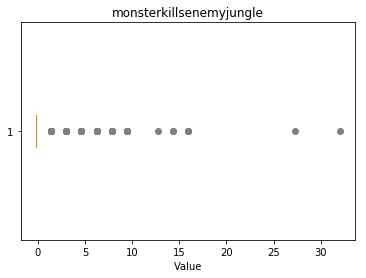

-------------------- 
Outlier detection:
 --------------------
List of outliers: {32.07, 3.01, 4.63, 6.24, 7.86, 9.47, 12.7, 14.31, 15.93, 27.23}


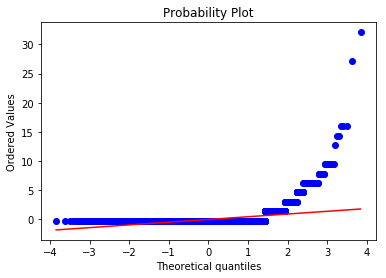

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 10.0438
Kurtosis: 188.1433
Overview of variable:  cspm 


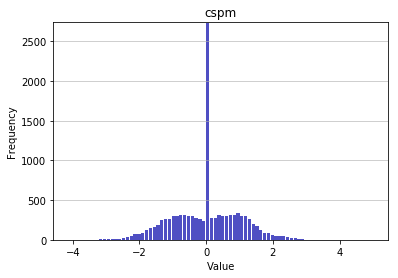

-------------------- 
Summary statistics:
 --------------------
Minimum value: -4.130783294962539
Mean: 0.0
Standard deviation: 1.0
Median: 0.0118
Maximal value: 5.0122180621885555


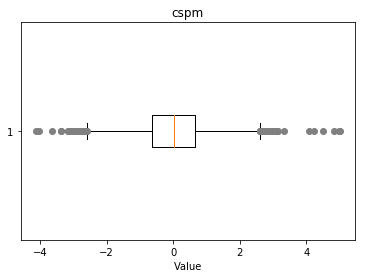

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.1, 4.23, 4.82, 3.32, 3.05, 3.14, 3.06, 5.01, 4.99, 4.06, 4.49, -3.07, -3.14, -3.15, -3.06, -4.13, -3.63, -3.12, -3.02, -3.18, -3.17, -4.03, -3.38}


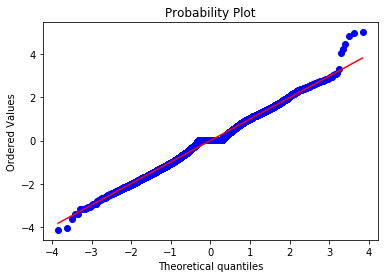

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0099
Kurtosis: 0.2499
Overview of variable:  goldat10 


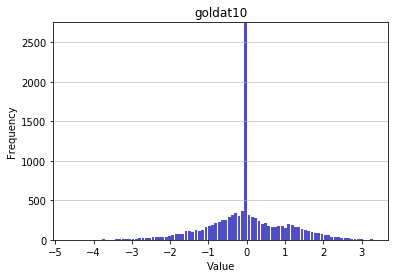

-------------------- 
Summary statistics:
 --------------------
Minimum value: -4.6593003637968975
Mean: -0.0
Standard deviation: 1.0
Median: -0.0403
Maximal value: 3.306857118796508


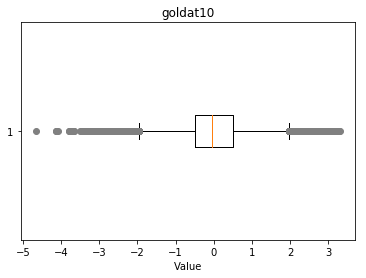

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.15, 3.27, 3.08, 3.24, 3.22, 3.13, 3.31, 3.02, 3.04, -3.32, -3.39, -3.06, -3.23, -3.31, -3.14, -3.73, -3.22, -4.12, -3.05, -3.79, -3.3, -3.1, -3.28, -3.02, -3.44, -3.27, -3.11, -3.78, -3.19, -3.35, -3.43, -3.36, -4.66, -3.08, -3.01, -3.51, -3.66, -3.75, -4.09, -3.04}


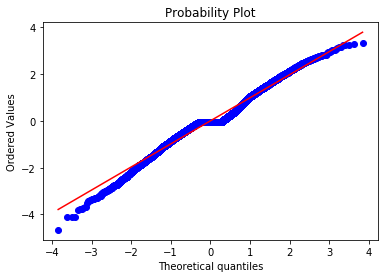

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.0562
Kurtosis: 0.8073
Overview of variable:  gdat10 


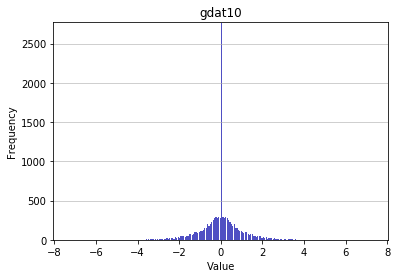

-------------------- 
Summary statistics:
 --------------------
Minimum value: -7.317342494503647
Mean: 0.0
Standard deviation: 1.0
Median: 0.0
Maximal value: 7.317342494503647


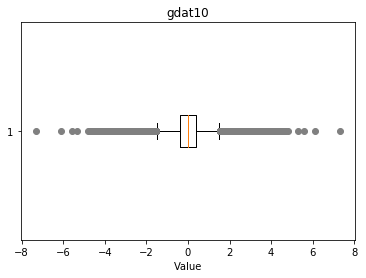

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.13, 3.27, 3.88, 5.31, 3.58, 3.92, 3.38, 4.4, 3.24, 3.14, 7.32, 6.12, 3.25, -3.57, -3.07, 3.75, 4.32, 4.68, -4.14, -4.21, -4.71, -4.03, 3.43, 3.36, -3.96, 3.11, 3.18, 3.61, 3.29, -3.03, -3.1, 3.04, -3.35, 4.79, 4.61, -4.24, 3.15, -3.74, -3.67, -3.92, -3.24, -3.49, 3.65, -3.42, -3.17, 3.4, 3.01, 3.08, -3.56, 3.26, 4.51, 4.26, 5.58, -4.38, -3.38, -3.13, -3.45, -3.2, -3.88, 3.37, -3.27, 3.55, -3.52, 3.12, -3.77, 3.05, 3.87, 4.05, 3.62, -4.59, 3.98, -3.41, -3.34, -3.91, 3.41, -3.98, 3.34, 3.91, 4.59, -4.05, 3.52, 3.77, -3.55, -3.12, -3.37, -3.05, -3.87, -3.62, 3.2, 3.45, 4.31, 4.38, -5.58, -4.4, -4.51, -4.26, 3.56, -3.26, -3.58, -3.01, -3.08, 3.49, -3.15, 3.67, 3.74, -3.65, 4.24, 3.42, 3.17, -3.4, -4.79, -4.61, 3.03, -3.29, 3.1, -3.04, 3.35, 3.96, -3.18, -3.11, -3.43, -3.36, 4.14, 4.21, -3.61, 4.71, 4.03, -4.32, -4.68, 3.57, -3.25, 3.07, -3.75, -7.32, -6.12, -5.31, -4.31, -3.14}


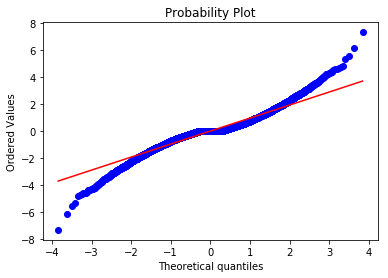

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 3.7022
Overview of variable:  goldat15 


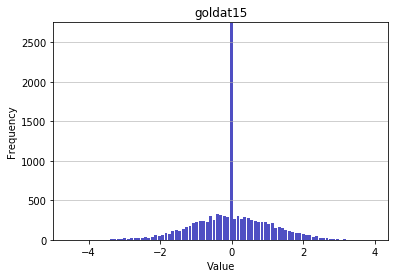

-------------------- 
Summary statistics:
 --------------------
Minimum value: -4.5622825742883215
Mean: 0.0
Standard deviation: 1.0
Median: -0.0179
Maximal value: 3.96310810837422


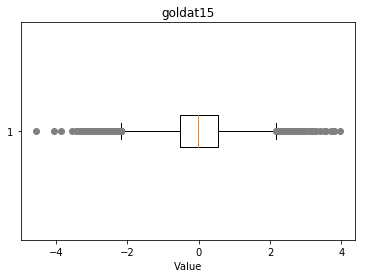

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.19, 3.28, 3.0, 3.12, 3.8, 3.5, 3.15, 3.55, 3.7, 3.79, 3.16, -3.32, -3.07, -3.15, -3.14, -3.39, -4.05, -3.04, -3.13, -3.05, -3.2, -3.45, -3.37, 3.96, -3.35, -3.11, -3.03, -3.02, -3.27, -3.19, -3.28, -3.86, 3.4, -3.34, -3.26, -3.25, -3.01, -3.08, -3.0, -3.41, -4.56, -3.54}


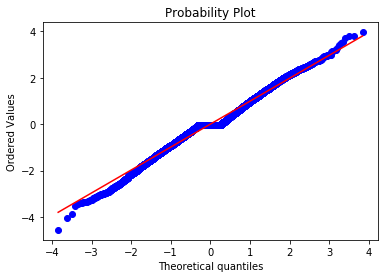

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.0439
Kurtosis: 0.6843
Overview of variable:  gdat15 


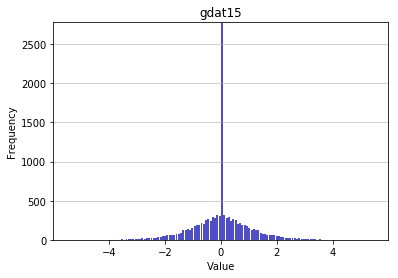

-------------------- 
Summary statistics:
 --------------------
Minimum value: -5.440427162691174
Mean: 0.0
Standard deviation: 1.0
Median: 0.0
Maximal value: 5.440427162691174


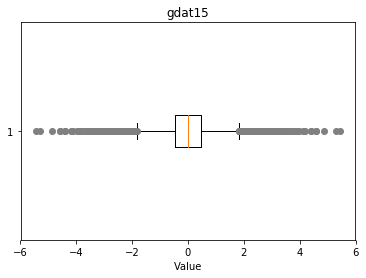

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.91, 3.47, 4.58, 3.55, 3.2, 3.11, 3.07, 4.17, 3.13, 3.69, 4.41, 5.29, 3.5, 3.25, -3.32, -3.14, 4.57, 3.18, -3.21, -3.96, 3.43, 3.79, -3.85, 3.29, 4.86, -4.17, 3.4, -3.24, 3.22, -3.17, 3.08, -3.81, 3.51, 3.26, -3.2, -3.13, 3.37, 3.12, -3.52, -3.02, 3.05, 5.44, -4.41, 3.23, -3.59, -3.66, -3.91, -3.09, -3.16, 3.59, 3.09, 3.66, 3.16, -3.23, 3.52, -3.55, -3.12, 3.02, -3.05, -3.37, -3.69, -4.58, 3.81, -3.26, -3.08, -3.51, 3.17, -3.4, -3.22, 3.24, -3.47, 4.1, -5.29, -4.86, 3.85, -3.29, -3.79, 3.21, -3.43, -3.11, 3.96, -3.18, -4.57, 3.14, -3.5, -3.25, 3.32, -5.44, -4.1, -3.07}


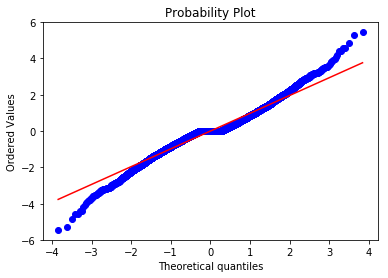

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 2.0002
Overview of variable:  xpat10 


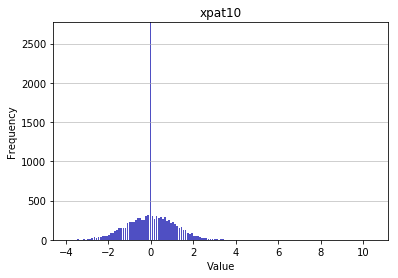

-------------------- 
Summary statistics:
 --------------------
Minimum value: -3.8796598951230723
Mean: 0.0
Standard deviation: 1.0
Median: 0.008
Maximal value: 10.4568022359544


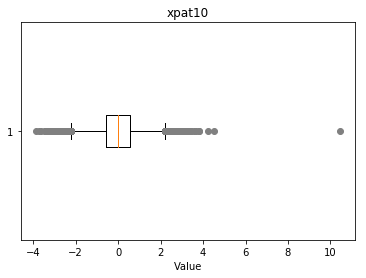

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.11, 3.07, 3.31, 3.08, 3.35, 3.17, 3.1, 3.6, 3.45, 3.03, 4.52, 10.46, 3.66, -3.73, -3.39, -3.47, -3.23, -3.15, 3.34, -3.65, 3.41, 3.25, 3.27, -3.3, -3.21, -3.45, -3.88, -3.04, -3.2, 3.02, 3.8, -3.18, -3.1, -3.43, -3.02, 4.22, 3.05, 3.29, 3.06, -3.08, -3.16, 3.32, 3.23, 3.81, -3.32}


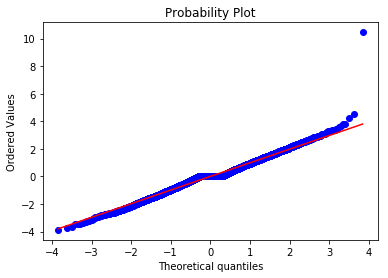

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0798
Kurtosis: 1.6214
Overview of variable:  xpdat10 


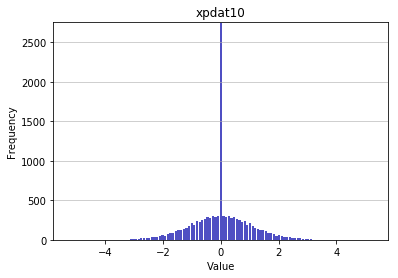

-------------------- 
Summary statistics:
 --------------------
Minimum value: -5.280074640278409
Mean: 0.0
Standard deviation: 1.0
Median: 0.0
Maximal value: 5.280074640278409


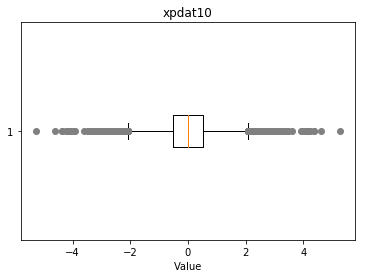

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.37, 3.07, 3.06, 3.23, 3.45, 3.16, 3.14, 3.12, 3.32, 4.21, 4.62, 5.28, -3.05, 3.91, -3.06, -3.23, -3.14, -3.32, 3.0, 3.01, 3.33, -3.47, 4.07, 4.24, -3.18, -4.62, -4.38, -4.13, -4.36, 3.02, -3.45, -3.12, -3.37, -3.62, 3.43, 3.36, 3.11, -3.29, -3.95, -3.46, 3.05, 3.62, -3.02, -3.43, -3.36, -3.11, 4.38, 3.29, 3.95, 4.13, 3.46, 4.36, 3.18, -4.07, -4.24, 3.47, -3.16, -3.91, -3.0, -3.01, -3.33, -3.08, 3.08, -5.28, -4.21, -3.07}


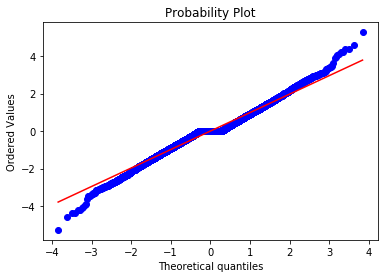

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 1.2377
Overview of variable:  csat10 


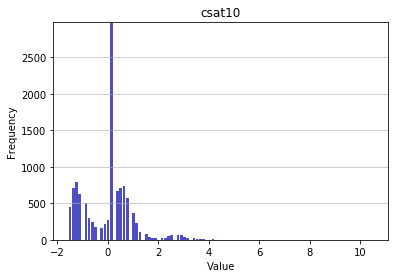

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.5611765234867414
Mean: -0.0
Standard deviation: 1.0
Median: 0.1875
Maximal value: 10.520786629013617


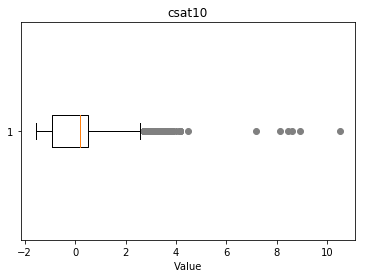

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.37, 3.53, 3.05, 3.68, 3.84, 8.45, 8.14, 3.21, 4.48, 4.16, 4.0, 8.61, 10.52, 8.93, 7.18}


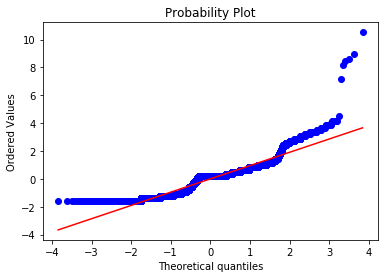

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.8535
Kurtosis: 3.8503
Overview of variable:  csdat10 


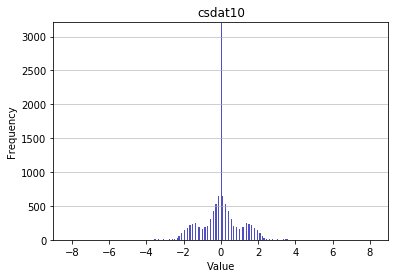

-------------------- 
Summary statistics:
 --------------------
Minimum value: -8.17103851157956
Mean: 0.0
Standard deviation: 1.0
Median: 0.0
Maximal value: 8.17103851157956


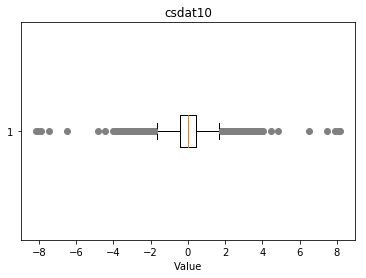

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.46, 3.32, 3.19, 3.05, 4.43, 7.89, 3.6, 3.88, 4.85, 8.03, 8.17, 7.48, 6.51, 3.74, -3.32, 4.02, -3.05, -3.88, -3.46, -3.6, -8.17, -7.48, -4.43, -4.02, -3.74, -8.03, -7.89, -6.51, -4.85, -3.19}


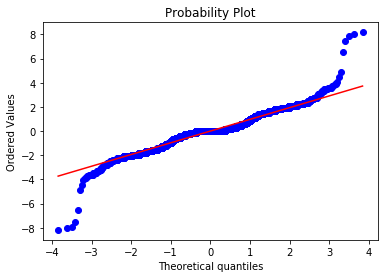

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 3.6065
Overview of variable:  csat15 


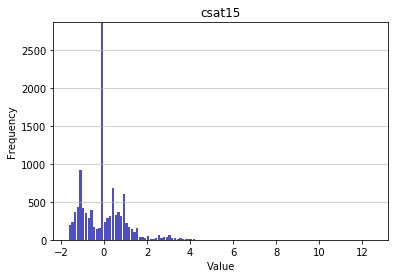

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.6501892357349217
Mean: -0.0
Standard deviation: 1.0
Median: -0.0325
Maximal value: 12.50430243515707


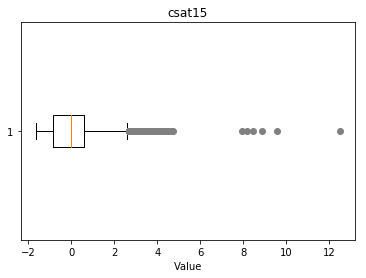

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.1, 3.0, 4.31, 3.51, 3.71, 8.86, 8.46, 3.3, 3.4, 4.01, 4.11, 9.57, 12.5, 3.91, 8.16, 4.42, 4.52, 3.61, 3.2, 4.72, 4.62, 4.21, 7.95, 3.81}


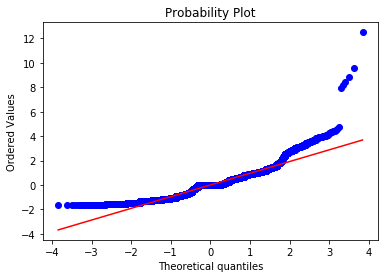

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.2817
Kurtosis: 5.8364
Overview of variable:  csdat15 


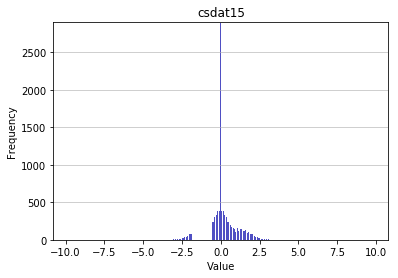

-------------------- 
Summary statistics:
 --------------------
Minimum value: -9.80898765040871
Mean: 0.0
Standard deviation: 1.0
Median: 0.0
Maximal value: 9.80898765040871


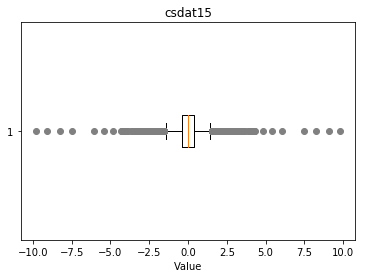

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.06, 3.24, 3.6, 3.87, 3.96, 5.4, 8.28, 4.23, 3.69, 3.33, 4.86, 9.09, 9.81, 3.51, -3.06, -3.15, 4.32, -4.05, -4.14, -3.87, -3.96, -3.69, -9.81, 4.05, 4.14, 6.03, 7.47, -4.23, -4.32, 3.15, -3.24, -3.33, -3.51, -9.09, -8.28, -7.47, -6.03, -5.4, -4.86, -3.6}


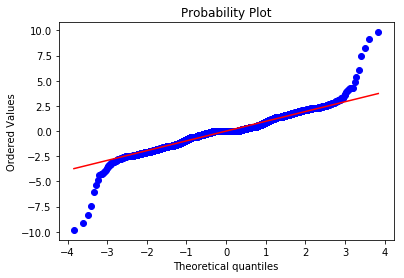

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 5.0924
Overview of variable:  datediff 


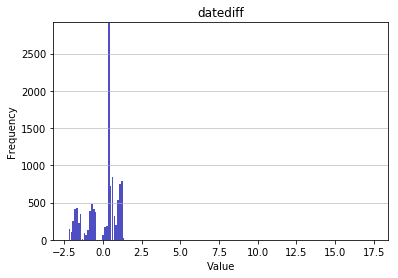

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2.2345347612547224
Mean: -0.0
Standard deviation: 1.0
Median: 0.3683
Maximal value: 17.46586950838512


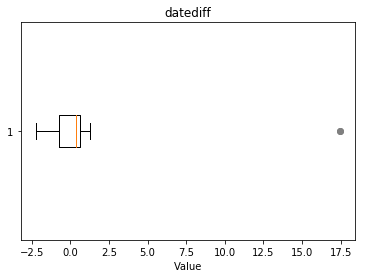

-------------------- 
Outlier detection:
 --------------------
List of outliers: {17.47}


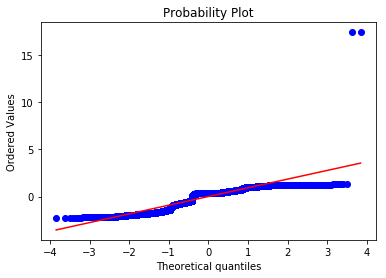

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.2415
Kurtosis: 15.4119
Overview of variable:  Encoded_league 


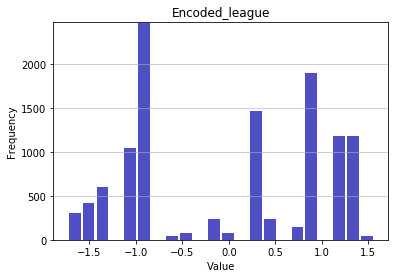

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.7355046022926084
Mean: 0.0
Standard deviation: 1.0
Median: 0.2447
Maximal value: 1.56483088236529


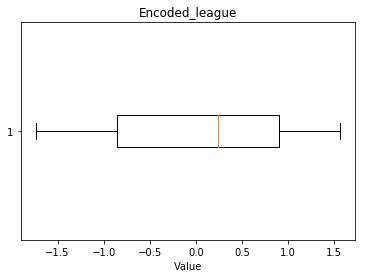

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


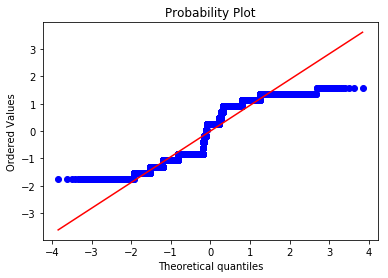

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.0861
Kurtosis: -1.5403
Overview of variable:  Encoded_game 


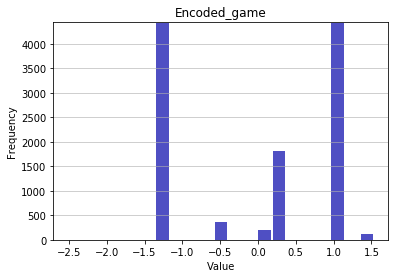

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2.5172505662022955
Mean: 0.0
Standard deviation: 1.0
Median: 0.3534
Maximal value: 1.5354813554988622


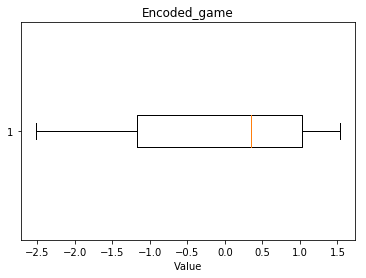

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


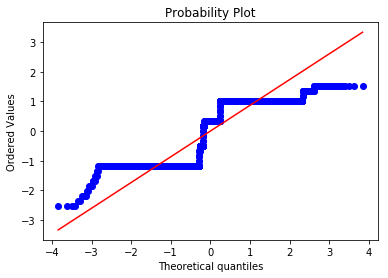

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.1786
Kurtosis: -1.7559
Overview of variable:  Encoded_side 


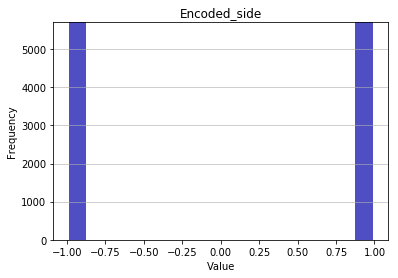

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.0
Mean: 0.0
Standard deviation: 1.0
Median: 0.0
Maximal value: 1.0


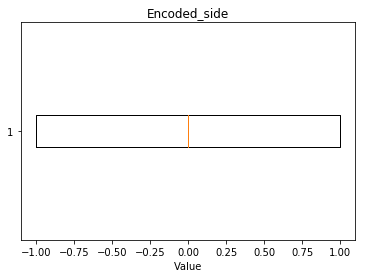

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


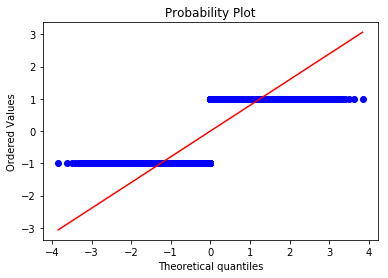

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: -2.0
Overview of variable:  Encoded_champion 


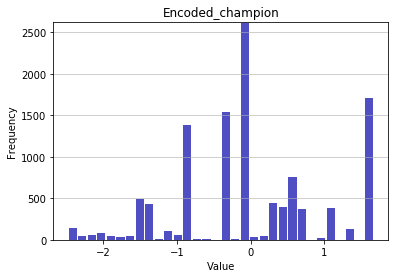

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2.4763860307115473
Mean: 0.0
Standard deviation: 1.0
Median: -0.0199
Maximal value: 1.6689477771725598


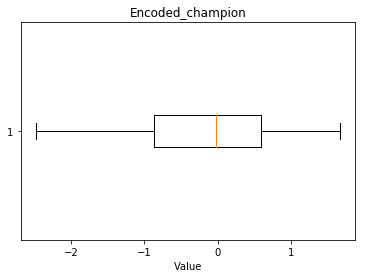

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


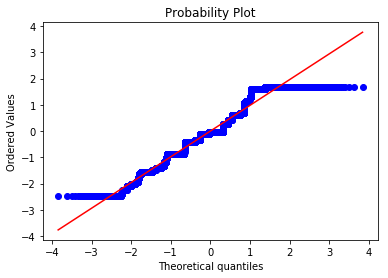

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.016
Kurtosis: -0.4361
Overview of variable:  Encoded_Year 


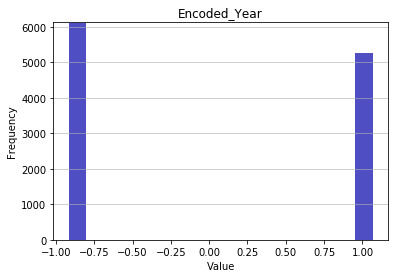

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.9275061786239414
Mean: -0.0
Standard deviation: 1.0
Median: -0.9275
Maximal value: 1.0781599336338257


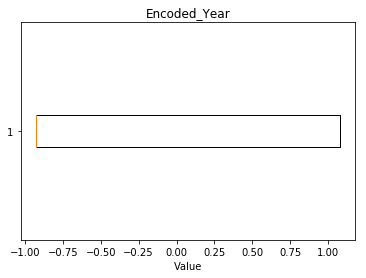

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


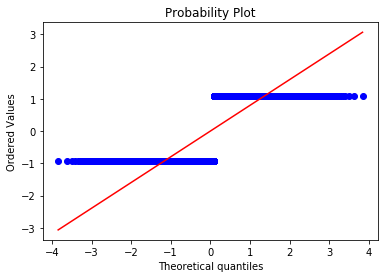

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.1507
Kurtosis: -1.9773
Overview of variable:  Encoded_team 


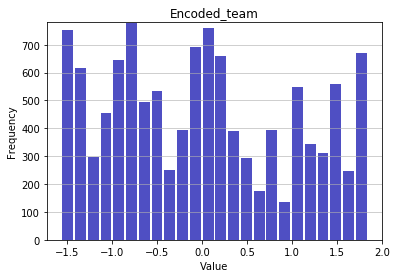

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.5592112579628667
Mean: 0.0
Standard deviation: 1.0
Median: -0.0439
Maximal value: 1.8370854984852323


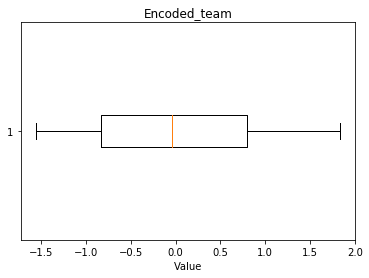

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


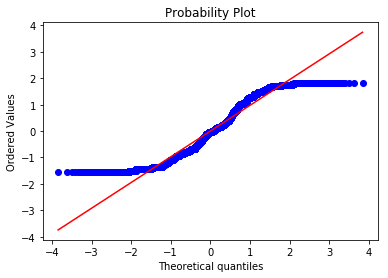

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.2332
Kurtosis: -1.112
Overview of variable:  Encoded_culture 


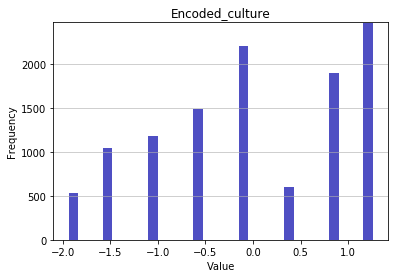

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.9476573066116196
Mean: 0.0
Standard deviation: 1.0
Median: -0.1081
Maximal value: 1.2716149710192728


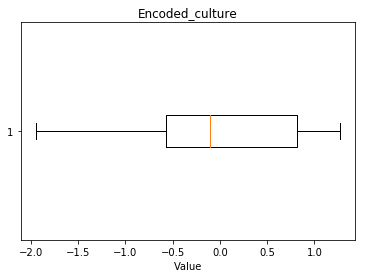

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


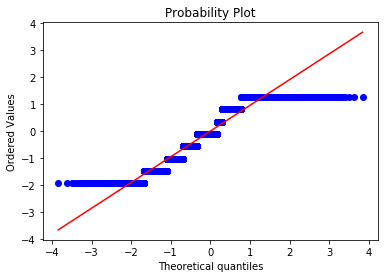

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.2495
Kurtosis: -1.1077


<Figure size 432x288 with 0 Axes>

In [29]:
# Loop through all numerical variables and visualize data
for col in transformed_data_df.columns:
    if str(transformed_data_df[col].dtypes) != 'object':
        SummaryNumericVar(transformed_data_df[col], col)

### 2.3 Conclusion univariate analysis

In [30]:
# Short intermediate summary
print("The transformed dataset captures information from", len(transformed_data_df.columns), "features.")
print("In total, there are", len(transformed_data_df), "observations present in the dataframe, capturing the information from",
      int(len(transformed_data_df)/2), "games.")
print("\nThe following features are captured by the dataset:\n\n", list(transformed_data_df.columns))

The transformed dataset captures information from 58 features.
In total, there are 11396 observations present in the dataframe, capturing the information from 5698 games.

The following features are captured by the dataset:

 ['split', 'patchno', 'result', 'k', 'd', 'a', 'doubles', 'fb', 'fbassist', 'fbvictim', 'kpm', 'fd', 'elementals', 'firedrakes', 'waterdrakes', 'earthdrakes', 'airdrakes', 'elders', 'herald', 'dmgtochamps', 'dmgtochampsperminute', 'dmgshare', 'earnedgoldshare', 'wards', 'wpm', 'wardshare', 'wardkills', 'wcpm', 'visionwards', 'visionwardbuys', 'totalgold', 'earnedgpm', 'goldspent', 'gspd', 'minionkills', 'monsterkills', 'monsterkillsownjungle', 'monsterkillsenemyjungle', 'cspm', 'goldat10', 'gdat10', 'goldat15', 'gdat15', 'xpat10', 'xpdat10', 'csat10', 'csdat10', 'csat15', 'csdat15', 'datediff', 'Encoded_league', 'Encoded_game', 'Encoded_side', 'Encoded_champion', 'Encoded_Year', 'Encoded_team', 'Encoded_culture', 'player']


---------------------------------------------------------------------------------------------------- 
Overview of variable:  result 
 ----------------------------------------------------------------------------------------------------
Total categories: 2 



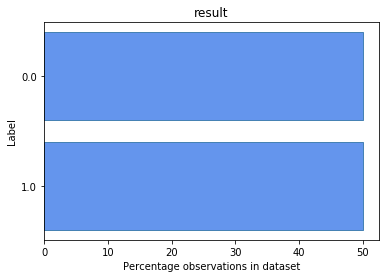

<Figure size 432x288 with 0 Axes>

In [31]:
# Adjust 'Result' to appropriate format
for pos, trans_df in trans_data_dict.items():
    # Refactoring encoding of target feature
    trans_df['result'] = [x if x > 0 else 0 for x in trans_df['result']]
    trans_data_dict[pos] = trans_df
    
# Visualization properties target
SummaryCategoricalVar(transformed_data_df['result'], 'result')

In [32]:
# Save the transformed data
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + saved_filename + '_top.pickle', 'wb') as f:
    pickle.dump(trans_data_dict['Top'], f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + saved_filename + '_mid.pickle', 'wb') as f:
    pickle.dump(trans_data_dict['Middle'], f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + saved_filename + '_jun.pickle', 'wb') as f:
    pickle.dump(trans_data_dict['Jungle'], f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + saved_filename + '_adc.pickle', 'wb') as f:
    pickle.dump(trans_data_dict['ADC'], f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + saved_filename + '_sup.pickle', 'wb') as f:
    pickle.dump(trans_data_dict['Support'], f)

In [33]:
# Save the file containing the column name and matching box-cox
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + saved_filename + '_top_optimizers.pickle', 'wb') as f:
    pickle.dump(optimiser_data_dict['Top'], f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + saved_filename + '_mid_optimizers.pickle', 'wb') as f:
    pickle.dump(optimiser_data_dict['Middle'], f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + saved_filename + '_jun_optimizers.pickle', 'wb') as f:
    pickle.dump(optimiser_data_dict['Jungle'], f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + saved_filename + '_adc_optimizers.pickle', 'wb') as f:
    pickle.dump(optimiser_data_dict['ADC'], f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + saved_filename + '_sup_optimizers.pickle', 'wb') as f:
    pickle.dump(optimiser_data_dict['Support'], f)

## 3. Multivariate analysis
* Correlation plot (remove variables that are highly correlated)
* Boxplot/ scatterpot/ wrapped plot to visualize important relationships between variables
* t-test to assess difference between categories

### 3.1 Collinearity exploration

##### Investigate correlation between features

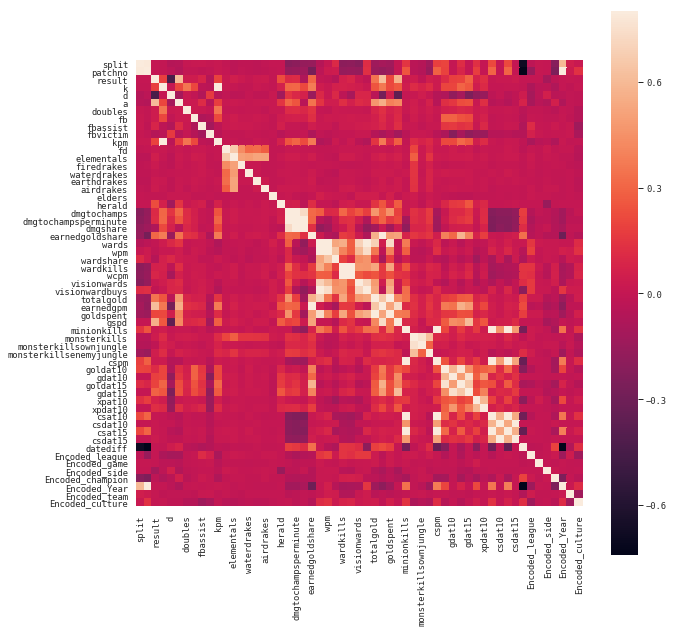

In [34]:
# Create corrplot
sns.set(context = "paper", font = "monospace")
corrmat = transformed_data_df.corr()
f, ax = plt.subplots(figsize = (10, 10))
sns.heatmap(corrmat, vmax = .8, square = True) 
plt.show()

In [35]:
# Print list with highest correlated features
corrmap_abs = transformed_data_df.corr().abs()
corrmap_abs_sorted = corrmap_abs.unstack().sort_values(kind = "quicksort", ascending = False)
corrmap_abs_sorted.iloc[(len(transformed_data_df.columns) + 3):(len(transformed_data_df.columns) + 1) + 20,]

csat15                csat10                  0.956932
csat10                csat15                  0.956932
csdat15               csdat10                 0.948652
csdat10               csdat15                 0.948652
cspm                  minionkills             0.943022
minionkills           cspm                    0.943022
dmgtochampsperminute  dmgtochamps             0.933397
dmgtochamps           dmgtochampsperminute    0.933397
patchno               Encoded_Year            0.909308
Encoded_Year          patchno                 0.909308
wardkills             wcpm                    0.901822
wcpm                  wardkills               0.901822
csat15                cspm                    0.894579
cspm                  csat15                  0.894579
dmgtochampsperminute  dmgshare                0.860681
dmgshare              dmgtochampsperminute    0.860681
wpm                   wards                   0.857583
wards                 wpm                     0.857583
dtype: flo

In [36]:
# Short intermediate summary
print("The percentage of correlations (autocorrelations excluded) higher than 0.5 in absolute value: ",
      str(sum([x for x in list(corrmap_abs_sorted) if x >= 0.5])/len(corrmap_abs_sorted)*100))

The percentage of correlations (autocorrelations excluded) higher than 0.5 in absolute value:  4.452996814985206


##### Calculate variance inflation factor
This is purely out of interest, although we expect penelized regression methods to be able to cope with collinearity between the features.

In [37]:
# Extract dataset containing only the numeric features
transformed_data_numeric_df = transformed_data_df.copy()
transformed_data_numeric_df = transformed_data_numeric_df.drop(labels = ['player'], axis=1)

In [38]:
# Calculate the variance inflation factor for the different features
X = add_constant(transformed_data_numeric_df)
vif_columns = pd.Series([variance_inflation_factor(X.values, i) for i in range(X.shape[1])], index = X.columns)

In [39]:
# Print the top 20 features with the highest VIF
vif_columns_sorted = vif_columns.sort_values(kind = "quicksort", ascending = False)
vif_columns_sorted[:20]

airdrakes                       inf
elementals                      inf
earthdrakes                     inf
waterdrakes                     inf
firedrakes                      inf
dmgtochamps             2006.157459
dmgtochampsperminute    1726.763480
totalgold                771.006854
wards                    393.234443
minionkills              324.139284
cspm                     279.759195
earnedgpm                248.062894
wpm                      131.619247
csat15                    31.663622
goldspent                 27.987135
csat10                    27.247151
wardkills                 27.226207
kpm                       23.287096
k                         23.129569
csdat15                   19.946881
dtype: float64